<a href="https://colab.research.google.com/github/lonnie-nguyen/pratt_data_analysis/blob/main/pratt_seq_logo_unaligned_seq.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Getting Started
Connect to a runtime and upload the data file to be analyzed. Files can be uploaded either by clicking on the far left 'Files' icon and clicking on the 'Upload to session storage' icon or running the code in the next cell. To analyze the data file, run each code cell sequentially or run all cells by navigating to Runtime -> Run all. All uploaded files are only available for the current session and will not be saved for future use.

> **NOTE:**
> 
> In the section **Main Python Script**, change the file name (line 4) to the file name that is uploaded.
>
> Example: Uploaded file name is SOLA1A.txt.15.pat
>
> ```python
with open('SOL1A.txt.15.pat', 'r') as f:
```

This notebook uses the Python package Logomaker to generate sequence logos. The package is also used to calculate the Position Probability Matrices (PPM), Position Weight Matrices (PWM), and Information Content Matrices (IC).

## Links for Logomaker
* Github: https://github.com/jbkinney/logomaker
* Documentation: https://logomaker.readthedocs.io/en/latest/
* Article: https://academic.oup.com/bioinformatics/article/36/7/2272/5671693




In [1]:
from google.colab import files
file_dict = files.upload()

Saving SOL1A.txt.15.pat to SOL1A.txt.15.pat


In [2]:
!pip install logomaker

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [2]:
import string
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import logomaker as lm
import scipy.stats as st

# ---------------------------------------------
# Global data structures
# ---------------------------------------------
obs_freq = []
flank1_seq_list = []
pf2_seq_list = []
x_axis = []

# Function Definitions

## Align Sequences

For each pattern block, all sequences must be the same length and aligned to get the correct amino acid frequencies per position. The function `pad_sequence()` left pads the strings in `flank1_seq_list` and right pads the strings in `pf2_seq_list` with `*`. After padding, the sequences are aligned and concatenated then added to the list `combined_sequences` using Python list comprehension.

The images below are used as illustrative examples:

From 
<img src='https://drive.google.com/uc?export=view&id=1UqvQImaZr_LlTwCzD6Zt4VWkQNBJ3btS' width=150px> 
To 
<img src='https://drive.google.com/uc?export=view&id=12FIIB-VdaG0R2t8hcWXGjC1vAbF6NiOB' width=150px>

**Note**: the function `pad_sequence()` also creates the following list
* `x_axis`: list of negative and positive positions to be used for the x-axis of the sequence logo

In [3]:
def pad_sequence(seq_list: list, direction: string) -> list:
  padded = []
  max_len_seq = max(seq_list, key = len)
  max_len = len(max_len_seq)
  if direction == 'left':
    x_axis.extend([i - len(max_len_seq) for i in range(len(max_len_seq))]) # Numbers for x axis of graph
  else:
    x_axis.extend([i for i in range(len(max_len_seq))])
  for seq in seq_list:
    if len(seq) < max_len:
      if direction == 'left':
        seq = seq.rjust(len(seq) + (max_len - len(seq)), '*')
      else:
        seq = seq.ljust(len(seq) + (max_len - len(seq)), '*')
    seq = seq.upper()
    padded.append(seq)
    
  return padded

## Create Matrices

Before sequence logos for sequence alignments found by Pratt can be generated, different matrices need to be calculated for each block of sequence alignments:

* Postion Frequency Matirx (PFM)
* Position Probability Matrix (PPM)
* Position Weight Matrix (PWM)
* Information Content Matrix (ICM)

### PFM

The function `frequency_matrix()` creates a Pandas DataFrame (matrix) with dimensions $m * n$ where $m = \text{length of the sequence}$ and $n = 20$ (for $20$ amino acids). The DataFrame is initialized with values of $0$. Then frequencies are added up for each amino acid at each position and multiplied by a corresponding value from the list `obs_freq`.

> **NOTE:**
>
> The character `*` is not counted in the function `frequency_matrix()`.

In [4]:
def frequency_matrix(combined_sequences: list):
  char_array = np.array([np.array(list(seq)) for seq in combined_sequences])
  columns = [c for c in 'ACDEFGHIKLMNPQRSTVWY']
  index = list(range(len(combined_sequences[0])))
  counts_df = pd.DataFrame(data=0, columns=columns, index=index)
  counts = np.array(obs_freq)
  # Calculate frequencies of each amino acid at each position
  for aa in columns:
    temp_matrix = (char_array == aa).astype(float) * counts[:, np.newaxis]
    counts_df.loc[:, aa] = temp_matrix.sum(axis=0).T
  return counts_df

### PPM

The function `probability_matrix()` creates a DataFrame (matrix) using the probabilities of each amino acid at each position from the PFM. By default, Logomaker sets $pseudocount = 1$ to correct for values where the $frequency = 0$. 

Logomaker uses the following formula (found in file **matrix.py** under the function `transform_matrix()`) to calculate the PPM:

\begin{align}
        PPM_{ic} = \frac{PFM_{ic} + α}{PFM_{i} + 20 * α} \\[1em]
    \end{align}

* Where pseudocount variable $α ≥ 0$.
* Notation:
  * $i = \text{position}$
  * $c = \text{character}$

In [5]:
def probability_matrix(counts_df, pseudocount = 1):
  # Use logomaker for PPM w/ pseudocount = 1 if no value is given
  prob_df = lm.transform_matrix(counts_df, 
                              from_type='counts', 
                              to_type='probability',
                              pseudocount=pseudocount)
  return prob_df

### PWM

The function `weight_matrix()` creates a DataFrame (matrix) using the values from the PPM with $pseudocount = 1$. The values of a PWM are used to score how well a sequence matches a motif by adding up the values for the amino acids at specific positions. 

By default, Logomaker assumes a uniform distribution background probability of $1/20 = 0.05$ for each amino acid. The background can also be user submitted as a list. This notebook uses the following non-uniform background probabilities from Amino Acid Freq in unselected library:

Amino Acid | Frequency | Amino Acid | Frequency
:--- | :---: | :---: | ---:
A | 0.06384185843169986 | M | 0.029787170621199476 
C | 0.010099956281546838 | N | 0.05246413099638329 
D | 0.04909383569810421 | P | 0.0795020070744406 
E | 0.02797981002344899 | Q | 0.031751520209848574 
F | 0.03694308652279321 | R | 0.0499791343746274 
G | 0.06389253209331902 | S | 0.10975318945987839 
H | 0.04279738484161997 | T | 0.0749006398791781 
I | 0.037401136679782204 | V | 0.05928917769564008 
K | 0.027565478319621636 | W | 0.026045268471046462
L | 0.08509002026946465 | Y | 0.04182266205635706

Logomaker uses the following formula to calculate the PWM:

\begin{align}
        PWM_{ic} = \log_2\left(\frac{PPM_{ic}}{background_{ic}}\right) \\[1em]
    \end{align}

* Notation:
  * $i = \text{position}$
  * $c = \text{character}$

In [6]:
background = [0.06384185843169986, 0.010099956281546838, 0.04909383569810421, 0.02797981002344899, 
       0.03694308652279321, 0.06389253209331902, 0.04279738484161997, 0.037401136679782204, 
       0.027565478319621636, 0.08509002026946465, 0.029787170621199476, 0.05246413099638329, 
       0.0795020070744406, 0.031751520209848574, 0.0499791343746274, 0.10975318945987839, 
       0.0749006398791781, 0.05928917769564008, 0.026045268471046462, 0.04182266205635706]
              
def weight_matrix(prob_df): 
  # Use logomaker to get PWM w/ a non-uniform background
  weight_df = lm.transform_matrix(prob_df, 
                              from_type='probability', 
                              to_type='weight',
                              background=background)
  return weight_df

### ICM

The function `info_content_matrix()` creates a DataFrame (matrix) using the values from the PPM with $pseudocount = 0$. The information (values) for each amino acid at a specific position indicate the level of conservation or relative entropy at a position.

Logomaker uses the following formula to calculate the ICM:

\begin{align}
        ICM_{ic} = PPM_{ic} * \sum_i{PPM_{id}} * \log_2\left(\frac{PPM_{id}}{PWM_{id}}\right) \\[1em]
    \end{align}

* Notation:
  * $i = \text{position}$
  * $c, d = \text{character}$

In [7]:
def info_content_matrix(prob_df):
  # Use logomaker to get Information Content
  info_df = lm.transform_matrix(prob_df,
                                from_type='probability',
                                to_type='information',
                                background=background)
  return info_df

## Matrix Transformations

Use this function to center values of PWM with `transform_type = 'center'` or normalize values of PPM with `transform_type = 'normalize'` before graphing.

In [8]:
def transform_matrix(df, transform_type):
  if transform_type == 'center':
    return lm.transform_matrix(df, center_values=True)
  else:
    return lm.transform_matrix(df, normalize_values=True)

## Display Matrix

In [9]:
def display_matrix(df, title):
  # Label DataFrame table
  df.index.names = ['Position']
  df.columns.names = ['Amino Acid']
  pd.set_option('display.max_columns', None)
  print(title)
  display(df)

## Display Sequence Logo

In [10]:
def display_sequence_logo(df, graph_type, pattern):
  logo = lm.Logo(df,
                color_scheme='skylign_protein',
                center_values=False,
                shade_below=0.5,
                fade_below=0.5,
                figsize=(15, 8))
  logo.ax.set_xticks(range(len(df)))
  logo.ax.set_xticklabels('%d'%x for x in x_axis)
  if graph_type == 'PPM':
    y = 'probability'
  elif graph_type == 'PWM':
    y = '$\log_2$ enrichment'
  elif graph_type == 'ICM':
    y = 'bits'
  else:
    y = ''
  logo.ax.set_ylabel('{}'.format(y), fontsize=14)
  logo.ax.set_xlabel('position', fontsize=14)
  logo.ax.set_title('{} Sequence Logo for Pattern {}'.format(graph_type, pattern), fontsize=14)
  plt.show()

## Statistical Significance

### 1-Way $\chi^2$ test

The function `chi_square_test()` first finds the $\chi^2$ Critical Value. If the $\chi^2 \text{ Test Statistic} ≥ \chi^2 \text{ Critical Value}$, than the test results have statistical significance.  The $χ^2$ Critical Value is found using the below function from scipy package:

```python
scipy.stats.chi2.ppf(1-alpha, df)
```
which uses the corrected $\alpha$ value:

\begin{align}
        α = 1 - [(1 - α_{0})^\frac{1}{N}] ≈ \frac{α_{0}}{N} \\[1em]
    \end{align}
* Significance Level $\alpha_{0} = 0.05$
* $N = \text{length of sequence}$

This function performs $\chi^2$ test on each row (position) of the PFM matrix. A table is created for the $\chi^2$ test statistic and p-value for each position. The $\chi^2$ and p-value are found using the below function from scipy:

```python
scipy.stats.chisquare(obs_freq, exp_freq)
```

The formula for $\chi^2$ is:

\begin{align}
        χ^2 = \sum \frac{(\text{Observed - Expected})^2}{\text{Expected}}\\[1em]
    \end{align}

The p-values are sorted in ascending order to a list and critical p-values for each $i$th rank are calculated und using Benjamini-Hochberg (BH) and Benjamini-Yekutieli(Y) procedures. 

\begin{align}
        P_{BH_{i}} = \frac{α * i}{\text{N}} \\[1em]
    \end{align}
* $\alpha = 0.05$
* $i = \text{rank of the p-value}$ 
* $N = \text{length of sequence}$
\begin{align}
        P_{BY_{i}} = \frac{P_{BH_{i}}}{\sum_{i=1}^N \frac{1}{i}} \\[1em]
    \end{align}

The table with sorted p-values and corresponding most and least likely to occur amino acids is displayed.

In [11]:
def chi_square_test(counts_df):
  exp = background
  test_data = []

  # X^2 Critical Value
  alpha_0 = 0.05
  df = 20 - 1
  N = len(combined_sequences[0])
  # alpha = 1 - (1 - alpha_0)**(1/N)
  alpha = alpha_0 / N
  print('X^2 Critical Value = {}'.format(st.chi2.ppf(1-alpha, df)))

  for i in range(len(counts_df)):
    exp_freq = [num * sum(counts_df.values[i]) for num in exp]
    obs_freq = counts_df.values[i]
    chi, p = st.chisquare(obs_freq, exp_freq)
    test_data.append([chi, p])
  
  # test_df = pd.DataFrame(test_data, columns=['X^2', 'p-value'])
  # test_df.insert(0, 'Position', x_axis, True)

  max_val_idx = weight.idxmax(axis=1)
  max_val = weight.max(axis=1)
  min_val_idx = weight.idxmin(axis=1)
  min_val = weight.min(axis=1)
  test_df = pd.DataFrame(np.column_stack([x_axis, test_data, max_val_idx.tolist(), max_val.tolist(), min_val_idx.tolist(), min_val.tolist()]),
                         columns=['Position', 'X^2', 'p-value', 'AAmax', 'PWMSmax', 'AAmin', 'PWMSmin'])

  # Find Critical p-values using BH and BY procedure
  arr = test_df['p-value'].tolist()
  arr.sort()
  bh_list = [(alpha_0 * (i + 1)) / N for i in range(len(arr))]

  summation = sum([(1 / (i + 1)) for i in range(N)])
  by_list = [bh / summation for bh in bh_list]  

  # Sort p-values & display DataFrame
  copy_df = test_df.copy()
  # sorted = (copy_df.sort_values(by=['p-value'])
  #                   .reset_index(drop=False))
  copy_df['p-value'] = copy_df['p-value'].astype('float')
  sorted = (copy_df.sort_values(by='p-value')
                      .reset_index(drop=False))
  # Add critical p-values columns
  # sorted['Critical pBH'] = bh_list
  # sorted['Critical pBY'] = by_list
  sorted.insert(4, 'Critical pBH', bh_list, True)
  sorted.insert(5, 'Critical pBY', by_list, True)
  print('Chi Square Tests')
  display(sorted)

# Main Python Script
The following script takes an uploaded Pratt sequence data file as input and parses the file line by line. Each line is broken up into an array of tokens which are processed according to the length of the array. The script identifies pattern sequence blocks in the Pratt file and outputs the matrices for **probability**, **weight**, and **information content** or **relative entropy** using the function `display_matrix()`. Sequence logos are also generated for **weight** and **information content** using the function `display_sequence_logo()`.

> **NOTE:**
> 
> Change the file name (line 4) to the file name that is uploaded.
>
> Example: Uploaded file name is SOLA1A.txt.15.pat
>
> ```python
with open('SOL1A.txt.15.pat', 'r') as f:
```

----------------------------------------------------------------------
A Pattern: S-S-E-F-R-[AGLV]
Position Probability Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.000000,0.0,0.115385,0.000000,0.000000,0.000000,0.769231,0.000000,0.00000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.115385,0.000000,0.000000,0.0
1,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.096774,0.096774,0.00000,0.451613,0.0,0.000000,0.000000,0.064516,0.000000,0.000000,0.290323,0.000000,0.000000,0.0
2,0.048387,0.0,0.000000,0.048387,0.000000,0.677419,0.000000,0.000000,0.00000,0.000000,0.0,0.000000,0.000000,0.048387,0.000000,0.048387,0.000000,0.032258,0.096774,0.0
3,0.274194,0.0,0.048387,0.000000,0.048387,0.000000,0.000000,0.048387,0.00000,0.451613,0.0,0.000000,0.000000,0.000000,0.048387,0.048387,0.000000,0.000000,0.032258,0.0
4,0.000000,0.0,0.041667,0.000000,0.041667,0.027778,0.000000,0.041667,0.00000,0.083333,0.0,0.138889,0.000000,0.000000,0.000000,0.583333,0.041667,0.000000,0.000000,0.0
5,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.0
6,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.0
7,0.000000,0.0,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0
8,0.000000,0.0,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0


Position Weight Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,-1.554208,1.105945,0.824752,-0.364092,-0.765010,-1.555353,3.415089,-0.782788,-0.342568,-1.968696,-0.454397,-1.271037,-1.870697,-0.546531,-1.201032,-2.335897,0.215316,-1.447475,-0.260727,-0.943991
1,-1.703072,0.957082,-1.324111,-0.512955,-0.913874,-1.704216,0.873908,1.068349,-0.491432,1.789332,-0.603260,-1.419901,-2.019560,0.889568,-1.349895,-2.484760,1.388381,-1.596338,-0.409590,-1.092854
2,-0.388198,0.271955,-2.009238,0.801918,-1.599000,3.036922,-1.811218,-1.616778,-1.176558,-2.802686,-1.288387,-2.105027,-2.704687,0.619479,-2.035022,-1.169887,-2.618674,-0.696502,1.712638,-1.777981
3,1.781727,0.271955,-0.009238,-1.198082,0.401000,-2.389343,-1.811218,0.383222,-1.176558,2.055295,-1.288387,-2.105027,-2.704687,-1.380521,-0.035022,-1.169887,-2.618674,-2.281465,0.490245,-1.777981
4,-2.554208,0.105945,-0.175248,-1.364092,0.234990,-0.970391,-1.977228,0.217212,-1.342568,-0.161341,-1.454397,1.188394,-2.870697,-1.546531,-2.201032,2.090368,-0.784684,-2.447475,-1.260727,-1.943991
5,-2.703072,-0.042918,-2.324111,-1.512955,-1.913874,-2.704216,-2.126092,-1.931651,-1.491432,-3.117559,-1.603260,-2.419901,-3.019560,-1.695395,-2.349895,2.890279,-2.933547,-2.596338,-1.409590,-2.092854
6,-2.703072,-0.042918,-2.324111,-1.512955,-1.913874,-2.704216,-2.126092,-1.931651,-1.491432,-3.117559,-1.603260,-2.419901,-3.019560,-1.695395,-2.349895,2.890279,-2.933547,-2.596338,-1.409590,-2.092854
7,-2.703072,-0.042918,-2.324111,4.862084,-1.913874,-2.704216,-2.126092,-1.931651,-1.491432,-3.117559,-1.603260,-2.419901,-3.019560,-1.695395,-2.349895,-3.484760,-2.933547,-2.596338,-1.409590,-2.092854
8,-2.703072,-0.042918,-2.324111,-1.512955,4.461166,-2.704216,-2.126092,-1.931651,-1.491432,-3.117559,-1.603260,-2.419901,-3.019560,-1.695395,-2.349895,-3.484760,-2.933547,-2.596338,-1.409590,-2.092854


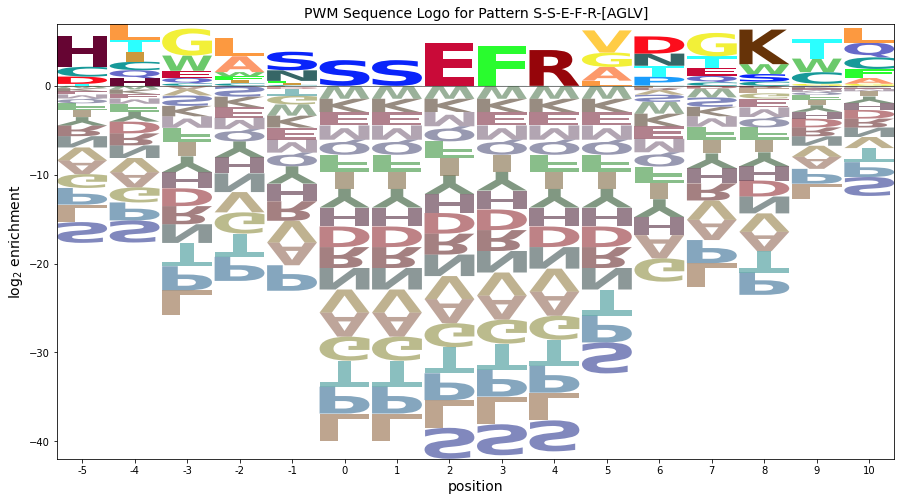

Information Content Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.000000,0.0,0.394638,0.000000,0.000000,0.000000,2.630922,0.000000,0.00000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.394638,0.000000,0.000000,0.0
1,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.190412,0.190412,0.00000,0.888591,0.0,0.000000,0.000000,0.126942,0.000000,0.000000,0.571237,0.000000,0.000000,0.0
2,0.118721,0.0,0.000000,0.118721,0.000000,1.662092,0.000000,0.000000,0.00000,0.000000,0.0,0.000000,0.000000,0.118721,0.000000,0.118721,0.000000,0.079147,0.237442,0.0
3,0.452515,0.0,0.079856,0.000000,0.079856,0.000000,0.000000,0.079856,0.00000,0.745318,0.0,0.000000,0.000000,0.000000,0.079856,0.079856,0.000000,0.000000,0.053237,0.0
4,0.000000,0.0,0.063903,0.000000,0.063903,0.042602,0.000000,0.063903,0.00000,0.127805,0.0,0.213009,0.000000,0.000000,0.000000,0.894636,0.063903,0.000000,0.000000,0.0
5,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,3.187665,0.000000,0.000000,0.000000,0.0
6,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,3.187665,0.000000,0.000000,0.000000,0.0
7,0.000000,0.0,0.000000,5.159470,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0
8,0.000000,0.0,0.000000,0.000000,4.758552,0.000000,0.000000,0.000000,0.00000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0


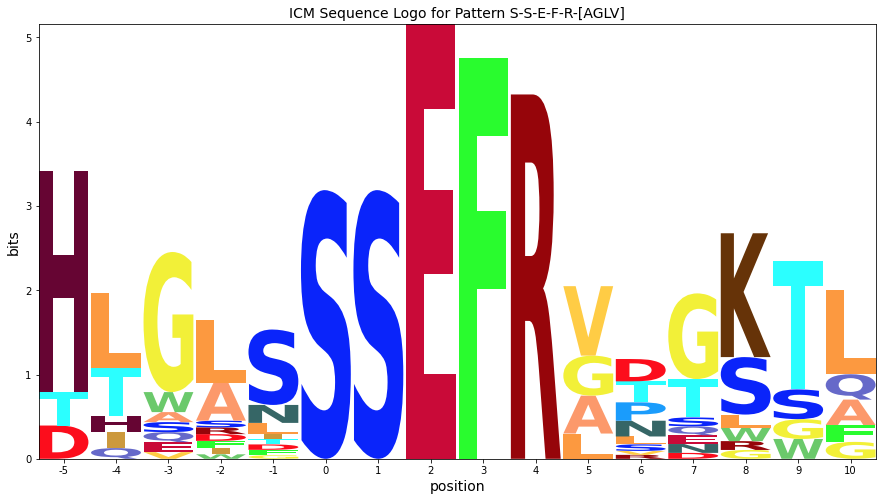

X^2 Critical Value = 40.15223303520055
Chi Square Tests


,index,Position,X^2,p-value,Critical pBH,Critical pBY,AAmax,PWMSmax,AAmin,PWMSmin
0,7,2,2848.684659090909,0.000000e+00,0.003125,0.000924,E,4.862084112185676,S,-3.4847601125950143
1,8,3,2137.6304564159113,0.000000e+00,0.006250,0.001849,F,4.461165873438733,S,-3.4847601125950143
2,9,4,1558.6846782370135,0.000000e+00,0.009375,0.002773,R,4.025144364605229,S,-3.4847601125950143
3,5,0,665.1309071156982,8.693822e-129,0.012500,0.003697,S,2.8902793187519107,L,-3.117559088431946
4,6,1,665.1309071156982,8.693822e-129,0.015625,0.004622,S,2.8902793187519107,L,-3.117559088431946
5,13,8,548.5127607972358,3.575262e-104,0.018750,0.005546,K,3.8892274299269083,P,-2.496882212262691
6,2,-3,420.04229351495667,2.947474e-77,0.021875,0.006470,G,3.0369216243601747,L,-2.802685751078535
7,0,-5,345.14796400100107,1.026950e-61,0.025000,0.007395,H,3.415089013872282,S,-2.335896726680532
8,10,5,293.4278033404802,4.436945e-51,0.028125,0.008319,V,2.491124901478307,S,-3.4847601125950143
9,12,7,236.12832606729032,1.967543e-39,0.031250,0.009244,G,2.627171956441093,L,-2.693061259904037


----------------------------------------------------------------------
B Pattern: S-A-E-F-R-[AGPST]
Position Probability Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.000000,0.0,0.150000,0.000000,0.100000,0.500000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.250000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,0.000000,0.0,0.000000,0.115385,0.000000,0.153846,0.076923,0.000000,0.000000,0.384615,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.192308,0.076923,0.000000,0.000000
2,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.095238,0.119048,0.190476,0.166667,0.000000,0.000000,0.166667,0.000000,0.166667,0.047619,0.047619,0.000000
3,0.148936,0.0,0.191489,0.000000,0.000000,0.361702,0.000000,0.042553,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.042553,0.000000,0.063830,0.000000,0.148936
4,0.000000,0.0,0.148936,0.000000,0.000000,0.085106,0.000000,0.085106,0.000000,0.000000,0.000000,0.000000,0.404255,0.000000,0.000000,0.127660,0.148936,0.000000,0.000000,0.000000
5,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000
6,1.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
7,0.000000,0.0,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,0.000000,0.0,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


Position Weight Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,-1.352575,1.307579,1.026386,-0.162458,1.021586,2.105712,-0.775595,-0.581154,-0.140935,-1.767062,-0.252763,-1.069403,0.915899,-0.344898,-0.999398,-2.134263,-1.583050,-1.245841,-0.059093,-0.742357
1,-1.554208,1.105945,-1.175248,1.635908,-0.765010,0.766575,0.607734,-0.782788,-0.342568,1.490736,-0.454397,-1.271037,-1.870697,-0.546531,-1.201032,-2.335897,0.800279,0.137488,-0.260727,-0.943991
2,-1.984843,0.675311,-1.605882,-0.794726,-1.195645,-1.985987,-1.407863,-1.213422,1.548725,0.185632,2.284894,1.298328,-2.301331,-0.977166,1.368334,-2.766531,0.784682,-0.293146,0.893601,-1.374625
3,0.903264,0.563418,1.604153,-0.906619,-1.307537,2.072045,-1.519756,0.259647,-0.885096,-2.511223,-0.996924,-1.813564,-2.413224,-1.089059,-1.743559,-1.293461,-2.327211,0.009998,-0.803254,1.513482
4,-2.096736,0.563418,1.282225,-0.906619,-1.307537,0.224048,-1.519756,0.996613,-0.885096,-2.511223,-0.996924,-1.813564,1.908704,-1.089059,-1.743559,-0.071069,0.672789,-1.990002,-0.803254,-1.486518
5,-2.352575,0.307579,-1.973614,-1.162458,-1.563376,-2.353719,-1.775595,-1.581154,-1.140935,-2.767062,-1.252763,-2.069403,-2.669063,-1.344898,-1.999398,2.796474,-2.583050,-2.245841,-1.059093,-1.742357
6,3.578163,0.307579,-1.973614,-1.162458,-1.563376,-2.353719,-1.775595,-1.581154,-1.140935,-2.767062,-1.252763,-2.069403,-2.669063,-1.344898,-1.999398,-3.134263,-2.583050,-2.245841,-1.059093,-1.742357
7,-2.352575,0.307579,-1.973614,4.768279,-1.563376,-2.353719,-1.775595,-1.581154,-1.140935,-2.767062,-1.252763,-2.069403,-2.669063,-1.344898,-1.999398,-3.134263,-2.583050,-2.245841,-1.059093,-1.742357
8,-2.352575,0.307579,-1.973614,-1.162458,4.367361,-2.353719,-1.775595,-1.581154,-1.140935,-2.767062,-1.252763,-2.069403,-2.669063,-1.344898,-1.999398,-3.134263,-2.583050,-2.245841,-1.059093,-1.742357


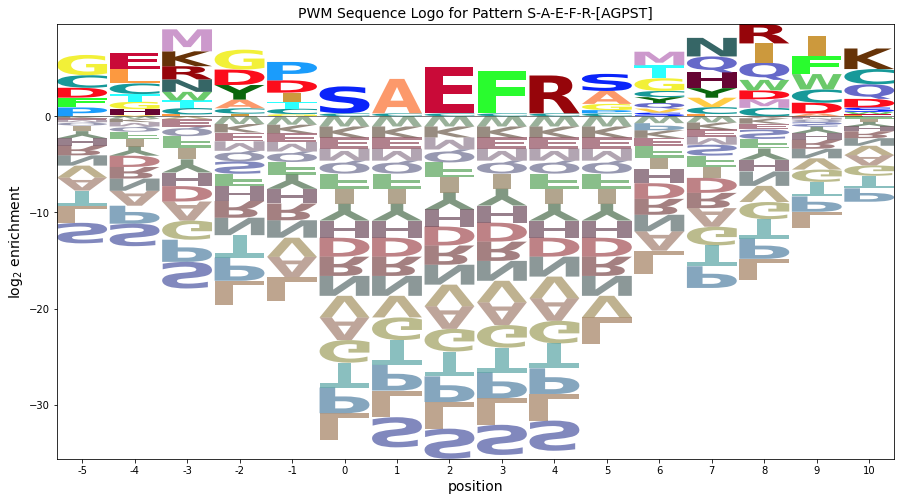

Information Content Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.000000,0.0,0.342403,0.000000,0.228269,1.141343,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.570671,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,0.000000,0.0,0.000000,0.187329,0.000000,0.249772,0.124886,0.000000,0.000000,0.624431,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.312215,0.124886,0.000000,0.000000
2,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.145156,0.181445,0.290312,0.254023,0.000000,0.000000,0.254023,0.000000,0.254023,0.072578,0.072578,0.000000
3,0.252020,0.0,0.324026,0.000000,0.000000,0.612049,0.000000,0.072006,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.072006,0.000000,0.108009,0.000000,0.252020
4,0.000000,0.0,0.223196,0.000000,0.000000,0.127541,0.000000,0.127541,0.000000,0.000000,0.000000,0.000000,0.605819,0.000000,0.000000,0.191311,0.223196,0.000000,0.000000,0.000000
5,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.187665,0.000000,0.000000,0.000000,0.000000
6,3.969354,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
7,0.000000,0.0,0.000000,5.159470,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,0.000000,0.0,0.000000,0.000000,4.758552,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


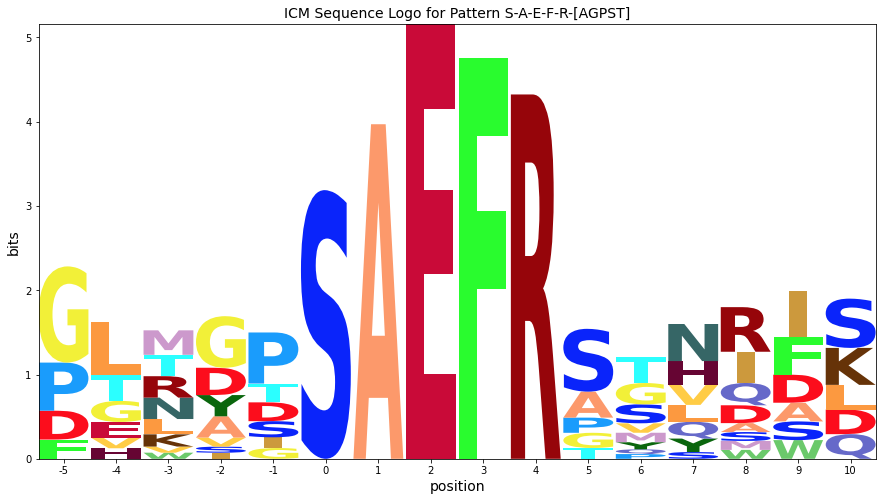

X^2 Critical Value = 40.15223303520055
Chi Square Tests


,index,Position,X^2,p-value,Critical pBH,Critical pBY,AAmax,PWMSmax,AAmin,PWMSmin
0,7,2,2084.403409090909,0.000000e+00,0.003125,0.000924,E,4.768279265485771,S,-3.13426286551088
1,8,3,1564.1198461579843,0.000000e+00,0.006250,0.001849,F,4.367361026738828,S,-3.134262865510881
2,9,4,1140.5009840758635,5.009723e-230,0.009375,0.002773,R,3.9313395179053234,S,-3.134262865510881
3,6,1,879.822265108244,2.235968e-174,0.012500,0.003697,A,3.5781627835345273,S,-3.13426286551088
4,5,0,486.6811515480718,3.468297e-91,0.015625,0.004622,S,2.7964744720520054,L,-2.7670618413478127
5,10,5,133.92076434128265,2.631674e-19,0.018750,0.005546,S,1.7726277300976372,L,-2.7670618413478127
6,3,-2,131.8819039343174,6.416126e-19,0.021875,0.006470,G,2.0720446852607,L,-2.511222936918224
7,13,8,107.50561594159846,2.292411e-14,0.025000,0.007395,R,2.027074391703628,L,-2.2000212486239192
8,4,-1,106.17613210624879,4.018120e-14,0.028125,0.008319,P,1.908703811671581,L,-2.511222936918223
9,12,7,98.9661083800335,8.238107e-13,0.031250,0.009244,N,1.9305966858099026,P,-2.2540256883665273


----------------------------------------------------------------------
C Pattern: S-[DS]-A-E-[FHWY]-R
Position Probability Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.000000,0.536585,0.000000,0.000000,0.000000,0.000000,0.000000,0.195122,0.000000,0.000000,0.000000,0.000000,0.000000,0.04878,0.000000,0.146341,0.000000,0.000000,0.073171,0.000000
1,0.052632,0.000000,0.122807,0.000000,0.000000,0.052632,0.000000,0.000000,0.000000,0.052632,0.087719,0.000000,0.385965,0.00000,0.070175,0.052632,0.000000,0.122807,0.000000,0.000000
2,0.385965,0.000000,0.000000,0.052632,0.000000,0.122807,0.000000,0.035088,0.000000,0.052632,0.035088,0.070175,0.000000,0.00000,0.000000,0.052632,0.000000,0.052632,0.087719,0.052632
3,0.000000,0.385965,0.052632,0.052632,0.000000,0.000000,0.070175,0.000000,0.087719,0.052632,0.052632,0.105263,0.052632,0.00000,0.035088,0.000000,0.000000,0.000000,0.000000,0.052632
4,0.000000,0.000000,0.000000,0.000000,0.000000,0.083333,0.050000,0.000000,0.066667,0.100000,0.366667,0.116667,0.083333,0.00000,0.000000,0.050000,0.033333,0.050000,0.000000,0.000000
5,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000
6,0.000000,0.000000,0.328947,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.671053,0.000000,0.000000,0.000000,0.000000
7,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


Position Weight Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,-1.961384,5.222332,-1.582423,-0.771267,-1.172186,-1.962528,-1.384404,1.979962,-0.749744,-2.375871,-0.861572,-1.678213,-2.277872,0.631256,-1.608207,0.064283,-2.191859,-1.854650,1.332098,-1.351166
1,-0.297433,0.362721,1.081528,-1.107317,-1.508235,-0.298578,-1.720453,-1.526012,-1.085793,-0.711920,1.387341,-2.014262,1.909640,-1.289756,0.377672,-1.079121,-2.527908,0.809301,-1.003952,-1.687215
2,2.226129,0.362721,-1.918472,0.892683,-1.508235,0.701422,-1.720453,0.058950,-1.085793,-0.711920,0.387341,0.307666,-2.613922,-1.289756,-1.944256,-1.079121,-2.527908,-0.190699,1.581011,0.312785
3,-2.297433,4.886283,0.081528,0.892683,-1.508235,-2.298578,0.601475,-1.526012,1.499170,-0.711920,0.802379,0.793093,-0.613922,-1.289756,-0.359294,-3.079121,-2.527908,-2.190699,-1.003952,0.312785
4,-2.352575,0.307579,-1.973614,-1.162458,-1.563376,0.231243,0.224405,-1.581154,1.180994,0.040293,3.270799,0.930597,-0.084101,-1.344898,-1.999398,-1.134263,-0.998087,-0.245841,-1.059093,-1.742357
5,-2.615609,0.044545,-2.236648,-1.425492,-1.826411,-2.616754,-2.038629,-1.844188,-1.403969,-3.030096,-1.515797,-2.332438,-2.932098,-1.607932,-2.262432,2.869489,-2.846084,-2.508875,-1.322128,-2.005391
6,-2.615609,0.044545,2.463792,-1.425492,-1.826411,-2.616754,-2.038629,-1.844188,-1.403969,-3.030096,-1.515797,-2.332438,-2.932098,-1.607932,-2.262432,2.303142,-2.846084,-2.508875,-1.322128,-2.005391
7,3.651178,0.044545,-2.236648,-1.425492,-1.826411,-2.616754,-2.038629,-1.844188,-1.403969,-3.030096,-1.515797,-2.332438,-2.932098,-1.607932,-2.262432,-3.397297,-2.846084,-2.508875,-1.322128,-2.005391
8,-2.615609,0.044545,-2.236648,4.841294,-1.826411,-2.616754,-2.038629,-1.844188,-1.403969,-3.030096,-1.515797,-2.332438,-2.932098,-1.607932,-2.262432,-3.397297,-2.846084,-2.508875,-1.322128,-2.005391


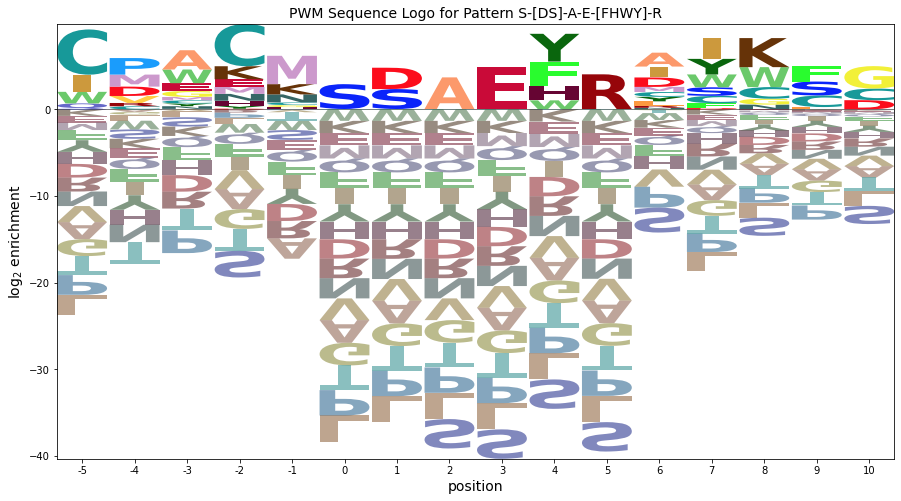

Information Content Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.000000,2.007044,0.000000,0.000000,0.000000,0.000000,0.000000,0.729834,0.000000,0.000000,0.000000,0.000000,0.000000,0.182459,0.000000,0.547376,0.000000,0.000000,0.273688,0.000000
1,0.064243,0.000000,0.149900,0.000000,0.000000,0.064243,0.000000,0.000000,0.000000,0.064243,0.107071,0.000000,0.471114,0.000000,0.085657,0.064243,0.000000,0.149900,0.000000,0.000000
2,0.490167,0.000000,0.000000,0.066841,0.000000,0.155962,0.000000,0.044561,0.000000,0.066841,0.044561,0.089121,0.000000,0.000000,0.000000,0.066841,0.000000,0.066841,0.111402,0.066841
3,0.000000,0.910565,0.124168,0.124168,0.000000,0.000000,0.165557,0.000000,0.206947,0.124168,0.124168,0.248336,0.124168,0.000000,0.082779,0.000000,0.000000,0.000000,0.000000,0.124168
4,0.000000,0.000000,0.000000,0.000000,0.000000,0.125965,0.075579,0.000000,0.100772,0.151159,0.554248,0.176352,0.125965,0.000000,0.000000,0.075579,0.050386,0.075579,0.000000,0.000000
5,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.187665,0.000000,0.000000,0.000000,0.000000
6,0.000000,0.000000,0.873556,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.782054,0.000000,0.000000,0.000000,0.000000
7,3.969354,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,0.000000,0.000000,0.000000,5.159470,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


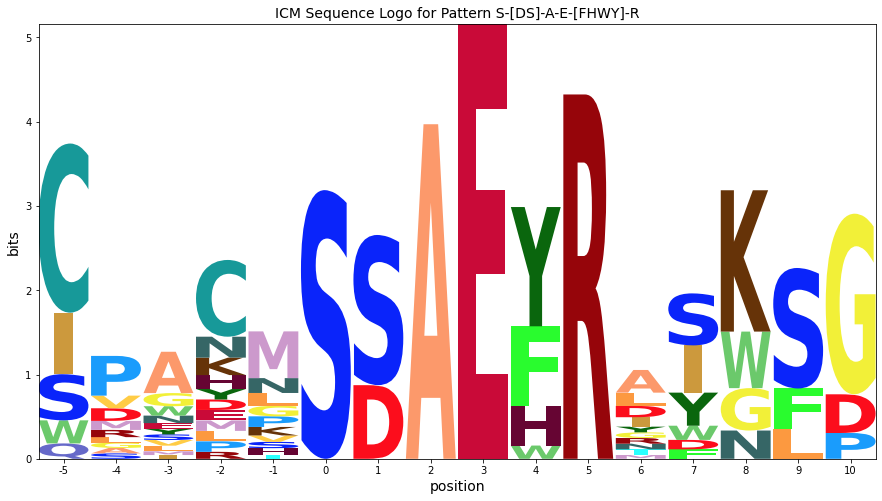

X^2 Critical Value = 40.15223303520055
Chi Square Tests


,index,Position,X^2,p-value,Critical pBH,Critical pBY,AAmax,PWMSmax,AAmin,PWMSmin
0,8,3,2640.2443181818176,0.000000e+00,0.003125,0.000924,E,4.841294062783992,S,-3.3972972713446743
1,10,5,1444.6345798294271,3.382950e-295,0.006250,0.001849,R,4.004354315203545,S,-3.397297271344675
2,0,-5,1189.0418674525206,2.055371e-240,0.009375,0.002773,C,5.222331760096937,L,-2.3758710840233377
3,7,2,1114.4415358037754,1.876627e-224,0.012500,0.003697,A,3.6511775808327487,S,-3.3972972713446743
4,3,-2,841.4087347451325,3.360851e-166,0.015625,0.004622,C,4.886282556964922,S,-3.079121311318421
5,5,0,616.462791960891,1.689467e-118,0.018750,0.005546,S,2.8694892693502263,L,-3.030096247181607
6,9,4,589.2439676691761,9.377954e-113,0.021875,0.006470,Y,3.2040621607780957,S,-3.397297271344675
7,6,1,403.33355849228155,8.884106e-74,0.025000,0.007395,D,2.463791518419968,L,-3.030096247181607
8,4,-1,263.15553830739753,6.632889e-45,0.028125,0.008319,M,3.2707989573878926,A,-2.3525745540283594
9,13,8,215.6918445608824,2.515460e-35,0.031250,0.009244,K,3.3550229540790664,S,-2.097736989485768


----------------------------------------------------------------------
D Pattern: S-S-[AS]-E-[FHWY]-R
Position Probability Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.000000,0.628571,0.057143,0.000000,0.000000,0.000000,0.000000,0.228571,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.085714,0.000000,0.000000,0.000000,0.000000
1,0.044776,0.000000,0.104478,0.000000,0.074627,0.044776,0.208955,0.000000,0.000000,0.000000,0.029851,0.000000,0.328358,0.000000,0.059701,0.000000,0.000000,0.104478,0.000000,0.000000
2,0.328358,0.000000,0.000000,0.044776,0.000000,0.059701,0.000000,0.074627,0.000000,0.253731,0.029851,0.059701,0.000000,0.000000,0.000000,0.029851,0.000000,0.044776,0.074627,0.000000
3,0.000000,0.231579,0.000000,0.031579,0.000000,0.463158,0.042105,0.052632,0.052632,0.031579,0.031579,0.042105,0.000000,0.000000,0.021053,0.000000,0.000000,0.000000,0.000000,0.000000
4,0.173469,0.000000,0.000000,0.000000,0.000000,0.051020,0.000000,0.000000,0.040816,0.285714,0.224490,0.122449,0.071429,0.000000,0.000000,0.000000,0.000000,0.030612,0.000000,0.000000
5,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000
6,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000
7,0.510000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.490000,0.000000,0.000000,0.000000,0.000000
8,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


Position Weight Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,-1.812006,5.371709,0.151917,-0.621890,-1.022808,-1.813151,-1.235026,2.129339,-0.600366,-2.226493,-0.712195,-1.528835,-2.128495,-0.804329,-1.458829,-0.593694,-2.042482,-1.705272,-0.518525,-1.201788
1,-0.473590,0.186564,0.905371,-1.283473,0.900571,-0.474735,2.010281,-1.702169,-1.261950,-2.888077,0.211184,-2.190419,1.733483,-1.465913,0.201515,-3.255278,-2.704065,0.633144,-1.180109,-1.863372
2,2.049972,0.186564,-2.094629,0.716527,-1.684392,-0.152807,-1.896610,0.882793,-1.261950,1.281848,0.211184,0.131509,-2.790079,-1.465913,-2.120413,-1.670316,-2.704065,-0.366856,1.404854,-1.863372
3,-2.876137,4.307579,-2.497176,0.313980,-2.086938,2.614572,0.022772,0.480247,0.920466,-1.290624,0.223675,-0.271037,-3.192625,-1.868460,-0.937997,-3.657825,-3.106612,-2.769403,-1.582655,-2.265919
4,1.256635,-0.253136,-2.534329,-1.723173,-2.124091,-0.329472,-2.336310,-2.141869,0.620279,1.530204,2.710084,1.070321,-0.229778,-1.905613,-2.560113,-3.694978,-3.143765,-0.806556,-1.619808,-2.303072
5,-2.937537,-0.277383,-2.558576,-1.747421,-2.148339,-2.938682,-2.360557,-2.166117,-1.725897,-3.352024,-1.837725,-2.654366,-3.254026,-1.929860,-2.584360,2.938986,-3.168012,-2.830803,-1.644056,-2.327319
6,-2.937537,-0.277383,-2.558576,-1.747421,-2.148339,-2.938682,-2.360557,-2.166117,-1.725897,-3.352024,-1.837725,-2.654366,-3.254026,-1.929860,-2.584360,2.938986,-3.168012,-2.830803,-1.644056,-2.327319
7,2.762903,-0.277383,-2.558576,-1.747421,-2.148339,-2.938682,-2.360557,-2.166117,-1.725897,-3.352024,-1.837725,-2.654366,-3.254026,-1.929860,-2.584360,1.924631,-3.168012,-2.830803,-1.644056,-2.327319
8,-2.937537,-0.277383,-2.558576,4.910791,-2.148339,-2.938682,-2.360557,-2.166117,-1.725897,-3.352024,-1.837725,-2.654366,-3.254026,-1.929860,-2.584360,-3.719225,-3.168012,-2.830803,-1.644056,-2.327319


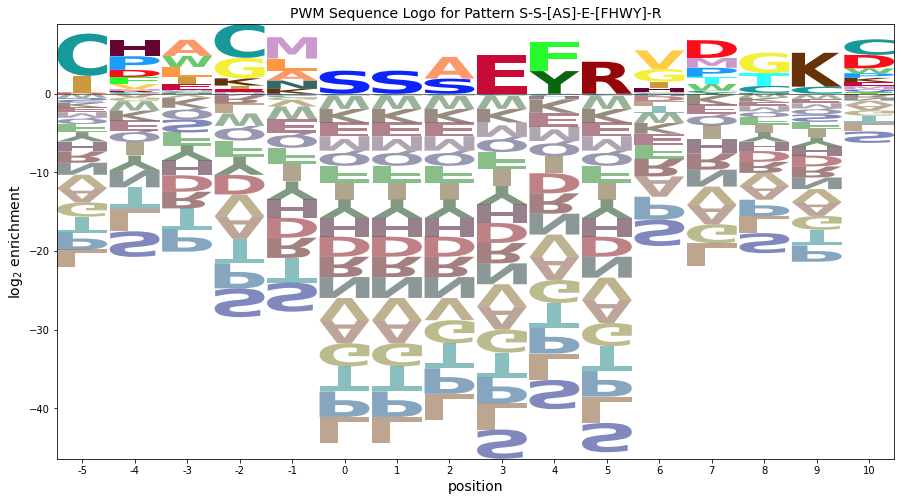

Information Content Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.000000,2.718526,0.247139,0.000000,0.000000,0.000000,0.000000,0.988555,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.370708,0.000000,0.000000,0.000000,0.000000
1,0.062433,0.000000,0.145678,0.000000,0.104056,0.062433,0.291356,0.000000,0.000000,0.000000,0.041622,0.000000,0.457845,0.000000,0.083245,0.000000,0.000000,0.145678,0.000000,0.000000
2,0.435076,0.000000,0.000000,0.059329,0.000000,0.079105,0.000000,0.098881,0.000000,0.336195,0.039552,0.079105,0.000000,0.000000,0.000000,0.039552,0.000000,0.059329,0.098881,0.000000
3,0.000000,0.548282,0.000000,0.074766,0.000000,1.096564,0.099688,0.124610,0.124610,0.074766,0.074766,0.099688,0.000000,0.000000,0.049844,0.000000,0.000000,0.000000,0.000000,0.000000
4,0.263611,0.000000,0.000000,0.000000,0.000000,0.077533,0.000000,0.000000,0.062026,0.434183,0.341144,0.186079,0.108546,0.000000,0.000000,0.000000,0.000000,0.046520,0.000000,0.000000
5,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.187665,0.000000,0.000000,0.000000,0.000000
6,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.187665,0.000000,0.000000,0.000000,0.000000
7,1.319174,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.267441,0.000000,0.000000,0.000000,0.000000
8,0.000000,0.000000,0.000000,5.159470,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


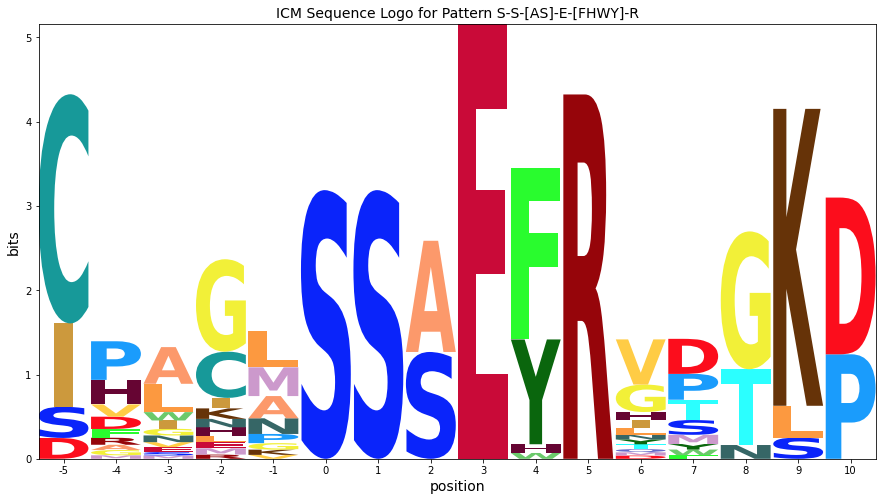

X^2 Critical Value = 40.15223303520055
Chi Square Tests


,index,Position,X^2,p-value,Critical pBH,Critical pBY,AAmax,PWMSmax,AAmin,PWMSmin
0,8,3,3474.005681818182,0.000000e+00,0.003125,0.000924,E,4.910790909953523,S,-3.719225366232037
1,10,5,1900.8349734597716,0.000000e+00,0.006250,0.001849,R,4.073851162373076,S,-3.719225366232037
2,0,-5,1387.733035558545,5.459813e-283,0.009375,0.002773,C,5.371709384135164,L,-2.226493459985111
3,9,4,1155.7787613812047,2.699740e-233,0.012500,0.003697,F,3.758551784063304,S,-3.719225366232037
4,14,9,833.169300072426,1.902746e-164,0.015625,0.004622,K,4.311054094868391,P,-2.0750555473212073
5,5,0,811.1352525801196,9.232477e-160,0.018750,0.005546,S,2.9389861165197573,L,-3.352024342068969
6,6,1,811.1352525801196,9.232477e-160,0.021875,0.006470,S,2.9389861165197573,L,-3.352024342068969
7,3,-2,760.6386664906626,4.941406e-149,0.025000,0.007395,C,4.307579046715449,S,-3.657824821567894
8,7,2,526.1765260689104,1.781046e-99,0.028125,0.008319,A,2.762902663391576,L,-3.3520243420689697
9,4,-1,253.77320038509419,5.322617e-43,0.031250,0.009244,M,2.7100840029134137,S,-3.6949778199853607


----------------------------------------------------------------------
E Pattern: D-A-E-S-R
Position Probability Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.04878,0.000000,0.000000,0.170732,0.000000,0.000000,0.170732,0.365854,0.000000,0.097561,0.000000,0.146341,0.000000,0.000000
1,0.268293,0.0,0.048780,0.000000,0.000000,0.000000,0.00000,0.000000,0.097561,0.000000,0.170732,0.000000,0.000000,0.000000,0.048780,0.097561,0.097561,0.170732,0.000000,0.000000
2,0.000000,0.0,0.215686,0.000000,0.078431,0.137255,0.00000,0.000000,0.000000,0.000000,0.039216,0.058824,0.078431,0.000000,0.078431,0.274510,0.000000,0.039216,0.000000,0.000000
3,0.258621,0.0,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.172414,0.000000,0.034483,0.068966,0.000000,0.189655,0.034483,0.103448,0.068966,0.000000,0.068966
4,0.095238,0.0,0.031746,0.158730,0.000000,0.095238,0.00000,0.000000,0.000000,0.253968,0.000000,0.031746,0.000000,0.000000,0.000000,0.063492,0.000000,0.063492,0.000000,0.206349
5,0.000000,0.0,1.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
6,1.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
7,0.000000,0.0,0.000000,1.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000


Position Weight Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,-1.961384,0.698770,-1.582423,-0.771267,-1.172186,-1.962528,0.200559,-1.189963,-0.749744,0.624129,-0.861572,-1.678213,0.722128,3.046293,-1.608207,-0.421144,-2.191859,0.952705,-0.667902,-1.351166
1,1.623579,0.698770,0.002539,-0.771267,-1.172186,-1.962528,-1.384404,-1.189963,1.572184,-2.375871,2.138428,-1.678213,-2.277872,-0.953707,-0.023245,-0.421144,0.130069,1.145350,-0.667902,-1.351166
2,-2.180394,0.479760,1.783530,-0.990277,0.930733,0.818462,-1.603414,-1.408973,-0.968754,-2.594881,0.504380,0.102778,-0.174954,-1.172717,0.494711,0.944809,-2.410869,-0.488697,-0.886912,-1.570176
3,1.683951,0.344105,-1.937088,-1.125932,-1.526850,-2.317193,-1.739069,-1.544628,-1.104409,0.728896,-1.216237,-0.447915,-0.310609,-1.308372,1.622091,-1.512774,0.260831,0.112613,-1.022567,0.616097
4,0.401669,0.254468,-0.441763,2.243862,-1.616488,0.400524,-1.828706,-1.634265,-1.194046,1.267290,-1.305874,-0.537552,-2.722175,-1.398009,-2.052509,-0.865446,-2.636161,0.022976,-1.112205,2.011887
5,-2.440037,0.220116,3.983317,-1.249921,-1.650839,-2.441182,-1.863057,-1.668617,-1.228397,-2.854525,-1.340226,-2.156866,-2.756526,-1.432360,-2.086861,-3.221726,-2.670513,-2.333304,-1.146556,-1.829820
6,3.604357,0.220116,-2.061077,-1.249921,-1.650839,-2.441182,-1.863057,-1.668617,-1.228397,-2.854525,-1.340226,-2.156866,-2.756526,-1.432360,-2.086861,-3.221726,-2.670513,-2.333304,-1.146556,-1.829820
7,-2.440037,0.220116,-2.061077,4.794473,-1.650839,-2.441182,-1.863057,-1.668617,-1.228397,-2.854525,-1.340226,-2.156866,-2.756526,-1.432360,-2.086861,-3.221726,-2.670513,-2.333304,-1.146556,-1.829820
8,-2.440037,0.220116,-2.061077,-1.249921,-1.650839,-2.441182,-1.863057,-1.668617,-1.228397,-2.854525,-1.340226,-2.156866,-2.756526,-1.432360,-2.086861,2.822668,-2.670513,-2.333304,-1.146556,-1.829820


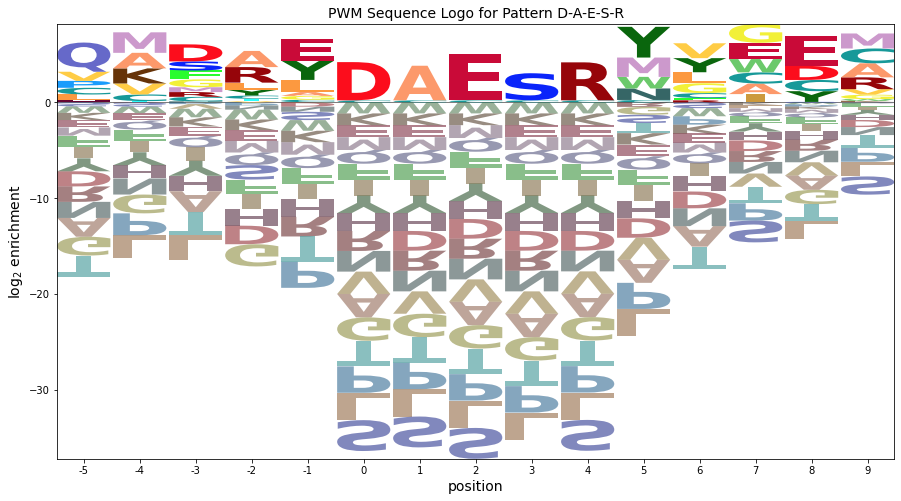

Information Content Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.08943,0.000000,0.000000,0.313005,0.000000,0.000000,0.313005,0.670725,0.000000,0.178860,0.000000,0.268290,0.000000,0.000000
1,0.387052,0.0,0.070373,0.000000,0.000000,0.000000,0.00000,0.000000,0.140746,0.000000,0.246306,0.000000,0.000000,0.000000,0.070373,0.140746,0.140746,0.246306,0.000000,0.000000
2,0.000000,0.0,0.239748,0.000000,0.087181,0.152567,0.00000,0.000000,0.000000,0.000000,0.043591,0.065386,0.087181,0.000000,0.087181,0.305134,0.000000,0.043591,0.000000,0.000000
3,0.280059,0.0,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.186706,0.000000,0.037341,0.074682,0.000000,0.205376,0.037341,0.112023,0.074682,0.000000,0.074682
4,0.123454,0.0,0.041151,0.205757,0.000000,0.123454,0.00000,0.000000,0.000000,0.329211,0.000000,0.041151,0.000000,0.000000,0.000000,0.082303,0.000000,0.082303,0.000000,0.267484
5,0.000000,0.0,4.348314,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
6,3.969354,0.0,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
7,0.000000,0.0,0.000000,5.159470,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.187665,0.000000,0.000000,0.000000,0.000000


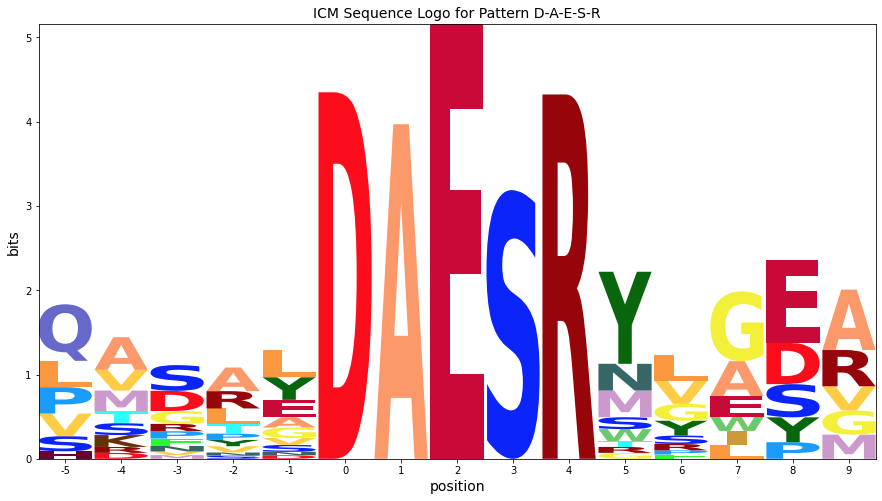

X^2 Critical Value = 39.938849338465694
Chi Square Tests


,index,Position,X^2,p-value,Critical pBH,Critical pBY,AAmax,PWMSmax,AAmin,PWMSmin
0,7,2,2258.103693181817,0.000000e+00,0.003333,0.001005,E,4.7944732060309985,S,-3.22172570676122
1,5,0,1258.9951426836676,2.154813e-255,0.006667,0.002009,D,3.983317484220785,S,-3.22172570676122
2,9,4,1235.5427327488521,2.273708e-250,0.010000,0.003014,R,3.9575334584505515,S,-3.221725706761221
3,6,1,953.1407872005975,5.289004e-190,0.013333,0.004018,A,3.6043567240797554,S,-3.22172570676122
4,8,3,527.2379141770778,1.065633e-99,0.016667,0.005023,S,2.822668412597233,L,-2.8545246825981527
5,10,5,384.57644081366215,7.027465e-70,0.020000,0.006027,Y,3.2045318645233776,L,-2.8201731778073755
6,0,-5,181.5588042505449,1.525636e-28,0.023333,0.007032,Q,3.0462931848402484,T,-2.1918591915265773
7,13,8,163.27182311124713,5.853730e-25,0.026667,0.008036,E,3.159470022810246,L,-1.9045653650977483
8,4,-1,132.62158119248204,4.644678e-19,0.030000,0.009041,E,2.2438622101006187,P,-2.722174524104933
9,1,-4,92.36862494012595,1.258613e-11,0.033333,0.010046,M,2.138427758655356,L,-2.375871084023337


----------------------------------------------------------------------
F Pattern: S-A-E-Y-R
Position Probability Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.000000,0.000000,0.000000,0.000000,0.039216,0.078431,0.000000,0.000000,0.098039,0.000000,0.000000,0.000000,0.431373,0.000000,0.215686,0.000000,0.000000,0.137255,0.000000,0.000000
1,0.584906,0.000000,0.000000,0.000000,0.000000,0.075472,0.000000,0.000000,0.000000,0.094340,0.000000,0.000000,0.000000,0.000000,0.000000,0.075472,0.000000,0.000000,0.169811,0.000000
2,0.037736,0.415094,0.075472,0.000000,0.000000,0.132075,0.075472,0.000000,0.094340,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.094340,0.037736,0.000000,0.037736,0.000000
3,0.037037,0.000000,0.000000,0.000000,0.098765,0.024691,0.000000,0.111111,0.000000,0.061728,0.271605,0.098765,0.148148,0.049383,0.024691,0.037037,0.037037,0.000000,0.000000,0.000000
4,0.024096,0.000000,0.000000,0.036145,0.000000,0.024096,0.024096,0.000000,0.000000,0.180723,0.000000,0.132530,0.048193,0.000000,0.000000,0.433735,0.036145,0.060241,0.000000,0.000000
5,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000
6,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
7,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000


Position Weight Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,-2.180394,0.479760,-1.801433,-0.990277,0.193767,0.140390,-1.603414,-1.408973,1.616209,-2.594881,-1.080582,-1.897222,2.026680,-1.172717,1.757746,-2.962082,-2.410869,0.926340,-0.886912,-1.570176
1,2.779529,0.439683,-1.841510,-1.030355,-1.431273,0.100312,-1.643491,-1.449050,-1.008831,-0.049996,-1.120659,-1.937300,-2.536960,-1.212794,-1.867294,-0.680231,-2.450946,-2.113737,2.394938,-1.610253
2,-0.635509,4.963245,0.480418,-1.030355,-1.431273,0.778384,0.678437,-1.449050,1.576131,-2.634958,-1.120659,-1.937300,-2.536960,-1.212794,-1.867294,-0.417197,-0.865984,-2.113737,0.657973,-1.610253
3,-0.688858,-0.028704,-2.309897,-1.498741,1.270265,-1.105040,-2.111878,1.404491,-1.477218,-0.518383,2.934516,0.764238,0.695093,0.640747,-0.750719,-1.470546,-0.919333,-2.582124,-1.395377,-2.078640
4,-1.132184,-0.056993,-2.338186,0.472969,-1.927949,-1.133329,-0.555204,-1.945726,-1.505507,0.868366,-1.617335,1.150987,-0.711708,-1.709470,-2.363970,1.710618,-0.947622,-0.025451,-1.423666,-2.106929
5,-2.913290,-0.253136,-2.534329,-1.723173,-2.124091,-2.914434,-2.336310,-2.141869,-1.701649,-3.327777,-1.813478,-2.630118,-3.229778,-1.905613,-2.560113,2.934379,-3.143765,-2.806556,-1.619808,-2.303072
6,3.716067,-0.253136,-2.534329,-1.723173,-2.124091,-2.914434,-2.336310,-2.141869,-1.701649,-3.327777,-1.813478,-2.630118,-3.229778,-1.905613,-2.560113,-3.694978,-3.143765,-2.806556,-1.619808,-2.303072
7,-2.913290,-0.253136,-2.534329,4.906184,-2.124091,-2.914434,-2.336310,-2.141869,-1.701649,-3.327777,-1.813478,-2.630118,-3.229778,-1.905613,-2.560113,-3.694978,-3.143765,-2.806556,-1.619808,-2.303072
8,-2.913290,-0.253136,-2.534329,-1.723173,-2.124091,-2.914434,-2.336310,-2.141869,-1.701649,-3.327777,-1.813478,-2.630118,-3.229778,-1.905613,-2.560113,-3.694978,-3.143765,-2.806556,-1.619808,4.326285


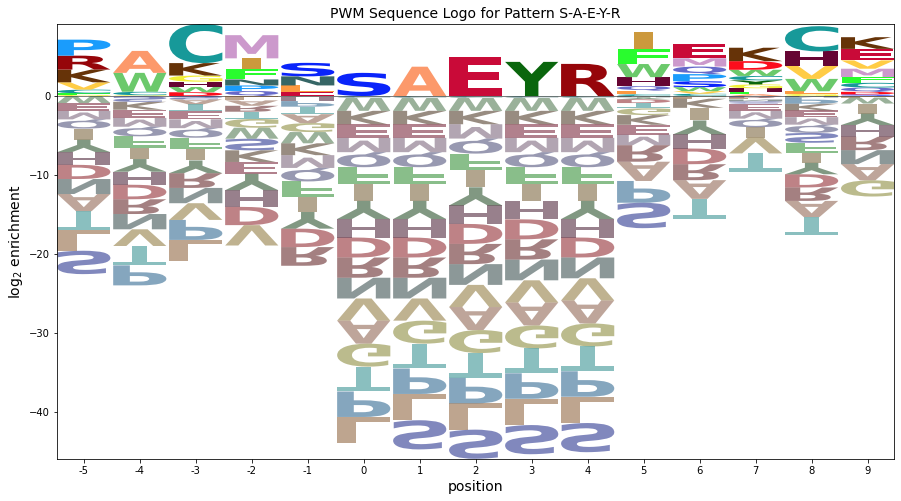

Information Content Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.000000,0.000000,0.000000,0.000000,0.073716,0.147431,0.000000,0.000000,0.184289,0.000000,0.000000,0.000000,0.810871,0.000000,0.405435,0.000000,0.000000,0.258004,0.000000,0.000000
1,1.356899,0.000000,0.000000,0.000000,0.000000,0.175084,0.000000,0.000000,0.000000,0.218855,0.000000,0.000000,0.000000,0.000000,0.000000,0.175084,0.000000,0.000000,0.393938,0.000000
2,0.097109,1.068195,0.194217,0.000000,0.000000,0.339880,0.194217,0.000000,0.242772,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.242772,0.097109,0.000000,0.097109,0.000000
3,0.045298,0.000000,0.000000,0.000000,0.120794,0.030198,0.000000,0.135893,0.000000,0.075496,0.332183,0.120794,0.181191,0.060397,0.030198,0.045298,0.045298,0.000000,0.000000,0.000000
4,0.026209,0.000000,0.000000,0.039314,0.000000,0.026209,0.026209,0.000000,0.000000,0.196568,0.000000,0.144150,0.052418,0.000000,0.000000,0.471763,0.039314,0.065523,0.000000,0.000000
5,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.187665,0.000000,0.000000,0.000000,0.000000
6,3.969354,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
7,0.000000,0.000000,0.000000,5.159470,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,4.579571


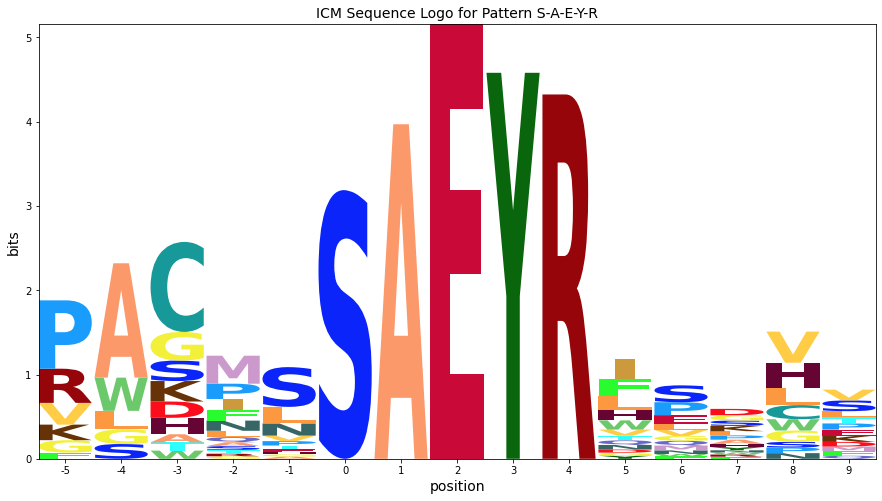

X^2 Critical Value = 39.938849338465694
Chi Square Tests


,index,Position,X^2,p-value,Critical pBH,Critical pBY,AAmax,PWMSmax,AAmin,PWMSmin
0,7,2,3404.5255681818185,0.000000e+00,0.003333,0.001005,E,4.906183593528015,S,-3.69497781998536
1,8,3,2245.2272165732206,0.000000e+00,0.006667,0.002009,Y,4.32628486658807,S,-3.6949778199853607
2,9,4,1862.8182739905767,0.000000e+00,0.010000,0.003014,R,4.069243845947568,S,-3.69497781998536
3,6,1,1437.0430330101315,1.439980e-293,0.013333,0.004018,A,3.716067111576771,S,-3.69497781998536
4,2,-3,905.340120070568,8.196656e-180,0.016667,0.005023,C,4.963244538779805,L,-2.6349583053404695
5,5,0,794.9125475285172,2.592056e-156,0.020000,0.006027,S,2.9343788000942492,L,-3.3277767958222917
6,1,-4,302.71317809871647,5.558911e-53,0.023333,0.007032,A,2.7795289819789843,P,-2.536959651638027
7,3,-2,220.99208383519422,2.179861e-36,0.026667,0.008036,M,2.93451556952346,V,-2.5821240805523322
8,0,-5,156.86257483341927,1.031235e-23,0.030000,0.009041,P,2.0266797437943227,S,-2.9620818901282013
9,4,-1,134.37791678699114,2.154446e-19,0.033333,0.010046,S,1.7106180678222123,R,-2.363970251953419


----------------------------------------------------------------------
G Pattern: G-G-G-S-A
Position Probability Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.000000,0.0,0.076923,0.000000,0.038462,0.038462,0.000000,0.038462,0.0,0.115385,0.038462,0.269231,0.153846,0.038462,0.076923,0.076923,0.000000,0.038462,0.000000,0.000000
1,0.065574,0.0,0.114754,0.000000,0.032787,0.000000,0.114754,0.098361,0.0,0.032787,0.032787,0.000000,0.065574,0.032787,0.065574,0.196721,0.065574,0.081967,0.000000,0.000000
2,0.000000,0.0,0.000000,0.000000,0.036364,0.054545,0.000000,0.000000,0.0,0.218182,0.036364,0.036364,0.054545,0.000000,0.000000,0.145455,0.163636,0.181818,0.000000,0.072727
3,0.000000,0.0,0.000000,0.032787,0.098361,0.049180,0.000000,0.000000,0.0,0.213115,0.000000,0.131148,0.098361,0.000000,0.000000,0.229508,0.081967,0.000000,0.065574,0.000000
4,0.119403,0.0,0.029851,0.000000,0.104478,0.044776,0.089552,0.000000,0.0,0.044776,0.059701,0.029851,0.059701,0.000000,0.104478,0.089552,0.223881,0.000000,0.000000,0.000000
5,0.000000,0.0,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
6,0.000000,0.0,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
7,0.000000,0.0,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000


Position Weight Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,-2.200571,0.459582,0.500317,-1.010455,0.173589,-0.616754,-1.623591,0.155812,-0.988931,0.192296,0.484203,1.989490,0.652865,0.392068,0.474533,-0.660332,-2.431047,-0.508875,-0.907090,-1.590354
1,-0.048568,0.289657,1.008464,-1.180380,0.003664,-2.371641,1.206484,1.208279,-1.158856,-1.200021,0.314278,-2.087325,-0.365057,0.222143,0.304608,0.548255,-0.279044,0.321200,-1.077015,-1.760279
2,-2.259465,0.400688,-1.880504,-1.069349,0.114696,-0.260610,-1.682485,-1.488045,-1.047825,1.026487,0.425309,-0.391331,-0.575954,-1.251788,-1.906288,0.128772,0.831988,1.306700,-0.965984,0.672681
3,-2.370496,0.289657,-1.991536,0.404583,1.226057,-0.371641,-1.793516,-1.599076,-1.158856,1.022371,-1.270685,1.082600,0.120370,-1.362819,-2.017320,0.754706,-0.016009,-2.263763,1.244913,-1.760279
4,0.696335,0.186564,-0.509667,-1.283473,1.315608,-0.474735,0.910745,-1.702169,-1.261950,-0.888077,0.948150,-0.605456,-0.468150,-1.465913,0.879587,-0.447923,1.295935,-2.366856,-1.180109,-1.863372
5,-2.473590,0.186564,-2.094629,-1.283473,-1.684392,3.612728,-1.896610,-1.702169,-1.261950,-2.888077,-1.373778,-2.190419,-2.790079,-1.465913,-2.120413,-3.255278,-2.704065,-2.366856,-1.180109,-1.863372
6,-2.473590,0.186564,-2.094629,-1.283473,-1.684392,3.612728,-1.896610,-1.702169,-1.261950,-2.888077,-1.373778,-2.190419,-2.790079,-1.465913,-2.120413,-3.255278,-2.704065,-2.366856,-1.180109,-1.863372
7,-2.473590,0.186564,-2.094629,-1.283473,-1.684392,3.612728,-1.896610,-1.702169,-1.261950,-2.888077,-1.373778,-2.190419,-2.790079,-1.465913,-2.120413,-3.255278,-2.704065,-2.366856,-1.180109,-1.863372
8,-2.473590,0.186564,-2.094629,-1.283473,-1.684392,-2.474735,-1.896610,-1.702169,-1.261950,-2.888077,-1.373778,-2.190419,-2.790079,-1.465913,-2.120413,2.832185,-2.704065,-2.366856,-1.180109,-1.863372


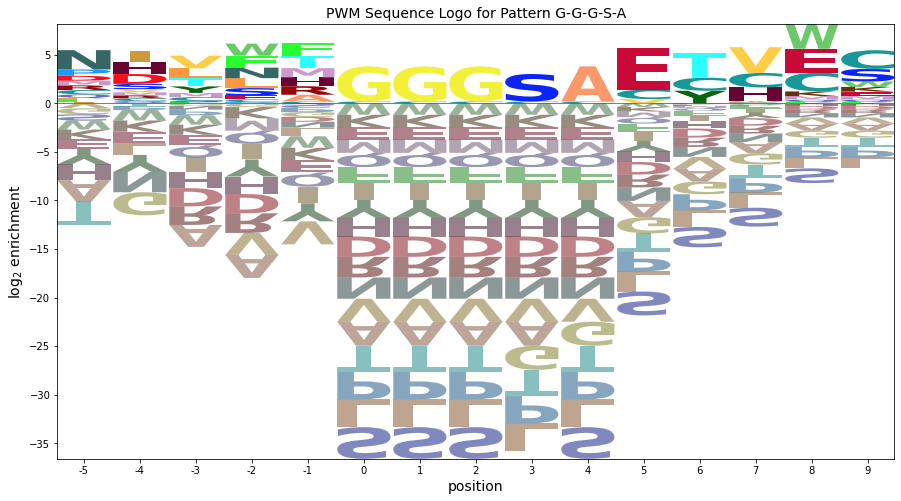

Information Content Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.000000,0.0,0.066703,0.000000,0.033351,0.033351,0.000000,0.033351,0.0,0.100054,0.033351,0.233459,0.133405,0.033351,0.066703,0.066703,0.000000,0.033351,0.000000,0.000000
1,0.039194,0.0,0.068590,0.000000,0.019597,0.000000,0.068590,0.058791,0.0,0.019597,0.019597,0.000000,0.039194,0.019597,0.039194,0.117582,0.039194,0.048993,0.000000,0.000000
2,0.000000,0.0,0.000000,0.000000,0.030556,0.045834,0.000000,0.000000,0.0,0.183335,0.030556,0.030556,0.045834,0.000000,0.000000,0.122223,0.137501,0.152779,0.000000,0.061112
3,0.000000,0.0,0.000000,0.031344,0.094033,0.047017,0.000000,0.000000,0.0,0.203739,0.000000,0.125378,0.094033,0.000000,0.000000,0.219411,0.078361,0.000000,0.062689,0.000000
4,0.086391,0.0,0.021598,0.000000,0.075592,0.032397,0.064793,0.000000,0.0,0.032397,0.043196,0.021598,0.043196,0.000000,0.075592,0.064793,0.161984,0.000000,0.000000,0.000000
5,0.000000,0.0,0.000000,0.000000,0.000000,3.968209,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
6,0.000000,0.0,0.000000,0.000000,0.000000,3.968209,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
7,0.000000,0.0,0.000000,0.000000,0.000000,3.968209,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.187665,0.000000,0.000000,0.000000,0.000000


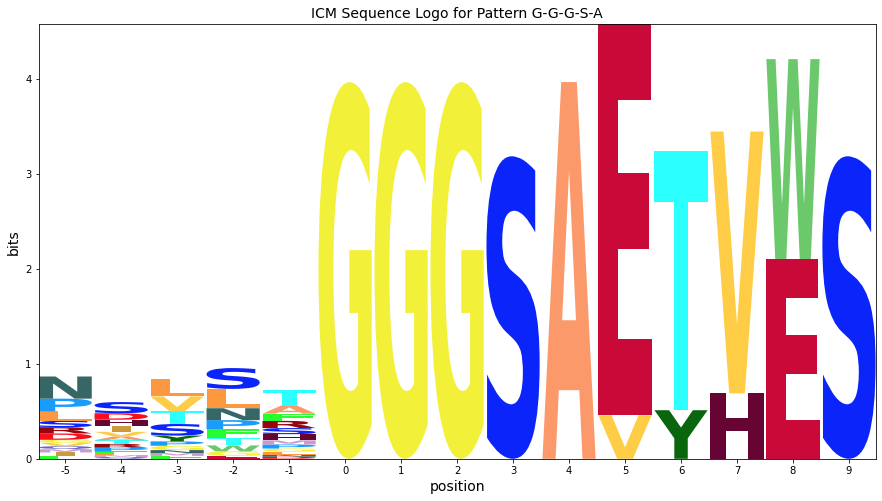

X^2 Critical Value = 39.938849338465694
Chi Square Tests


,index,Position,X^2,p-value,Critical pBH,Critical pBY,AAmax,PWMSmax,AAmin,PWMSmin
0,9,4,982.4681960375391,2.928505e-196,0.003333,0.001005,A,3.613872886260614,S,-3.255278266472247
1,5,0,981.6358546902213,4.408230e-196,0.006667,0.002009,G,3.6127282196777717,S,-3.255278266472247
2,6,1,981.6358546902213,4.408230e-196,0.010000,0.003014,G,3.6127282196777717,S,-3.255278266472247
3,7,2,981.6358546902213,4.408230e-196,0.013333,0.004018,G,3.6127282196777717,S,-3.255278266472247
4,10,5,843.5433260489145,1.181025e-166,0.016667,0.005023,E,4.322968755093125,S,-2.4561909603982444
5,8,3,543.46061922868,4.133672e-103,0.020000,0.006027,S,2.832184574778092,L,-2.888077242309179
6,11,6,172.21345567021166,1.047291e-26,0.023333,0.007032,T,2.5409387684244003,S,-2.097736989485768
7,12,7,160.93779995593454,1.666550e-24,0.026667,0.008036,V,2.6472441033955882,S,-1.9416177875684855
8,13,8,105.2021197139778,6.056696e-14,0.030000,0.009041,W,2.5623951633662454,S,-1.5127744887646108
9,0,-5,70.33381772968178,8.094147e-08,0.033333,0.010046,N,1.9894903748634722,T,-2.4310468554060027


----------------------------------------------------------------------
H Pattern: D-A-E-L-R
Position Probability Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.220339,0.000000,0.101695,0.000000,0.000000,0.152542,0.000000,0.152542,0.000000,0.000000,0.000000,0.118644,0.118644,0.000000,0.000000,0.067797,0.067797,0.000000,0.000000,0.000000
1,0.000000,0.000000,0.031746,0.000000,0.000000,0.158730,0.000000,0.031746,0.142857,0.063492,0.000000,0.142857,0.079365,0.079365,0.000000,0.031746,0.142857,0.000000,0.000000,0.095238
2,0.057143,0.000000,0.000000,0.000000,0.085714,0.085714,0.000000,0.000000,0.028571,0.028571,0.128571,0.071429,0.057143,0.000000,0.028571,0.271429,0.128571,0.000000,0.028571,0.000000
3,0.062500,0.000000,0.075000,0.000000,0.000000,0.025000,0.025000,0.112500,0.112500,0.075000,0.000000,0.075000,0.112500,0.112500,0.025000,0.062500,0.075000,0.025000,0.000000,0.025000
4,0.082474,0.030928,0.061856,0.000000,0.185567,0.000000,0.082474,0.000000,0.000000,0.051546,0.030928,0.134021,0.113402,0.041237,0.000000,0.000000,0.072165,0.061856,0.000000,0.051546
5,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
6,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
7,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


Position Weight Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,1.472928,0.325726,0.851888,-1.144311,-1.545229,0.986356,-1.757447,1.758921,-1.122787,-2.748914,-1.234616,0.948744,0.349084,-1.326750,-1.981250,-0.794187,-0.242975,-2.227693,-1.040946,-1.724209
1,-2.405686,0.254468,-0.441763,-1.215569,-1.616488,1.052601,-1.828706,-0.049303,2.127882,-0.498245,-1.305874,1.199413,-0.137212,1.186954,-2.052509,-1.602412,0.685767,-2.298952,-1.112205,1.011887
2,-0.200571,0.137654,-2.143539,-1.332383,1.074054,0.283711,-1.945520,-1.751079,0.274103,-1.352024,1.899240,0.345634,-0.517060,-1.514823,-0.584360,1.017740,0.568953,-2.415766,0.355944,-1.912282
3,-0.089540,-0.014349,0.511813,-1.484386,-1.885304,-1.090685,-0.512560,1.418846,1.859065,-0.281635,-1.574691,0.416024,0.330937,1.655102,-0.736363,-0.871228,-0.097623,-0.982806,-1.381021,-0.479322
4,0.268914,1.759142,0.285305,-1.710895,2.136115,-2.902156,0.845894,-2.129591,-1.689371,-0.730536,0.198800,1.189515,0.367463,0.428594,-2.547834,-3.682699,-0.131487,0.013078,-1.607530,0.294169
5,-2.901011,-0.240858,4.092659,-1.710895,-2.111813,-2.902156,-2.324031,-2.129591,-1.689371,-3.315498,-1.801200,-2.617840,-3.217500,-1.893334,-2.547834,-3.682699,-3.131487,-2.794277,-1.607530,-2.290793
6,3.713699,-0.240858,-2.522050,-1.710895,-2.111813,-2.902156,-2.324031,-2.129591,-1.689371,-3.315498,-1.801200,-2.617840,-3.217500,-1.893334,-2.547834,-3.682699,-3.131487,-2.794277,-1.607530,-2.290793
7,-2.901011,-0.240858,-2.522050,4.903815,-2.111813,-2.902156,-2.324031,-2.129591,-1.689371,-3.315498,-1.801200,-2.617840,-3.217500,-1.893334,-2.547834,-3.682699,-3.131487,-2.794277,-1.607530,-2.290793
8,-2.901011,-0.240858,-2.522050,-1.710895,-2.111813,-2.902156,-2.324031,-2.129591,-1.689371,3.299211,-1.801200,-2.617840,-3.217500,-1.893334,-2.547834,-3.682699,-3.131487,-2.794277,-1.607530,-2.290793


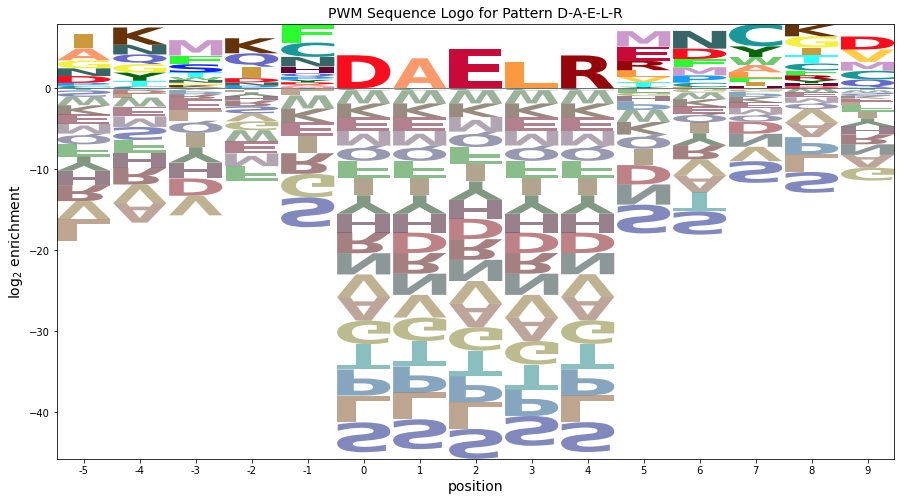

Information Content Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.254015,0.000000,0.117238,0.000000,0.000000,0.175857,0.000000,0.175857,0.000000,0.000000,0.000000,0.136777,0.136777,0.000000,0.000000,0.078158,0.078158,0.000000,0.000000,0.000000
1,0.000000,0.000000,0.031545,0.000000,0.000000,0.157725,0.000000,0.031545,0.141953,0.063090,0.000000,0.141953,0.078863,0.078863,0.000000,0.031545,0.141953,0.000000,0.000000,0.094635
2,0.045666,0.000000,0.000000,0.000000,0.068499,0.068499,0.000000,0.000000,0.022833,0.022833,0.102749,0.057083,0.045666,0.000000,0.022833,0.216915,0.102749,0.000000,0.022833,0.000000
3,0.034941,0.000000,0.041929,0.000000,0.000000,0.013976,0.013976,0.062894,0.062894,0.041929,0.000000,0.041929,0.062894,0.062894,0.013976,0.034941,0.041929,0.013976,0.000000,0.013976
4,0.069776,0.026166,0.052332,0.000000,0.156996,0.000000,0.069776,0.000000,0.000000,0.043610,0.026166,0.113386,0.095942,0.034888,0.000000,0.000000,0.061054,0.052332,0.000000,0.043610
5,0.000000,0.000000,4.348314,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
6,3.969354,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
7,0.000000,0.000000,0.000000,5.159470,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.554866,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


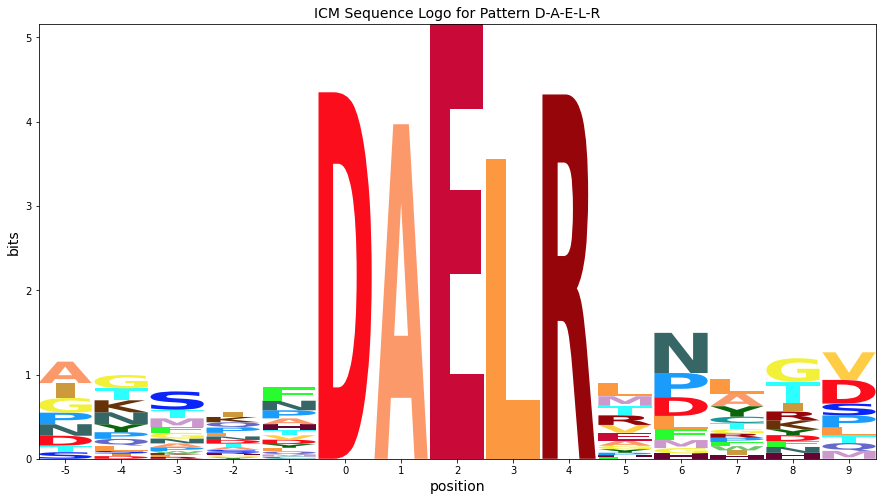

X^2 Critical Value = 39.938849338465694
Chi Square Tests


,index,Position,X^2,p-value,Critical pBH,Critical pBY,AAmax,PWMSmax,AAmin,PWMSmin
0,5,0,1878.808136004857,0.000000e+00,0.003333,0.001005,D,4.092659425531837,S,-3.682699490206923
1,7,2,3369.785511363636,0.000000e+00,0.006667,0.002009,E,4.90381514734205,S,-3.682699490206923
2,9,4,1843.809924255979,0.000000e+00,0.010000,0.003014,R,4.066875399761603,S,-3.682699490206923
3,6,1,1422.3793285916609,2.017116e-290,0.013333,0.004018,A,3.713698665390807,S,-3.682699490206923
4,8,3,1042.9691725635814,3.541478e-209,0.016667,0.005023,L,3.2992113780713535,S,-3.682699490206923
5,4,-1,115.31717813790915,8.274299e-16,0.020000,0.006027,F,2.136114577923484,S,-3.682699490206924
6,11,6,112.37643856201021,2.902861e-15,0.023333,0.007032,N,2.1864355902394923,S,-2.878423961081292
7,10,5,102.8373350731791,1.635489e-13,0.026667,0.008036,M,1.9126606105382513,S,-3.5538017570246665
8,0,-5,88.85805242339248,5.282273e-11,0.030000,0.009041,I,1.758921419918455,L,-2.748914494637553
9,1,-4,87.86406802101699,7.910911e-11,0.033333,0.010046,K,2.1278822178444554,A,-2.405685890487922


----------------------------------------------------------------------
I Pattern: D-S-E-F-R
Position Probability Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.000000,0.0,0.000000,0.083333,0.000000,0.000000,0.000000,0.000000,0.000000,0.333333,0.000000,0.166667,0.000000,0.000000,0.000000,0.000000,0.083333,0.000000,0.333333,0.000000
1,0.090909,0.0,0.090909,0.000000,0.000000,0.045455,0.000000,0.000000,0.000000,0.545455,0.000000,0.000000,0.068182,0.000000,0.045455,0.045455,0.000000,0.000000,0.000000,0.068182
2,0.000000,0.0,0.043478,0.086957,0.043478,0.217391,0.000000,0.000000,0.000000,0.217391,0.000000,0.000000,0.000000,0.000000,0.000000,0.152174,0.108696,0.000000,0.000000,0.130435
3,0.122449,0.0,0.061224,0.000000,0.142857,0.000000,0.000000,0.000000,0.000000,0.285714,0.000000,0.163265,0.081633,0.000000,0.061224,0.040816,0.040816,0.000000,0.000000,0.000000
4,0.000000,0.0,0.035714,0.000000,0.035714,0.053571,0.035714,0.000000,0.000000,0.196429,0.000000,0.339286,0.142857,0.000000,0.000000,0.089286,0.071429,0.000000,0.000000,0.000000
5,0.000000,0.0,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
6,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000
7,0.000000,0.0,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,0.000000,0.0,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


Position Weight Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,-1.490078,1.170076,-1.111117,1.285001,-0.700880,-1.491223,-0.913098,-0.718658,-0.278438,1.265360,-0.390267,1.115021,-1.806567,-0.482401,-1.136901,-2.271766,-0.135591,-1.383344,2.973328,-0.879860
1,0.291282,0.629507,0.670242,-0.840530,-1.241448,-0.446829,-1.453666,-1.259226,-0.819006,2.198722,-0.930835,-1.747475,-0.347135,-1.022969,-0.092507,-1.227372,-2.261122,-1.923913,-0.737165,0.579571
2,-2.075041,0.585113,-0.111117,1.437004,0.299120,1.383246,-1.498061,-1.303620,-0.863401,0.969904,-0.975229,-1.791869,-2.391529,-1.067364,-1.721864,0.143271,0.279447,-1.968307,-0.781559,1.342532
3,0.668184,0.520983,0.239790,-0.949054,1.650027,-2.140316,-1.562191,-1.367750,-0.927531,1.353232,-1.039359,1.313925,-0.133731,-1.131494,0.214006,-1.335897,-0.784684,-2.032437,-0.845690,-1.528953
4,-2.278574,0.381580,-0.314651,-1.088457,0.095587,-0.279719,-0.116631,-1.507153,-1.066934,0.891901,-1.178762,2.326525,0.574862,-1.270897,-1.925397,-0.475300,-0.187121,-2.171840,-0.985093,-1.668356
5,-2.316049,0.344105,3.945555,-1.125932,-1.526850,-2.317193,-1.739069,-1.544628,-1.104409,-2.730536,-1.216237,-2.032877,-2.632537,-1.308372,-1.962872,-3.097737,-2.546524,-2.209315,-1.022567,-1.705831
6,-2.316049,0.344105,-1.937088,-1.125932,-1.526850,-2.317193,-1.739069,-1.544628,-1.104409,-2.730536,-1.216237,-2.032877,-2.632537,-1.308372,-1.962872,2.784906,-2.546524,-2.209315,-1.022567,-1.705831
7,-2.316049,0.344105,-1.937088,4.756711,-1.526850,-2.317193,-1.739069,-1.544628,-1.104409,-2.730536,-1.216237,-2.032877,-2.632537,-1.308372,-1.962872,-3.097737,-2.546524,-2.209315,-1.022567,-1.705831
8,-2.316049,0.344105,-1.937088,-1.125932,4.355793,-2.317193,-1.739069,-1.544628,-1.104409,-2.730536,-1.216237,-2.032877,-2.632537,-1.308372,-1.962872,-3.097737,-2.546524,-2.209315,-1.022567,-1.705831


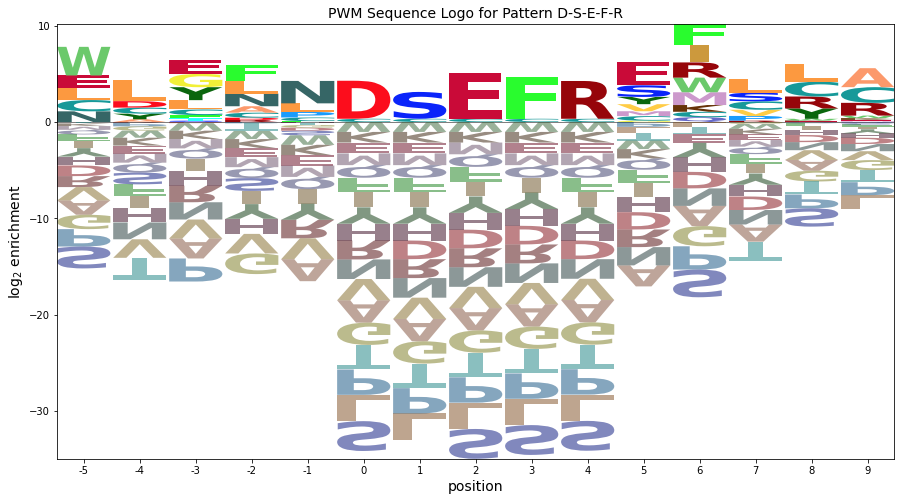

Information Content Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.000000,0.0,0.000000,0.192046,0.000000,0.000000,0.000000,0.000000,0.000000,0.768185,0.000000,0.384092,0.000000,0.000000,0.000000,0.000000,0.192046,0.000000,0.768185,0.000000
1,0.139619,0.0,0.139619,0.000000,0.000000,0.069809,0.000000,0.000000,0.000000,0.837712,0.000000,0.000000,0.104714,0.000000,0.069809,0.069809,0.000000,0.000000,0.000000,0.104714
2,0.000000,0.0,0.050750,0.101500,0.050750,0.253750,0.000000,0.000000,0.000000,0.253750,0.000000,0.000000,0.000000,0.000000,0.000000,0.177625,0.126875,0.000000,0.000000,0.152250
3,0.135555,0.0,0.067778,0.000000,0.158148,0.000000,0.000000,0.000000,0.000000,0.316295,0.000000,0.180740,0.090370,0.000000,0.067778,0.045185,0.045185,0.000000,0.000000,0.000000
4,0.000000,0.0,0.042823,0.000000,0.042823,0.064234,0.042823,0.000000,0.000000,0.235526,0.000000,0.406818,0.171292,0.000000,0.000000,0.107057,0.085646,0.000000,0.000000,0.000000
5,0.000000,0.0,4.348314,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
6,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.187665,0.000000,0.000000,0.000000,0.000000
7,0.000000,0.0,0.000000,5.159470,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,0.000000,0.0,0.000000,0.000000,4.758552,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


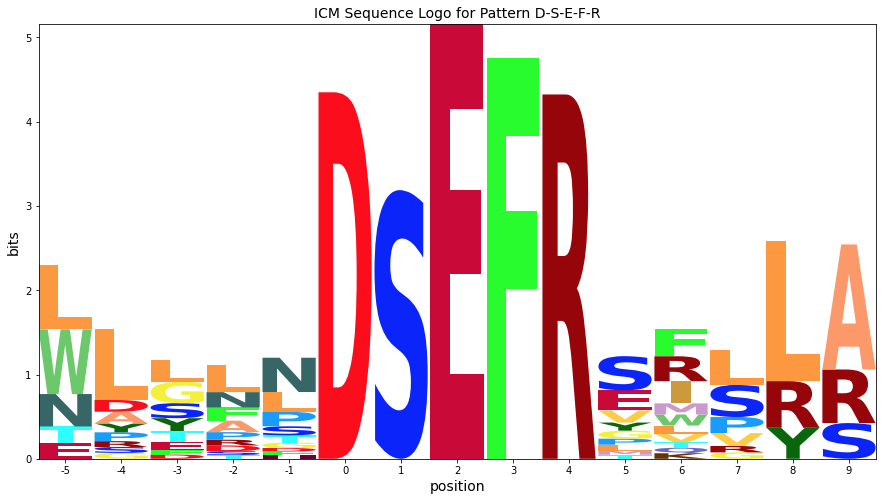

X^2 Critical Value = 39.938849338465694
Chi Square Tests


,index,Position,X^2,p-value,Critical pBH,Critical pBY,AAmax,PWMSmax,AAmin,PWMSmin
0,7,2,2014.9232954545448,0.000000e+00,0.003333,0.001005,E,4.75671085330984,S,-3.097736989485766
1,8,3,1511.9825179527172,1.182637e-309,0.006667,0.002009,F,4.355792614562897,S,-3.097736989485767
2,5,0,1123.4110503946563,2.265745e-226,0.010000,0.003014,D,3.945555131499626,S,-3.097736989485766
3,9,4,1102.4842846066676,6.762594e-222,0.013333,0.004018,R,3.9197711057293927,S,-3.097736989485767
4,6,1,470.4584464964694,8.674048e-88,0.016667,0.005023,S,2.784906059876074,L,-2.730535965322699
5,1,-4,134.48432285822435,2.056383e-19,0.020000,0.006027,L,2.198722443314274,T,-2.2611218539636906
6,0,-5,130.61413847918337,1.115598e-18,0.023333,0.007032,W,2.9733282643123524,S,-2.2717663892608164
7,4,-1,122.09647804524586,4.492939e-17,0.026667,0.008036,N,2.3265253621410418,A,-2.2785739725845837
8,11,6,118.36680319049658,2.238837e-16,0.030000,0.009041,F,2.1518942122428273,S,-2.878423961081292
9,10,5,103.00065343909971,1.527257e-13,0.033333,0.010046,E,2.4691545219428614,A,-2.180393578645679


----------------------------------------------------------------------
J Pattern: G-G-S-A-E
Position Probability Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.000000,0.0,0.073171,0.00,0.048780,0.048780,0.073171,0.0,0.0,0.000000,0.000000,0.000000,0.048780,0.097561,0.097561,0.292683,0.121951,0.000000,0.0,0.097561
1,0.121951,0.0,0.000000,0.00,0.097561,0.073171,0.000000,0.0,0.0,0.146341,0.048780,0.000000,0.073171,0.000000,0.000000,0.048780,0.048780,0.243902,0.0,0.097561
2,0.069767,0.0,0.046512,0.00,0.093023,0.069767,0.000000,0.0,0.0,0.232558,0.046512,0.046512,0.232558,0.000000,0.046512,0.000000,0.069767,0.046512,0.0,0.000000
3,0.163265,0.0,0.102041,0.00,0.122449,0.102041,0.040816,0.0,0.0,0.061224,0.000000,0.040816,0.000000,0.040816,0.061224,0.224490,0.040816,0.000000,0.0,0.000000
4,0.000000,0.0,0.081633,0.00,0.000000,0.551020,0.000000,0.0,0.0,0.000000,0.040816,0.000000,0.040816,0.000000,0.102041,0.061224,0.081633,0.040816,0.0,0.000000
5,0.000000,0.0,0.000000,0.00,0.000000,1.000000,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000
6,0.000000,0.0,0.000000,0.00,0.000000,1.000000,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000
7,0.000000,0.0,0.000000,0.00,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.0,0.000000
8,1.000000,0.0,0.000000,0.00,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000


Position Weight Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,-1.961384,0.698770,0.417577,-0.771267,0.412777,-0.377566,0.615596,-1.189963,-0.749744,-2.375871,-0.861572,-1.678213,-0.692910,1.368221,0.713721,0.957368,0.393103,-1.854650,-0.667902,0.970762
1,0.623579,0.698770,-1.582423,-0.771267,1.149743,0.037472,-1.384404,-1.189963,-0.749744,0.431484,0.723390,-1.678213,-0.277872,-0.953707,-1.608207,-1.158110,-0.606897,1.604782,-0.667902,0.970762
2,-0.007926,0.652227,-0.044003,-0.817810,1.103200,-0.009071,-1.430946,-1.236506,-0.796286,1.037018,0.676848,-0.139793,1.135017,-1.000249,-0.069787,-2.789615,-0.238402,-0.316230,-0.714445,-1.397709
3,1.030754,0.520983,0.824752,-0.949054,1.457382,0.444647,0.022772,-1.367750,-0.927531,-0.553658,-1.039359,-0.271037,-2.455660,0.453469,0.214006,0.664103,-0.784684,-2.032437,-0.845690,-1.528953
4,-2.139171,0.520983,0.561718,-0.949054,-1.349973,2.667039,-1.562191,-1.367750,-0.927531,-2.553658,0.545603,-1.856000,-0.870697,-1.131494,0.798968,-0.920859,-0.047718,-0.447475,-0.845690,-1.528953
5,-2.139171,0.520983,-1.760210,-0.949054,-1.349973,3.503541,-1.562191,-1.367750,-0.927531,-2.553658,-1.039359,-1.856000,-2.455660,-1.131494,-1.785994,-2.920859,-2.369646,-2.032437,-0.845690,-1.528953
6,-2.139171,0.520983,-1.760210,-0.949054,-1.349973,3.503541,-1.562191,-1.367750,-0.927531,-2.553658,-1.039359,-1.856000,-2.455660,-1.131494,-1.785994,-2.920859,-2.369646,-2.032437,-0.845690,-1.528953
7,-2.139171,0.520983,-1.760210,-0.949054,-1.349973,-2.140316,-1.562191,-1.367750,-0.927531,-2.553658,-1.039359,-1.856000,-2.455660,-1.131494,-1.785994,2.722997,-2.369646,-2.032437,-0.845690,-1.528953
8,3.504685,0.520983,-1.760210,-0.949054,-1.349973,-2.140316,-1.562191,-1.367750,-0.927531,-2.553658,-1.039359,-1.856000,-2.455660,-1.131494,-1.785994,-2.920859,-2.369646,-2.032437,-0.845690,-1.528953


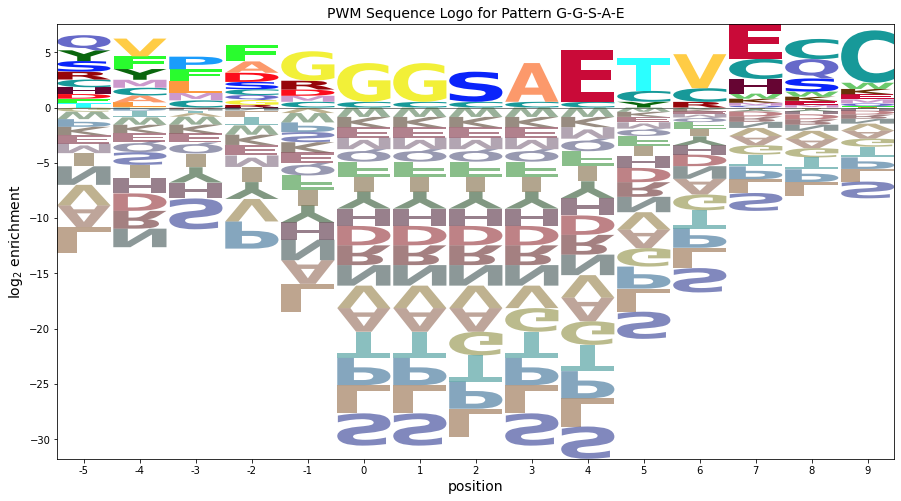

Information Content Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.000000,0.000000,0.068505,0.000000,0.045670,0.045670,0.068505,0.0,0.0,0.000000,0.000000,0.000000,0.045670,0.091340,0.091340,0.274019,0.114174,0.000000,0.0,0.091340
1,0.114018,0.000000,0.000000,0.000000,0.091214,0.068411,0.000000,0.0,0.0,0.136821,0.045607,0.000000,0.068411,0.000000,0.000000,0.045607,0.045607,0.228036,0.0,0.091214
2,0.057845,0.000000,0.038563,0.000000,0.077127,0.057845,0.000000,0.0,0.0,0.192817,0.038563,0.038563,0.192817,0.000000,0.038563,0.000000,0.057845,0.038563,0.0,0.000000
3,0.129235,0.000000,0.080772,0.000000,0.096926,0.080772,0.032309,0.0,0.0,0.048463,0.000000,0.032309,0.000000,0.032309,0.048463,0.177698,0.032309,0.000000,0.0,0.000000
4,0.000000,0.000000,0.146419,0.000000,0.000000,0.988328,0.000000,0.0,0.0,0.000000,0.073209,0.000000,0.073209,0.000000,0.183024,0.109814,0.146419,0.073209,0.0,0.000000
5,0.000000,0.000000,0.000000,0.000000,0.000000,3.968209,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000
6,0.000000,0.000000,0.000000,0.000000,0.000000,3.968209,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000
7,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.187665,0.000000,0.000000,0.0,0.000000
8,3.969354,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000


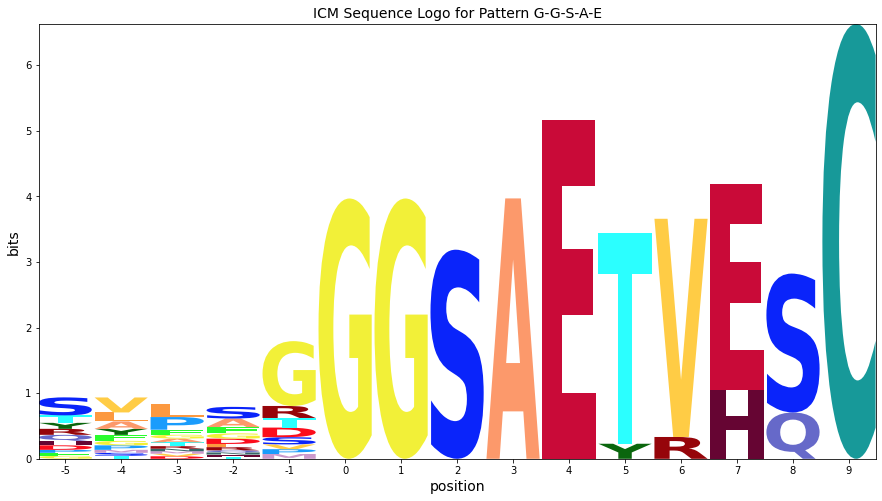

X^2 Critical Value = 39.938849338465694
Chi Square Tests


,index,Position,X^2,p-value,Critical pBH,Critical pBY,AAmax,PWMSmax,AAmin,PWMSmin
0,9,4,1702.2627840909092,0.000000e+00,0.003333,0.001005,E,4.694801755806803,S,-2.9208592274016874
1,8,3,718.5215165050657,4.263578e-140,0.006667,0.002009,A,3.5046852738555594,S,-2.9208592274016874
2,5,0,717.9127892510576,5.739021e-140,0.010000,0.003014,G,3.503540607272717,S,-2.9208592274016874
3,6,1,717.9127892510576,5.739021e-140,0.013333,0.004018,G,3.503540607272717,S,-2.9208592274016874
4,14,9,588.0619773733399,1.664897e-112,0.016667,0.005023,C,4.736422345519323,S,-1.5127744887646108
5,7,2,397.4562737642586,1.482320e-72,0.020000,0.006027,S,2.7229969623730366,L,-2.55365820323862
6,10,5,322.09474081187636,5.806322e-57,0.023333,0.007032,T,2.9530029513891565,S,-2.4561909603982435
7,11,6,288.30123735151744,4.962566e-50,0.026667,0.008036,V,3.0760874021994624,S,-2.20465219340228
8,4,-1,211.8894495766878,1.449749e-34,0.030000,0.009041,G,2.667039339555596,L,-2.5536582032386193
9,12,7,164.51321252253047,3.353203e-25,0.033333,0.010046,E,3.159470022810246,S,-1.6196896926811228


----------------------------------------------------------------------
K Pattern: D-A-E-Y-R
Position Probability Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.069767,0.0,0.000000,0.046512,0.000000,0.232558,0.000000,0.000000,0.000000,0.348837,0.000000,0.000000,0.046512,0.0,0.162791,0.093023,0.000000,0.000000,0.00,0.000000
1,0.000000,0.0,0.000000,0.173077,0.000000,0.153846,0.346154,0.038462,0.000000,0.000000,0.038462,0.000000,0.134615,0.0,0.000000,0.115385,0.000000,0.000000,0.00,0.000000
2,0.185185,0.0,0.000000,0.000000,0.000000,0.129630,0.000000,0.000000,0.000000,0.037037,0.000000,0.000000,0.425926,0.0,0.000000,0.092593,0.000000,0.129630,0.00,0.000000
3,0.074627,0.0,0.000000,0.000000,0.074627,0.164179,0.223881,0.059701,0.000000,0.029851,0.000000,0.000000,0.000000,0.0,0.104478,0.134328,0.000000,0.059701,0.00,0.074627
4,0.214286,0.0,0.071429,0.042857,0.000000,0.000000,0.028571,0.028571,0.042857,0.128571,0.000000,0.057143,0.000000,0.0,0.114286,0.000000,0.228571,0.042857,0.00,0.000000
5,0.000000,0.0,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.00,0.000000
6,1.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.00,0.000000
7,0.000000,0.0,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.00,0.000000
8,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.00,1.000000


Position Weight Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,-0.007926,0.652227,-1.628966,0.767153,-1.218728,1.450361,-1.430946,-1.236506,-0.796286,1.577586,-0.908115,-1.724755,-0.739453,-1.000249,1.345250,-0.467687,-2.238402,-1.901193,-0.714445,-1.397709
1,-2.200571,0.459582,-1.821611,2.311473,-1.411373,0.968209,2.624336,0.155812,-0.988931,-2.615059,0.484203,-1.917400,0.482940,-1.192894,-1.847395,-0.174905,-2.431047,-2.093838,-0.907090,-1.590354
2,1.219332,0.420054,-1.861139,-1.049983,-1.450902,0.758756,-1.663120,-1.468679,-1.028460,-1.069625,-1.140288,-1.956929,2.028374,-1.232423,-1.886923,-0.436826,-2.470575,0.866634,-0.946618,-1.629882
3,0.111373,0.186564,-2.094629,-1.283473,0.900571,1.110228,2.103390,0.619759,-1.261950,-1.303115,-1.373778,-2.190419,-2.790079,-1.465913,0.879587,0.066650,-2.704065,-0.044928,-1.180109,0.721590
4,1.477500,0.137654,0.441424,0.667617,-1.733301,-2.523644,-0.360557,-0.166117,0.689140,0.384941,-1.422688,0.082600,-2.838988,-1.514823,1.000602,-3.304188,1.334488,-0.415766,-1.229018,-1.912282
5,-2.522500,0.137654,4.006208,-1.332383,-1.733301,-2.523644,-1.945520,-1.751079,-1.310860,-2.936987,-1.422688,-2.239328,-2.838988,-1.514823,-2.169323,-3.304188,-2.752975,-2.415766,-1.229018,-1.912282
6,3.627248,0.137654,-2.143539,-1.332383,-1.733301,-2.523644,-1.945520,-1.751079,-1.310860,-2.936987,-1.422688,-2.239328,-2.838988,-1.514823,-2.169323,-3.304188,-2.752975,-2.415766,-1.229018,-1.912282
7,-2.522500,0.137654,-2.143539,4.817364,-1.733301,-2.523644,-1.945520,-1.751079,-1.310860,-2.936987,-1.422688,-2.239328,-2.838988,-1.514823,-2.169323,-3.304188,-2.752975,-2.415766,-1.229018,-1.912282
8,-2.522500,0.137654,-2.143539,-1.332383,-1.733301,-2.523644,-1.945520,-1.751079,-1.310860,-2.936987,-1.422688,-2.239328,-2.838988,-1.514823,-2.169323,-3.304188,-2.752975,-2.415766,-1.229018,4.237465


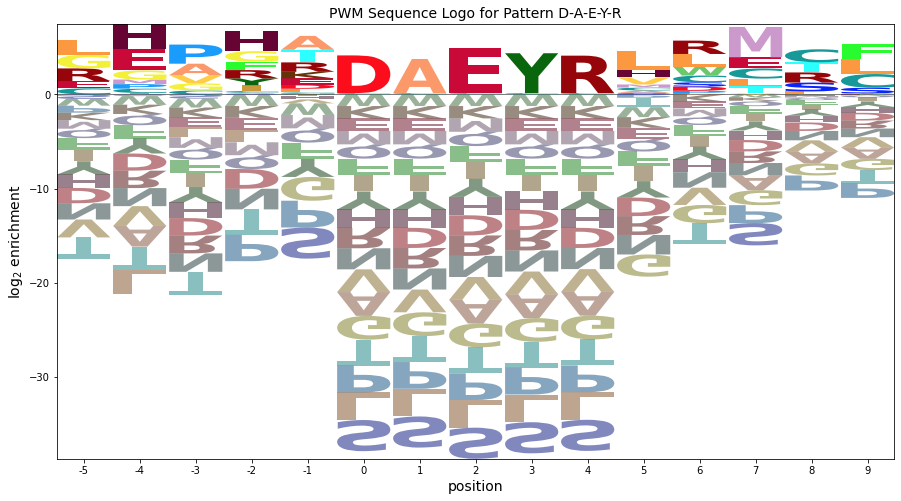

Information Content Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.098073,0.0,0.000000,0.065382,0.000000,0.326911,0.000000,0.000000,0.000000,0.490366,0.000000,0.000000,0.065382,0.0,0.228838,0.130764,0.000000,0.000000,0.000000,0.000000
1,0.000000,0.0,0.000000,0.315057,0.000000,0.280051,0.630114,0.070013,0.000000,0.000000,0.070013,0.000000,0.245045,0.0,0.000000,0.210038,0.000000,0.000000,0.000000,0.000000
2,0.282844,0.0,0.000000,0.000000,0.000000,0.197991,0.000000,0.000000,0.000000,0.056569,0.000000,0.000000,0.650542,0.0,0.000000,0.141422,0.000000,0.197991,0.000000,0.000000
3,0.079021,0.0,0.000000,0.000000,0.079021,0.173847,0.237064,0.063217,0.000000,0.031609,0.000000,0.000000,0.000000,0.0,0.110630,0.142239,0.000000,0.063217,0.000000,0.079021
4,0.215722,0.0,0.071907,0.043144,0.000000,0.000000,0.028763,0.028763,0.043144,0.129433,0.000000,0.057526,0.000000,0.0,0.115052,0.000000,0.230103,0.043144,0.000000,0.000000
5,0.000000,0.0,4.348314,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
6,3.969354,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
7,0.000000,0.0,0.000000,5.159470,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,4.579571


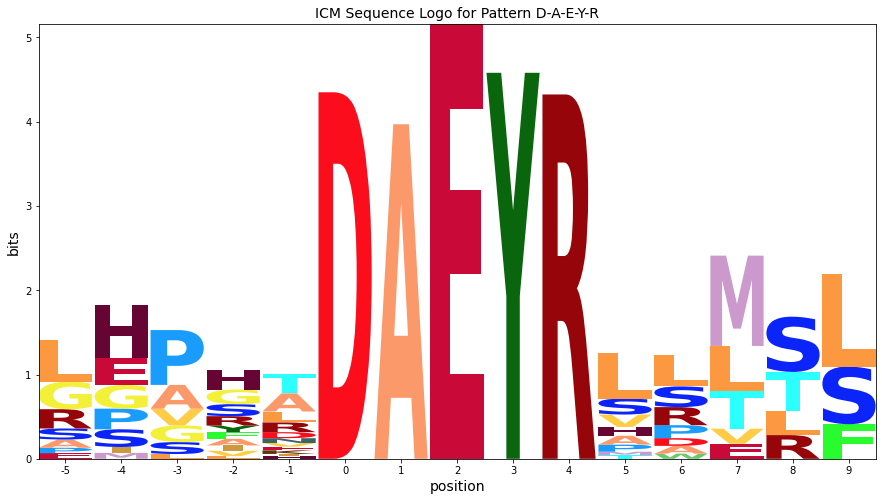

X^2 Critical Value = 39.938849338465694
Chi Square Tests


,index,Position,X^2,p-value,Critical pBH,Critical pBY,AAmax,PWMSmax,AAmin,PWMSmin
0,7,2,2431.803977272728,0.000000e+00,0.003333,0.001005,E,4.817364045985254,S,-3.304187866953193
1,8,3,1603.7337261237287,0.000000e+00,0.006667,0.002009,Y,4.2374653190453095,S,-3.304187866953194
2,5,0,1355.8409228901032,3.773656e-276,0.010000,0.003014,D,4.006208324175041,S,-3.304187866953193
3,9,4,1330.5844814218403,9.813407e-271,0.013333,0.004018,R,3.980424298404807,S,-3.304187866953194
4,6,1,1026.4593092929513,1.189785e-205,0.016667,0.005023,A,3.6272475640340107,S,-3.304187866953193
5,1,-4,191.3223576719695,1.796625e-30,0.020000,0.006027,H,2.6243360591518083,L,-2.615058747902763
6,12,7,187.87329758444278,8.649973e-30,0.023333,0.007032,M,3.215015962681697,S,-2.3669236223011567
7,2,-3,132.823220177189,4.252901e-19,0.026667,0.008036,P,2.0283740423341983,T,-2.47057521959264
8,10,5,121.22813406506783,6.534676e-17,0.030000,0.009041,L,1.987825660815656,G,-2.353719220611201
9,3,-2,101.36272917648915,3.031979e-13,0.033333,0.010046,H,2.1033900513018065,P,-2.7900785886067365


----------------------------------------------------------------------
L Pattern: S-x-D-A-E-x-R
Position Probability Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.200000,0.0,0.000000,0.200000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.466667,0.133333,0.000000,0.000000,0.000000
1,0.000000,0.0,0.000000,0.000000,0.000000,0.105263,0.000000,0.105263,0.000000,0.000000,0.157895,0.000000,0.000000,0.000000,0.000000,0.210526,0.157895,0.105263,0.157895,0.000000
2,0.000000,0.0,0.000000,0.217391,0.000000,0.000000,0.086957,0.000000,0.000000,0.000000,0.000000,0.086957,0.000000,0.000000,0.260870,0.130435,0.130435,0.086957,0.000000,0.000000
3,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.108696,0.260870,0.000000,0.217391,0.000000,0.043478,0.086957,0.000000,0.043478,0.000000,0.000000,0.000000,0.000000,0.239130
4,0.125000,0.0,0.000000,0.000000,0.000000,0.166667,0.000000,0.000000,0.062500,0.041667,0.083333,0.000000,0.000000,0.000000,0.041667,0.041667,0.041667,0.333333,0.000000,0.062500
5,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000
6,0.044776,0.0,0.029851,0.000000,0.074627,0.029851,0.029851,0.029851,0.044776,0.134328,0.194030,0.000000,0.119403,0.149254,0.000000,0.089552,0.000000,0.000000,0.000000,0.029851
7,0.000000,0.0,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,1.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


Position Weight Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.840071,1.500224,-0.780969,2.030187,-0.370731,-1.161074,-0.582949,-0.388509,0.051711,-1.574417,-0.060118,-0.876758,-1.476418,-0.152252,-0.806753,1.058382,0.194558,-1.053196,0.133552,-0.549712
1,-1.316049,1.344105,-0.937088,-0.125932,-0.526850,0.267769,-0.739069,1.040334,-0.104409,-1.730536,1.783763,-1.032877,-1.632537,-0.308372,-0.962872,0.224191,0.453476,0.375648,1.977433,-0.705831
2,-1.456911,1.203242,-1.077950,2.318168,-0.667713,-1.458056,0.705031,-0.685491,-0.245271,-1.871399,-0.357100,0.411223,-1.773400,-0.449234,1.703620,-0.238600,0.312613,0.234785,-0.163430,-0.846693
3,-2.075041,0.585113,-1.696080,-0.884924,-1.285842,-2.076185,1.086902,2.396820,-0.863401,0.969904,-0.975229,-0.206907,-0.069601,-1.067364,-0.136901,-2.856729,-2.305516,-1.968307,-0.781559,2.120140
4,0.689246,0.542044,-1.739149,-0.927993,-1.328911,1.050671,-1.541129,-1.346689,1.093531,-0.947634,1.303630,-1.834938,-2.434598,-1.110432,-0.179970,-1.314835,-0.763622,2.076087,-0.824628,0.492108
5,-2.473590,0.186564,-2.094629,-1.283473,-1.684392,-2.474735,-1.896610,-1.702169,-1.261950,-2.888077,-1.373778,-2.190419,-2.790079,-1.465913,-2.120413,2.832185,-2.704065,-2.366856,-1.180109,-1.863372
6,-0.473590,0.186564,-0.509667,-1.283473,0.900571,-0.889772,-0.311647,-0.117207,0.738050,0.433851,2.433577,-2.190419,0.379846,1.993519,-2.120413,-0.447923,-2.704065,-2.366856,-1.180109,-0.278410
7,-2.473590,0.186564,3.992834,-1.283473,-1.684392,-2.474735,-1.896610,-1.702169,-1.261950,-2.888077,-1.373778,-2.190419,-2.790079,-1.465913,-2.120413,-3.255278,-2.704065,-2.366856,-1.180109,-1.863372
8,3.613873,0.186564,-2.094629,-1.283473,-1.684392,-2.474735,-1.896610,-1.702169,-1.261950,-2.888077,-1.373778,-2.190419,-2.790079,-1.465913,-2.120413,-3.255278,-2.704065,-2.366856,-1.180109,-1.863372


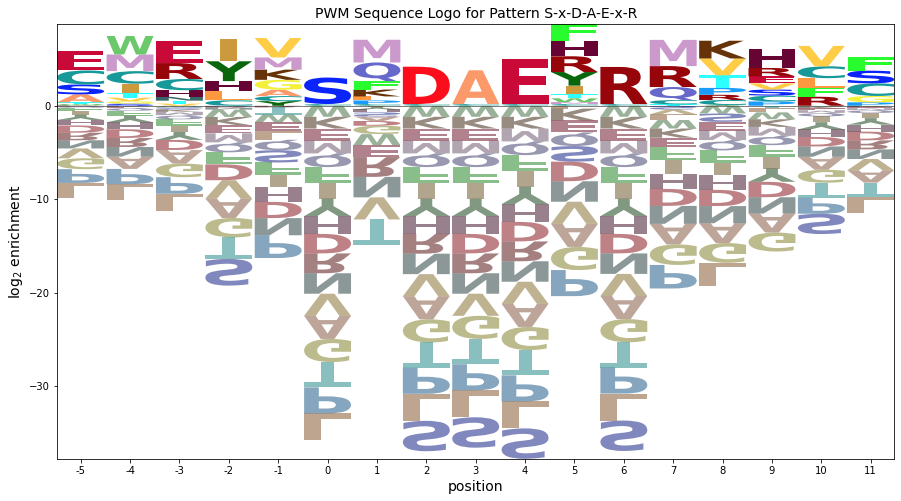

Information Content Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.396477,0.0,0.000000,0.396477,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.925113,0.264318,0.000000,0.000000,0.000000
1,0.000000,0.0,0.000000,0.000000,0.000000,0.155609,0.000000,0.155609,0.000000,0.000000,0.233414,0.000000,0.000000,0.000000,0.000000,0.311219,0.233414,0.155609,0.233414,0.000000
2,0.000000,0.0,0.000000,0.348292,0.000000,0.000000,0.139317,0.000000,0.000000,0.000000,0.000000,0.139317,0.000000,0.000000,0.417951,0.208975,0.208975,0.139317,0.000000,0.000000
3,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.191694,0.460065,0.000000,0.383388,0.000000,0.076678,0.153355,0.000000,0.076678,0.000000,0.000000,0.000000,0.000000,0.421726
4,0.158559,0.0,0.000000,0.000000,0.000000,0.211412,0.000000,0.000000,0.079280,0.052853,0.105706,0.000000,0.000000,0.000000,0.052853,0.052853,0.052853,0.422825,0.000000,0.079280
5,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.187665,0.000000,0.000000,0.000000,0.000000
6,0.043893,0.0,0.029262,0.000000,0.073154,0.029262,0.029262,0.029262,0.043893,0.131678,0.190201,0.000000,0.117047,0.146309,0.000000,0.087785,0.000000,0.000000,0.000000,0.029262
7,0.000000,0.0,4.348314,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,3.969354,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


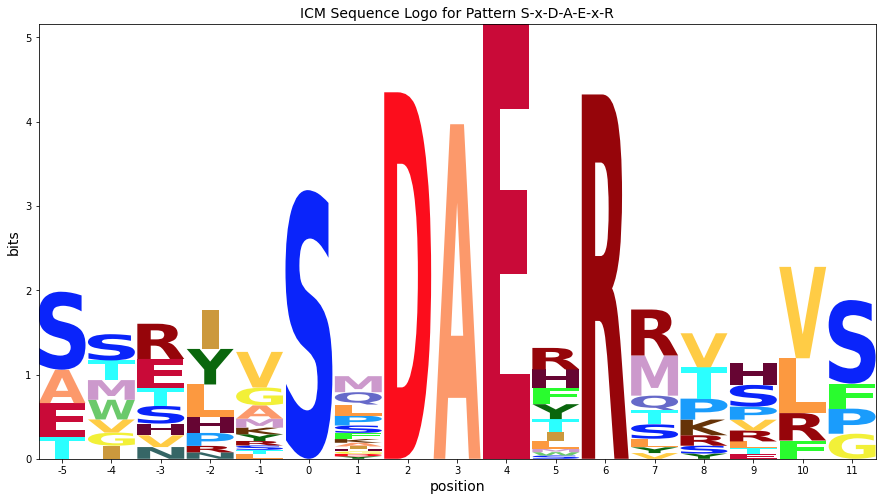

X^2 Critical Value = 40.35207144403784
Chi Square Tests


,index,Position,X^2,p-value,Critical pBH,Critical pBY,AAmax,PWMSmax,AAmin,PWMSmin
0,9,4,2327.5838068181824,0.000000e+00,0.002941,0.000855,E,4.803989368211857,S,-3.255278266472247
1,7,2,1297.7334547662415,1.079412e-263,0.005882,0.001710,D,3.992833646401644,S,-3.255278266472247
2,11,6,1273.5594322180473,1.633824e-258,0.008824,0.002565,R,3.9670496206314105,S,-3.255278266472247
3,8,3,982.4681960375391,2.928505e-196,0.011765,0.003420,A,3.613872886260614,S,-3.255278266472247
4,5,0,543.46061922868,4.133672e-103,0.014706,0.004276,S,2.832184574778092,L,-2.888077242309179
5,12,7,204.15294136635953,5.074043e-33,0.017647,0.005131,M,2.8061306903844483,P,-2.5170600942003207
6,3,-2,146.61350437765927,9.841641e-22,0.020588,0.005986,I,2.3968196719908343,S,-2.8567288899819725
7,10,5,126.93004427649515,5.542384e-18,0.023529,0.006841,F,1.7750399068518723,P,-2.7900785886067365
8,6,1,119.45243390448721,1.403947e-16,0.026471,0.007696,M,2.4335765224271184,T,-2.7040653498124185
9,13,8,105.78652147613687,4.735273e-14,0.029412,0.008551,K,1.9008856351112824,L,-2.53259658771079


----------------------------------------------------------------------
M Pattern: N-S-E-[FW]-R
Position Probability Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.000000,0.0,0.153846,0.000000,0.000000,0.000000,0.153846,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.538462,0.000000,0.000000,0.000000,0.153846
1,0.200000,0.0,0.000000,0.000000,0.000000,0.080000,0.000000,0.000000,0.080000,0.000000,0.000000,0.080000,0.000000,0.000000,0.120000,0.280000,0.000000,0.000000,0.000000,0.160000
2,0.093750,0.0,0.000000,0.000000,0.000000,0.125000,0.000000,0.156250,0.000000,0.062500,0.218750,0.000000,0.000000,0.000000,0.000000,0.062500,0.062500,0.218750,0.000000,0.000000
3,0.142857,0.0,0.000000,0.085714,0.142857,0.000000,0.200000,0.057143,0.114286,0.000000,0.000000,0.000000,0.142857,0.000000,0.000000,0.000000,0.000000,0.057143,0.057143,0.000000
4,0.000000,0.0,0.000000,0.031250,0.062500,0.078125,0.046875,0.000000,0.000000,0.000000,0.031250,0.000000,0.000000,0.109375,0.000000,0.046875,0.187500,0.265625,0.140625,0.000000
5,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
6,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000
7,0.000000,0.0,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,0.000000,0.0,0.000000,0.000000,0.905405,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.094595,0.000000


Position Weight Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,-1.075041,1.585113,0.888883,0.115076,-0.285842,-1.076185,1.086902,-0.303620,0.136599,-1.489528,0.024771,-0.791869,-1.391529,-0.067364,-0.721864,1.143271,-1.305516,-0.968307,0.218441,1.120140
1,1.062463,1.137654,-1.143539,-0.332383,-0.733301,0.061318,-0.945520,-0.751079,1.274103,-1.936987,-0.422688,0.345634,-1.838988,-0.514823,0.830677,0.695812,-1.752975,-1.415766,-0.229018,1.409646
2,0.268914,0.929067,-1.352125,-0.540970,-0.941888,0.589697,-1.154106,1.625297,-0.519446,-0.560611,2.368725,-1.447915,-2.047575,-0.723409,-1.377909,-0.927812,-0.376599,1.375648,-0.437605,-1.120868
3,0.772956,0.848147,-1.433045,1.378110,1.562155,-1.813151,1.764974,0.544377,1.721562,-2.226493,-0.712195,-1.528835,0.456468,-0.804329,-1.458829,-2.593694,-2.042482,-0.120310,1.066438,-1.201788
4,-2.422964,0.237190,-2.044003,0.352115,0.688162,0.160854,0.154016,-1.651543,-1.211324,-2.837451,0.261810,-2.139793,-2.739453,1.584713,-2.069787,-1.204652,1.047000,1.853695,2.192446,-1.812746
5,-2.585235,0.074918,-2.206275,-1.395119,-1.796037,-2.586380,-2.008255,-1.813815,-1.373595,-2.999723,-1.485424,3.926755,-2.901724,-1.577558,-2.232059,-3.366924,-2.815711,-2.478501,-1.291754,-1.975018
6,-2.585235,0.074918,-2.206275,-1.395119,-1.796037,-2.586380,-2.008255,-1.813815,-1.373595,-2.999723,-1.485424,-2.302064,-2.901724,-1.577558,-2.232059,2.861895,-2.815711,-2.478501,-1.291754,-1.975018
7,-2.585235,0.074918,-2.206275,4.833700,-1.796037,-2.586380,-2.008255,-1.813815,-1.373595,-2.999723,-1.485424,-2.302064,-2.901724,-1.577558,-2.232059,-3.366924,-2.815711,-2.478501,-1.291754,-1.975018
8,-2.585235,0.074918,-2.206275,-1.395119,4.291426,-2.586380,-2.008255,-1.813815,-1.373595,-2.999723,-1.485424,-2.302064,-2.901724,-1.577558,-2.232059,-3.366924,-2.815711,-2.478501,1.708246,-1.975018


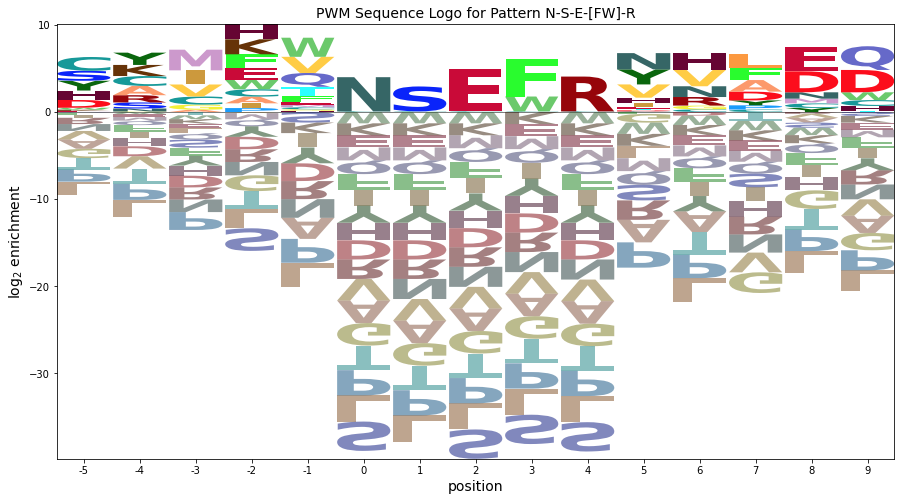

Information Content Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.000000,0.0,0.317253,0.000000,0.000000,0.000000,0.317253,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.110385,0.000000,0.000000,0.000000,0.317253
1,0.273355,0.0,0.000000,0.000000,0.000000,0.109342,0.000000,0.000000,0.109342,0.000000,0.000000,0.109342,0.000000,0.000000,0.164013,0.382697,0.000000,0.000000,0.000000,0.218684
2,0.135152,0.0,0.000000,0.000000,0.000000,0.180203,0.000000,0.225253,0.000000,0.090101,0.315354,0.000000,0.000000,0.000000,0.000000,0.090101,0.090101,0.315354,0.000000,0.000000
3,0.211430,0.0,0.000000,0.126858,0.211430,0.000000,0.296002,0.084572,0.169144,0.000000,0.000000,0.000000,0.211430,0.000000,0.000000,0.000000,0.000000,0.084572,0.084572,0.000000
4,0.000000,0.0,0.000000,0.043313,0.086627,0.108284,0.064970,0.000000,0.000000,0.000000,0.043313,0.000000,0.000000,0.151597,0.000000,0.064970,0.259881,0.368164,0.194910,0.000000
5,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,4.252525,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
6,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.187665,0.000000,0.000000,0.000000,0.000000
7,0.000000,0.0,0.000000,5.159470,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,0.000000,0.0,0.000000,0.000000,3.942707,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.411925,0.000000


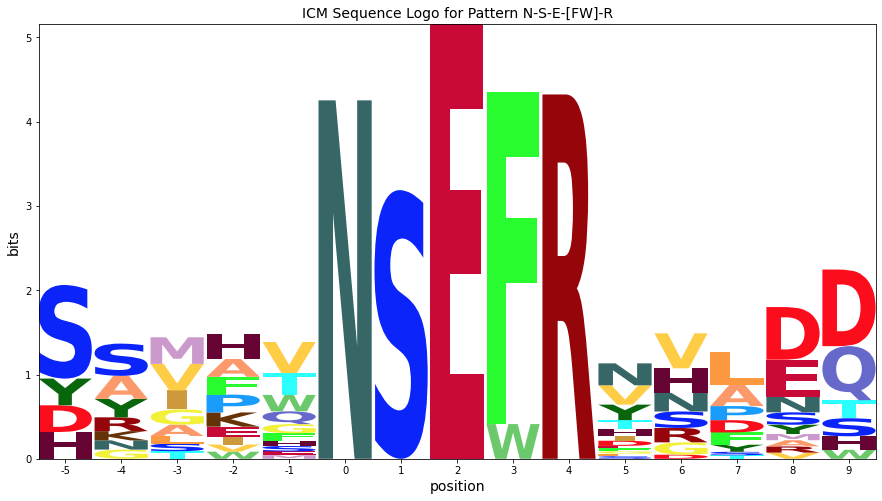

X^2 Critical Value = 39.938849338465694
Chi Square Tests


,index,Position,X^2,p-value,Critical pBH,Critical pBY,AAmax,PWMSmax,AAmin,PWMSmin
0,7,2,2570.7642045454554,0.000000e+00,0.003333,0.001005,E,4.8336998616284905,S,-3.366923622301156
1,8,3,1593.467202026381,0.000000e+00,0.006667,0.002009,F,4.291425773636006,S,-3.366923622301156
2,9,4,1406.6178803602315,4.855238e-287,0.010000,0.003014,R,3.996760114048043,S,-3.3669236223011567
3,5,0,1336.4874815347905,5.324951e-272,0.013333,0.004018,N,3.926754619515509,S,-3.366923622301156
4,6,1,600.2400869092884,4.491074e-115,0.016667,0.005023,S,2.8618950681947246,L,-2.9997225981380886
5,14,9,223.36123744276992,7.293938e-37,0.020000,0.006027,Q,2.723273930157352,L,-2.399330056847326
6,13,8,200.28951939751676,2.981960e-32,0.023333,0.007032,E,2.75138528417317,L,-2.5536582032386193
7,4,-1,136.68884957127509,7.824266e-20,0.026667,0.008036,W,2.192445553615939,L,-2.8374511692392117
8,11,6,135.58157432485055,1.271586e-19,0.030000,0.009041,H,1.9069232624070014,L,-2.784983749345076
9,10,5,130.53969106830746,1.152404e-18,0.033333,0.010046,N,1.8678609304619402,P,-2.901723944435646


----------------------------------------------------------------------
N Pattern: L-x-D-A-E-[FW]
Position Probability Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.178571,0.000000,0.000000,0.000000,0.000000,0.357143,0.000000,0.000000,0.071429,0.000000,0.142857,0.142857,0.107143
1,0.000000,0.0,0.178571,0.000000,0.000000,0.214286,0.000000,0.000000,0.071429,0.071429,0.000000,0.000000,0.107143,0.000000,0.357143,0.000000,0.000000,0.000000,0.000000,0.000000
2,0.054054,0.0,0.000000,0.000000,0.000000,0.054054,0.054054,0.000000,0.000000,0.270270,0.189189,0.000000,0.000000,0.000000,0.135135,0.108108,0.081081,0.000000,0.054054,0.000000
3,0.054054,0.0,0.054054,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.513514,0.000000,0.000000,0.054054,0.054054,0.000000,0.000000,0.000000,0.189189,0.081081,0.000000
4,0.000000,0.0,0.000000,0.000000,0.076923,0.046154,0.169231,0.030769,0.030769,0.000000,0.000000,0.000000,0.107692,0.046154,0.000000,0.230769,0.000000,0.076923,0.000000,0.184615
5,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
6,0.000000,0.0,0.153846,0.153846,0.000000,0.076923,0.200000,0.000000,0.000000,0.000000,0.030769,0.107692,0.030769,0.000000,0.000000,0.169231,0.000000,0.076923,0.000000,0.000000
7,0.000000,0.0,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,1.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


Position Weight Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,-1.615609,1.044545,-1.236648,-0.425492,-0.826411,-1.616754,-1.038629,1.740774,-0.403969,-2.030096,-0.515797,-1.332438,1.527334,-0.607932,-1.262432,-0.812335,-1.846084,0.813053,1.999800,0.994609
1,-1.615609,1.044545,1.348314,-0.425492,-0.826411,1.190601,-1.038629,-0.844188,1.180994,-0.445134,-0.515797,-1.332438,0.067902,-0.607932,2.196999,-2.397297,-1.846084,-1.508875,-0.322128,-1.005391
2,-0.278574,0.796617,-1.484576,-0.673420,-1.074338,-0.279719,0.298406,-1.092116,-0.651896,1.181408,2.236275,-1.580365,-2.180025,-0.855859,1.074603,-0.323297,-0.094012,-1.756803,1.014907,-1.253319
3,-0.278574,0.796617,0.100387,-0.673420,-1.074338,-1.864681,-1.286556,-1.092116,-0.651896,2.043904,-0.763725,-1.580365,-0.595063,0.729103,-1.510360,-2.645225,-2.094012,1.243197,1.429945,-1.253319
4,-2.440037,0.220116,-2.061077,-1.249921,0.934123,-0.441182,1.721905,-0.083654,0.356565,-2.854525,-1.340226,-2.156866,0.243474,0.567640,-2.086861,0.778274,-2.670513,0.251659,-1.146556,1.870620
5,-2.440037,0.220116,-2.061077,-1.249921,-1.650839,-2.441182,-1.863057,-1.668617,-1.228397,3.189869,-1.340226,-2.156866,-2.756526,-1.432360,-2.086861,-3.221726,-2.670513,-2.333304,-1.146556,-1.829820
6,-2.440037,0.220116,1.398355,2.209511,-1.650839,0.143780,1.944298,-1.668617,-1.228397,-2.854525,0.244737,0.843134,-1.171564,-1.432360,-2.086861,0.363237,-2.670513,0.251659,-1.146556,-1.829820
7,-2.440037,0.220116,3.983317,-1.249921,-1.650839,-2.441182,-1.863057,-1.668617,-1.228397,-2.854525,-1.340226,-2.156866,-2.756526,-1.432360,-2.086861,-3.221726,-2.670513,-2.333304,-1.146556,-1.829820
8,3.604357,0.220116,-2.061077,-1.249921,-1.650839,-2.441182,-1.863057,-1.668617,-1.228397,-2.854525,-1.340226,-2.156866,-2.756526,-1.432360,-2.086861,-3.221726,-2.670513,-2.333304,-1.146556,-1.829820


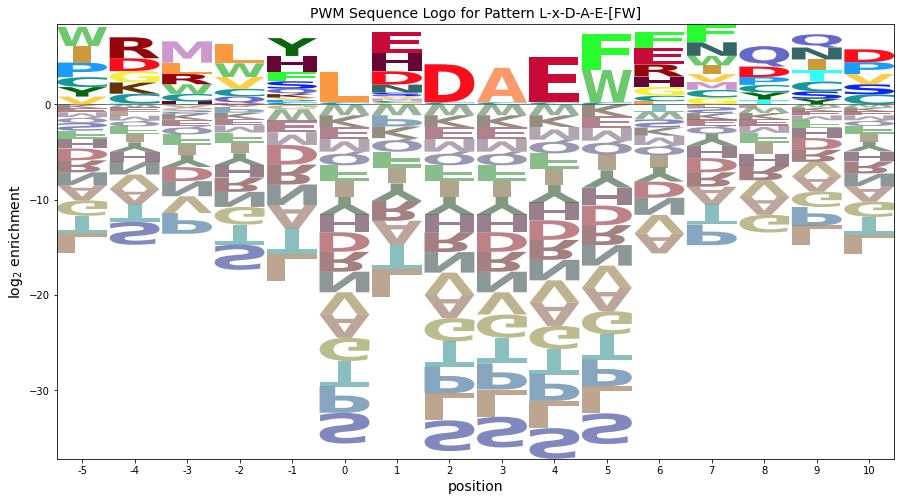

Information Content Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.323215,0.000000,0.000000,0.000000,0.000000,0.646430,0.000000,0.000000,0.129286,0.000000,0.258572,0.258572,0.193929
1,0.000000,0.0,0.329682,0.000000,0.000000,0.395618,0.000000,0.000000,0.131873,0.131873,0.000000,0.000000,0.197809,0.000000,0.659363,0.000000,0.000000,0.000000,0.000000,0.000000
2,0.065145,0.0,0.000000,0.000000,0.000000,0.065145,0.065145,0.000000,0.000000,0.325725,0.228007,0.000000,0.000000,0.000000,0.162862,0.130290,0.097717,0.000000,0.065145,0.000000
3,0.096605,0.0,0.096605,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.917745,0.000000,0.000000,0.096605,0.096605,0.000000,0.000000,0.000000,0.338116,0.144907,0.000000
4,0.000000,0.0,0.000000,0.000000,0.087344,0.052406,0.192156,0.034937,0.034937,0.000000,0.000000,0.000000,0.122281,0.052406,0.000000,0.262031,0.000000,0.087344,0.000000,0.209625
5,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.554866,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
6,0.000000,0.0,0.200456,0.200456,0.000000,0.100228,0.260593,0.000000,0.000000,0.000000,0.040091,0.140319,0.040091,0.000000,0.000000,0.220501,0.000000,0.100228,0.000000,0.000000
7,0.000000,0.0,4.348314,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,3.969354,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


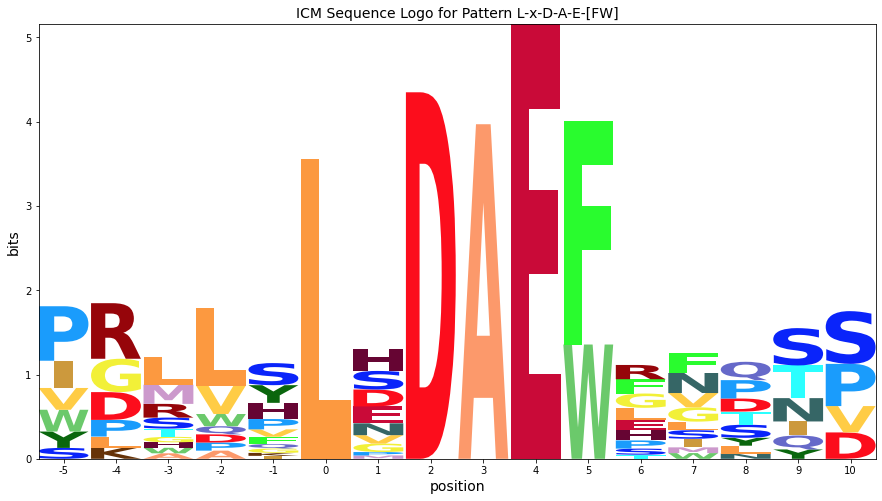

X^2 Critical Value = 40.15223303520055
Chi Square Tests


,index,Position,X^2,p-value,Critical pBH,Critical pBY,AAmax,PWMSmax,AAmin,PWMSmin
0,9,4,2258.103693181817,0.000000e+00,0.003125,0.000924,E,4.7944732060309985,S,-3.22172570676122
1,7,2,1258.9951426836676,2.154813e-255,0.006250,0.001849,D,3.983317484220785,S,-3.22172570676122
2,10,5,990.8921495406983,4.665090e-198,0.009375,0.002773,F,3.8085924665628994,S,-3.22172570676122
3,8,3,953.1407872005975,5.289004e-190,0.012500,0.003697,A,3.6043567240797554,S,-3.22172570676122
4,5,0,698.8968682127095,6.155730e-136,0.015625,0.004622,L,3.189869436760301,S,-3.22172570676122
5,6,1,128.74998675158733,2.512716e-18,0.018750,0.005546,E,2.2095107053098424,L,-2.854524682598152
6,3,-2,117.99995920954973,2.620837e-16,0.021875,0.006470,L,2.0439043342621694,S,-2.6452247847882613
7,4,-1,99.79268917481619,5.838968e-13,0.025000,0.007395,Y,1.870620077873693,L,-2.8545246825981527
8,1,-4,92.6725988966874,1.110993e-11,0.028125,0.008319,R,2.19699939314594,S,-2.397297271344675
9,0,-5,81.35990343421106,1.082763e-09,0.031250,0.009244,W,1.9998004756735432,L,-2.030096247181607


----------------------------------------------------------------------
O Pattern: T-A-E-[FW]-R
Position Probability Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.000000,0.000000,0.166667,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.111111,0.083333,0.000000,0.000000,0.055556,0.194444,0.000000,0.000000,0.000000,0.388889
1,0.000000,0.000000,0.152174,0.108696,0.000000,0.195652,0.000000,0.000000,0.000000,0.000000,0.000000,0.086957,0.065217,0.000000,0.000000,0.065217,0.000000,0.086957,0.108696,0.130435
2,0.078431,0.117647,0.000000,0.000000,0.000000,0.137255,0.000000,0.000000,0.078431,0.000000,0.058824,0.098039,0.000000,0.000000,0.196078,0.137255,0.000000,0.039216,0.000000,0.058824
3,0.145455,0.000000,0.090909,0.036364,0.000000,0.163636,0.000000,0.054545,0.000000,0.090909,0.109091,0.000000,0.036364,0.000000,0.145455,0.127273,0.000000,0.000000,0.000000,0.000000
4,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.241935,0.112903,0.000000,0.000000,0.000000,0.161290,0.112903,0.000000,0.032258,0.064516,0.000000,0.000000,0.096774,0.177419
5,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000
6,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
7,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,0.000000,0.000000,0.000000,0.000000,0.549296,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.450704,0.000000


Position Weight Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,-1.838001,0.822152,1.348314,-0.647885,-1.048803,-1.839146,-1.261021,-1.066581,-0.626361,-2.252489,1.583738,0.445170,-2.154490,-0.830324,0.100138,0.380310,-2.068477,-1.731268,-0.544520,2.679107
1,-2.075041,0.585113,1.303920,1.700038,-1.285842,1.245743,-1.498061,-1.303620,-0.863401,-2.489528,-0.975229,0.530059,-0.391529,-1.067364,-1.721864,-0.856729,-2.305516,0.353621,1.803403,1.342532
2,0.141535,3.287115,-1.801433,-0.990277,-1.391195,0.818462,-1.603414,-1.408973,1.353175,-2.594881,0.919418,0.687740,-2.496882,-1.172717,1.632215,0.037918,-2.410869,-0.488697,-0.886912,0.429824
3,0.910460,0.400688,0.704458,0.515614,-1.470267,1.061318,-1.682485,0.511955,-1.047825,-0.088990,1.647701,-1.976294,-0.990991,-1.251788,1.263637,-0.041153,-2.489941,-2.152731,-0.965984,-1.649247
4,-2.388198,0.271955,-2.009238,-1.198082,-1.599000,-2.389343,2.188782,1.383222,-1.176558,-2.802686,-1.288387,1.354404,0.295313,-1.380521,-0.450059,-0.847959,-2.618674,-2.281465,1.712638,1.806982
5,-2.538441,0.121713,-2.159480,-1.348325,-1.749243,-2.539586,-1.961461,-1.767021,-1.326801,-2.952928,-1.438630,-2.255270,-2.854930,-1.530764,-2.185264,-3.320129,3.401009,-2.431707,-1.244960,-1.928223
6,3.631484,0.121713,-2.159480,-1.348325,-1.749243,-2.539586,-1.961461,-1.767021,-1.326801,-2.952928,-1.438630,-2.255270,-2.854930,-1.530764,-2.185264,-3.320129,-2.768916,-2.431707,-1.244960,-1.928223
7,-2.538441,0.121713,-2.159480,4.821600,-1.749243,-2.539586,-1.961461,-1.767021,-1.326801,-2.952928,-1.438630,-2.255270,-2.854930,-1.530764,-2.185264,-3.320129,-2.768916,-2.431707,-1.244960,-1.928223
8,-2.538441,0.121713,-2.159480,-1.348325,3.572685,-2.539586,-1.961461,-1.767021,-1.326801,-2.952928,-1.438630,-2.255270,-2.854930,-1.530764,-2.185264,-3.320129,-2.768916,-2.431707,3.799434,-1.928223


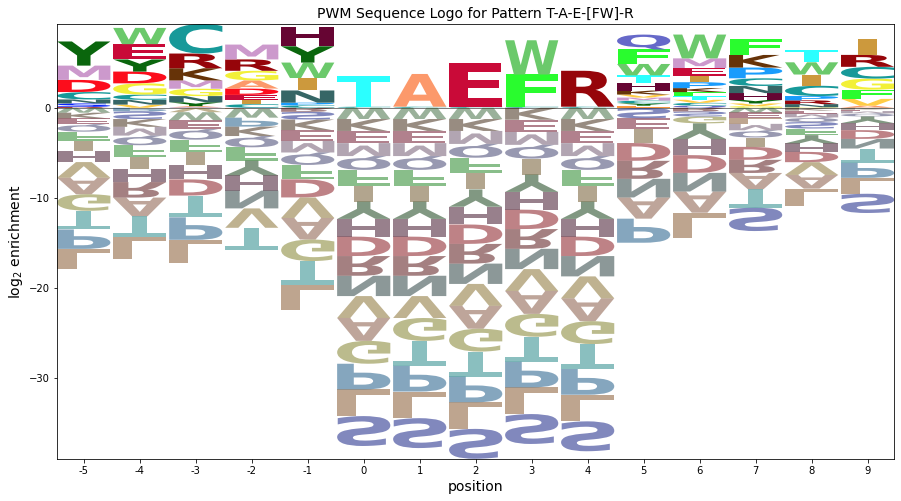

Information Content Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.000000,0.00000,0.330086,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.220058,0.165043,0.000000,0.000000,0.110029,0.385101,0.000000,0.000000,0.000000,0.770201
1,0.000000,0.00000,0.191583,0.136845,0.000000,0.246321,0.000000,0.000000,0.000000,0.000000,0.000000,0.109476,0.082107,0.000000,0.000000,0.082107,0.000000,0.109476,0.136845,0.164214
2,0.101367,0.15205,0.000000,0.000000,0.000000,0.177391,0.000000,0.000000,0.101367,0.000000,0.076025,0.126708,0.000000,0.000000,0.253416,0.177391,0.000000,0.050683,0.000000,0.076025
3,0.137072,0.00000,0.085670,0.034268,0.000000,0.154206,0.000000,0.051402,0.000000,0.085670,0.102804,0.000000,0.034268,0.000000,0.137072,0.119938,0.000000,0.000000,0.000000,0.000000
4,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.383790,0.179102,0.000000,0.000000,0.000000,0.255860,0.179102,0.000000,0.051172,0.102344,0.000000,0.000000,0.153516,0.281446
5,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.738878,0.000000,0.000000,0.000000
6,3.969354,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
7,0.000000,0.00000,0.000000,5.159470,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,0.000000,0.00000,0.000000,0.000000,2.193260,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.799598,0.000000


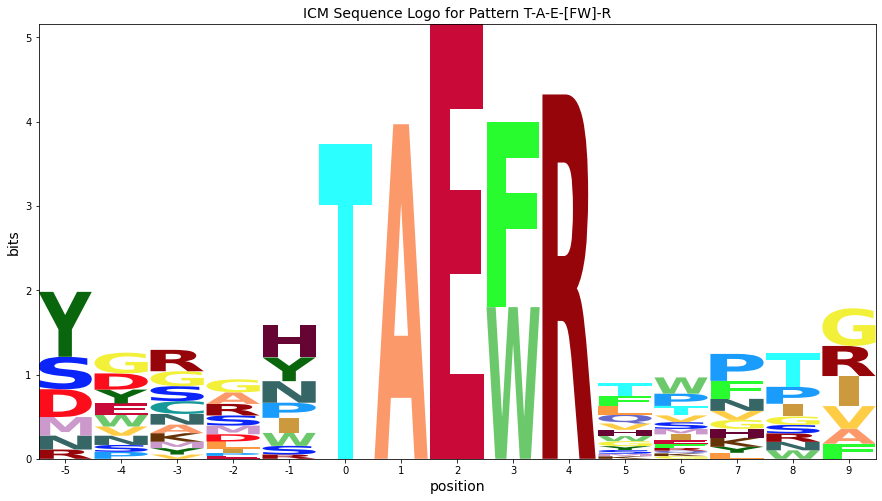

X^2 Critical Value = 39.938849338465694
Chi Square Tests


,index,Position,X^2,p-value,Critical pBH,Critical pBY,AAmax,PWMSmax,AAmin,PWMSmin
0,7,2,2466.54403409091,0.000000e+00,0.003333,0.001005,E,4.821600384053863,S,-3.3201294108222146
1,9,4,1349.5928311564378,8.250739e-275,0.006667,0.002009,R,3.9846606364734156,S,-3.3201294108222155
2,8,3,1062.6281733759938,2.234024e-213,0.010000,0.003014,W,3.799434360667095,S,-3.3201294108222146
3,6,1,1041.1230137114221,8.781029e-209,0.013333,0.004018,A,3.6314839021026195,S,-3.3201294108222137
4,5,0,876.9224758897893,9.268044e-174,0.016667,0.005023,T,3.4010085072799257,S,-3.3201294108222155
5,4,-1,157.21038965560496,8.828637e-24,0.020000,0.006027,H,2.1887815425324506,L,-2.802685751078535
6,0,-5,148.8589860810347,3.637025e-22,0.023333,0.007032,Y,2.679106969421216,L,-2.2524886685180556
7,2,-3,119.01864967487734,1.691872e-16,0.026667,0.008036,C,3.2871149441557326,L,-2.5948808659651332
8,11,6,103.25443690182333,1.373055e-13,0.030000,0.009041,W,2.641346504761067,L,-2.7670618413478127
9,1,-4,79.00063757312539,2.763171e-09,0.033333,0.010046,W,1.8034032628700403,L,-2.4895278658189044


----------------------------------------------------------------------
P Pattern: S-A-E-x-R-[FL]
Position Probability Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.095238,0.0,0.000000,0.000000,0.000000,0.095238,0.142857,0.000000,0.238095,0.000000,0.142857,0.000000,0.000000,0.000000,0.190476,0.000000,0.000000,0.095238,0.000000,0.000000
1,0.068966,0.0,0.068966,0.000000,0.000000,0.137931,0.000000,0.000000,0.000000,0.172414,0.000000,0.172414,0.068966,0.068966,0.103448,0.137931,0.000000,0.000000,0.000000,0.000000
2,0.129032,0.0,0.064516,0.000000,0.096774,0.000000,0.129032,0.064516,0.000000,0.000000,0.161290,0.000000,0.000000,0.000000,0.000000,0.161290,0.064516,0.000000,0.064516,0.064516
3,0.000000,0.0,0.000000,0.065217,0.043478,0.000000,0.043478,0.195652,0.000000,0.000000,0.000000,0.282609,0.043478,0.000000,0.000000,0.065217,0.043478,0.108696,0.000000,0.108696
4,0.130435,0.0,0.000000,0.000000,0.000000,0.000000,0.043478,0.043478,0.000000,0.000000,0.000000,0.108696,0.260870,0.043478,0.000000,0.086957,0.108696,0.173913,0.000000,0.000000
5,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000
6,1.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
7,0.000000,0.0,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,0.000000,0.0,0.000000,0.000000,0.217391,0.000000,0.086957,0.000000,0.000000,0.000000,0.043478,0.043478,0.000000,0.000000,0.000000,0.065217,0.000000,0.000000,0.108696,0.434783


Position Weight Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.196764,1.271955,-1.009238,-0.198082,-0.599000,0.195619,1.188782,-0.616778,2.408404,-1.802686,1.711613,-1.105027,-1.704687,-0.380521,1.286906,-2.169887,-1.618674,0.303498,-0.094717,-0.777981
1,-0.060394,1.014797,0.318567,-0.455240,-0.856158,0.675427,-1.068376,-0.873936,-0.433716,0.525119,-0.545545,1.222777,-0.376882,0.947283,0.707820,-0.105117,-1.875832,-1.538622,-0.351875,-1.035139
2,0.618856,0.957082,0.260851,-0.512955,1.086126,-1.704216,1.195836,0.653311,-0.491432,-2.117559,1.981702,-1.419901,-2.019560,-0.695395,-1.349895,0.100202,-0.348585,-1.596338,1.175372,0.492108
3,-2.075041,0.585113,-1.696080,1.115076,0.299120,-2.076185,0.086902,2.018308,-0.863401,-2.489528,-0.975229,2.015486,-0.806567,-1.067364,-1.721864,-0.856729,-0.720553,0.616656,-0.781559,1.120140
4,0.732314,0.585113,-1.696080,-0.884924,-1.285842,-2.076185,0.086902,0.281342,-0.863401,-2.489528,-0.975229,0.793093,1.308911,0.517599,-1.721864,-0.534801,0.279447,1.201618,-0.781559,-1.464823
5,-2.075041,0.585113,-1.696080,-0.884924,-1.285842,-2.076185,-1.498061,-1.303620,-0.863401,-2.489528,-0.975229,-1.791869,-2.391529,-1.067364,-1.721864,2.697860,-2.305516,-1.968307,-0.781559,-1.464823
6,3.479548,0.585113,-1.696080,-0.884924,-1.285842,-2.076185,-1.498061,-1.303620,-0.863401,-2.489528,-0.975229,-1.791869,-2.391529,-1.067364,-1.721864,-2.856729,-2.305516,-1.968307,-0.781559,-1.464823
7,-2.075041,0.585113,-1.696080,4.669665,-1.285842,-2.076185,-1.498061,-1.303620,-0.863401,-2.489528,-0.975229,-1.791869,-2.391529,-1.067364,-1.721864,-2.856729,-2.305516,-1.968307,-0.781559,-1.464823
8,-2.075041,0.585113,-1.696080,-0.884924,2.173589,-2.076185,0.823868,-1.303620,-0.863401,-2.489528,0.609733,-0.206907,-2.391529,-1.067364,-1.721864,-0.856729,-2.305516,-1.968307,1.803403,2.927495


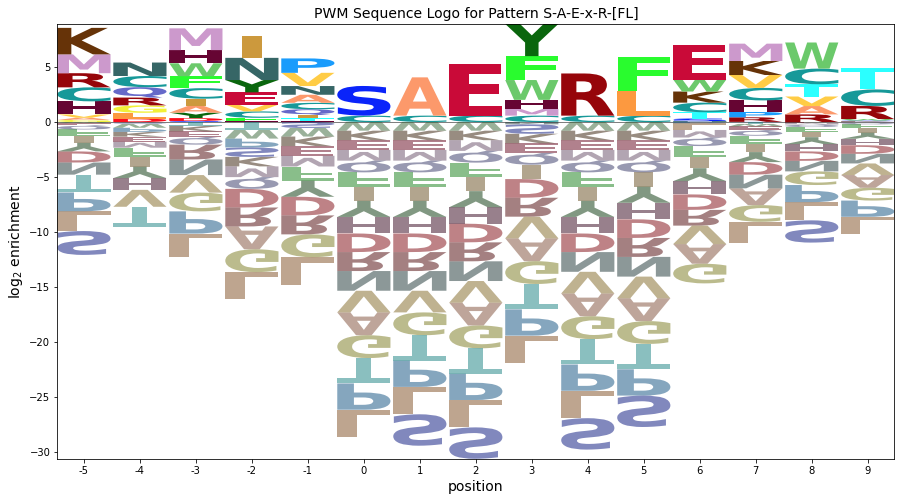

Information Content Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.176642,0.0,0.000000,0.000000,0.000000,0.176642,0.264963,0.000000,0.441606,0.000000,0.264963,0.000000,0.000000,0.000000,0.353285,0.000000,0.000000,0.176642,0.000000,0.000000
1,0.060918,0.0,0.060918,0.000000,0.000000,0.121835,0.000000,0.000000,0.000000,0.152294,0.000000,0.152294,0.060918,0.060918,0.091377,0.121835,0.000000,0.000000,0.000000,0.000000
2,0.147169,0.0,0.073585,0.000000,0.110377,0.000000,0.147169,0.073585,0.000000,0.000000,0.183961,0.000000,0.000000,0.000000,0.000000,0.183961,0.073585,0.000000,0.073585,0.073585
3,0.000000,0.0,0.000000,0.089239,0.059492,0.000000,0.059492,0.267716,0.000000,0.000000,0.000000,0.386701,0.059492,0.000000,0.000000,0.089239,0.059492,0.148731,0.000000,0.148731
4,0.133724,0.0,0.000000,0.000000,0.000000,0.000000,0.044575,0.044575,0.000000,0.000000,0.000000,0.111436,0.267447,0.044575,0.000000,0.089149,0.111436,0.178298,0.000000,0.000000
5,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.187665,0.000000,0.000000,0.000000,0.000000
6,3.969354,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
7,0.000000,0.0,0.000000,5.159470,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,0.000000,0.0,0.000000,0.000000,0.500101,0.000000,0.200040,0.000000,0.000000,0.000000,0.100020,0.100020,0.000000,0.000000,0.000000,0.150030,0.000000,0.000000,0.250050,1.000202


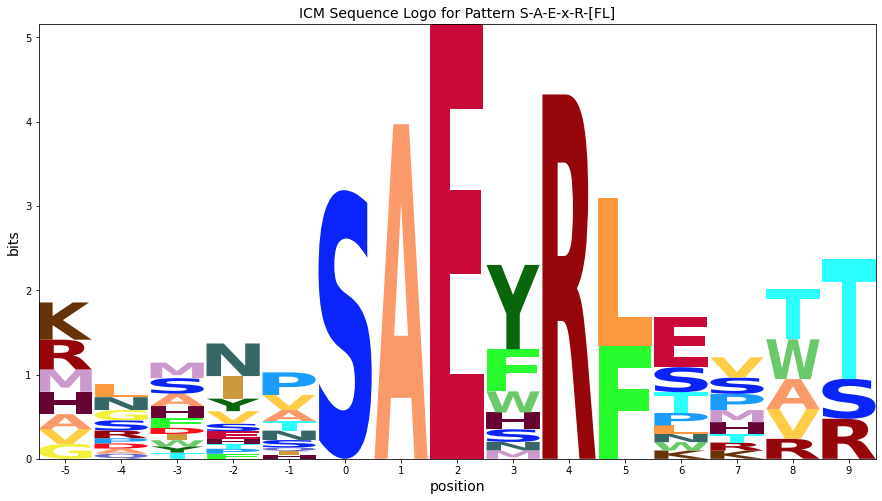

X^2 Critical Value = 39.938849338465694
Chi Square Tests


,index,Position,X^2,p-value,Critical pBH,Critical pBY,AAmax,PWMSmax,AAmin,PWMSmin
0,7,2,1598.0426136363635,0.000000e+00,0.003333,0.001005,E,4.66966475512943,S,-2.8567288899819725
1,9,4,874.384087791495,3.217479e-173,0.006667,0.002009,R,3.8327250075489836,S,-2.8567288899819725
2,6,1,674.5304032496538,8.908012e-131,0.010000,0.003014,A,3.4795482731781866,S,-2.8567288899819725
3,5,0,373.122216186855,1.671259e-67,0.013333,0.004018,S,2.697859961695665,L,-2.4895278658189044
4,10,5,362.08680587968263,3.229616e-65,0.016667,0.005023,F,3.1064750874836102,S,-2.8567288899819725
5,8,3,256.1154724091306,1.782965e-43,0.020000,0.006027,Y,2.927494599290609,L,-2.4895278658189044
6,11,6,152.57342592247522,6.979611e-23,0.023333,0.007032,E,3.10502223878787,G,-1.7866786278873077
7,3,-2,108.68479238748857,1.392085e-14,0.026667,0.008036,I,2.018308048737104,L,-2.4895278658189044
8,14,9,74.56733360701206,1.575760e-08,0.030000,0.009041,T,1.9315232239787052,L,-1.5744167634054174
9,0,-5,71.01084186201905,6.241870e-08,0.033333,0.010046,K,2.40840405040709,S,-2.169886775241603


----------------------------------------------------------------------
Q Pattern: P-Q-x-G-[FL]-L
Position Probability Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.000000,0.0,0.000000,0.133333,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.133333,0.333333,0.133333,0.000000,0.133333,0.133333,0.000000,0.000000,0.0,0.000000
1,0.083333,0.0,0.083333,0.000000,0.125000,0.000000,0.291667,0.083333,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.166667,0.000000,0.0,0.166667
2,0.060606,0.0,0.090909,0.000000,0.060606,0.060606,0.000000,0.121212,0.0,0.000000,0.151515,0.121212,0.060606,0.060606,0.000000,0.060606,0.090909,0.000000,0.0,0.060606
3,0.055556,0.0,0.000000,0.083333,0.083333,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.055556,0.055556,0.166667,0.000000,0.194444,0.250000,0.055556,0.0,0.000000
4,0.131579,0.0,0.000000,0.105263,0.000000,0.184211,0.052632,0.000000,0.0,0.052632,0.000000,0.000000,0.052632,0.000000,0.000000,0.263158,0.105263,0.052632,0.0,0.000000
5,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000
6,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000
7,0.157895,0.0,0.052632,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.289474,0.052632,0.052632,0.078947,0.000000,0.000000,0.184211,0.131579,0.000000,0.0,0.000000
8,0.000000,0.0,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000


Position Weight Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,-1.159929,1.500224,-0.780969,1.615150,-0.370731,-1.161074,-0.582949,-0.388509,0.051711,-1.574417,1.524845,1.708204,0.108544,-0.152252,0.778210,-0.356655,-1.390405,-1.053196,0.133552,-0.549712
1,0.094884,1.170076,0.473845,-0.299962,1.299120,-1.491223,2.086902,0.866305,-0.278438,-1.904565,-0.390267,-1.206907,-1.806567,-0.482401,-1.136901,-2.271766,0.601375,-1.383344,-0.196597,1.442068
2,-0.173604,0.901587,0.620394,-0.568450,0.615594,-0.174749,-1.181587,1.334782,-0.546927,-2.173054,1.926207,0.846532,-0.490093,0.834073,-1.405390,-0.955293,0.010958,-1.651833,-0.465086,0.436613
3,-0.253039,0.822152,-1.459041,1.352115,0.951197,-1.839146,-1.261021,-1.066581,-0.626361,-2.252489,-0.738190,0.030132,-0.569528,1.977031,-1.484825,0.380310,1.253451,-0.146305,-0.544520,-1.227784
4,0.696335,0.771526,-1.509667,1.623417,-1.099429,1.110228,0.273315,-1.117207,-0.676987,-0.718152,-0.788816,-1.605456,-0.620154,-0.880950,-1.535451,0.789116,0.202825,-0.196931,-0.595146,-1.278410
5,-1.888627,0.771526,-1.509667,-0.698511,-1.099429,-1.889772,-1.311647,-1.117207,-0.676987,-2.303115,-0.788816,-1.605456,3.080286,-0.880950,-1.535451,-2.670316,-2.119103,-1.781894,-0.595146,-1.278410
6,-1.888627,0.771526,-1.509667,-0.698511,-1.099429,-1.889772,-1.311647,-1.117207,-0.676987,-2.303115,-0.788816,-1.605456,-2.205116,4.404452,-1.535451,-2.670316,-2.119103,-1.781894,-0.595146,-1.278410
7,0.918727,0.771526,0.075296,-0.698511,-1.099429,-1.889772,-1.311647,-1.117207,-0.676987,1.281848,0.796147,-0.020494,-0.205116,-0.880950,-1.535451,0.329684,0.465860,-1.781894,-0.595146,-1.278410
8,-1.888627,0.771526,-1.509667,-0.698511,-1.099429,3.395630,-1.311647,-1.117207,-0.676987,-2.303115,-0.788816,-1.605456,-2.205116,-0.880950,-1.535451,-2.670316,-2.119103,-1.781894,-0.595146,-1.278410


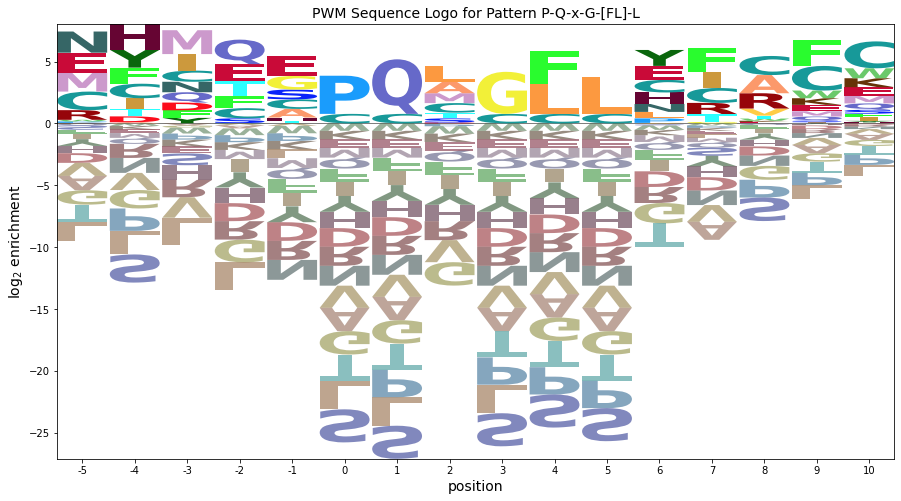

Information Content Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.000000,0.0,0.000000,0.240465,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.240465,0.601162,0.240465,0.000000,0.240465,0.240465,0.000000,0.000000,0.0,0.000000
1,0.145340,0.0,0.145340,0.000000,0.218010,0.000000,0.508690,0.145340,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.290680,0.000000,0.0,0.290680
2,0.052197,0.0,0.078296,0.000000,0.052197,0.052197,0.000000,0.104395,0.0,0.000000,0.130494,0.104395,0.052197,0.052197,0.000000,0.052197,0.078296,0.000000,0.0,0.052197
3,0.065686,0.0,0.000000,0.098529,0.098529,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.065686,0.065686,0.197058,0.000000,0.229901,0.295587,0.065686,0.0,0.000000
4,0.124009,0.0,0.000000,0.099207,0.000000,0.173612,0.049604,0.000000,0.0,0.049604,0.000000,0.000000,0.049604,0.000000,0.000000,0.248018,0.099207,0.049604,0.0,0.000000
5,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,3.652865,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000
6,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,4.977031,0.000000,0.000000,0.000000,0.000000,0.0,0.000000
7,0.159493,0.0,0.053164,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.292403,0.053164,0.053164,0.079746,0.000000,0.000000,0.186075,0.132911,0.000000,0.0,0.000000
8,0.000000,0.0,0.000000,0.000000,0.000000,3.968209,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000


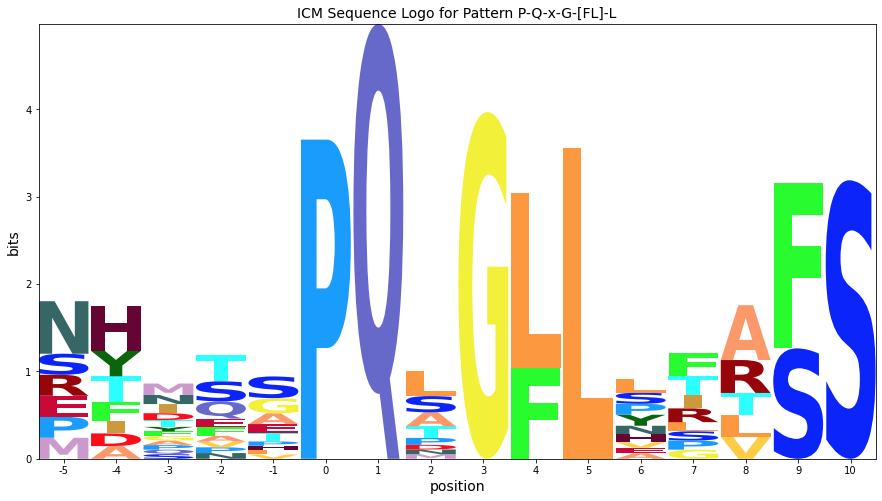

X^2 Critical Value = 40.15223303520055
Chi Square Tests


,index,Position,X^2,p-value,Critical pBH,Critical pBY,AAmax,PWMSmax,AAmin,PWMSmin
0,6,1,1158.7930904994369,6.114584e-234,0.003125,0.000924,Q,4.404451746137811,S,-2.670315765751092
1,8,3,556.7486937049019,6.602522e-106,0.006250,0.001849,G,3.395630098010836,S,-2.670315765751092
2,5,0,439.97535431299525,2.048190e-81,0.009375,0.002773,P,3.0802861309766674,S,-2.670315765751092
3,10,5,408.585861416661,7.171482e-75,0.012500,0.003697,L,2.9822874772742245,S,-2.670315765751092
4,9,4,275.6780638867885,1.873896e-47,0.015625,0.004622,F,2.707925710993335,S,-2.670315765751092
5,1,-4,69.15882715819467,1.268474e-07,0.018750,0.005546,H,2.0869019285132375,S,-2.2717663892608164
6,3,-2,60.76799844301269,2.923739e-06,0.021875,0.006470,Q,1.9770305224031346,L,-2.2524886685180556
7,14,9,51.012677405380465,9.285100e-05,0.025000,0.007395,F,2.114695594288578,L,-1.0889899362351763
8,0,-5,46.37028485095703,4.391887e-04,0.028125,0.008319,N,1.708204264473455,L,-1.5744167634054183
9,7,2,45.45680088025197,5.913260e-04,0.031250,0.009244,L,1.2818477591331332,G,-1.8897721208514113


----------------------------------------------------------------------
R Pattern: A-E-F-R-[AT]
Position Probability Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.000000,0.0,0.000000,0.178571,0.000000,0.000000,0.000000,0.000000,0.000000,0.464286,0.000000,0.214286,0.071429,0.000000,0.000000,0.000000,0.000000,0.071429,0.000000,0.000000
1,0.162791,0.0,0.000000,0.000000,0.000000,0.046512,0.209302,0.046512,0.000000,0.000000,0.116279,0.000000,0.116279,0.000000,0.162791,0.000000,0.000000,0.000000,0.046512,0.093023
2,0.067797,0.0,0.033898,0.084746,0.067797,0.118644,0.033898,0.067797,0.000000,0.084746,0.152542,0.000000,0.000000,0.000000,0.084746,0.118644,0.033898,0.050847,0.000000,0.000000
3,0.169014,0.0,0.098592,0.000000,0.000000,0.056338,0.000000,0.000000,0.000000,0.070423,0.000000,0.154930,0.028169,0.000000,0.056338,0.183099,0.126761,0.000000,0.000000,0.056338
4,0.037500,0.0,0.150000,0.187500,0.000000,0.075000,0.000000,0.025000,0.000000,0.037500,0.000000,0.175000,0.000000,0.000000,0.000000,0.212500,0.100000,0.000000,0.000000,0.000000
5,1.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
6,0.000000,0.0,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
7,0.000000,0.0,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000


Position Weight Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,-1.615609,1.044545,-1.236648,2.159470,-0.826411,-1.616754,-1.038629,-0.844188,-0.403969,1.777259,-0.515797,1.474917,-0.347135,-0.607932,-1.262432,-2.397297,-1.846084,0.076087,-0.322128,-1.005391
1,0.992074,0.652227,-1.628966,-0.817810,-1.218728,-0.424109,1.890982,0.348457,-0.796286,-2.422414,1.676848,-1.724755,0.260547,-1.000249,1.345250,-2.789615,-2.238402,-1.901193,0.870517,0.924219
2,-0.012499,0.325726,-0.370504,1.440652,0.776699,0.664428,-0.172485,0.758921,-1.122787,-0.163952,2.087312,-2.051256,-2.650916,-1.326750,0.603712,-0.116116,-0.979940,-0.227693,-1.040946,-1.724209
3,1.161999,0.121713,0.840520,-1.348325,-1.749243,-0.217658,-1.961461,-1.767021,-1.326801,-0.367966,-1.438630,1.329693,-1.269967,-1.530764,0.136664,0.487226,0.553012,-2.431707,-1.244960,0.393705
4,-0.674503,-0.014349,1.404898,2.515614,-1.885304,0.131708,-2.097523,-0.318120,-1.462863,-1.088990,-1.574691,1.515559,-2.990991,-1.666826,-2.321326,0.713734,0.264947,-2.567769,-1.381021,-2.064285
5,3.671968,-0.042918,-2.324111,-1.512955,-1.913874,-2.704216,-2.126092,-1.931651,-1.491432,-3.117559,-1.603260,-2.419901,-3.019560,-1.695395,-2.349895,-3.484760,-2.933547,-2.596338,-1.409590,-2.092854
6,-2.703072,-0.042918,-2.324111,4.862084,-1.913874,-2.704216,-2.126092,-1.931651,-1.491432,-3.117559,-1.603260,-2.419901,-3.019560,-1.695395,-2.349895,-3.484760,-2.933547,-2.596338,-1.409590,-2.092854
7,-2.703072,-0.042918,-2.324111,-1.512955,4.461166,-2.704216,-2.126092,-1.931651,-1.491432,-3.117559,-1.603260,-2.419901,-3.019560,-1.695395,-2.349895,-3.484760,-2.933547,-2.596338,-1.409590,-2.092854
8,-2.703072,-0.042918,-2.324111,-1.512955,-1.913874,-2.704216,-2.126092,-1.931651,-1.491432,-3.117559,-1.603260,-2.419901,-3.019560,-1.695395,4.025144,-3.484760,-2.933547,-2.596338,-1.409590,-2.092854


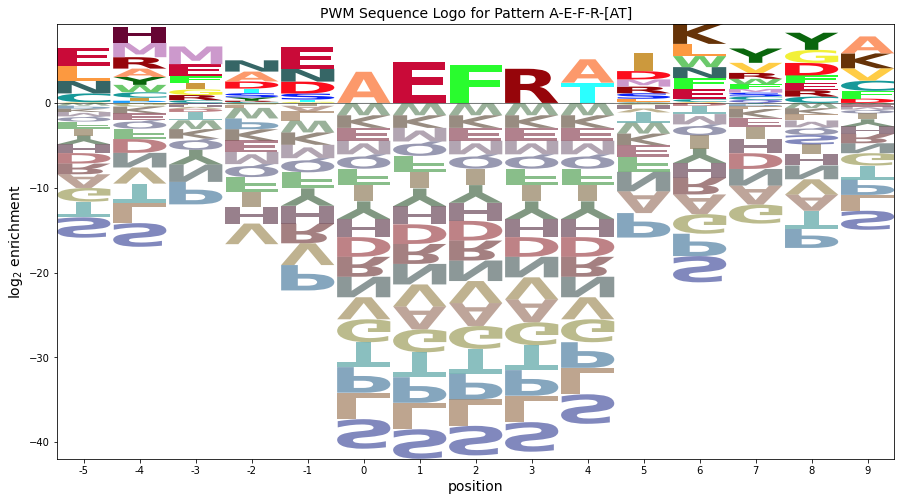

Information Content Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.000000,0.0,0.000000,0.367365,0.000000,0.000000,0.000000,0.000000,0.000000,0.955149,0.000000,0.440838,0.146946,0.000000,0.000000,0.000000,0.000000,0.146946,0.000000,0.000000
1,0.229249,0.0,0.000000,0.000000,0.000000,0.065500,0.294749,0.065500,0.000000,0.000000,0.163749,0.000000,0.163749,0.000000,0.229249,0.000000,0.000000,0.000000,0.065500,0.130999
2,0.048961,0.0,0.024480,0.061201,0.048961,0.085681,0.024480,0.048961,0.000000,0.061201,0.110162,0.000000,0.000000,0.000000,0.061201,0.085681,0.024480,0.036721,0.000000,0.000000
3,0.130537,0.0,0.076147,0.000000,0.000000,0.043512,0.000000,0.000000,0.000000,0.054390,0.000000,0.119659,0.021756,0.000000,0.043512,0.141415,0.097903,0.000000,0.000000,0.043512
4,0.046289,0.0,0.185156,0.231445,0.000000,0.092578,0.000000,0.030859,0.000000,0.046289,0.000000,0.216016,0.000000,0.000000,0.000000,0.262305,0.123438,0.000000,0.000000,0.000000
5,3.969354,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
6,0.000000,0.0,0.000000,5.159470,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
7,0.000000,0.0,0.000000,0.000000,4.758552,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,4.322530,0.000000,0.000000,0.000000,0.000000,0.000000


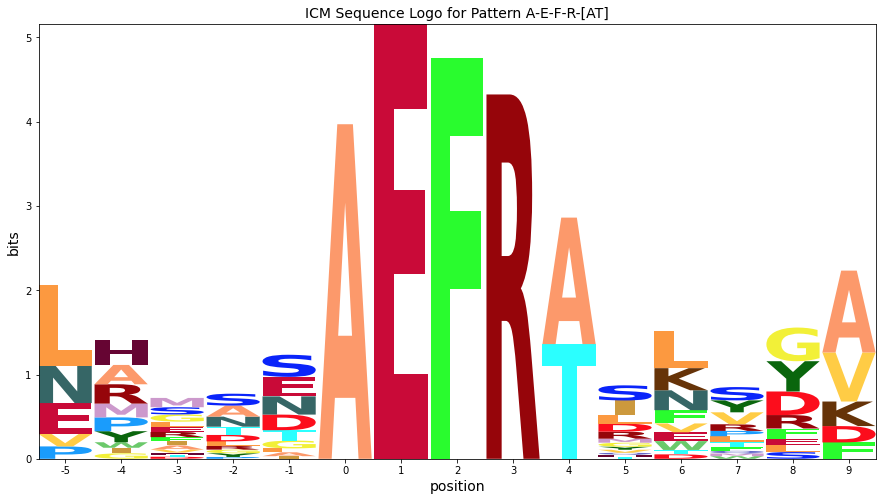

X^2 Critical Value = 39.938849338465694
Chi Square Tests


,index,Position,X^2,p-value,Critical pBH,Critical pBY,AAmax,PWMSmax,AAmin,PWMSmin
0,6,1,2848.684659090909,0.000000e+00,0.003333,0.001005,E,4.862084112185676,S,-3.4847601125950143
1,7,2,2137.6304564159113,0.000000e+00,0.006667,0.002009,F,4.461165873438733,S,-3.4847601125950143
2,8,3,1558.6846782370135,0.000000e+00,0.010000,0.003014,R,4.025144364605229,S,-3.4847601125950143
3,5,0,1202.4237623146003,2.807322e-243,0.013333,0.004018,A,3.6719676302344326,S,-3.4847601125950134
4,9,4,518.8425864274802,6.188831e-98,0.016667,0.005023,A,2.7563598175248045,S,-3.4847601125950143
5,4,-1,158.94177067174397,4.071983e-24,0.020000,0.006027,E,2.515613833035521,P,-2.990991282532733
6,11,6,133.9553999324007,2.592089e-19,0.023333,0.007032,K,2.3550229540790673,S,-3.097736989485767
7,0,-5,103.55698251255052,1.209356e-13,0.026667,0.008036,E,2.1594700228102455,S,-2.397297271344675
8,13,8,96.64441183056371,2.159709e-12,0.030000,0.009041,Y,2.018856341395824,P,-2.2297781421198493
9,14,9,93.9482825491375,6.575410e-12,0.033333,0.010046,A,2.0025204047942013,S,-2.238599525325618


----------------------------------------------------------------------
S Pattern: P-[DS]-A-E-F
Position Probability Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.107143,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.142857,0.357143,0.000000,0.000,0.392857
1,0.100000,0.0,0.000000,0.000000,0.100000,0.000000,0.000000,0.000000,0.000000,0.125000,0.000000,0.000000,0.200000,0.0,0.000000,0.075000,0.275000,0.000000,0.125,0.000000
2,0.000000,0.0,0.000000,0.000000,0.068966,0.000000,0.000000,0.379310,0.103448,0.000000,0.000000,0.000000,0.000000,0.0,0.189655,0.086207,0.086207,0.086207,0.000,0.000000
3,0.052632,0.0,0.000000,0.000000,0.000000,0.000000,0.039474,0.000000,0.000000,0.000000,0.065789,0.092105,0.000000,0.0,0.052632,0.039474,0.381579,0.144737,0.000,0.131579
4,0.113636,0.0,0.000000,0.045455,0.000000,0.079545,0.000000,0.000000,0.000000,0.068182,0.000000,0.056818,0.000000,0.0,0.204545,0.170455,0.056818,0.045455,0.000,0.159091
5,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000,0.000000
6,0.000000,0.0,0.420455,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.579545,0.000000,0.000000,0.000,0.000000
7,1.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000,0.000000
8,0.000000,0.0,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000,0.000000


Position Weight Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.384391,1.044545,-1.236648,-0.425492,-0.826411,-1.616754,-1.038629,-0.844188,-0.403969,-2.030096,-0.515797,-1.332438,-1.932098,-0.607932,-1.262432,-0.075369,1.613347,-1.508875,-0.322128,2.579571
1,0.384391,0.722617,-1.558576,-0.747421,1.173589,-1.938682,-1.360557,-1.166117,-0.725897,0.232938,-0.837725,-1.654366,0.915899,-0.929860,-1.584360,-0.719225,1.416950,-1.830803,1.940907,-1.327319
2,-2.316049,0.344105,-1.937088,-1.125932,0.795078,-2.317193,-1.739069,2.978934,1.702946,-2.730536,-1.216237,-2.032877,-2.632537,-1.308372,1.622091,-0.512774,0.038438,0.375648,-1.022567,-1.705831
3,-0.293681,0.044545,-2.236648,-1.425492,-1.826411,-2.616754,-0.038629,-1.844188,-1.403969,-3.030096,1.069165,0.667562,-2.932098,-1.607932,0.059496,-1.397297,2.060806,1.076087,-1.322128,1.454040
4,0.673898,-0.125380,-2.406573,0.726511,-1.996336,0.213321,-2.208554,-2.014113,-1.573894,-0.392666,-1.685722,0.082600,-3.102023,-1.777857,1.815570,0.432778,-0.431047,-0.356872,-1.492053,1.731574
5,-2.785534,-0.125380,-2.406573,-1.595417,-1.996336,-2.786679,-2.208554,-2.014113,-1.573894,-3.200021,-1.685722,-2.502363,3.373711,-1.777857,-2.432357,-3.567222,-3.016009,-2.678800,-1.492053,-2.175316
6,-2.785534,-0.125380,2.841354,-1.595417,-1.996336,-2.786679,-2.208554,-2.014113,-1.573894,-3.200021,-1.685722,-2.502363,-3.102023,-1.777857,-2.432357,2.133217,-3.016009,-2.678800,-1.492053,-2.175316
7,3.690199,-0.125380,-2.406573,-1.595417,-1.996336,-2.786679,-2.208554,-2.014113,-1.573894,-3.200021,-1.685722,-2.502363,-3.102023,-1.777857,-2.432357,-3.567222,-3.016009,-2.678800,-1.492053,-2.175316
8,-2.785534,-0.125380,-2.406573,4.880316,-1.996336,-2.786679,-2.208554,-2.014113,-1.573894,-3.200021,-1.685722,-2.502363,-3.102023,-1.777857,-2.432357,-3.567222,-3.016009,-2.678800,-1.492053,-2.175316


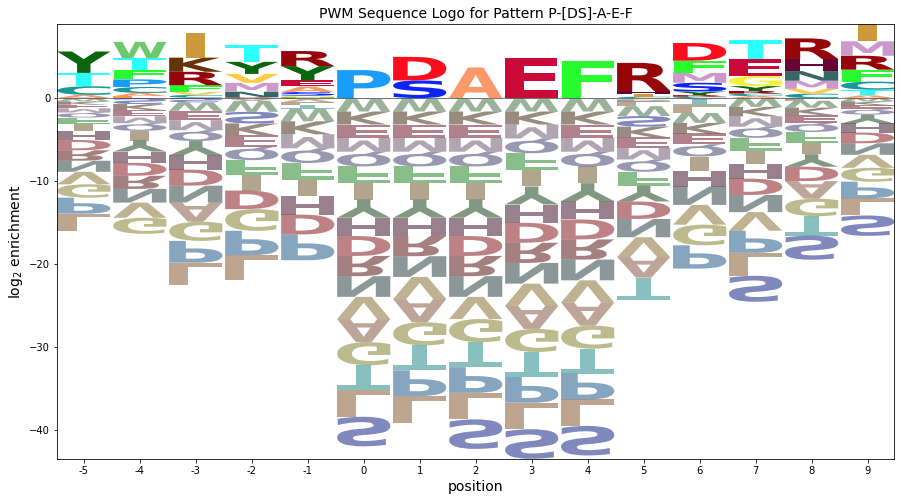

Information Content Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.236651,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.315535,0.788836,0.000000,0.000000,0.867720
1,0.130161,0.0,0.000000,0.000000,0.130161,0.000000,0.000000,0.000000,0.000000,0.162702,0.000000,0.000000,0.260322,0.0,0.000000,0.097621,0.357943,0.000000,0.162702,0.000000
2,0.000000,0.0,0.000000,0.000000,0.132836,0.000000,0.000000,0.730599,0.199254,0.000000,0.000000,0.000000,0.000000,0.0,0.365299,0.166045,0.166045,0.166045,0.000000,0.000000
3,0.072456,0.0,0.000000,0.000000,0.000000,0.000000,0.054342,0.000000,0.000000,0.000000,0.090570,0.126798,0.000000,0.0,0.072456,0.054342,0.525304,0.199253,0.000000,0.181139
4,0.105332,0.0,0.000000,0.042133,0.000000,0.073732,0.000000,0.000000,0.000000,0.063199,0.000000,0.052666,0.000000,0.0,0.189597,0.157997,0.052666,0.042133,0.000000,0.147464
5,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.652865,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
6,0.000000,0.0,1.132705,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,1.561296,0.000000,0.000000,0.000000,0.000000
7,3.969354,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,0.000000,0.0,0.000000,5.159470,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


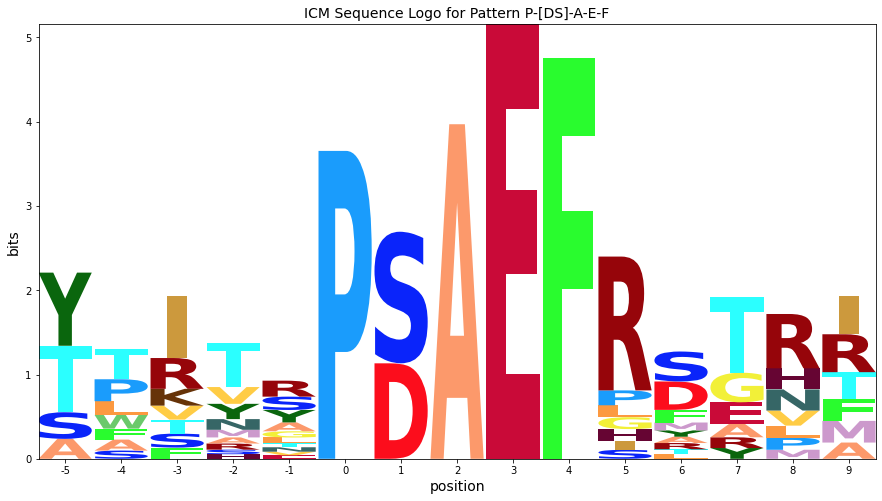

X^2 Critical Value = 39.938849338465694
Chi Square Tests


,index,Position,X^2,p-value,Critical pBH,Critical pBY,AAmax,PWMSmax,AAmin,PWMSmin
0,8,3,3057.1250000000005,0.000000e+00,0.003333,0.001005,E,4.880315951613174,S,-3.567222272786989
1,9,4,2294.0424410317105,0.000000e+00,0.006667,0.002009,F,4.4793977128662315,S,-3.567222272786989
2,7,2,1290.4059888254242,4.012882e-262,0.010000,0.003014,A,3.6901994696619305,S,-3.567222272786989
3,5,0,1018.8902941985151,4.918034e-204,0.013333,0.004018,P,3.3737108360449204,S,-3.5672222727869882
4,10,5,549.1516695099025,2.623324e-104,0.016667,0.005023,R,3.386660612649515,T,-2.720553472600988
5,6,1,498.18184704694386,1.344717e-93,0.020000,0.006027,D,2.8413543122801492,L,-3.2000212486239192
6,2,-3,253.79473942481513,5.269371e-43,0.023333,0.007032,I,2.9789338104029603,L,-2.730535965322699
7,12,7,202.37771499273643,1.145349e-32,0.026667,0.008036,T,2.274931046276519,S,-3.1342628655108817
8,3,-2,164.7422170740984,3.025517e-25,0.030000,0.009041,T,2.0608062409236716,L,-3.030096247181607
9,13,8,153.55627233727103,4.505832e-23,0.033333,0.010046,R,2.4829949474230455,S,-2.899797611873858


----------------------------------------------------------------------
T Pattern: A-[DS]-A-E-x-R
Position Probability Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.000000,0.0,0.000000,0.000000,0.117647,0.000000,0.205882,0.000000,0.000000,0.000000,0.000000,0.441176,0.000000,0.000000,0.000000,0.058824,0.088235,0.088235,0.000000,0.000000
1,0.043478,0.0,0.000000,0.000000,0.043478,0.152174,0.000000,0.000000,0.000000,0.391304,0.000000,0.000000,0.000000,0.000000,0.000000,0.043478,0.217391,0.108696,0.000000,0.000000
2,0.000000,0.0,0.000000,0.000000,0.000000,0.186441,0.355932,0.000000,0.000000,0.000000,0.000000,0.050847,0.067797,0.118644,0.000000,0.067797,0.033898,0.050847,0.000000,0.067797
3,0.033898,0.0,0.033898,0.000000,0.101695,0.067797,0.000000,0.000000,0.050847,0.118644,0.033898,0.101695,0.254237,0.000000,0.050847,0.000000,0.033898,0.000000,0.084746,0.033898
4,0.000000,0.0,0.000000,0.000000,0.081967,0.098361,0.327869,0.000000,0.000000,0.049180,0.000000,0.032787,0.000000,0.000000,0.114754,0.049180,0.147541,0.032787,0.032787,0.032787
5,1.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
6,0.000000,0.0,0.765625,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.234375,0.000000,0.000000,0.000000,0.000000
7,1.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,0.000000,0.0,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


Position Weight Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,-1.785534,0.874620,-1.406573,-0.595417,1.325592,-1.786679,1.791446,-1.014113,-0.573894,-2.200021,-0.685722,2.497637,-2.102023,-0.777857,-1.432357,-0.982260,-0.016009,0.321200,-0.492053,-1.175316
1,-0.490078,0.585113,-1.696080,-0.884924,0.299120,0.923815,-1.498061,-1.303620,-0.863401,1.758400,-0.975229,-1.791869,-2.391529,-1.067364,-1.721864,-1.271766,1.153916,0.616656,-0.781559,-1.464823
2,-2.334427,0.325726,-1.955466,-1.144311,-1.545229,1.249391,2.701984,-1.563007,-1.122787,-2.748914,-1.234616,-0.051256,-0.328988,1.673250,-1.981250,-0.794187,-0.979940,-0.227693,-1.040946,0.597719
3,-0.749465,0.325726,-0.370504,-1.144311,1.262126,-0.013644,-1.757447,-1.563007,0.877213,0.251086,0.350347,0.756099,1.349084,-1.326750,0.018750,-3.116116,-0.979940,-2.227693,1.544017,-0.139247
4,-2.370496,0.289657,-1.991536,-1.180380,1.003664,0.435714,2.598801,-1.599076,-1.158856,-0.784984,-1.270685,-0.502363,-2.686985,-1.362819,0.982680,-1.152185,0.720956,-0.678800,0.507947,-0.175316
5,3.599404,0.237190,-2.044003,-1.232847,-1.633766,-2.424109,-1.845984,-1.651543,-1.211324,-2.837451,-1.323152,-2.139793,-2.739453,-1.415287,-2.069787,-3.204652,-2.653439,-2.316230,-1.129483,-1.812746
6,-2.422964,0.237190,3.599853,-1.232847,-1.633766,-2.424109,-1.845984,-1.651543,-1.211324,-2.837451,-1.323152,-2.139793,-2.739453,-1.415287,-2.069787,0.795348,-2.653439,-2.316230,-1.129483,-1.812746
7,3.599404,0.237190,-2.044003,-1.232847,-1.633766,-2.424109,-1.845984,-1.651543,-1.211324,-2.837451,-1.323152,-2.139793,-2.739453,-1.415287,-2.069787,-3.204652,-2.653439,-2.316230,-1.129483,-1.812746
8,-2.422964,0.237190,-2.044003,4.789520,-1.633766,-2.424109,-1.845984,-1.651543,-1.211324,-2.837451,-1.323152,-2.139793,-2.739453,-1.415287,-2.069787,-3.204652,-2.653439,-2.316230,-1.129483,-1.812746


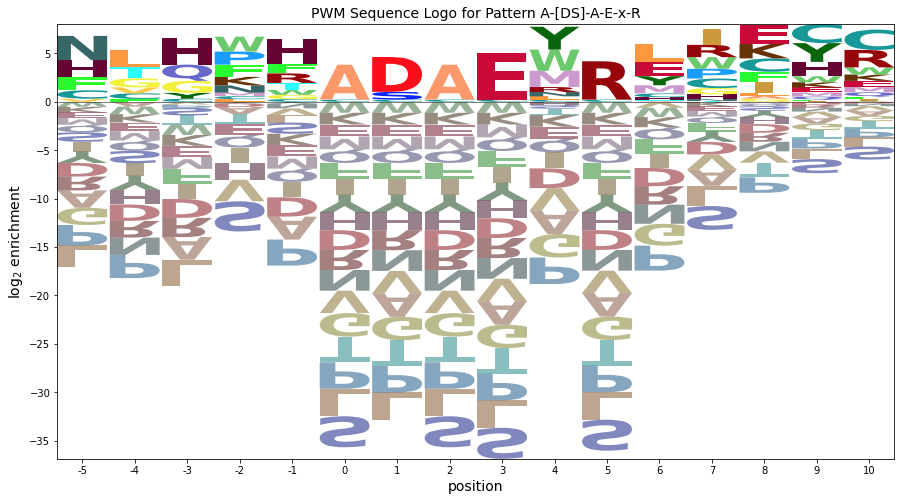

Information Content Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.000000,0.0,0.000000,0.000000,0.239645,0.000000,0.419379,0.000000,0.000000,0.000000,0.000000,0.898670,0.000000,0.000000,0.000000,0.119823,0.179734,0.179734,0.000000,0.000000
1,0.061267,0.0,0.000000,0.000000,0.061267,0.214435,0.000000,0.000000,0.000000,0.551404,0.000000,0.000000,0.000000,0.000000,0.000000,0.061267,0.306336,0.153168,0.000000,0.000000
2,0.000000,0.0,0.000000,0.000000,0.000000,0.285931,0.545869,0.000000,0.000000,0.000000,0.000000,0.077981,0.103975,0.181956,0.000000,0.103975,0.051988,0.077981,0.000000,0.103975
3,0.028250,0.0,0.028250,0.000000,0.084751,0.056500,0.000000,0.000000,0.042375,0.098876,0.028250,0.084751,0.211877,0.000000,0.042375,0.000000,0.028250,0.000000,0.070626,0.028250
4,0.000000,0.0,0.000000,0.000000,0.102767,0.123321,0.411070,0.000000,0.000000,0.061660,0.000000,0.041107,0.000000,0.000000,0.143874,0.061660,0.184981,0.041107,0.041107,0.041107
5,3.969354,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
6,0.000000,0.0,2.519463,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.771264,0.000000,0.000000,0.000000,0.000000
7,3.969354,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,0.000000,0.0,0.000000,5.159470,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


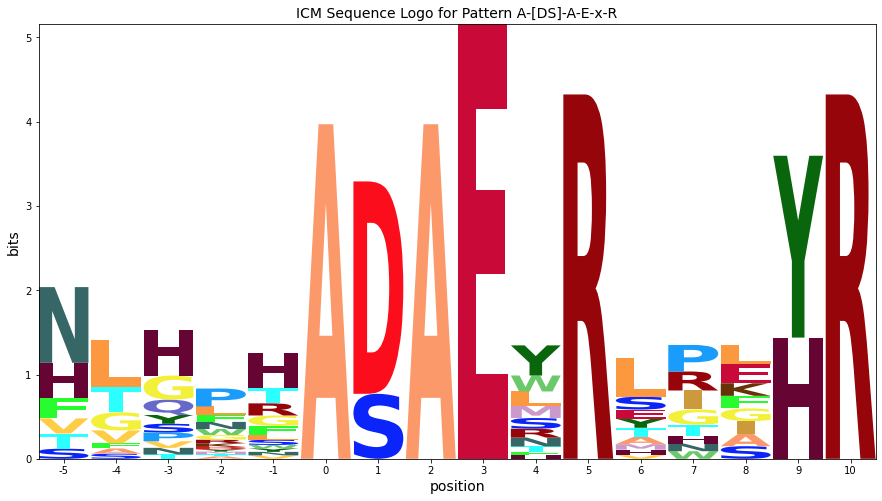

X^2 Critical Value = 40.15223303520055
Chi Square Tests


,index,Position,X^2,p-value,Critical pBH,Critical pBY,AAmax,PWMSmax,AAmin,PWMSmin
0,8,3,2223.363636363636,0.000000e+00,0.003125,0.000924,E,4.789520413059941,S,-3.204652193402279
1,10,5,1216.534383014254,2.674275e-246,0.006250,0.001849,R,3.952580665479494,S,-3.204652193402279
2,5,0,938.4770827821268,7.086729e-187,0.009375,0.002773,A,3.599403931108698,S,-3.204652193402279
3,7,2,938.4770827821268,7.086729e-187,0.012500,0.003697,A,3.599403931108698,S,-3.204652193402279
4,6,1,732.1937183349344,5.373792e-143,0.015625,0.004622,D,3.5998530679959977,L,-2.837451169239211
5,2,-3,192.65689032385234,9.773296e-31,0.018750,0.005546,H,2.701984417610729,L,-2.748914494637553
6,4,-1,155.87002829077755,1.606128e-23,0.021875,0.006470,H,2.59880096704467,P,-2.6869850956426338
7,9,4,155.4355966831257,1.949651e-23,0.025000,0.007395,Y,2.357178874533854,P,-2.7394525155367693
8,0,-5,147.61987422835597,6.301066e-22,0.028125,0.008319,N,2.497637278533797,L,-2.2000212486239192
9,1,-4,96.1474771224774,2.652930e-12,0.031250,0.009244,L,1.7583996476246815,P,-2.391529212116462


----------------------------------------------------------------------
U Pattern: T-[DS]-A-E-x-R
Position Probability Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.157895,0.0,0.000000,0.000000,0.263158,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.105263,0.000000,0.000000,0.000000,0.210526,0.263158,0.000000,0.000000,0.000000
1,0.000000,0.0,0.160000,0.000000,0.080000,0.000000,0.000000,0.000000,0.000000,0.000000,0.120000,0.200000,0.000000,0.000000,0.080000,0.360000,0.000000,0.000000,0.000000,0.000000
2,0.052632,0.0,0.052632,0.184211,0.131579,0.105263,0.052632,0.000000,0.000000,0.105263,0.000000,0.078947,0.000000,0.184211,0.000000,0.000000,0.052632,0.000000,0.000000,0.000000
3,0.000000,0.0,0.000000,0.000000,0.052632,0.184211,0.000000,0.052632,0.000000,0.052632,0.078947,0.131579,0.105263,0.000000,0.236842,0.000000,0.105263,0.000000,0.000000,0.000000
4,0.245283,0.0,0.094340,0.000000,0.075472,0.000000,0.000000,0.075472,0.000000,0.037736,0.132075,0.000000,0.037736,0.000000,0.132075,0.037736,0.075472,0.056604,0.000000,0.000000
5,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000
6,0.000000,0.0,0.696429,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.303571,0.000000,0.000000,0.000000,0.000000
7,1.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,0.000000,0.0,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


Position Weight Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.683951,1.344105,-0.937088,-0.125932,2.058112,-1.317193,-0.739069,-0.544628,-0.104409,-1.730536,-0.216237,0.552085,-1.632537,-0.308372,-0.962872,0.224191,1.038438,-1.209315,-0.022567,-0.705831
1,-1.522500,1.137654,1.178389,-0.332383,0.851661,-1.523644,-0.945520,-0.751079,-0.310860,-1.936987,1.577312,1.345634,-1.838988,-0.514823,0.415640,1.017740,-1.752975,-1.415766,-0.229018,-0.912282
2,-0.303665,0.771526,0.075296,2.301489,1.485533,0.432156,0.273315,-1.117207,-0.676987,0.018813,-0.788816,0.394544,-2.205116,2.119050,-1.535451,-2.670316,-0.534140,-1.781894,-0.595146,-1.278410
3,-1.888627,0.771526,-1.509667,-0.698511,0.485533,1.110228,-1.311647,0.467756,-0.676987,-0.718152,1.211184,0.979506,0.116812,-0.880950,1.786477,-2.670316,0.202825,-1.781894,-0.595146,-1.278410
4,1.586884,0.439683,0.743452,-1.030355,0.890655,-2.221616,-1.643491,0.872878,-1.008831,-1.049996,1.879341,-1.937300,-0.951997,-1.212794,1.132706,-1.417197,-0.129018,-0.113737,-0.926990,-1.610253
5,-2.278574,0.381580,-1.899613,-1.088457,-1.489376,-2.279719,-1.701594,-1.507153,-1.066934,-2.693061,-1.178762,-1.995403,-2.595063,-1.270897,-1.925397,-3.060262,3.323841,-2.171840,-0.985093,-1.668356
6,-2.278574,0.381580,3.422315,-1.088457,-1.489376,-2.279719,-1.701594,-1.507153,-1.066934,-2.693061,-1.178762,-1.995403,-2.595063,-1.270897,-1.925397,1.109663,-2.509049,-2.171840,-0.985093,-1.668356
7,3.554316,0.381580,-1.899613,-1.088457,-1.489376,-2.279719,-1.701594,-1.507153,-1.066934,-2.693061,-1.178762,-1.995403,-2.595063,-1.270897,-1.925397,-3.060262,-2.509049,-2.171840,-0.985093,-1.668356
8,-2.278574,0.381580,-1.899613,4.744433,-1.489376,-2.279719,-1.701594,-1.507153,-1.066934,-2.693061,-1.178762,-1.995403,-2.595063,-1.270897,-1.925397,-3.060262,-2.509049,-2.171840,-0.985093,-1.668356


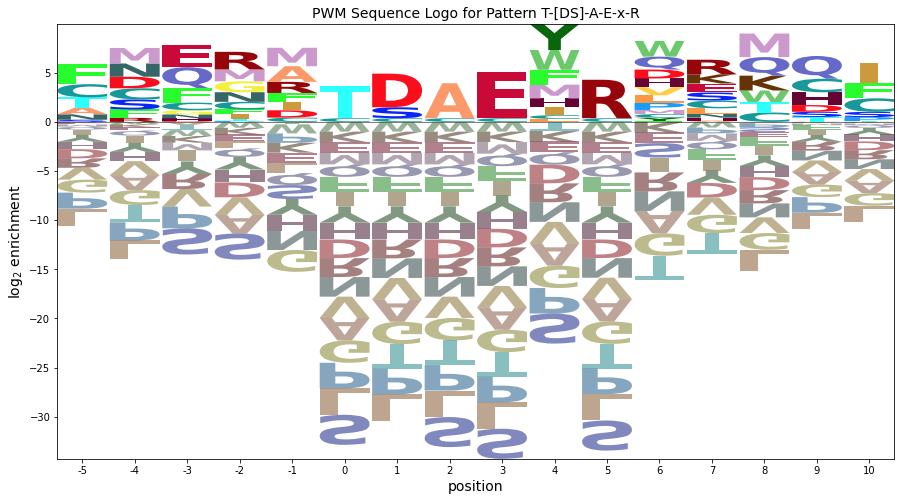

Information Content Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.273527,0.0,0.000000,0.000000,0.455879,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.182352,0.000000,0.000000,0.000000,0.364703,0.455879,0.000000,0.000000,0.000000
1,0.000000,0.0,0.265677,0.000000,0.132838,0.000000,0.000000,0.000000,0.000000,0.000000,0.199257,0.332096,0.000000,0.000000,0.132838,0.597772,0.000000,0.000000,0.000000,0.000000
2,0.070707,0.0,0.070707,0.247473,0.176766,0.141413,0.070707,0.000000,0.000000,0.141413,0.000000,0.106060,0.000000,0.247473,0.000000,0.000000,0.070707,0.000000,0.000000,0.000000
3,0.000000,0.0,0.000000,0.000000,0.063642,0.222748,0.000000,0.063642,0.000000,0.063642,0.095464,0.159106,0.127285,0.000000,0.286391,0.000000,0.127285,0.000000,0.000000,0.000000
4,0.255698,0.0,0.098345,0.000000,0.078676,0.000000,0.000000,0.078676,0.000000,0.039338,0.137683,0.000000,0.039338,0.000000,0.137683,0.039338,0.078676,0.059007,0.000000,0.000000
5,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.738878,0.000000,0.000000,0.000000
6,0.000000,0.0,2.166145,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.944217,0.000000,0.000000,0.000000,0.000000
7,3.969354,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,0.000000,0.0,0.000000,5.159470,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


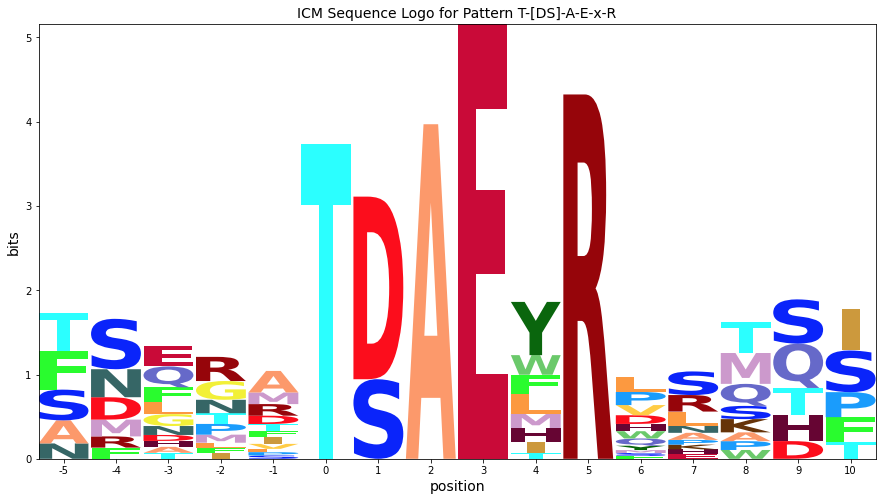

X^2 Critical Value = 40.15223303520055
Chi Square Tests


,index,Position,X^2,p-value,Critical pBH,Critical pBY,AAmax,PWMSmax,AAmin,PWMSmin
0,8,3,1945.4431818181815,0.000000e+00,0.003125,0.000924,E,4.744432523531401,S,-3.060262284067105
1,10,5,1064.4675851374725,9.037265e-214,0.006250,0.001849,R,3.9074927759509555,S,-3.0602622840671043
2,7,2,821.1674474343612,6.793892e-162,0.009375,0.002773,A,3.5543160415801576,S,-3.060262284067105
3,5,0,691.6571640820874,2.103949e-134,0.012500,0.003697,T,3.3238406467574655,S,-3.0602622840671043
4,6,1,544.2619146206138,2.803853e-103,0.015625,0.004622,D,3.4223148824438083,L,-2.693061259904037
5,9,4,199.71219450099753,3.884402e-32,0.018750,0.005546,Y,2.6535718773140786,S,-3.060262284067105
6,13,8,90.34231202374603,2.884622e-11,0.021875,0.006470,M,2.3967397542467466,L,-2.117559088431946
7,2,-3,90.2161629364074,3.037077e-11,0.025000,0.007395,E,2.3014890276826736,S,-2.670315765751091
8,4,-1,81.7525100881594,9.258447e-10,0.028125,0.008319,M,1.879340537338225,G,-2.221615684603857
9,3,-2,63.14079179727515,1.220226e-06,0.031250,0.009244,R,1.7864773749895897,S,-2.670315765751091


----------------------------------------------------------------------
V Pattern: S-[DS]-A-E-x-R
Position Probability Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.000000,0.392857,0.000000,0.000000,0.000000,0.000000,0.000000,0.410714,0.000000,0.000000,0.000000,0.000000,0.000000,0.035714,0.000000,0.107143,0.000000,0.000000,0.053571,0.000000
1,0.038462,0.000000,0.089744,0.000000,0.000000,0.038462,0.000000,0.000000,0.000000,0.038462,0.064103,0.000000,0.474359,0.000000,0.051282,0.115385,0.000000,0.089744,0.000000,0.000000
2,0.487500,0.000000,0.000000,0.037500,0.025000,0.087500,0.000000,0.025000,0.000000,0.037500,0.025000,0.050000,0.000000,0.000000,0.000000,0.037500,0.050000,0.037500,0.062500,0.037500
3,0.000000,0.275000,0.037500,0.037500,0.000000,0.000000,0.075000,0.187500,0.062500,0.037500,0.037500,0.075000,0.087500,0.000000,0.025000,0.000000,0.000000,0.025000,0.000000,0.037500
4,0.000000,0.000000,0.023256,0.000000,0.000000,0.058140,0.034884,0.000000,0.046512,0.093023,0.255814,0.081395,0.058140,0.000000,0.000000,0.069767,0.023256,0.034884,0.000000,0.220930
5,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000
6,0.000000,0.000000,0.500000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.500000,0.000000,0.000000,0.000000,0.000000
7,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


Position Weight Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,-2.278574,4.905142,-1.899613,-1.088457,-1.489376,-2.279719,-1.701594,3.077809,-1.066934,-2.693061,-1.178762,-1.995403,-2.595063,0.314066,-1.925397,-0.252907,-2.509049,-2.171840,1.014907,-1.668356
1,-0.645356,0.014797,0.733604,-1.455240,-1.856158,-0.646501,-2.068376,-1.873936,-1.433716,-1.059844,1.039418,-2.362185,2.286083,-1.637679,0.029749,-0.105117,-2.875832,0.461378,-1.351875,-2.035139
2,2.647425,-0.014349,-2.295542,0.515614,-0.300342,0.324353,-2.097523,-0.318120,-1.462863,-1.088990,0.010271,-0.069403,-2.990991,-1.666826,-2.321326,-1.456191,-0.583050,-0.567769,1.203941,-0.064285
3,-2.674503,4.509213,-0.295542,0.515614,-1.885304,-2.675647,0.709832,2.096918,1.122100,-1.088990,0.425309,0.416024,0.009009,-1.666826,-0.736363,-3.456191,-2.904978,-0.982806,-1.381021,-0.064285
4,-2.758567,-0.098413,-0.794644,-1.568450,-1.969369,-0.174749,-0.181587,-1.987146,0.775001,-0.003129,2.864807,0.524604,-0.490093,-1.750890,-2.405390,-0.732900,-1.404080,-0.651833,-1.465086,2.173579
5,-2.961384,-0.301230,-2.582423,-1.771267,-2.172186,-2.962528,-2.384404,-2.189963,-1.749744,-3.375871,-1.861572,-2.678213,-3.277872,-1.953707,-2.608207,2.943428,-3.191859,-2.854650,-1.667902,-2.351166
6,-2.961384,-0.301230,3.118017,-1.771267,-2.172186,-2.962528,-2.384404,-2.189963,-1.749744,-3.375871,-1.861572,-2.678213,-3.277872,-1.953707,-2.608207,1.957368,-3.191859,-2.854650,-1.667902,-2.351166
7,3.725117,-0.301230,-2.582423,-1.771267,-2.172186,-2.962528,-2.384404,-2.189963,-1.749744,-3.375871,-1.861572,-2.678213,-3.277872,-1.953707,-2.608207,-3.743072,-3.191859,-2.854650,-1.667902,-2.351166
8,-2.961384,-0.301230,-2.582423,4.915233,-2.172186,-2.962528,-2.384404,-2.189963,-1.749744,-3.375871,-1.861572,-2.678213,-3.277872,-1.953707,-2.608207,-3.743072,-3.191859,-2.854650,-1.667902,-2.351166


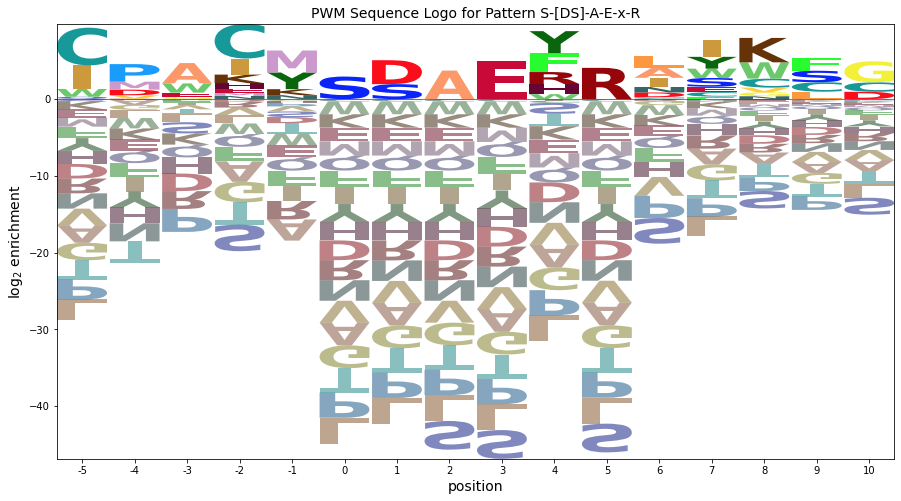

Information Content Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.000000,1.395749,0.000000,0.000000,0.000000,0.000000,0.000000,1.459193,0.000000,0.000000,0.000000,0.000000,0.000000,0.126886,0.000000,0.380659,0.000000,0.000000,0.190329,0.000000
1,0.051343,0.000000,0.119801,0.000000,0.000000,0.051343,0.000000,0.000000,0.000000,0.051343,0.085572,0.000000,0.633233,0.000000,0.068458,0.154030,0.000000,0.119801,0.000000,0.000000
2,0.664731,0.000000,0.000000,0.051133,0.034089,0.119311,0.000000,0.034089,0.000000,0.051133,0.034089,0.068178,0.000000,0.000000,0.000000,0.051133,0.068178,0.051133,0.085222,0.051133
3,0.000000,0.505904,0.068987,0.068987,0.000000,0.000000,0.137974,0.344935,0.114978,0.068987,0.068987,0.137974,0.160969,0.000000,0.045991,0.000000,0.000000,0.045991,0.000000,0.068987
4,0.000000,0.000000,0.028877,0.000000,0.000000,0.072192,0.043315,0.000000,0.057754,0.115508,0.317646,0.101069,0.072192,0.000000,0.000000,0.086631,0.028877,0.043315,0.000000,0.274330
5,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.187665,0.000000,0.000000,0.000000,0.000000
6,0.000000,0.000000,1.383995,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.383995,0.000000,0.000000,0.000000,0.000000
7,3.969354,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,0.000000,0.000000,0.000000,5.159470,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


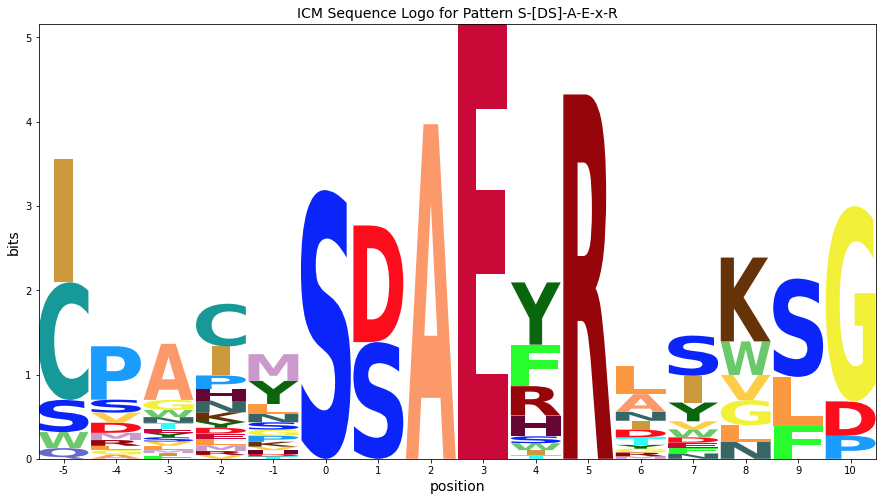

X^2 Critical Value = 40.15223303520055
Chi Square Tests


,index,Position,X^2,p-value,Critical pBH,Critical pBY,AAmax,PWMSmax,AAmin,PWMSmin
0,8,3,3543.4857954545446,0.000000e+00,0.003125,0.000924,E,4.915233212430578,S,-3.743072108186406
1,10,5,1938.8516729289674,0.000000e+00,0.006250,0.001849,R,4.078293464850131,S,-3.743072108186405
2,7,2,1495.6978506840144,3.707670e-306,0.009375,0.002773,A,3.7251167304793342,S,-3.743072108186406
3,0,-5,1066.5802461159262,3.195832e-214,0.012500,0.003697,C,4.9051415842162385,L,-2.693061259904036
4,5,0,827.357957631722,3.277349e-163,0.015625,0.004622,S,2.943428418996813,L,-3.375871084023337
5,6,1,649.7529684607539,1.557419e-125,0.018750,0.005546,D,3.118016681578238,L,-3.375871084023337
6,3,-2,648.2884248489668,3.177775e-125,0.021875,0.006470,C,4.509212907885098,S,-3.4561909603982444
7,9,4,454.67426213200844,1.738988e-84,0.025000,0.007395,Y,2.8582873239363655,L,-3.3758710840233377
8,2,-3,261.19745056022214,1.657856e-44,0.028125,0.008319,A,2.6474254459716398,P,-2.990991282532734
9,4,-1,247.46003066919462,1.011111e-41,0.031250,0.009244,M,2.864806597712056,A,-2.7585669137041973


----------------------------------------------------------------------
W Pattern: D-[DS]-A-E-x-R
Position Probability Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.421053,0.000000,0.000000,0.105263,0.105263,0.000000,0.000000,0.000000,0.368421,0.000000,0.000000,0.000000,0.000000
1,0.074074,0.0,0.000000,0.000000,0.000000,0.259259,0.074074,0.000000,0.000000,0.222222,0.111111,0.074074,0.000000,0.000000,0.000000,0.111111,0.000000,0.074074,0.000000,0.000000
2,0.000000,0.0,0.000000,0.000000,0.066667,0.100000,0.100000,0.066667,0.066667,0.233333,0.000000,0.000000,0.000000,0.000000,0.066667,0.200000,0.000000,0.000000,0.000000,0.100000
3,0.048780,0.0,0.073171,0.121951,0.000000,0.000000,0.000000,0.000000,0.000000,0.048780,0.048780,0.073171,0.048780,0.219512,0.170732,0.000000,0.000000,0.000000,0.000000,0.146341
4,0.000000,0.0,0.062500,0.000000,0.000000,0.437500,0.041667,0.125000,0.000000,0.062500,0.041667,0.000000,0.041667,0.041667,0.000000,0.041667,0.062500,0.000000,0.000000,0.041667
5,0.000000,0.0,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
6,0.000000,0.0,0.388889,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.611111,0.000000,0.000000,0.000000,0.000000
7,1.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,0.000000,0.0,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


Position Weight Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,-1.316049,1.344105,-0.937088,-0.125932,-0.526850,-1.317193,-0.739069,2.625297,-0.104409,-1.730536,1.368725,0.552085,-1.632537,-0.308372,-0.962872,0.902263,-1.546524,-1.209315,-0.022567,-0.705831
1,-0.000273,1.074918,-1.206275,-0.395119,-0.796037,1.413620,0.576707,-0.813815,-0.373595,0.807632,1.514576,0.282898,-1.901724,-0.577558,-1.232059,-0.366924,-1.815711,0.106461,-0.291754,-0.975018
2,-1.674503,0.985651,-1.295542,-0.484386,0.699658,0.324353,0.902477,0.681880,1.122100,0.911010,-0.574691,-1.391331,-1.990991,-0.666826,0.263637,0.351164,-1.904978,-1.567769,-0.381021,0.935715
3,-0.376421,0.698770,0.417577,1.813695,-1.172186,-1.962528,-1.384404,-1.189963,-0.749744,-0.790909,0.723390,0.321787,-0.692910,2.368221,1.391793,-2.743072,-2.191859,-1.854650,-0.667902,1.456189
4,-2.118109,0.542044,0.260851,-0.927993,-1.328911,2.340178,0.043833,1.460666,-0.906469,-0.532597,0.566665,-1.834938,-0.849635,0.474530,-1.764933,-1.314835,-0.348585,-2.011375,-0.824628,0.077071
5,-2.240100,0.420054,3.920221,-1.049983,-1.450902,-2.241244,-1.663120,-1.468679,-1.028460,-2.654587,-1.140288,-1.956929,-2.556588,-1.232423,-1.886923,-3.021788,-2.470575,-2.133366,-0.946618,-1.629882
6,-2.240100,0.420054,2.598293,-1.049983,-1.450902,-2.241244,-1.663120,-1.468679,-1.028460,-2.654587,-1.140288,-1.956929,-2.556588,-1.232423,-1.886923,2.065675,-2.470575,-2.133366,-0.946618,-1.629882
7,3.541260,0.420054,-1.861139,-1.049983,-1.450902,-2.241244,-1.663120,-1.468679,-1.028460,-2.654587,-1.140288,-1.956929,-2.556588,-1.232423,-1.886923,-3.021788,-2.470575,-2.133366,-0.946618,-1.629882
8,-2.240100,0.420054,-1.861139,4.731376,-1.450902,-2.241244,-1.663120,-1.468679,-1.028460,-2.654587,-1.140288,-1.956929,-2.556588,-1.232423,-1.886923,-3.021788,-2.470575,-2.133366,-0.946618,-1.629882


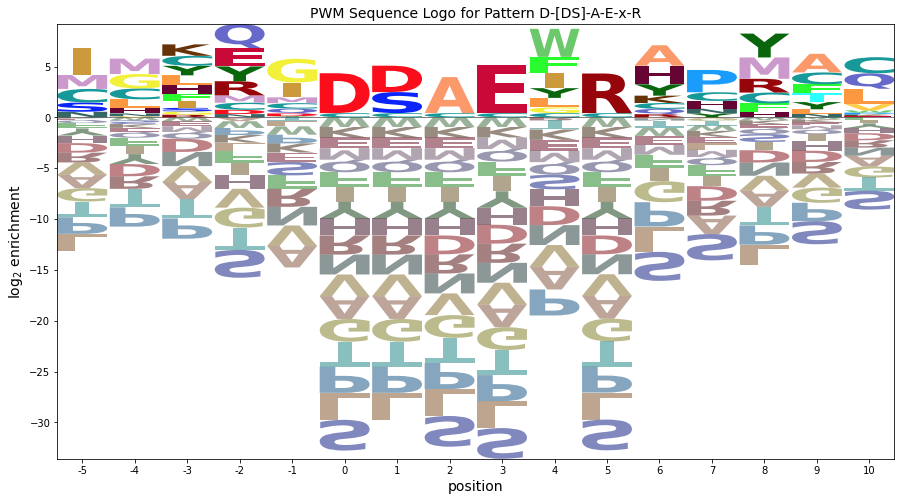

Information Content Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,1.015492,0.000000,0.000000,0.253873,0.253873,0.000000,0.000000,0.000000,0.888556,0.000000,0.000000,0.000000,0.000000
1,0.087393,0.0,0.000000,0.000000,0.000000,0.305876,0.087393,0.000000,0.000000,0.262180,0.131090,0.087393,0.000000,0.000000,0.000000,0.131090,0.000000,0.087393,0.000000,0.000000
2,0.000000,0.0,0.000000,0.000000,0.070038,0.105058,0.105058,0.070038,0.070038,0.245135,0.000000,0.000000,0.000000,0.000000,0.070038,0.210115,0.000000,0.000000,0.000000,0.105058
3,0.071114,0.0,0.106671,0.177785,0.000000,0.000000,0.000000,0.000000,0.000000,0.071114,0.071114,0.106671,0.071114,0.320012,0.248898,0.000000,0.000000,0.000000,0.000000,0.213341
4,0.000000,0.0,0.084197,0.000000,0.000000,0.589380,0.056131,0.168394,0.000000,0.084197,0.056131,0.000000,0.056131,0.056131,0.000000,0.056131,0.084197,0.000000,0.000000,0.056131
5,0.000000,0.0,4.348314,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
6,0.000000,0.0,1.040258,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.634692,0.000000,0.000000,0.000000,0.000000
7,3.969354,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,0.000000,0.0,0.000000,5.159470,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


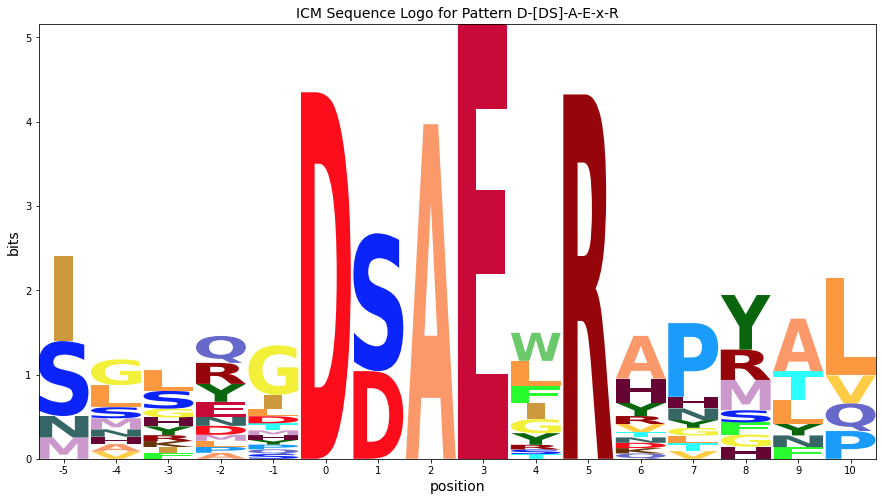

X^2 Critical Value = 40.15223303520055
Chi Square Tests


,index,Position,X^2,p-value,Critical pBH,Critical pBY,AAmax,PWMSmax,AAmin,PWMSmin
0,8,3,1875.9630681818178,0.000000e+00,0.003125,0.000924,E,4.731376370705957,S,-3.0217881362524683
1,5,0,1045.9344262295078,8.236599e-210,0.006250,0.001849,D,3.920220648895743,S,-3.0217881362524683
2,10,5,1026.450885668277,1.194723e-205,0.009375,0.002773,R,3.894436623125509,S,-3.0217881362524683
3,7,2,791.8400385974196,1.165659e-155,0.012500,0.003697,A,3.541259888754713,S,-3.0217881362524683
4,6,1,296.09371694083615,1.262813e-51,0.015625,0.004622,D,2.5982925540083803,L,-2.6545871120894002
5,9,4,148.19323945646738,4.886615e-22,0.018750,0.005546,W,2.7538212340194796,P,-2.5565884583869587
6,4,-1,135.54443809964005,1.292453e-19,0.021875,0.006470,G,2.340177651663119,A,-2.1181093003913367
7,12,7,114.96374217623661,9.624276e-16,0.025000,0.007395,P,2.193433288604694,S,-2.593694484148179
8,11,6,113.0085526835208,2.217470e-15,0.028125,0.008319,A,2.012422262750889,S,-2.8567288899819716
9,0,-5,105.64014631944588,5.036491e-14,0.031250,0.009244,I,2.625296855788259,L,-1.7305359653226997


----------------------------------------------------------------------
X Pattern: S-[DS]-A-E-F
Position Probability Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.000000,0.0,0.105263,0.000000,0.000000,0.105263,0.000000,0.315789,0.000000,0.000000,0.000000,0.210526,0.000000,0.000000,0.000000,0.157895,0.000000,0.000000,0.105263,0.000000
1,0.000000,0.0,0.225806,0.000000,0.000000,0.161290,0.064516,0.000000,0.000000,0.064516,0.225806,0.064516,0.000000,0.000000,0.000000,0.064516,0.129032,0.000000,0.000000,0.000000
2,0.060606,0.0,0.060606,0.090909,0.000000,0.000000,0.000000,0.000000,0.000000,0.090909,0.000000,0.242424,0.000000,0.000000,0.121212,0.060606,0.000000,0.272727,0.000000,0.000000
3,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.114286,0.000000,0.057143,0.200000,0.085714,0.114286,0.200000,0.000000,0.000000,0.114286,0.000000,0.057143,0.057143,0.000000
4,0.090909,0.0,0.250000,0.000000,0.000000,0.159091,0.000000,0.000000,0.090909,0.204545,0.000000,0.000000,0.045455,0.000000,0.045455,0.000000,0.000000,0.113636,0.000000,0.000000
5,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000
6,0.000000,0.0,0.704918,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.295082,0.000000,0.000000,0.000000,0.000000
7,1.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,0.000000,0.0,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


Position Weight Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,-1.316049,1.344105,0.647875,-0.125932,-0.526850,0.267769,-0.739069,2.262727,-0.104409,-1.730536,-0.216237,1.289051,-1.632537,-0.308372,-0.962872,-0.097737,-1.546524,-1.209315,1.562395,-0.705831
1,-1.703072,0.957082,1.675889,-0.512955,-0.913874,0.880746,0.458871,-0.931651,-0.491432,-0.532597,2.396740,0.165062,-2.019560,-0.695395,-1.349895,-0.899798,0.388381,-1.596338,-0.409590,-1.092854
2,-0.173604,0.901587,0.205356,1.431550,-0.969369,-1.759712,-1.181587,-0.987146,-0.546927,-0.173054,-0.658755,1.694529,-2.075056,-0.750890,0.916538,-0.955293,-1.989042,1.670095,-0.465086,-1.148349
3,-1.812006,0.848147,-1.433045,-0.621890,-1.022808,-1.813151,1.086902,-1.040586,0.984596,0.773507,1.287805,0.793093,0.871505,-0.804329,-1.458829,-0.271766,-2.042482,-0.120310,1.066438,-1.201788
4,0.291282,0.629507,1.933277,-0.840530,-1.241448,0.968209,-1.453666,-1.259226,1.502922,0.876794,-0.930835,-1.747475,-0.762173,-1.022969,-0.092507,-2.812335,-2.261122,0.661050,-0.737165,-1.420429
5,-2.370496,0.289657,-1.991536,-1.180380,-1.581298,-2.371641,-1.793516,-1.599076,-1.158856,-2.784984,-1.270685,-2.087325,-2.686985,-1.362819,-2.017320,2.802012,-2.600972,-2.263763,-1.077015,-1.760279
6,-2.370496,0.289657,3.467896,-1.180380,-1.581298,-2.371641,-1.793516,-1.599076,-1.158856,-2.784984,-1.270685,-2.087325,-2.686985,-1.362819,-2.017320,1.095743,-2.600972,-2.263763,-1.077015,-1.760279
7,3.583700,0.289657,-1.991536,-1.180380,-1.581298,-2.371641,-1.793516,-1.599076,-1.158856,-2.784984,-1.270685,-2.087325,-2.686985,-1.362819,-2.017320,-3.152185,-2.600972,-2.263763,-1.077015,-1.760279
8,-2.370496,0.289657,-1.991536,4.773816,-1.581298,-2.371641,-1.793516,-1.599076,-1.158856,-2.784984,-1.270685,-2.087325,-2.686985,-1.362819,-2.017320,-3.152185,-2.600972,-2.263763,-1.077015,-1.760279


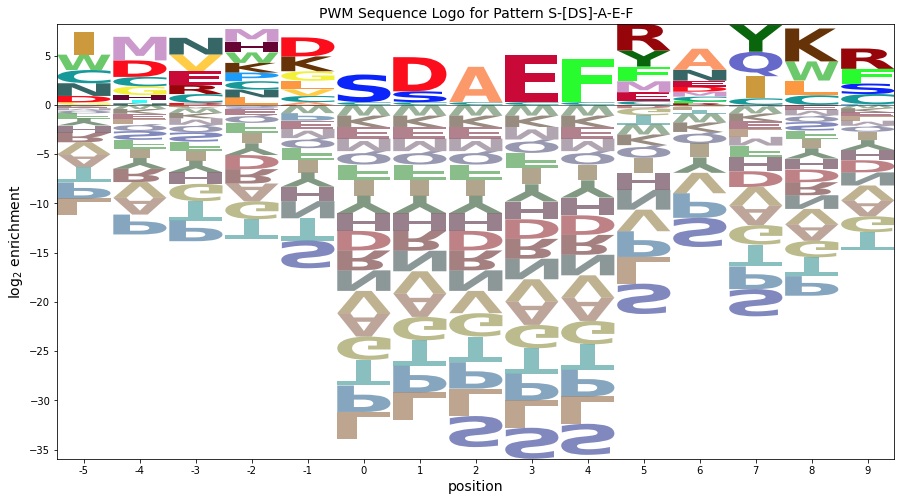

Information Content Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.000000,0.0,0.197953,0.000000,0.000000,0.197953,0.000000,0.593859,0.000000,0.000000,0.000000,0.395906,0.000000,0.00000,0.000000,0.296929,0.000000,0.000000,0.197953,0.000000
1,0.000000,0.0,0.328761,0.000000,0.000000,0.234829,0.093932,0.000000,0.000000,0.093932,0.328761,0.093932,0.000000,0.00000,0.000000,0.093932,0.187864,0.000000,0.000000,0.000000
2,0.085809,0.0,0.085809,0.128713,0.000000,0.000000,0.000000,0.000000,0.000000,0.128713,0.000000,0.343235,0.000000,0.00000,0.171618,0.085809,0.000000,0.386139,0.000000,0.000000
3,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.121406,0.000000,0.060703,0.212460,0.091054,0.121406,0.212460,0.00000,0.000000,0.121406,0.000000,0.060703,0.060703,0.000000
4,0.120175,0.0,0.330480,0.000000,0.000000,0.210306,0.000000,0.000000,0.120175,0.270393,0.000000,0.000000,0.060087,0.00000,0.060087,0.000000,0.000000,0.150218,0.000000,0.000000
5,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,3.187665,0.000000,0.000000,0.000000,0.000000
6,0.000000,0.0,2.206839,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.923793,0.000000,0.000000,0.000000,0.000000
7,3.969354,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,0.000000,0.0,0.000000,5.159470,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


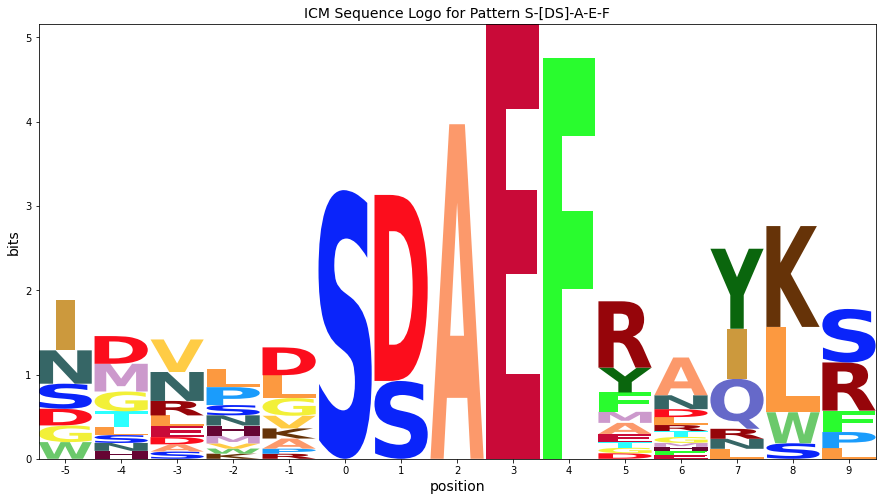

X^2 Critical Value = 39.938849338465694
Chi Square Tests


,index,Position,X^2,p-value,Critical pBH,Critical pBY,AAmax,PWMSmax,AAmin,PWMSmin
0,8,3,2119.1434659090905,0.000000e+00,0.003333,0.001005,E,4.773816330312495,S,-3.152184773508145
1,9,4,1590.188510260617,0.000000e+00,0.006667,0.002009,F,4.372898091565553,S,-3.152184773508145
2,7,2,894.4859695267146,1.683298e-177,0.010000,0.003014,A,3.5836998483612517,S,-3.152184773508145
3,6,1,604.8138973557311,4.865051e-116,0.013333,0.004018,D,3.467895916752704,L,-2.784983749345077
4,5,0,494.7925040738729,6.910684e-93,0.016667,0.005023,S,2.802011536878731,L,-2.784983749345076
5,12,7,247.22712801530753,1.127007e-41,0.020000,0.006027,Y,2.7128378267337663,S,-2.766531081010394
6,13,8,243.454687938642,6.528701e-41,0.023333,0.007032,K,3.344492286586897,P,-1.990991282532733
7,10,5,225.3654847355653,2.886757e-37,0.026667,0.008036,R,2.6995999243096227,S,-3.07912131131842
8,11,6,106.30572138047815,3.804432e-14,0.030000,0.009041,A,2.1415345162416832,S,-2.9620818901282013
9,14,9,83.61156906956845,4.400459e-10,0.033333,0.010046,R,2.0594958693960055,T,-1.8460843546848467


----------------------------------------------------------------------
Y Pattern: L-[DS]-A-E-x-R
Position Probability Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.075000,0.100000,0.075000,0.000000,0.000000,0.000000,0.000000,0.450000,0.000000,0.125000,0.000000,0.175000
1,0.071429,0.0,0.000000,0.071429,0.000000,0.000000,0.000000,0.000000,0.000000,0.095238,0.000000,0.071429,0.285714,0.000000,0.261905,0.000000,0.095238,0.047619,0.000000,0.000000
2,0.159091,0.0,0.000000,0.000000,0.000000,0.000000,0.068182,0.000000,0.000000,0.000000,0.159091,0.204545,0.204545,0.000000,0.045455,0.090909,0.000000,0.000000,0.000000,0.068182
3,0.074074,0.0,0.000000,0.000000,0.000000,0.314815,0.055556,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.148148,0.277778,0.037037,0.092593,0.000000,0.000000
4,0.069444,0.0,0.027778,0.000000,0.083333,0.000000,0.000000,0.041667,0.000000,0.097222,0.055556,0.000000,0.222222,0.055556,0.000000,0.263889,0.041667,0.000000,0.000000,0.041667
5,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
6,0.000000,0.0,0.625000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.375000,0.000000,0.000000,0.000000,0.000000
7,1.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,0.000000,0.0,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


Position Weight Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,-1.937537,0.722617,-1.558576,-0.747421,-1.148339,-1.938682,-1.360557,-1.166117,1.274103,-0.030096,1.162275,-1.654366,-2.254026,-0.929860,-1.584360,1.528702,-2.168012,0.754159,-0.644056,1.672681
1,0.015157,0.675311,-1.605882,1.205274,-1.195645,-1.985987,-1.407863,-1.213422,-0.773203,-0.077402,-0.885031,0.298328,1.399108,-0.977166,1.953296,-2.766531,0.106610,-0.293146,-0.691361,-1.374625
2,0.969354,0.629507,-1.651686,-0.840530,-1.241448,-2.031791,0.546334,-1.259226,-0.819006,-2.445134,2.069165,1.574453,0.974793,-1.022969,-0.092507,-0.490407,-2.261122,-1.923913,-0.737165,0.579571
3,0.081828,0.420054,-1.861139,-1.049983,-1.450902,1.928681,0.336880,-1.468679,-1.028460,-2.654587,-1.140288,-1.956929,-2.556588,-1.232423,1.283002,0.978212,-0.885613,0.451597,-0.946618,-1.629882
4,0.030754,0.105945,-0.590285,-1.364092,1.042345,-2.555353,-1.977228,0.217212,-1.342568,0.031304,0.867531,-2.271037,1.216766,0.775397,-2.201032,0.986031,-0.784684,-2.447475,-1.260727,0.056009
5,-2.554208,0.105945,-2.175248,-1.364092,-1.765010,-2.555353,-1.977228,-1.782788,-1.342568,3.221129,-1.454397,-2.271037,-2.870697,-1.546531,-2.201032,-3.335897,-2.784684,-2.447475,-1.260727,-1.943991
6,-2.554208,0.105945,3.348314,-1.364092,-1.765010,-2.555353,-1.977228,-1.782788,-1.342568,-2.968696,-1.454397,-2.271037,-2.870697,-1.546531,-2.201032,1.471458,-2.784684,-2.447475,-1.260727,-1.943991
7,3.635616,0.105945,-2.175248,-1.364092,-1.765010,-2.555353,-1.977228,-1.782788,-1.342568,-2.968696,-1.454397,-2.271037,-2.870697,-1.546531,-2.201032,-3.335897,-2.784684,-2.447475,-1.260727,-1.943991
8,-2.554208,0.105945,-2.175248,4.825733,-1.765010,-2.555353,-1.977228,-1.782788,-1.342568,-2.968696,-1.454397,-2.271037,-2.870697,-1.546531,-2.201032,-3.335897,-2.784684,-2.447475,-1.260727,-1.943991


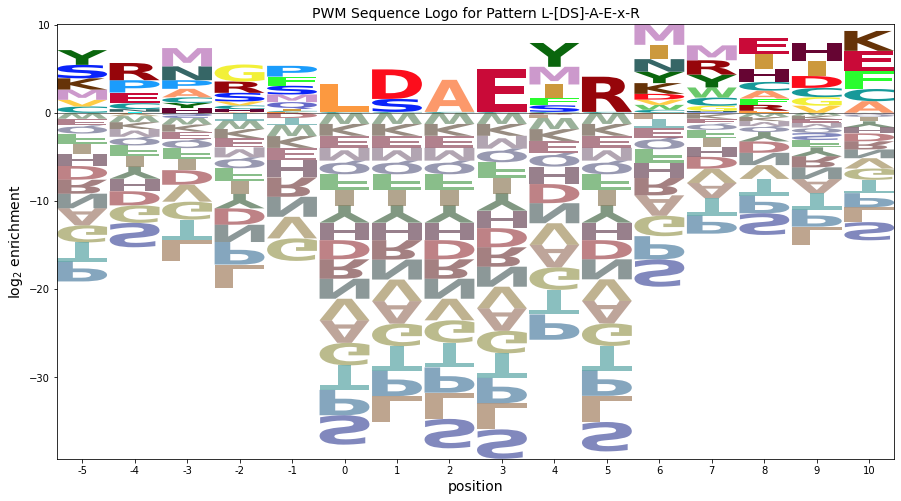

Information Content Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.123258,0.164344,0.123258,0.000000,0.000000,0.000000,0.000000,0.739550,0.000000,0.205431,0.000000,0.287603
1,0.094752,0.0,0.000000,0.094752,0.000000,0.000000,0.000000,0.000000,0.000000,0.126336,0.000000,0.094752,0.379007,0.000000,0.347423,0.000000,0.126336,0.063168,0.000000,0.000000
2,0.212777,0.0,0.000000,0.000000,0.000000,0.000000,0.091190,0.000000,0.000000,0.000000,0.212777,0.273570,0.273570,0.000000,0.060793,0.121587,0.000000,0.000000,0.000000,0.091190
3,0.102771,0.0,0.000000,0.000000,0.000000,0.436778,0.077078,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.205542,0.385392,0.051386,0.128464,0.000000,0.000000
4,0.057739,0.0,0.023096,0.000000,0.069287,0.000000,0.000000,0.034644,0.000000,0.080835,0.046192,0.000000,0.184766,0.046192,0.000000,0.219410,0.034644,0.000000,0.000000,0.034644
5,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.554866,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
6,0.000000,0.0,1.849148,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.109489,0.000000,0.000000,0.000000,0.000000
7,3.969354,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,0.000000,0.0,0.000000,5.159470,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


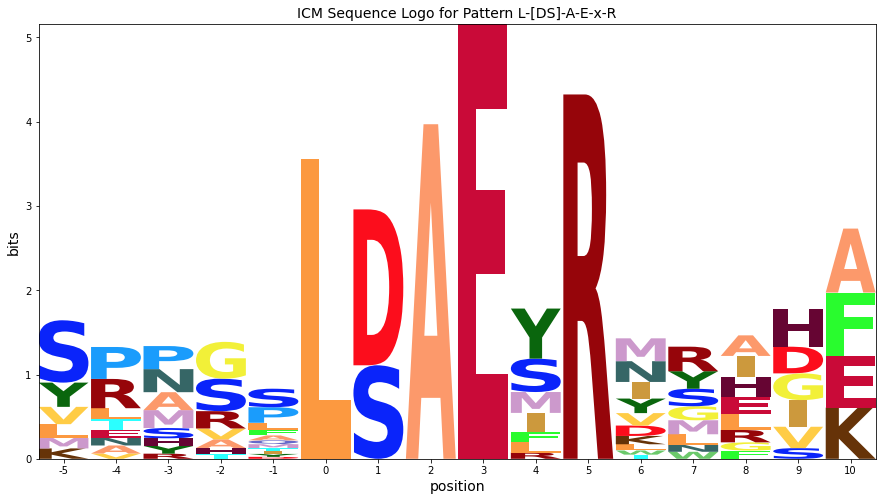

X^2 Critical Value = 40.15223303520055
Chi Square Tests


,index,Position,X^2,p-value,Critical pBH,Critical pBY,AAmax,PWMSmax,AAmin,PWMSmin
0,8,3,2501.2840909090914,0.000000e+00,0.003125,0.000924,E,4.82573262563325,S,-3.335896726680533
1,10,5,1368.6011808910355,6.925253e-279,0.006250,0.001849,R,3.9887928780528035,S,-3.335896726680532
2,7,2,1055.7867181298927,6.469832e-212,0.009375,0.002773,A,3.6356161436820056,S,-3.335896726680533
3,5,0,774.1626847894624,6.637926e-152,0.012500,0.003697,L,3.2211288563625526,S,-3.335896726680533
4,6,1,593.1349579849392,1.417106e-113,0.015625,0.004622,D,3.3483143010000314,L,-2.968695702517465
5,9,4,244.36668870976143,4.270431e-41,0.018750,0.005546,Y,2.699865529588014,P,-2.8706970488150216
6,11,6,129.25204976948075,2.019492e-18,0.021875,0.006470,M,2.3687253780771504,S,-3.097736989485767
7,3,-2,108.77384667891101,1.340567e-14,0.025000,0.007395,G,1.9286805100895235,L,-2.6545871120894002
8,15,10,105.36590378740917,5.653137e-14,0.028125,0.008319,K,2.254994135747795,S,-2.0602622840671043
9,0,-5,94.05072313381237,6.303803e-12,0.031250,0.009244,Y,1.6726807002617834,P,-2.2540256883665273


----------------------------------------------------------------------
Z Pattern: P-[DS]-A-E-x-R
Position Probability Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.000000,0.000000,0.000000,0.137931,0.000000,0.000000,0.103448,0.068966,0.000000,0.103448,0.000000,0.000000,0.000000,0.000000,0.000000,0.103448,0.172414,0.000000,0.000000,0.310345
1,0.264706,0.000000,0.000000,0.000000,0.000000,0.088235,0.058824,0.000000,0.000000,0.000000,0.000000,0.058824,0.147059,0.088235,0.117647,0.000000,0.000000,0.176471,0.000000,0.000000
2,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.051724,0.310345,0.000000,0.137931,0.051724,0.155172,0.000000,0.051724,0.000000,0.120690,0.086207,0.000000,0.000000,0.034483
3,0.067568,0.000000,0.054054,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.040541,0.189189,0.094595,0.040541,0.027027,0.040541,0.000000,0.364865,0.081081,0.000000,0.000000
4,0.058140,0.000000,0.000000,0.000000,0.000000,0.081395,0.000000,0.151163,0.000000,0.034884,0.000000,0.093023,0.069767,0.000000,0.209302,0.093023,0.000000,0.046512,0.000000,0.162791
5,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
6,0.000000,0.000000,0.558140,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.441860,0.000000,0.000000,0.000000,0.000000
7,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


Position Weight Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,-1.645356,1.014797,-1.266396,1.866688,-0.856158,-1.646501,0.931624,0.711027,-0.433716,-0.059844,-0.545545,-1.362185,-1.961845,-0.637679,-1.292180,-0.427045,0.709131,-1.538622,-0.351875,2.286790
1,1.536394,0.874620,-1.406573,-0.595417,-0.996336,0.213321,0.376409,-1.014113,-0.573894,-2.200021,-0.685722,0.082600,0.482940,1.222143,0.889571,-2.567222,-2.016009,1.128555,-0.492053,-1.175316
2,-2.316049,0.344105,-1.937088,-1.125932,-1.526850,-2.317193,0.260931,2.703299,-1.104409,0.439389,0.783763,1.289051,-2.632537,0.691628,-1.962872,-0.097737,0.038438,-2.209315,-1.022567,-0.120868
3,-0.000273,0.074918,0.115654,-1.395119,-1.796037,-2.586380,-2.008255,-1.813815,-1.373595,-0.999723,2.421467,0.697936,-0.901724,0.007404,-0.232059,-3.366924,1.991644,0.328853,-1.291754,-1.975018
4,-0.173604,-0.098413,-2.379606,-1.568450,-1.969369,0.240288,-2.181587,1.820209,-1.546927,-1.173054,-1.658755,0.694529,-0.267701,-1.750890,1.842537,-0.370330,-2.989042,-0.329905,-1.465086,1.758541
5,-2.758567,-0.098413,-2.379606,-1.568450,-1.969369,-2.759712,-2.181587,-1.987146,-1.546927,-3.173054,-1.658755,-2.475396,3.367888,-1.750890,-2.405390,-3.540255,-2.989042,-2.651833,-1.465086,-2.148349
6,-2.758567,-0.098413,3.235104,-1.568450,-1.969369,-2.759712,-2.181587,-1.987146,-1.546927,-3.173054,-1.658755,-2.475396,-3.075056,-1.750890,-2.405390,1.745147,-2.989042,-2.651833,-1.465086,-2.148349
7,3.684377,-0.098413,-2.379606,-1.568450,-1.969369,-2.759712,-2.181587,-1.987146,-1.546927,-3.173054,-1.658755,-2.475396,-3.075056,-1.750890,-2.405390,-3.540255,-2.989042,-2.651833,-1.465086,-2.148349
8,-2.758567,-0.098413,-2.379606,4.874493,-1.969369,-2.759712,-2.181587,-1.987146,-1.546927,-3.173054,-1.658755,-2.475396,-3.075056,-1.750890,-2.405390,-3.540255,-2.989042,-2.651833,-1.465086,-2.148349


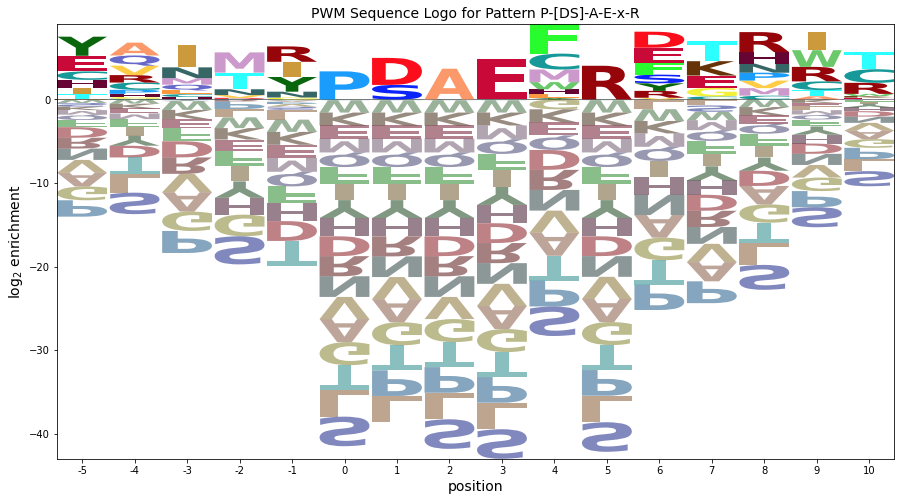

Information Content Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.000000,0.00000,0.000000,0.225535,0.000000,0.000000,0.169151,0.112768,0.000000,0.169151,0.000000,0.000000,0.000000,0.000000,0.000000,0.169151,0.281919,0.000000,0.000000,0.507454
1,0.345312,0.00000,0.000000,0.000000,0.000000,0.115104,0.076736,0.000000,0.000000,0.000000,0.000000,0.076736,0.191840,0.115104,0.153472,0.000000,0.000000,0.230208,0.000000,0.000000
2,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.072540,0.435238,0.000000,0.193439,0.072540,0.217619,0.000000,0.072540,0.000000,0.169259,0.120900,0.000000,0.000000,0.048360
3,0.092356,0.00000,0.073885,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.055413,0.258596,0.129298,0.055413,0.036942,0.055413,0.000000,0.498721,0.110827,0.000000,0.000000
4,0.061463,0.00000,0.000000,0.000000,0.000000,0.086048,0.000000,0.159803,0.000000,0.036878,0.000000,0.098341,0.073755,0.000000,0.221266,0.098341,0.000000,0.049170,0.000000,0.172096
5,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.652865,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
6,0.000000,0.00000,1.588044,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.257201,0.000000,0.000000,0.000000,0.000000
7,3.969354,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,0.000000,0.00000,0.000000,5.159470,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


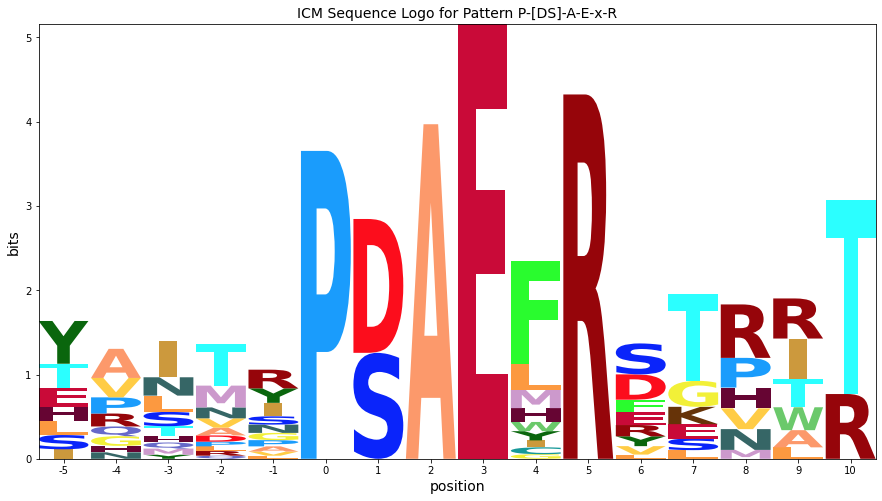

X^2 Critical Value = 40.15223303520055
Chi Square Tests


,index,Position,X^2,p-value,Critical pBH,Critical pBY,AAmax,PWMSmax,AAmin,PWMSmin
0,8,3,2987.6448863636356,0.000000e+00,0.003125,0.000924,E,4.874493064095775,S,-3.5402552251867188
1,10,5,1634.7180771754045,0.000000e+00,0.006250,0.001849,R,4.037553316515329,S,-3.5402552251867188
2,7,2,1261.078579988483,7.710648e-256,0.009375,0.002773,A,3.6843765821445316,S,-3.5402552251867188
3,5,0,995.7336966030945,4.320039e-199,0.012500,0.003697,P,3.3678879485275206,S,-3.5402552251867188
4,9,4,628.1515388047176,5.736967e-121,0.015625,0.004622,F,3.5541932855571168,S,-3.540255225186718
5,6,1,612.6898670509606,1.057896e-117,0.018750,0.005546,D,3.2351036905520414,L,-3.1730542010236507
6,12,7,219.0474952285587,5.350311e-36,0.021875,0.006470,T,2.4262879157282833,P,-2.6139216334529096
7,3,-2,184.06216956422784,4.895639e-29,0.025000,0.007395,M,2.4214668401491237,S,-3.3669236223011567
8,2,-3,159.76993689628324,2.811222e-24,0.028125,0.008319,I,2.7032993677895325,P,-2.6325373116202564
9,13,8,158.53918554594128,4.875198e-24,0.031250,0.009244,R,2.400532787231073,S,-2.9822597720658313


----------------------------------------------------------------------
a Pattern: N-[DS]-A-E-x-R
Position Probability Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.148148,0.0,0.000000,0.000000,0.000000,0.000000,0.074074,0.259259,0.000000,0.000000,0.000000,0.222222,0.148148,0.0,0.000000,0.074074,0.074074,0.000000,0.000000,0.000000
1,0.062500,0.0,0.000000,0.000000,0.187500,0.250000,0.062500,0.000000,0.156250,0.156250,0.000000,0.000000,0.000000,0.0,0.000000,0.125000,0.000000,0.000000,0.000000,0.000000
2,0.000000,0.0,0.062500,0.000000,0.000000,0.125000,0.000000,0.000000,0.000000,0.156250,0.000000,0.000000,0.000000,0.0,0.000000,0.250000,0.093750,0.062500,0.125000,0.125000
3,0.000000,0.0,0.081633,0.040816,0.061224,0.142857,0.142857,0.000000,0.040816,0.000000,0.000000,0.000000,0.163265,0.0,0.000000,0.285714,0.000000,0.040816,0.000000,0.000000
4,0.000000,0.0,0.105263,0.000000,0.070175,0.000000,0.000000,0.087719,0.035088,0.245614,0.105263,0.087719,0.000000,0.0,0.035088,0.122807,0.000000,0.070175,0.000000,0.035088
5,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
6,0.000000,0.0,0.477612,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.522388,0.000000,0.000000,0.000000,0.000000
7,1.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,0.000000,0.0,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


Position Weight Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.736693,1.074918,-1.206275,-0.395119,-0.796037,-1.586380,0.576707,2.186185,-0.373595,-1.999723,-0.485424,1.505291,0.420204,-0.577558,-1.232059,-0.781961,-0.230748,-1.478501,-0.291754,-0.975018
1,-0.146124,0.929067,-1.352125,-0.540970,1.865467,1.437694,0.430856,-0.959666,2.065516,0.439389,-0.631275,-1.447915,-2.047575,-0.723409,-1.377909,-0.190846,-1.961562,-1.624352,-0.437605,-1.120868
2,-1.731086,0.929067,0.232837,-0.540970,-0.941888,0.589697,-1.154106,-0.959666,-0.519446,0.439389,-0.631275,-1.447915,-2.047575,-0.723409,-1.377909,0.657151,0.038438,-0.039390,1.884323,1.201060
3,-2.139171,0.520983,0.561718,0.635908,0.650027,0.859684,1.437809,-1.367750,0.657432,-2.553658,-1.039359,-1.856000,0.714265,-1.131494,-1.785994,0.986031,-2.369646,-0.447475,-0.845690,-1.528953
4,-2.297433,0.362721,0.888883,-1.107317,0.813693,-2.298578,-1.720453,1.058950,0.499170,1.194970,1.609733,0.570701,-2.613922,-1.289756,-0.359294,-0.079121,-2.527908,0.131229,-1.003952,-0.102253
5,-2.473590,0.186564,-2.094629,-1.283473,-1.684392,-2.474735,-1.896610,-1.702169,-1.261950,-2.888077,-1.373778,3.897044,-2.790079,-1.465913,-2.120413,-3.255278,-2.704065,-2.366856,-1.180109,-1.863372
6,-2.473590,0.186564,2.949765,-1.283473,-1.684392,-2.474735,-1.896610,-1.702169,-1.261950,-2.888077,-1.373778,-2.190419,-2.790079,-1.465913,-2.120413,1.914647,-2.704065,-2.366856,-1.180109,-1.863372
7,3.613873,0.186564,-2.094629,-1.283473,-1.684392,-2.474735,-1.896610,-1.702169,-1.261950,-2.888077,-1.373778,-2.190419,-2.790079,-1.465913,-2.120413,-3.255278,-2.704065,-2.366856,-1.180109,-1.863372
8,-2.473590,0.186564,-2.094629,4.803989,-1.684392,-2.474735,-1.896610,-1.702169,-1.261950,-2.888077,-1.373778,-2.190419,-2.790079,-1.465913,-2.120413,-3.255278,-2.704065,-2.366856,-1.180109,-1.863372


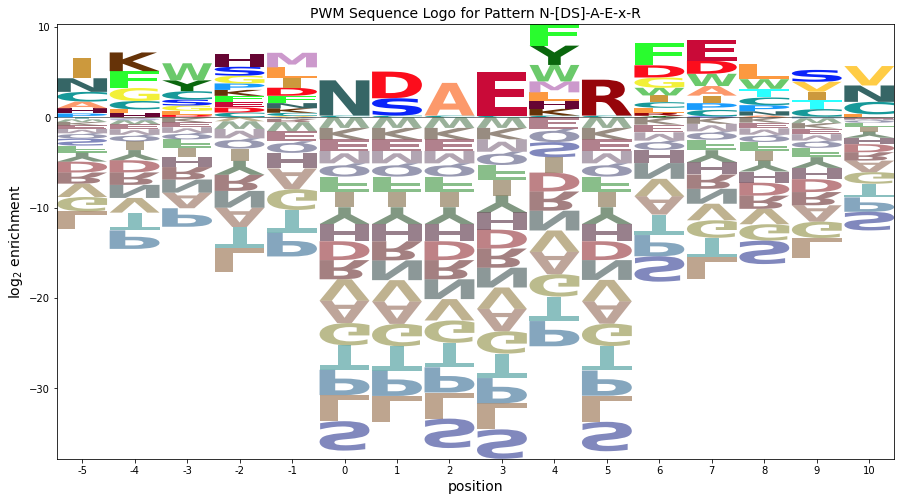

Information Content Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.224497,0.0,0.000000,0.000000,0.000000,0.000000,0.112248,0.392869,0.000000,0.000000,0.000000,0.336745,0.224497,0.0,0.000000,0.112248,0.112248,0.000000,0.000000,0.000000
1,0.094702,0.0,0.000000,0.000000,0.284106,0.378808,0.094702,0.000000,0.236755,0.236755,0.000000,0.000000,0.000000,0.0,0.000000,0.189404,0.000000,0.000000,0.000000,0.000000
2,0.000000,0.0,0.068258,0.000000,0.000000,0.136516,0.000000,0.000000,0.000000,0.170645,0.000000,0.000000,0.000000,0.0,0.000000,0.273032,0.102387,0.068258,0.136516,0.136516
3,0.000000,0.0,0.090286,0.045143,0.067714,0.158000,0.158000,0.000000,0.045143,0.000000,0.000000,0.000000,0.180572,0.0,0.000000,0.316001,0.000000,0.045143,0.000000,0.000000
4,0.000000,0.0,0.099310,0.000000,0.066207,0.000000,0.000000,0.082758,0.033103,0.231724,0.099310,0.082758,0.000000,0.0,0.033103,0.115862,0.000000,0.066207,0.000000,0.033103
5,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,4.252525,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
6,0.000000,0.0,1.310305,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,1.433146,0.000000,0.000000,0.000000,0.000000
7,3.969354,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,0.000000,0.0,0.000000,5.159470,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


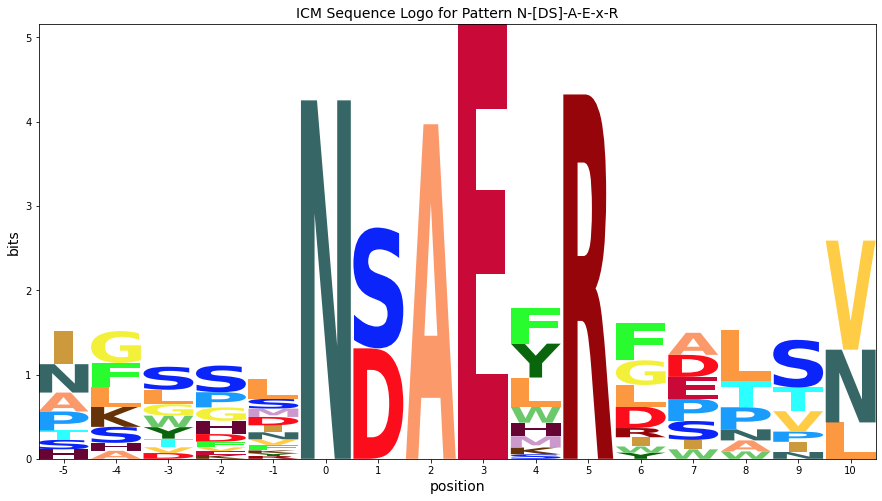

X^2 Critical Value = 40.15223303520055
Chi Square Tests


,index,Position,X^2,p-value,Critical pBH,Critical pBY,AAmax,PWMSmax,AAmin,PWMSmin
0,8,3,2327.5838068181824,0.000000e+00,0.003125,0.000924,E,4.803989368211857,S,-3.255278266472247
1,10,5,1273.5594322180473,1.633824e-258,0.006250,0.001849,R,3.9670496206314105,S,-3.255278266472247
2,5,0,1210.0629900382562,6.498221e-245,0.009375,0.002773,N,3.8970441260988764,S,-3.255278266472247
3,7,2,982.4681960375391,2.928505e-196,0.012500,0.003697,A,3.613872886260614,S,-3.255278266472247
4,6,1,410.9018303042468,2.362995e-75,0.015625,0.004622,D,2.9497649245097577,L,-2.888077242309179
5,9,4,204.94491346714028,3.527958e-33,0.018750,0.005546,F,2.403071129464914,P,-2.7900785886067365
6,11,6,118.35111896560748,2.253971e-16,0.021875,0.006470,F,2.458991502204395,S,-2.812334770623519
7,15,10,101.89659354665011,2.425248e-13,0.025000,0.007395,V,2.1500879836432394,S,-2.0602622840671043
8,12,7,86.18512208257816,1.561307e-10,0.028125,0.008319,E,2.2525794272017268,L,-2.3520243420689697
9,1,-4,76.7122499044497,6.809543e-09,0.031250,0.009244,K,2.065516336884081,P,-2.047574810899101


----------------------------------------------------------------------
b Pattern: L-[DS]-A-E-F
Position Probability Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.235294,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.058824,0.147059,0.000000,0.000000,0.352941,0.000000,0.205882,0.000000
1,0.000000,0.0,0.041667,0.000000,0.000000,0.104167,0.000000,0.000000,0.000000,0.062500,0.145833,0.416667,0.104167,0.083333,0.000000,0.000000,0.041667,0.000000,0.000000,0.000000
2,0.070175,0.0,0.000000,0.000000,0.000000,0.087719,0.035088,0.000000,0.000000,0.070175,0.000000,0.000000,0.122807,0.210526,0.000000,0.280702,0.122807,0.000000,0.000000,0.000000
3,0.000000,0.0,0.065574,0.065574,0.000000,0.000000,0.049180,0.032787,0.000000,0.000000,0.065574,0.262295,0.000000,0.032787,0.000000,0.147541,0.000000,0.196721,0.081967,0.000000
4,0.000000,0.0,0.126761,0.028169,0.000000,0.000000,0.000000,0.056338,0.000000,0.056338,0.098592,0.070423,0.084507,0.000000,0.000000,0.140845,0.042254,0.000000,0.000000,0.295775
5,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
6,0.000000,0.0,0.746479,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.253521,0.000000,0.000000,0.000000,0.000000
7,1.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,0.000000,0.0,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


Position Weight Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,1.384391,0.874620,-1.406573,-0.595417,-0.996336,-1.786679,-1.208554,-1.014113,-0.573894,-2.200021,-0.685722,-1.502363,-0.517060,1.807106,-1.432357,-2.567222,1.684430,-1.678800,2.507947,-1.175316
1,-2.118109,0.542044,-0.154186,-0.927993,-1.328911,0.465709,-1.541129,-1.346689,-0.906469,-0.532597,1.981702,2.557379,0.150365,1.211496,-1.764933,-2.899798,-0.763622,-2.011375,-0.824628,-1.507892
2,0.024495,0.362721,-1.918472,-1.107317,-1.508235,0.286385,-0.135490,-1.526012,-1.085793,-0.389992,-1.197621,-2.014262,0.386078,2.410684,-1.944256,1.008342,0.472092,-2.190699,-1.003952,-1.687215
3,-2.370496,0.289657,0.330392,1.141548,-1.581298,-2.371641,0.206484,-0.014113,-1.158856,-2.784984,1.051243,2.000138,-2.686985,0.222143,-2.017320,0.169743,-2.600972,1.436677,1.507947,-1.760279
4,-2.538441,0.121713,1.162448,0.236638,-1.749243,-2.539586,-1.961461,0.554908,-1.326801,-0.631000,1.561370,0.329693,-0.047575,-1.530764,-2.185264,0.139302,-0.768916,-2.431707,-1.244960,2.531208
5,-2.538441,0.121713,-2.159480,-1.348325,-1.749243,-2.539586,-1.961461,-1.767021,-1.326801,3.216997,-1.438630,-2.255270,-2.854930,-1.530764,-2.185264,-3.320129,-2.768916,-2.431707,-1.244960,-1.928223
6,-2.538441,0.121713,3.595407,-1.348325,-1.749243,-2.539586,-1.961461,-1.767021,-1.326801,-2.952928,-1.438630,-2.255270,-2.854930,-1.530764,-2.185264,0.927798,-2.768916,-2.431707,-1.244960,-1.928223
7,3.631484,0.121713,-2.159480,-1.348325,-1.749243,-2.539586,-1.961461,-1.767021,-1.326801,-2.952928,-1.438630,-2.255270,-2.854930,-1.530764,-2.185264,-3.320129,-2.768916,-2.431707,-1.244960,-1.928223
8,-2.538441,0.121713,-2.159480,4.821600,-1.749243,-2.539586,-1.961461,-1.767021,-1.326801,-2.952928,-1.438630,-2.255270,-2.854930,-1.530764,-2.185264,-3.320129,-2.768916,-2.431707,-1.244960,-1.928223


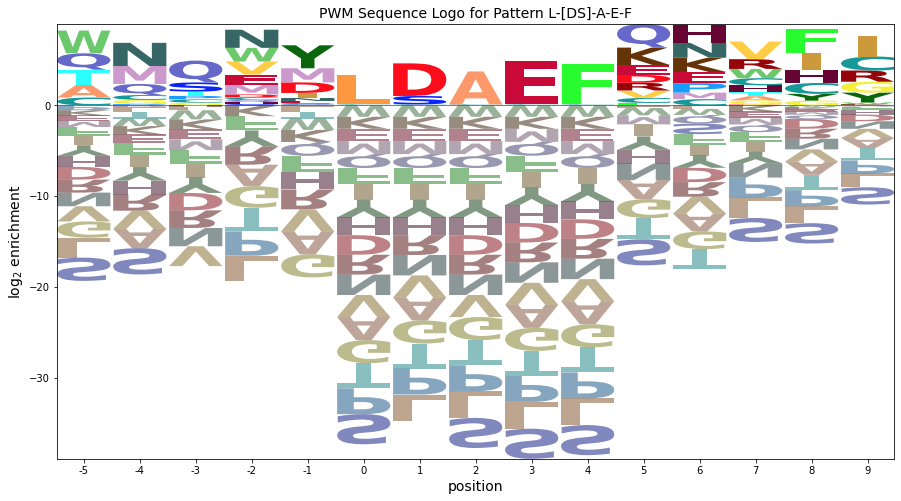

Information Content Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.504907,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.126227,0.315567,0.000000,0.000000,0.757360,0.000000,0.441793,0.000000
1,0.000000,0.0,0.072373,0.000000,0.000000,0.180931,0.000000,0.000000,0.000000,0.108559,0.253304,0.723725,0.180931,0.144745,0.000000,0.000000,0.072373,0.000000,0.000000,0.000000
2,0.079972,0.0,0.000000,0.000000,0.000000,0.099965,0.039986,0.000000,0.000000,0.079972,0.000000,0.000000,0.139951,0.239916,0.000000,0.319888,0.139951,0.000000,0.000000,0.000000
3,0.000000,0.0,0.087587,0.087587,0.000000,0.000000,0.065690,0.043793,0.000000,0.000000,0.087587,0.350346,0.000000,0.043793,0.000000,0.197070,0.000000,0.262760,0.109483,0.000000
4,0.000000,0.0,0.156122,0.034694,0.000000,0.000000,0.000000,0.069387,0.000000,0.069387,0.121428,0.086734,0.104081,0.000000,0.000000,0.173469,0.052041,0.000000,0.000000,0.364284
5,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.554866,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
6,0.000000,0.0,2.416542,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.820712,0.000000,0.000000,0.000000,0.000000
7,3.969354,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,0.000000,0.0,0.000000,5.159470,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


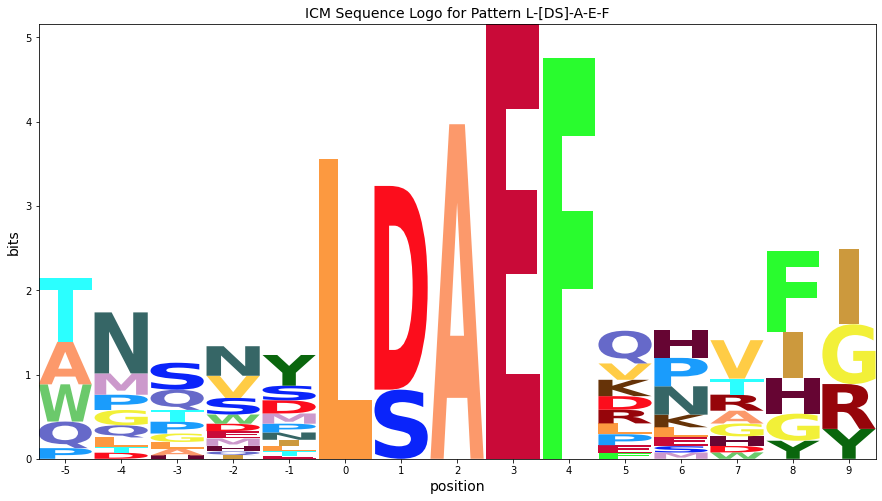

X^2 Critical Value = 39.938849338465694
Chi Square Tests


,index,Position,X^2,p-value,Critical pBH,Critical pBY,AAmax,PWMSmax,AAmin,PWMSmin
0,8,3,2466.54403409091,0.000000e+00,0.003333,0.001005,E,4.821600384053863,S,-3.3201294108222146
1,9,4,1850.8751512869476,0.000000e+00,0.006667,0.002009,F,4.42068214530692,S,-3.3201294108222146
2,7,2,1041.1230137114221,8.781029e-209,0.010000,0.003014,A,3.6314839021026195,S,-3.3201294108222137
3,6,1,776.4512329343,2.167447e-152,0.013333,0.004018,D,3.5954071629648054,L,-2.9529283866591465
4,5,0,763.4104252784979,1.274566e-149,0.016667,0.005023,L,3.2169966147831657,S,-3.3201294108222146
5,1,-4,175.3242414123813,2.569420e-27,0.020000,0.006027,N,2.557379362225687,S,-2.899797611873858
6,4,-1,162.22320729787197,9.368464e-25,0.023333,0.007032,Y,2.531208274308903,G,-2.539585765922536
7,0,-5,132.00120411434855,6.090446e-19,0.026667,0.008036,W,2.507947379343869,S,-2.5672222727869873
8,10,5,129.10749871654642,2.150657e-18,0.030000,0.009041,Q,2.6113810500864547,S,-2.878423961081291
9,13,8,127.92820668581854,3.592206e-18,0.033333,0.010046,F,2.6542151242485668,S,-2.238599525325618


----------------------------------------------------------------------
c Pattern: A-E-[FY]-R-A
Position Probability Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.000000,0.0,0.000000,0.080000,0.160000,0.000000,0.080000,0.000000,0.000000,0.680000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,0.100000,0.0,0.000000,0.000000,0.133333,0.000000,0.000000,0.066667,0.000000,0.000000,0.000000,0.133333,0.166667,0.000000,0.233333,0.066667,0.000000,0.100000,0.000000,0.000000
2,0.000000,0.0,0.068182,0.068182,0.090909,0.272727,0.045455,0.000000,0.000000,0.068182,0.000000,0.045455,0.090909,0.000000,0.068182,0.045455,0.045455,0.000000,0.000000,0.090909
3,0.050847,0.0,0.203390,0.067797,0.000000,0.000000,0.000000,0.000000,0.000000,0.118644,0.000000,0.033898,0.067797,0.050847,0.033898,0.169492,0.203390,0.000000,0.000000,0.000000
4,0.046875,0.0,0.234375,0.125000,0.000000,0.062500,0.000000,0.000000,0.000000,0.046875,0.000000,0.046875,0.000000,0.000000,0.000000,0.187500,0.218750,0.000000,0.000000,0.031250
5,1.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
6,0.000000,0.0,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
7,0.000000,0.0,0.000000,0.000000,0.651515,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.348485
8,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000


Position Weight Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,-1.522500,1.137654,-1.143539,1.252579,1.588627,-1.523644,0.639443,-0.751079,-0.310860,2.232938,-0.422688,-1.239328,-1.838988,-0.514823,-1.169323,-2.304188,-1.752975,-1.415766,-0.229018,-0.912282
1,0.325497,0.985651,-1.295542,-0.484386,1.436624,-1.675647,-1.097523,0.681880,-0.462863,-2.088990,-0.574691,0.930597,0.593971,-0.666826,1.678674,-0.871228,-1.904978,0.432231,-0.381021,-1.064285
2,-2.030646,0.629507,0.348314,1.159470,1.080480,1.668649,0.131296,-1.259226,-0.819006,-0.445134,-0.930835,-0.162513,-0.025207,-1.022969,0.322530,-1.227372,-0.676159,-1.923913,-0.737165,0.901499
3,-0.334427,0.325726,1.744973,1.177617,-1.545229,-2.335572,-1.757447,-1.563007,-1.122787,0.251086,-1.234616,-0.466293,-0.328988,0.673250,-0.396288,0.343316,1.135537,-2.227693,-1.040946,-1.724209
4,-0.422964,0.237190,1.955997,1.937078,-1.633766,-0.102180,-1.845984,-1.651543,-1.211324,-0.837451,-1.323152,-0.139793,-2.739453,-1.415287,-2.069787,0.495788,1.253451,-2.316230,-1.129483,-0.227784
5,3.609178,0.203242,-2.077950,-1.266795,-1.667713,-2.458056,-1.879931,-1.685491,-1.245271,-2.871399,-1.357100,-2.173740,-2.773400,-1.449234,-2.103734,-3.238600,-2.687387,-2.350177,-1.163430,-1.846693
6,-2.456911,0.203242,-2.077950,4.799294,-1.667713,-2.458056,-1.879931,-1.685491,-1.245271,-2.871399,-1.357100,-2.173740,-2.773400,-1.449234,-2.103734,-3.238600,-2.687387,-2.350177,-1.163430,-1.846693
7,-2.456911,0.203242,-2.077950,-1.266795,3.791719,-2.458056,-1.879931,-1.685491,-1.245271,-2.871399,-1.357100,-2.173740,-2.773400,-1.449234,-2.103734,-3.238600,-2.687387,-2.350177,-1.163430,2.738269
8,-2.456911,0.203242,-2.077950,-1.266795,-1.667713,-2.458056,-1.879931,-1.685491,-1.245271,-2.871399,-1.357100,-2.173740,-2.773400,-1.449234,3.962355,-3.238600,-2.687387,-2.350177,-1.163430,-1.846693


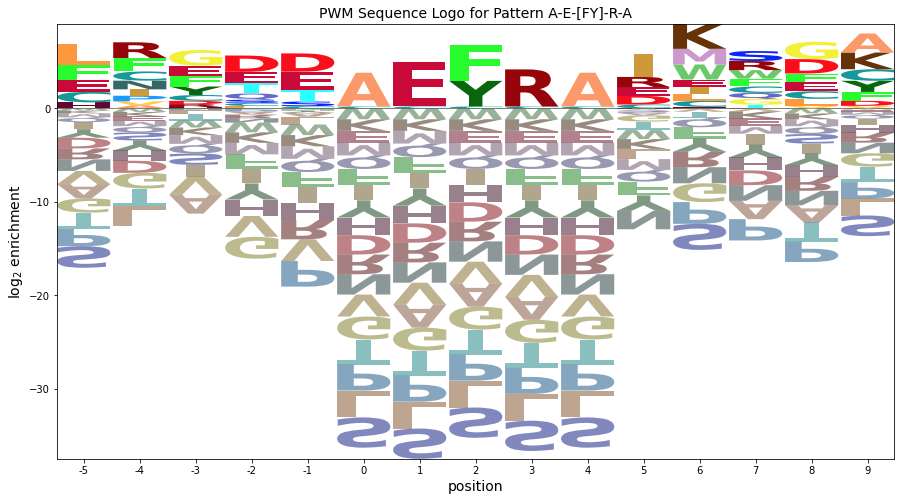

Information Content Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.000000,0.0,0.000000,0.205661,0.411322,0.000000,0.205661,0.000000,0.000000,1.748117,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,0.127079,0.0,0.000000,0.000000,0.169439,0.000000,0.000000,0.084719,0.000000,0.000000,0.000000,0.169439,0.211798,0.000000,0.296518,0.084719,0.000000,0.127079,0.000000,0.000000
2,0.000000,0.0,0.057355,0.057355,0.076473,0.229419,0.038236,0.000000,0.000000,0.057355,0.000000,0.038236,0.076473,0.000000,0.057355,0.038236,0.038236,0.000000,0.000000,0.076473
3,0.046874,0.0,0.187496,0.062499,0.000000,0.000000,0.000000,0.000000,0.000000,0.109372,0.000000,0.031249,0.062499,0.046874,0.031249,0.156246,0.187496,0.000000,0.000000,0.000000
4,0.056140,0.0,0.280699,0.149706,0.000000,0.074853,0.000000,0.000000,0.000000,0.056140,0.000000,0.056140,0.000000,0.000000,0.000000,0.224559,0.261986,0.000000,0.000000,0.037427
5,3.969354,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
6,0.000000,0.0,0.000000,5.159470,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
7,0.000000,0.0,0.000000,0.000000,2.451959,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.311513
8,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,4.322530,0.000000,0.000000,0.000000,0.000000,0.000000


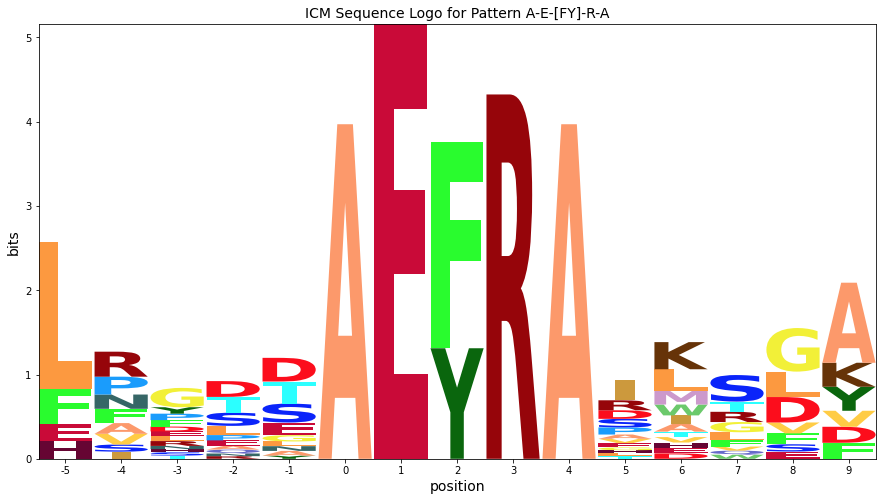

X^2 Critical Value = 39.938849338465694
Chi Square Tests


,index,Position,X^2,p-value,Critical pBH,Critical pBY,AAmax,PWMSmax,AAmin,PWMSmin
0,6,1,2292.8437499999995,0.000000e+00,0.003333,0.001005,E,4.79929445856592,S,-3.238599525325617
1,8,3,1254.5510824834496,1.929267e-254,0.006667,0.002009,R,3.962354710985474,S,-3.238599525325617
2,5,0,967.8044916190681,3.939417e-193,0.010000,0.003014,A,3.6091779766146765,S,-3.238599525325618
3,9,4,967.8044916190681,3.939417e-193,0.013333,0.004018,A,3.6091779766146765,S,-3.238599525325618
4,7,2,883.9788605894482,2.912267e-175,0.016667,0.005023,F,3.791718647998502,S,-3.238599525325617
5,0,-5,137.6370202523748,5.160121e-20,0.020000,0.006027,L,2.2329381586521864,S,-2.304187866953194
6,4,-1,116.68141349409017,4.613898e-16,0.023333,0.007032,D,1.9559968782212724,P,-2.7394525155367684
7,11,6,111.74072842730307,3.804935e-15,0.026667,0.008036,K,2.6631452494413987,S,-2.789614694123435
8,10,5,98.95566307082308,8.273989e-13,0.030000,0.009041,I,2.418845978320833,N,-1.9762939097986152
9,13,8,86.2932183579493,1.494574e-10,0.033333,0.010046,G,1.861293670359648,P,-2.154490014815613


----------------------------------------------------------------------
d Pattern: A-E-[FY]-R-T
Position Probability Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.000000,0.0,0.000000,0.096774,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.193548,0.064516,0.580645,0.000000,0.000000,0.000000,0.064516,0.000000,0.000000
1,0.086957,0.0,0.000000,0.000000,0.108696,0.043478,0.195652,0.282609,0.0,0.000000,0.108696,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.043478,0.043478,0.086957
2,0.068966,0.0,0.034483,0.034483,0.034483,0.000000,0.000000,0.068966,0.0,0.120690,0.155172,0.000000,0.000000,0.000000,0.034483,0.120690,0.275862,0.051724,0.000000,0.000000
3,0.155172,0.0,0.000000,0.051724,0.000000,0.155172,0.000000,0.000000,0.0,0.034483,0.000000,0.189655,0.034483,0.000000,0.034483,0.051724,0.224138,0.000000,0.000000,0.068966
4,0.000000,0.0,0.064516,0.112903,0.000000,0.274194,0.000000,0.032258,0.0,0.000000,0.000000,0.258065,0.000000,0.000000,0.000000,0.129032,0.129032,0.000000,0.000000,0.000000
5,1.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
6,0.000000,0.0,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
7,0.000000,0.0,0.000000,0.000000,0.629032,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.370968
8,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000


Position Weight Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,-1.703072,0.957082,-1.324111,1.487045,-0.913874,-1.704216,-1.126092,-0.931651,-0.491432,-2.117559,-0.603260,1.387454,-0.434598,3.552533,-1.349895,-2.484760,-1.933547,-0.011375,-0.409590,-1.092854
1,0.246888,0.585113,-1.696080,-0.884924,1.299120,-0.491223,1.823868,2.503735,-0.863401,-2.489528,1.609733,-1.791869,-2.391529,-1.067364,-1.721864,-2.856729,-2.305516,-0.383344,0.803403,0.857105
2,0.005879,0.344105,-0.352125,0.459030,0.058112,-2.317193,-1.739069,0.777300,-1.104409,0.269464,2.105691,-2.032877,-2.632537,-1.308372,-0.377909,-0.097737,1.540939,-0.209315,-1.022567,-1.705831
3,1.005879,0.344105,-1.937088,0.874068,-1.526850,1.004735,-1.739069,-1.544628,-1.104409,-1.145573,-1.216237,1.552085,-1.047575,-1.308372,-0.377909,-1.097737,1.260831,-2.209315,-1.022567,0.616097
4,-2.388198,0.271955,0.312690,1.801918,-1.599000,1.780582,-1.811218,-0.031815,-1.176558,-2.802686,-1.288387,1.982436,-2.704687,-1.380521,-2.035022,0.000038,0.551251,-2.281465,-1.094717,-1.777981
5,3.589081,0.271955,-2.009238,-1.198082,-1.599000,-2.389343,-1.811218,-1.616778,-1.176558,-2.802686,-1.288387,-2.105027,-2.704687,-1.380521,-2.035022,-3.169887,-2.618674,-2.281465,-1.094717,-1.777981
6,-2.388198,0.271955,-2.009238,4.779198,-1.599000,-2.389343,-1.811218,-1.616778,-1.176558,-2.802686,-1.288387,-2.105027,-2.704687,-1.380521,-2.035022,-3.169887,-2.618674,-2.281465,-1.094717,-1.777981
7,-2.388198,0.271955,-2.009238,-1.198082,3.722928,-2.389343,-1.811218,-1.616778,-1.176558,-2.802686,-1.288387,-2.105027,-2.704687,-1.380521,-2.035022,-3.169887,-2.618674,-2.281465,-1.094717,2.806982
8,-2.388198,0.271955,-2.009238,-1.198082,-1.599000,-2.389343,-1.811218,-1.616778,-1.176558,-2.802686,-1.288387,-2.105027,-2.704687,-1.380521,3.942258,-3.169887,-2.618674,-2.281465,-1.094717,-1.777981


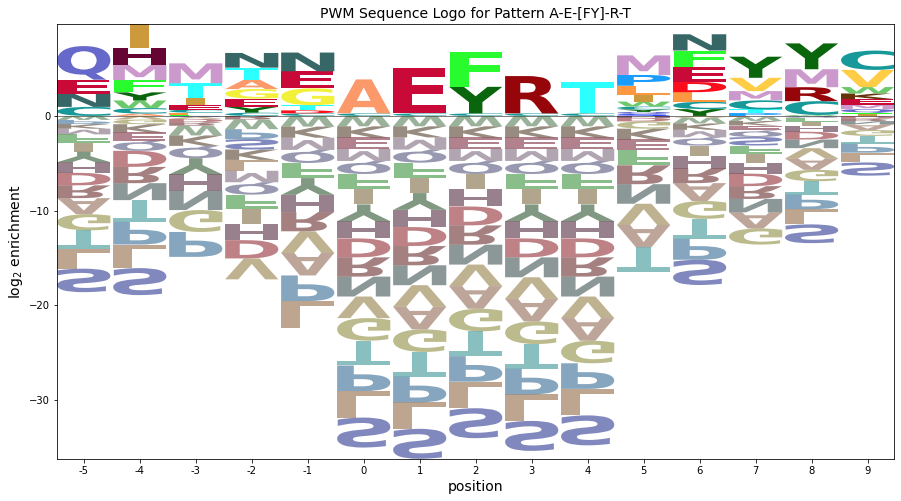

Information Content Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.000000,0.0,0.000000,0.286518,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.573036,0.191012,1.719108,0.000000,0.000000,0.000000,0.191012,0.000000,0.000000
1,0.151732,0.0,0.000000,0.000000,0.189665,0.075866,0.341396,0.493128,0.0,0.000000,0.189665,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.075866,0.075866,0.151732
2,0.068624,0.0,0.034312,0.034312,0.034312,0.000000,0.000000,0.068624,0.0,0.120093,0.154405,0.000000,0.000000,0.000000,0.034312,0.120093,0.274497,0.051468,0.000000,0.000000
3,0.161076,0.0,0.000000,0.053692,0.000000,0.161076,0.000000,0.000000,0.0,0.035795,0.000000,0.196870,0.035795,0.000000,0.035795,0.053692,0.232665,0.000000,0.000000,0.071589
4,0.000000,0.0,0.099773,0.174602,0.000000,0.424034,0.000000,0.049886,0.0,0.000000,0.000000,0.399091,0.000000,0.000000,0.000000,0.199545,0.199545,0.000000,0.000000,0.000000
5,3.969354,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
6,0.000000,0.0,0.000000,5.159470,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
7,0.000000,0.0,0.000000,0.000000,2.353048,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.387695
8,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,4.322530,0.000000,0.000000,0.000000,0.000000,0.000000


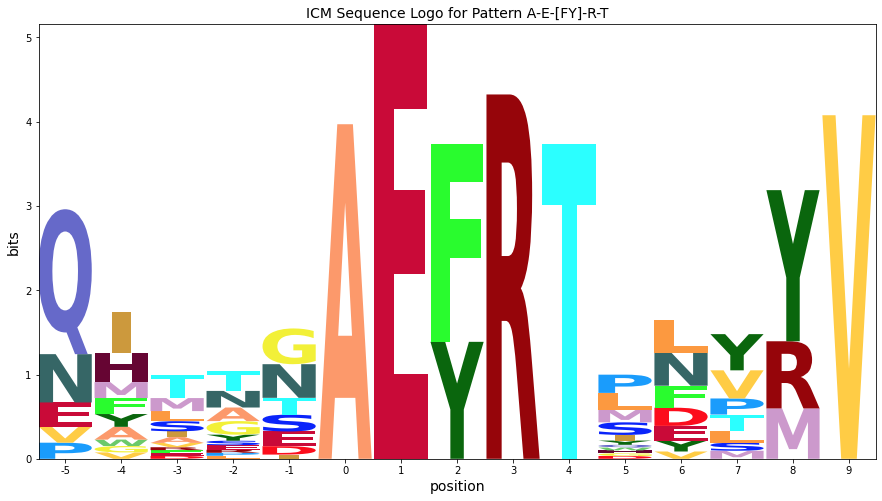

X^2 Critical Value = 39.938849338465694
Chi Square Tests


,index,Position,X^2,p-value,Critical pBH,Critical pBY,AAmax,PWMSmax,AAmin,PWMSmin
0,6,1,2153.8835227272725,0.000000e+00,0.003333,0.001005,E,4.779197941692078,S,-3.169886775241603
1,8,3,1178.5176835450588,3.676418e-238,0.006667,0.002009,R,3.9422581941116324,S,-3.169886775241603
2,5,0,909.1496739451853,1.264354e-180,0.010000,0.003014,A,3.589081459740835,S,-3.169886775241603
3,7,2,806.0658544070957,1.104177e-158,0.013333,0.004018,F,3.7229278743325813,S,-3.169886775241603
4,9,4,765.763288805168,4.034355e-150,0.016667,0.005023,T,3.3586060649181424,S,-3.169886775241603
5,0,-5,334.4793086505102,1.633131e-59,0.020000,0.006027,Q,3.552532693875225,S,-2.4847601125950143
6,4,-1,148.07184488528833,5.156892e-22,0.023333,0.007032,N,1.982435617329521,L,-2.802685751078535
7,1,-4,146.26215566596684,1.149839e-21,0.026667,0.008036,I,2.503734875907346,S,-2.8567288899819725
8,13,8,143.93913263419068,3.212668e-21,0.030000,0.009041,Y,2.731574389315352,S,-1.9822597720658313
9,11,6,89.2117627810844,4.574008e-11,0.033333,0.010046,N,1.7164718804570556,S,-2.670315765751092


----------------------------------------------------------------------
e Pattern: A-E-[FY]-R-S
Position Probability Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.000000,0.0,0.000000,0.000000,0.000000,0.075472,0.264151,0.000000,0.000000,0.000000,0.000000,0.037736,0.000000,0.000000,0.000000,0.150943,0.094340,0.283019,0.0,0.094340
1,0.304348,0.0,0.101449,0.000000,0.000000,0.000000,0.000000,0.000000,0.057971,0.057971,0.072464,0.101449,0.000000,0.028986,0.000000,0.173913,0.101449,0.000000,0.0,0.000000
2,0.215190,0.0,0.050633,0.000000,0.000000,0.253165,0.000000,0.000000,0.000000,0.025316,0.000000,0.000000,0.050633,0.000000,0.000000,0.253165,0.063291,0.000000,0.0,0.088608
3,0.025316,0.0,0.000000,0.025316,0.063291,0.000000,0.000000,0.050633,0.037975,0.189873,0.000000,0.000000,0.392405,0.025316,0.075949,0.000000,0.025316,0.000000,0.0,0.088608
4,0.024096,0.0,0.192771,0.060241,0.000000,0.048193,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.349398,0.325301,0.000000,0.0,0.000000
5,1.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000
6,0.000000,0.0,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000
7,0.000000,0.0,0.000000,0.000000,0.566265,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.433735
8,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.0,0.000000


Position Weight Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,-2.220471,0.439683,-1.841510,-1.030355,-1.431273,0.100312,2.263400,-1.449050,-1.008831,-2.634958,-1.120659,-0.352337,-2.536960,-1.212794,-1.867294,0.167766,0.134016,1.886263,-0.926990,0.974709
1,1.953052,0.153774,0.872581,-1.316263,-1.717182,-2.507525,-1.929400,-1.734959,1.027188,-0.598939,1.178394,0.776791,-2.822869,0.086260,-2.153203,0.412372,0.263145,-2.399646,-1.212899,-1.896162
2,1.509922,0.000151,0.040886,-1.469887,-1.870805,1.731170,-2.083023,-1.888583,-1.448363,-1.489528,-1.560192,-2.376832,-0.654564,-1.652326,-2.306826,0.950626,-0.305516,-2.553269,-1.366522,0.950215
3,-1.075041,0.000151,-2.281042,0.115076,0.714158,-2.661148,-2.083023,0.433346,0.551637,0.925510,-1.560192,-2.376832,2.023508,-0.067364,0.500529,-3.441691,-1.305516,-2.553269,-1.366522,0.950215
4,-1.132184,-0.056993,1.749277,1.057932,-1.927949,-0.396364,-2.140167,-1.945726,-1.505507,-3.131634,-1.617335,-2.433976,-3.033636,-1.709470,-2.363970,1.408055,1.859733,-2.610413,-1.423666,-2.106929
5,3.675170,-0.056993,-2.338186,-1.527031,-1.927949,-2.718292,-2.140167,-1.945726,-1.505507,-3.131634,-1.617335,-2.433976,-3.033636,-1.709470,-2.363970,-3.498835,-2.947622,-2.610413,-1.423666,-2.106929
6,-2.717147,-0.056993,-2.338186,4.865287,-1.927949,-2.718292,-2.140167,-1.945726,-1.505507,-3.131634,-1.617335,-2.433976,-3.033636,-1.709470,-2.363970,-3.498835,-2.947622,-2.610413,-1.423666,-2.106929
7,-2.717147,-0.056993,-2.338186,-1.527031,3.657014,-2.718292,-2.140167,-1.945726,-1.505507,-3.131634,-1.617335,-2.433976,-3.033636,-1.709470,-2.363970,-3.498835,-2.947622,-2.610413,-1.423666,3.102524
8,-2.717147,-0.056993,-2.338186,-1.527031,-1.927949,-2.718292,-2.140167,-1.945726,-1.505507,-3.131634,-1.617335,-2.433976,-3.033636,-1.709470,4.028347,-3.498835,-2.947622,-2.610413,-1.423666,-2.106929


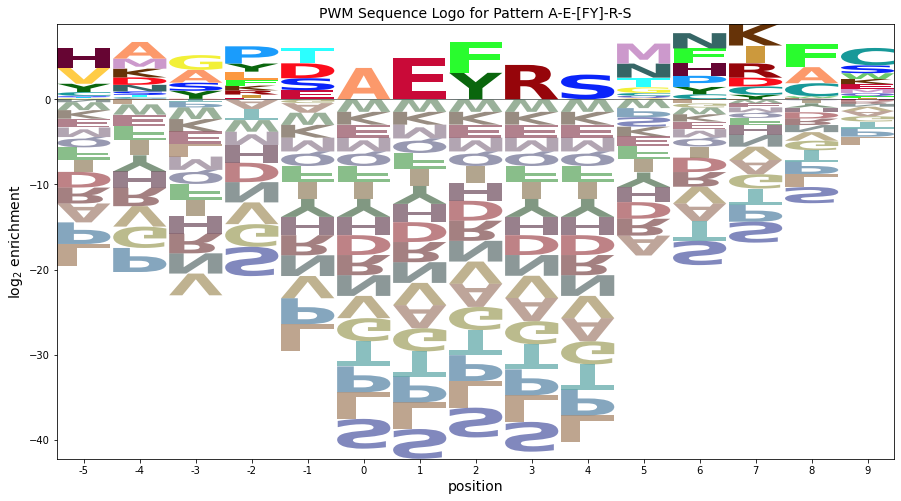

Information Content Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.000000,0.0,0.000000,0.000000,0.000000,0.116493,0.407726,0.000000,0.000000,0.000000,0.000000,0.058247,0.000000,0.000000,0.000000,0.232986,0.145616,0.436849,0.0,0.145616
1,0.355354,0.0,0.118451,0.000000,0.000000,0.000000,0.000000,0.000000,0.067687,0.067687,0.084608,0.118451,0.000000,0.033843,0.000000,0.203060,0.118451,0.000000,0.0,0.000000
2,0.256291,0.0,0.060304,0.000000,0.000000,0.301518,0.000000,0.000000,0.000000,0.030152,0.000000,0.000000,0.060304,0.000000,0.000000,0.301518,0.075380,0.000000,0.0,0.105531
3,0.032127,0.0,0.000000,0.032127,0.080318,0.000000,0.000000,0.064254,0.048191,0.240954,0.000000,0.000000,0.497971,0.032127,0.096382,0.000000,0.032127,0.000000,0.0,0.112445
4,0.040156,0.0,0.321251,0.100391,0.000000,0.080313,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.582268,0.542111,0.000000,0.0,0.000000
5,3.969354,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000
6,0.000000,0.0,0.000000,5.159470,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000
7,0.000000,0.0,0.000000,0.000000,2.091573,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,1.602056
8,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,4.322530,0.000000,0.000000,0.000000,0.0,0.000000


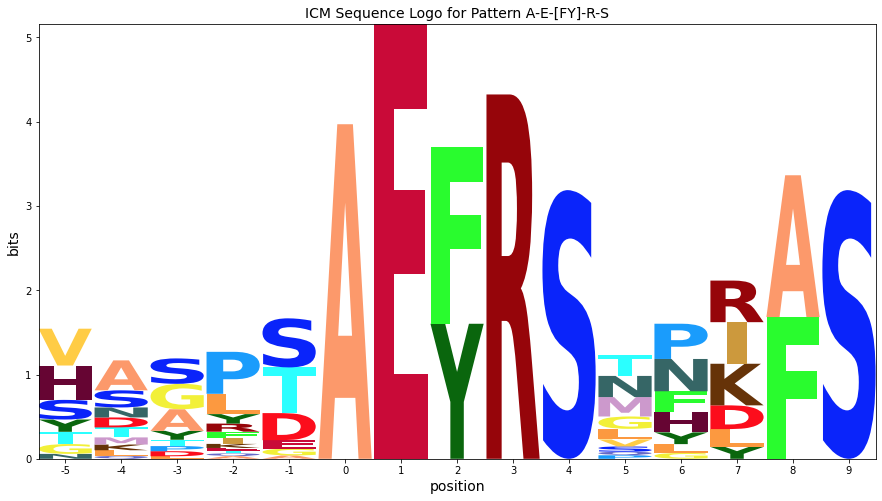

X^2 Critical Value = 39.938849338465694
Chi Square Tests


,index,Position,X^2,p-value,Critical pBH,Critical pBY,AAmax,PWMSmax,AAmin,PWMSmin
0,6,1,2883.4247159090905,0.000000e+00,0.003333,0.001005,E,4.865286918405788,S,-3.4988352978067376
1,8,3,1577.6930279716107,0.000000e+00,0.006667,0.002009,R,4.0283471708253415,S,-3.4988352978067376
2,5,0,1217.0874667330709,2.036013e-246,0.010000,0.003014,A,3.6751704364545446,S,-3.4988352978067376
3,7,2,1010.7670291302072,2.668370e-202,0.013333,0.004018,F,3.6570137576012405,S,-3.4988352978067376
4,9,4,673.2422596414995,1.669024e-130,0.016667,0.005023,S,2.893482124972023,L,-3.1316342736436695
5,4,-1,203.94725681161034,5.576167e-33,0.020000,0.006027,T,1.8597325409106955,L,-3.1316342736436695
6,3,-2,154.41672786142263,3.070898e-23,0.023333,0.007032,P,2.0235082871623824,S,-3.4416913907031286
7,0,-5,139.7548170271397,2.033576e-20,0.026667,0.008036,H,2.263399583879036,L,-2.6349583053404686
8,13,8,135.56328982386333,1.281818e-19,0.030000,0.009041,F,2.6710889428129634,S,-1.8997976118738582
9,2,-3,130.00533665831907,1.454633e-18,0.033333,0.010046,G,1.7311696769753118,V,-2.553269217880146


----------------------------------------------------------------------
f Pattern: N-A-E-[FY]-R
Position Probability Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.000000,0.0,0.136364,0.0,0.136364,0.090909,0.000000,0.090909,0.000000,0.090909,0.000000,0.000000,0.000000,0.000000,0.227273,0.136364,0.090909,0.000000,0.000000,0.000000
1,0.000000,0.0,0.000000,0.0,0.088235,0.058824,0.000000,0.000000,0.058824,0.147059,0.000000,0.088235,0.117647,0.147059,0.000000,0.000000,0.117647,0.176471,0.000000,0.000000
2,0.113636,0.0,0.000000,0.0,0.113636,0.000000,0.068182,0.000000,0.000000,0.113636,0.000000,0.000000,0.068182,0.000000,0.000000,0.000000,0.045455,0.295455,0.045455,0.136364
3,0.000000,0.0,0.025000,0.0,0.087500,0.062500,0.000000,0.000000,0.025000,0.187500,0.225000,0.000000,0.025000,0.000000,0.037500,0.025000,0.187500,0.037500,0.000000,0.075000
4,0.000000,0.0,0.036585,0.0,0.048780,0.280488,0.000000,0.000000,0.000000,0.000000,0.000000,0.182927,0.097561,0.000000,0.024390,0.121951,0.060976,0.036585,0.085366,0.024390
5,0.000000,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
6,1.000000,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
7,0.000000,0.0,0.000000,1.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,0.000000,0.0,0.000000,0.0,0.317647,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.682353


Position Weight Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,-1.422964,1.237190,0.955997,-0.232847,1.366234,0.160854,-0.845984,0.933419,-0.211324,-0.252489,-0.323152,-1.139793,-1.739453,-0.415287,1.515175,-0.204652,-0.068477,-1.316230,-0.129483,-0.812746
1,-1.785534,0.874620,-1.406573,-0.595417,1.003664,-0.201716,-1.208554,-1.014113,1.011069,0.384941,-0.685722,0.497637,0.219905,1.807106,-1.432357,-2.567222,0.305919,1.128555,-0.492053,-1.175316
2,0.554316,0.629507,-1.651686,-0.840530,1.343514,-2.031791,0.546334,-1.259226,-0.819006,0.139829,-0.930835,-1.747475,-0.347135,-1.022969,-1.677470,-2.812335,-0.676159,1.883442,0.847797,1.386926
3,-2.674503,-0.014349,-0.710579,-1.484386,1.114696,-0.090685,-2.097523,-1.903082,0.122100,0.911010,2.673236,-2.391331,-1.406029,-1.666826,-0.321326,-1.871228,1.095022,-0.567769,-1.381021,0.743070
4,-2.703072,-0.042918,-0.324111,-1.512955,0.408055,1.880746,-2.126092,-1.931651,-1.491432,-3.117559,-1.603260,1.580099,0.150365,-1.695395,-0.764933,-0.025328,-0.348585,-0.596338,1.590410,-0.507892
5,-2.744892,-0.084738,-2.365931,-1.554775,-1.955694,-2.746037,-2.167912,-1.973471,-1.533252,-3.159379,-1.645080,3.964544,-3.061381,-1.737215,-2.391715,-3.526580,-2.975367,-2.638158,-1.451411,-2.134674
6,3.681373,-0.084738,-2.365931,-1.554775,-1.955694,-2.746037,-2.167912,-1.973471,-1.533252,-3.159379,-1.645080,-2.461721,-3.061381,-1.737215,-2.391715,-3.526580,-2.975367,-2.638158,-1.451411,-2.134674
7,-2.744892,-0.084738,-2.365931,4.871489,-1.955694,-2.746037,-2.167912,-1.973471,-1.533252,-3.159379,-1.645080,-2.461721,-3.061381,-1.737215,-2.391715,-3.526580,-2.975367,-2.638158,-1.451411,-2.134674
8,-2.744892,-0.084738,-2.365931,-1.554775,2.851661,-2.746037,-2.167912,-1.973471,-1.533252,-3.159379,-1.645080,-2.461721,-3.061381,-1.737215,-2.391715,-3.526580,-2.975367,-2.638158,-1.451411,3.747969


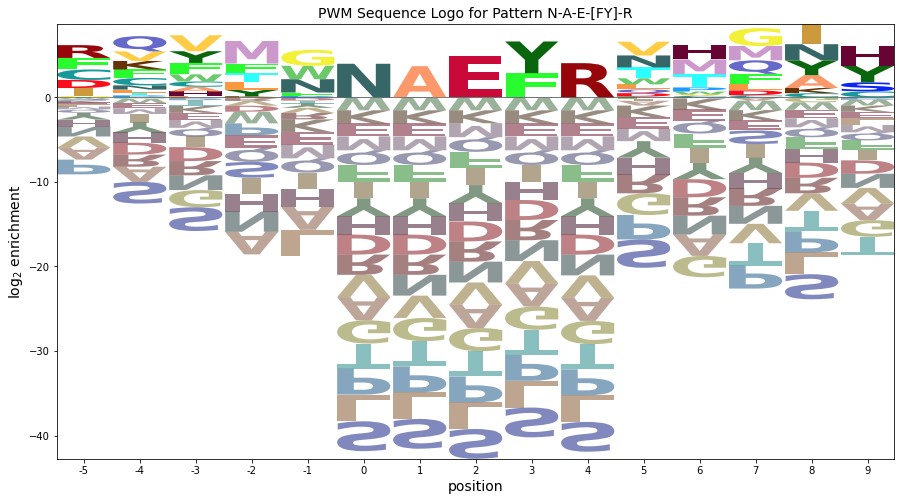

Information Content Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.000000,0.0,0.162821,0.00000,0.162821,0.108548,0.000000,0.108548,0.000000,0.108548,0.000000,0.000000,0.000000,0.000000,0.271369,0.162821,0.108548,0.000000,0.000000,0.000000
1,0.000000,0.0,0.000000,0.00000,0.096747,0.064498,0.000000,0.000000,0.064498,0.161244,0.000000,0.096747,0.128996,0.161244,0.000000,0.000000,0.128996,0.193493,0.000000,0.000000
2,0.145198,0.0,0.000000,0.00000,0.145198,0.000000,0.087119,0.000000,0.000000,0.145198,0.000000,0.000000,0.087119,0.000000,0.000000,0.000000,0.058079,0.377515,0.058079,0.174238
3,0.000000,0.0,0.028127,0.00000,0.098445,0.070318,0.000000,0.000000,0.028127,0.210953,0.253144,0.000000,0.028127,0.000000,0.042191,0.028127,0.210953,0.042191,0.000000,0.084381
4,0.000000,0.0,0.037977,0.00000,0.050636,0.291154,0.000000,0.000000,0.000000,0.000000,0.000000,0.189883,0.101271,0.000000,0.025318,0.126589,0.063294,0.037977,0.088612,0.025318
5,0.000000,0.0,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,4.252525,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
6,3.969354,0.0,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
7,0.000000,0.0,0.000000,5.15947,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,0.000000,0.0,0.000000,0.00000,1.186291,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.548329


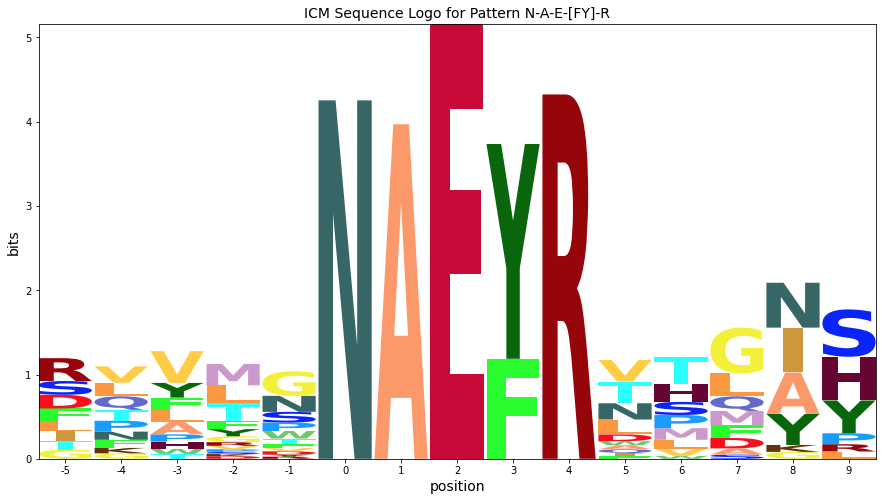

X^2 Critical Value = 39.938849338465694
Chi Square Tests


,index,Position,X^2,p-value,Critical pBH,Critical pBY,AAmax,PWMSmax,AAmin,PWMSmin
0,5,0,1535.154539600772,0.000000e+00,0.003333,0.001005,N,3.9645440177332407,S,-3.5265802882896407
1,7,2,2952.904829545455,0.000000e+00,0.006667,0.002009,E,4.871489259846222,S,-3.5265802882896407
2,9,4,1615.709727440806,0.000000e+00,0.010000,0.003014,R,4.034549512265775,S,-3.5265802882896415
3,6,1,1246.4148755700119,1.067007e-252,0.013333,0.004018,A,3.6813727778949787,S,-3.5265802882896407
4,8,3,1093.4460813172423,5.786319e-220,0.016667,0.005023,Y,3.7479688275660203,S,-3.5265802882896424
5,13,8,187.03655506892673,1.265965e-29,0.020000,0.006027,I,2.3983818757611175,S,-2.9620818901282004
6,3,-2,166.86307223894937,1.166448e-25,0.023333,0.007032,M,2.6732364198871026,A,-2.674502648915723
7,12,7,156.78729938967822,1.066489e-23,0.026667,0.008036,G,2.116731398986248,P,-2.722174524104934
8,14,9,131.719665831472,6.887072e-19,0.030000,0.009041,H,2.31603592772874,T,-2.1918591915265773
9,4,-1,130.7235200350944,1.063637e-18,0.033333,0.010046,G,1.880746033025821,L,-3.117559088431946


----------------------------------------------------------------------
g Pattern: S-x-D-A-E-[FY]
Position Probability Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.000000,0.0,0.000000,0.000000,0.000000,0.178571,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.142857,0.071429,0.071429,0.535714,0.000000
1,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.178571,0.000000,0.214286,0.142857,0.071429,0.000000,0.392857
2,0.133333,0.0,0.000000,0.044444,0.111111,0.000000,0.000000,0.044444,0.000000,0.088889,0.000000,0.000000,0.111111,0.000000,0.088889,0.000000,0.377778,0.000000,0.000000,0.000000
3,0.044444,0.0,0.000000,0.000000,0.088889,0.111111,0.000000,0.044444,0.133333,0.111111,0.044444,0.000000,0.088889,0.000000,0.244444,0.000000,0.000000,0.088889,0.000000,0.000000
4,0.081633,0.0,0.081633,0.000000,0.122449,0.000000,0.000000,0.000000,0.000000,0.040816,0.000000,0.000000,0.000000,0.000000,0.000000,0.102041,0.081633,0.265306,0.102041,0.122449
5,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000
6,0.027778,0.0,0.083333,0.000000,0.000000,0.027778,0.027778,0.111111,0.041667,0.125000,0.138889,0.152778,0.208333,0.055556,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
7,0.000000,0.0,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,1.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


Position Weight Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,-1.615609,1.044545,-1.236648,-0.425492,-0.826411,0.968209,-1.038629,-0.844188,-0.403969,-2.030096,-0.515797,-1.332438,-1.932098,-0.607932,-1.262432,-0.075369,-0.261122,0.076087,3.677872,-1.005391
1,-1.615609,1.044545,-1.236648,-0.425492,-0.826411,-1.616754,-1.038629,-0.844188,-0.403969,-2.030096,-0.515797,-1.332438,-1.932098,1.977031,-1.262432,0.410058,0.475844,0.076087,-0.322128,2.579571
2,0.754341,0.607139,-1.674054,0.722065,1.321146,-2.054159,-1.476034,0.303369,-0.841374,-0.145573,-0.953203,-1.769843,0.215460,-1.045337,0.622091,-2.834703,1.886435,-1.946280,-0.759533,-1.442797
3,-0.468052,0.607139,-1.674054,-0.862898,1.058112,0.530804,-1.476034,0.303369,1.965981,0.117461,0.631760,-1.769843,-0.047575,-1.045337,1.885125,-2.834703,-2.283490,0.375648,-0.759533,-1.442797
4,0.182757,0.520983,0.561718,-0.949054,1.457382,-2.140316,-1.562191,-1.367750,-0.927531,-0.968696,-1.039359,-1.856000,-2.455660,-1.131494,-1.785994,-0.335897,-0.047718,1.774918,1.739273,1.278402
5,-2.554208,0.105945,-2.175248,-1.364092,-1.765010,-2.555353,-1.977228,-1.782788,-1.342568,-2.968696,-1.454397,-2.271037,-2.870697,-1.546531,-2.201032,2.853928,-2.784684,-2.447475,-1.260727,-1.943991
6,-0.969246,0.105945,0.632107,-1.364092,-1.765010,-0.970391,-0.392266,1.387137,0.657432,0.353232,2.005035,1.313925,1.129303,0.775397,-2.201032,-3.335897,-2.784684,-2.447475,-1.260727,-1.943991
7,-2.554208,0.105945,4.014577,-1.364092,-1.765010,-2.555353,-1.977228,-1.782788,-1.342568,-2.968696,-1.454397,-2.271037,-2.870697,-1.546531,-2.201032,-3.335897,-2.784684,-2.447475,-1.260727,-1.943991
8,3.635616,0.105945,-2.175248,-1.364092,-1.765010,-2.555353,-1.977228,-1.782788,-1.342568,-2.968696,-1.454397,-2.271037,-2.870697,-1.546531,-2.201032,-3.335897,-2.784684,-2.447475,-1.260727,-1.943991


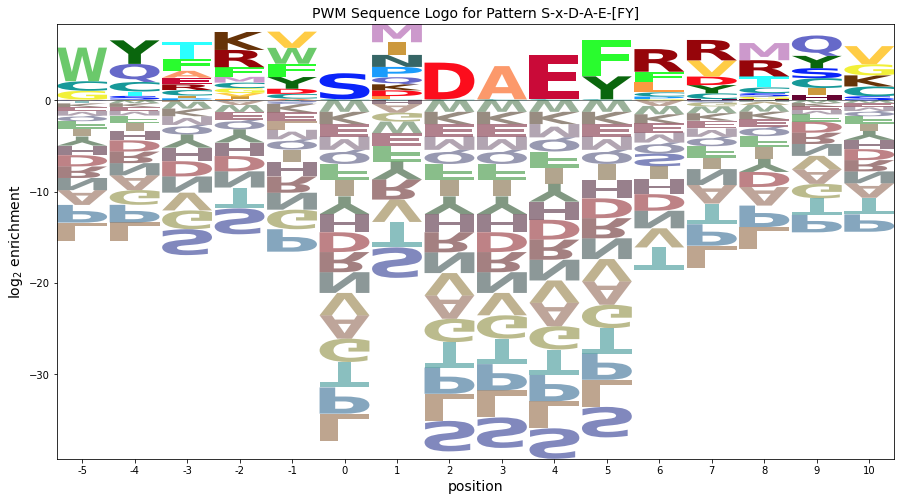

Information Content Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.000000,0.0,0.000000,0.000000,0.000000,0.476857,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.381486,0.190743,0.190743,1.430572,0.000000
1,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.370289,0.000000,0.444347,0.296231,0.148116,0.000000,0.814636
2,0.183190,0.0,0.000000,0.061063,0.152659,0.000000,0.000000,0.061063,0.000000,0.122127,0.000000,0.000000,0.152659,0.000000,0.122127,0.000000,0.519039,0.000000,0.000000,0.000000
3,0.052748,0.0,0.000000,0.000000,0.105496,0.131870,0.000000,0.052748,0.158244,0.131870,0.052748,0.000000,0.105496,0.000000,0.290113,0.000000,0.000000,0.105496,0.000000,0.000000
4,0.099675,0.0,0.099675,0.000000,0.149513,0.000000,0.000000,0.000000,0.000000,0.049838,0.000000,0.000000,0.000000,0.000000,0.000000,0.124594,0.099675,0.323944,0.124594,0.149513
5,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.187665,0.000000,0.000000,0.000000,0.000000
6,0.031299,0.0,0.093897,0.000000,0.000000,0.031299,0.031299,0.125196,0.046948,0.140845,0.156495,0.172144,0.234742,0.062598,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
7,0.000000,0.0,4.348314,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,3.969354,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


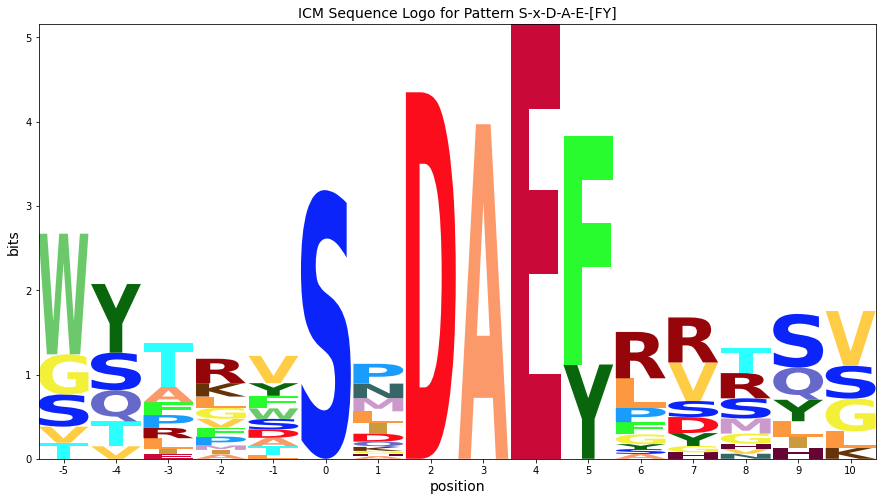

X^2 Critical Value = 40.15223303520055
Chi Square Tests


,index,Position,X^2,p-value,Critical pBH,Critical pBY,AAmax,PWMSmax,AAmin,PWMSmin
0,9,4,2501.2840909090914,0.000000e+00,0.003125,0.000924,E,4.82573262563325,S,-3.335896726680533
1,7,2,1394.5792349726773,1.856457e-284,0.006250,0.001849,D,4.014576903823036,S,-3.335896726680533
2,8,3,1055.7867181298927,6.469832e-212,0.009375,0.002773,A,3.6356161436820056,S,-3.335896726680533
3,10,5,1052.3071917434459,3.583438e-211,0.012500,0.003697,F,3.935429546147381,S,-3.335896726680533
4,5,0,584.0173818576859,1.186511e-111,0.015625,0.004622,S,2.853927832199485,L,-2.968695702517464
5,0,-5,304.0263882188365,2.990194e-53,0.018750,0.005546,W,3.677872380786181,L,-2.030096247181607
6,11,6,149.731493089401,2.469119e-22,0.021875,0.006470,R,2.47453336867485,T,-2.4310468554060027
7,12,7,129.31953471753832,1.961019e-18,0.025000,0.007395,R,2.229420870838318,L,-2.445133746460451
8,1,-4,125.20082625336163,1.173402e-17,0.028125,0.008319,Y,2.579571295870302,L,-2.030096247181607
9,6,1,107.71023973671021,2.102477e-14,0.031250,0.009244,M,2.0050347587985264,S,-3.335896726680532


----------------------------------------------------------------------
h Pattern: S-x-A-E-[FY]-R
Position Probability Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.000000,0.666667,0.000000,0.000000,0.000000,0.000000,0.000000,0.242424,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.090909,0.000000,0.000000,0.000000,0.000000
1,0.000000,0.000000,0.170732,0.000000,0.000000,0.073171,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.536585,0.000000,0.097561,0.000000,0.000000,0.121951,0.000000,0.000000
2,0.440000,0.000000,0.000000,0.060000,0.000000,0.120000,0.000000,0.080000,0.000000,0.060000,0.000000,0.080000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.160000,0.000000
3,0.000000,0.349206,0.000000,0.000000,0.000000,0.000000,0.063492,0.000000,0.079365,0.111111,0.047619,0.063492,0.000000,0.000000,0.000000,0.047619,0.047619,0.190476,0.000000,0.000000
4,0.057143,0.000000,0.000000,0.000000,0.000000,0.071429,0.042857,0.000000,0.057143,0.185714,0.314286,0.057143,0.100000,0.000000,0.000000,0.028571,0.000000,0.085714,0.000000,0.000000
5,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000
6,0.000000,0.000000,0.148936,0.021277,0.000000,0.180851,0.000000,0.031915,0.000000,0.000000,0.000000,0.106383,0.000000,0.000000,0.000000,0.489362,0.021277,0.000000,0.000000,0.000000
7,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


Position Weight Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,-1.758567,5.425149,-1.379606,-0.568450,-0.969369,-1.759712,-1.181587,2.182779,-0.546927,-2.173054,-0.658755,-1.475396,-2.075056,-0.750890,-1.405390,-0.540255,-1.989042,-1.651833,-0.465086,-1.148349
1,-1.961384,0.698770,1.417577,-0.771267,-1.172186,0.037472,-1.384404,-1.189963,-0.749744,-2.375871,-0.861572,-1.678213,2.245690,-0.953707,0.713721,-2.743072,-2.191859,0.730313,-0.667902,-1.351166
2,2.363632,0.500224,-1.780969,1.030187,-1.370731,0.646281,-1.582949,0.933419,-0.948289,-0.574417,-1.060118,0.445170,-2.476418,-1.152252,-1.806753,-2.941618,-2.390405,-2.053196,2.303477,-1.549712
3,-2.405686,4.778030,-2.026725,-1.215569,-1.616488,-2.406831,0.493222,-1.634265,1.390917,0.179827,0.694126,0.199413,-2.722175,-1.398009,-2.052509,-1.187374,-0.636161,1.401488,-1.112205,-1.795468
4,-0.200571,0.137654,-2.143539,-1.332383,-1.733301,0.061318,0.054480,-1.751079,1.011069,0.870368,3.100874,0.082600,0.161012,-1.514823,-2.169323,-1.719225,-2.752975,0.391589,-1.229018,-1.912282
5,-2.863536,-0.203383,-2.484576,-1.673420,-2.074338,-2.864681,-2.286556,-2.092116,-1.651896,-3.278024,-1.763725,-2.580365,-3.180025,-1.855859,-2.510360,2.924631,-3.094012,-2.756803,-1.570055,-2.253319
6,-2.863536,-0.203383,1.422315,-0.088457,-2.074338,1.305244,-2.286556,-0.092116,-1.651896,-3.278024,-1.763725,0.879066,-3.180025,-1.855859,-2.510360,1.909364,-1.509049,-2.756803,-1.570055,-2.253319
7,3.706319,-0.203383,-2.484576,-1.673420,-2.074338,-2.864681,-2.286556,-2.092116,-1.651896,-3.278024,-1.763725,-2.580365,-3.180025,-1.855859,-2.510360,-3.645225,-3.094012,-2.756803,-1.570055,-2.253319
8,-2.863536,-0.203383,-2.484576,4.896436,-2.074338,-2.864681,-2.286556,-2.092116,-1.651896,-3.278024,-1.763725,-2.580365,-3.180025,-1.855859,-2.510360,-3.645225,-3.094012,-2.756803,-1.570055,-2.253319


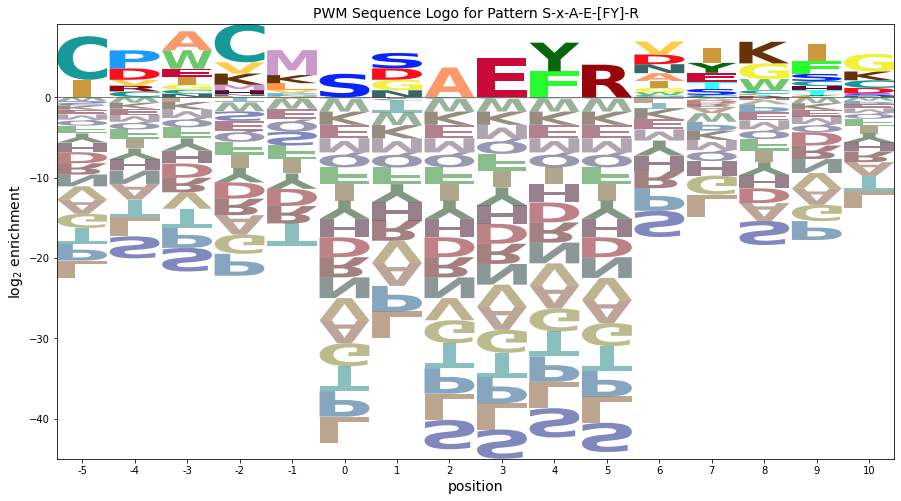

Information Content Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.000000,3.105772,0.000000,0.000000,0.000000,0.000000,0.000000,1.129372,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.423514,0.000000,0.000000,0.000000,0.000000
1,0.000000,0.000000,0.344963,0.000000,0.000000,0.147841,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,1.084168,0.000000,0.197121,0.000000,0.000000,0.246402,0.000000,0.000000
2,0.847336,0.000000,0.000000,0.115546,0.000000,0.231092,0.000000,0.154061,0.000000,0.115546,0.00000,0.154061,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.308122,0.000000
3,0.000000,0.791634,0.000000,0.000000,0.000000,0.000000,0.143933,0.000000,0.179917,0.251884,0.10795,0.143933,0.000000,0.000000,0.000000,0.107950,0.107950,0.431800,0.000000,0.000000
4,0.078300,0.000000,0.000000,0.000000,0.000000,0.097875,0.058725,0.000000,0.078300,0.254475,0.43065,0.078300,0.137025,0.000000,0.000000,0.039150,0.000000,0.117450,0.000000,0.000000
5,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,3.187665,0.000000,0.000000,0.000000,0.000000
6,0.000000,0.000000,0.241196,0.034457,0.000000,0.292881,0.000000,0.051685,0.000000,0.000000,0.00000,0.172283,0.000000,0.000000,0.000000,0.792502,0.034457,0.000000,0.000000,0.000000
7,3.969354,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,0.000000,0.000000,0.000000,5.159470,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


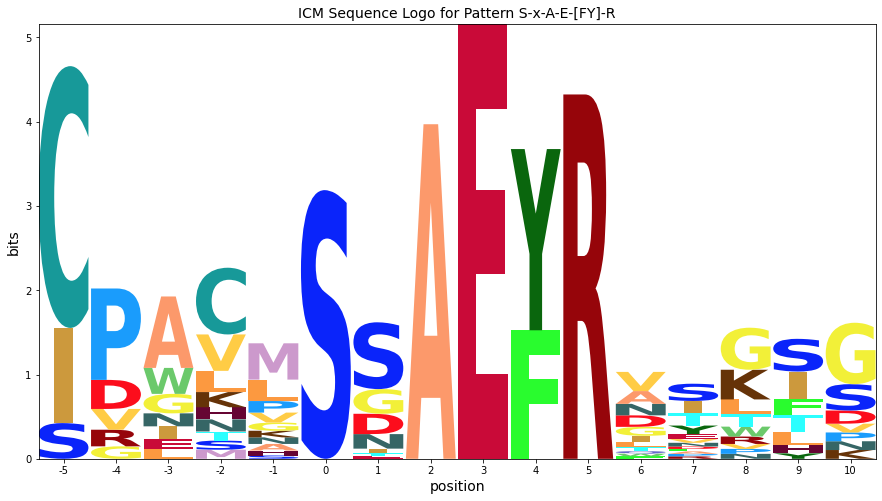

X^2 Critical Value = 40.15223303520055
Chi Square Tests


,index,Position,X^2,p-value,Critical pBH,Critical pBY,AAmax,PWMSmax,AAmin,PWMSmin
0,8,3,3265.5653409090896,0.000000e+00,0.003125,0.000924,E,4.896435616976452,S,-3.6452247847882613
1,10,5,1786.7848750521857,0.000000e+00,0.006250,0.001849,R,4.059495869396005,S,-3.6452247847882613
2,0,-5,1473.4902915267858,2.169029e-301,0.009375,0.002773,C,5.425148643096625,L,-2.1730542010236498
3,7,2,1378.3882153362485,5.514091e-281,0.012500,0.003697,A,3.706319135025208,S,-3.6452247847882613
4,9,4,1113.4536760686356,3.052258e-224,0.015625,0.004622,Y,3.5540362037631636,S,-3.6452247847882613
5,3,-2,778.5189718098095,7.883819e-153,0.018750,0.005546,C,4.778029666312898,P,-2.722174524104934
6,5,0,762.4671374253122,2.021355e-149,0.021875,0.006470,S,2.924630823542687,L,-3.278023760625193
7,4,-1,233.31877597579629,7.248065e-39,0.025000,0.007395,M,3.1008739559455805,T,-2.7529749502933654
8,6,1,226.6197843567274,1.615619e-37,0.028125,0.008319,S,1.9093640668893765,L,-3.278023760625193
9,2,-3,185.2426961128319,2.862777e-29,0.031250,0.009244,A,2.3636324799710495,S,-2.9416177875684846


----------------------------------------------------------------------
i Pattern: D-A-E-[FY]-A
Position Probability Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.000000,0.0,0.000000,0.000000,0.000000,0.153846,0.000000,0.153846,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.153846,0.538462,0.000000,0.000000
1,0.090909,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.090909,0.000000,0.136364,0.000000,0.000000,0.000000,0.227273,0.000000,0.272727,0.090909,0.090909
2,0.000000,0.0,0.090909,0.000000,0.272727,0.000000,0.121212,0.151515,0.000000,0.000000,0.000000,0.060606,0.000000,0.000000,0.000000,0.121212,0.000000,0.121212,0.000000,0.060606
3,0.000000,0.0,0.000000,0.000000,0.000000,0.060606,0.272727,0.000000,0.060606,0.000000,0.000000,0.000000,0.121212,0.000000,0.000000,0.060606,0.212121,0.212121,0.000000,0.000000
4,0.128205,0.0,0.000000,0.000000,0.000000,0.000000,0.128205,0.051282,0.000000,0.000000,0.076923,0.051282,0.000000,0.000000,0.102564,0.128205,0.230769,0.051282,0.051282,0.000000
5,0.000000,0.0,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
6,1.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
7,0.000000,0.0,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,0.000000,0.0,0.000000,0.000000,0.688889,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.311111


Position Weight Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,-1.075041,1.585113,-0.696080,0.115076,-0.285842,0.508777,-0.498061,1.281342,0.136599,-1.489528,0.024771,-0.791869,-1.391529,-0.067364,-0.721864,-1.856729,0.279447,2.031693,0.218441,-0.464823
1,0.161999,1.237190,-1.044003,-0.232847,-0.633766,-1.424109,-0.845984,-0.651543,-0.211324,-0.252489,-0.323152,0.860207,-1.739453,-0.415287,-1.069787,0.380310,-1.653439,1.491125,1.455480,0.772216
2,-1.758567,0.901587,0.620394,-0.568450,2.352559,-1.759712,1.140341,1.597816,-0.546927,-2.173054,-0.658755,0.109567,-2.075056,-0.750890,-1.405390,-0.218327,-1.989042,0.670095,-0.465086,0.436613
3,-1.758567,0.901587,-1.379606,-0.568450,-0.969369,-0.174749,2.140341,-0.987146,1.038036,-2.173054,-0.658755,-1.475396,0.246873,-0.750890,-1.405390,-0.955293,1.010958,1.348167,-0.465086,-1.148349
4,0.671673,0.746864,-1.534329,-0.723173,-1.124091,-1.914434,1.248653,0.443094,-0.701649,-2.327777,1.186522,-0.045156,-2.229778,-0.905613,0.761815,-0.110015,1.178163,-0.221593,0.965154,-1.303072
5,-2.053014,0.607139,3.849508,-0.862898,-1.263816,-2.054159,-1.476034,-1.281594,-0.841374,-2.467502,-0.953203,-1.769843,-2.369503,-1.045337,-1.699838,-2.834703,-2.283490,-1.946280,-0.759533,-1.442797
6,3.470548,0.607139,-1.674054,-0.862898,-1.263816,-2.054159,-1.476034,-1.281594,-0.841374,-2.467502,-0.953203,-1.769843,-2.369503,-1.045337,-1.699838,-2.834703,-2.283490,-1.946280,-0.759533,-1.442797
7,-2.053014,0.607139,-1.674054,4.660664,-1.263816,-2.054159,-1.476034,-1.281594,-0.841374,-2.467502,-0.953203,-1.769843,-2.369503,-1.045337,-1.699838,-2.834703,-2.283490,-1.946280,-0.759533,-1.442797
8,-2.053014,0.607139,-1.674054,-0.862898,3.736184,-2.054159,-1.476034,-1.281594,-0.841374,-2.467502,-0.953203,-1.769843,-2.369503,-1.045337,-1.699838,-2.834703,-2.283490,-1.946280,-0.759533,2.464094


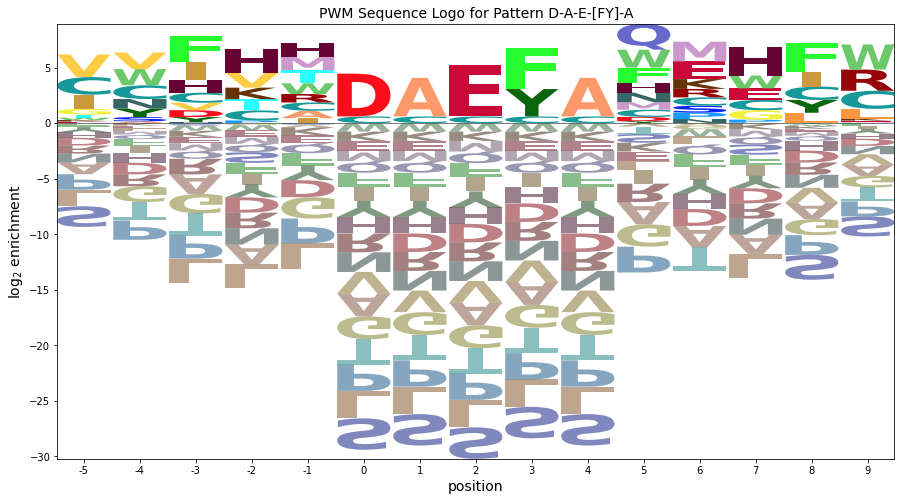

Information Content Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.000000,0.0,0.000000,0.000000,0.000000,0.366557,0.000000,0.366557,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.366557,1.282951,0.000000,0.000000
1,0.122531,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.122531,0.000000,0.183796,0.000000,0.000000,0.000000,0.306327,0.000000,0.367593,0.122531,0.122531
2,0.000000,0.0,0.140246,0.000000,0.420737,0.000000,0.186994,0.233743,0.000000,0.000000,0.000000,0.093497,0.000000,0.000000,0.000000,0.186994,0.000000,0.186994,0.000000,0.093497
3,0.000000,0.0,0.000000,0.000000,0.000000,0.092331,0.415490,0.000000,0.092331,0.000000,0.000000,0.000000,0.184662,0.000000,0.000000,0.092331,0.323159,0.323159,0.000000,0.000000
4,0.129228,0.0,0.000000,0.000000,0.000000,0.000000,0.129228,0.051691,0.000000,0.000000,0.077537,0.051691,0.000000,0.000000,0.103382,0.129228,0.232610,0.051691,0.051691,0.000000
5,0.000000,0.0,4.348314,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
6,3.969354,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
7,0.000000,0.0,0.000000,5.159470,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,0.000000,0.0,0.000000,0.000000,2.623576,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.184841


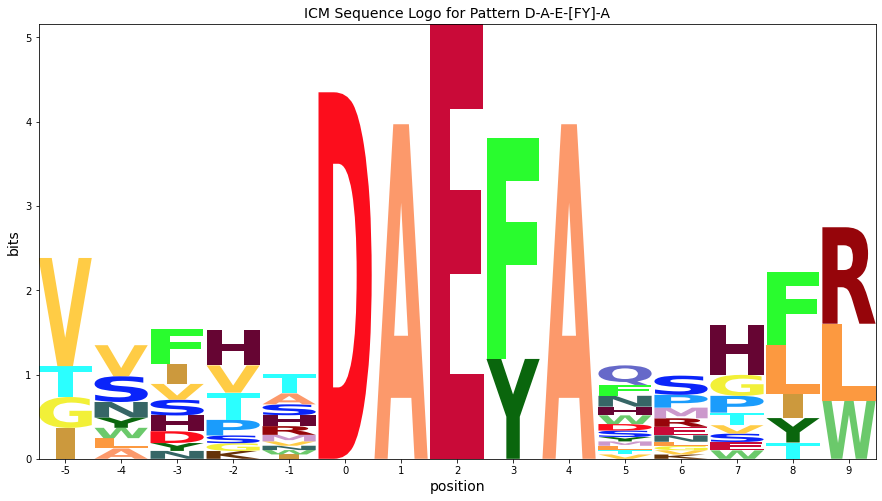

X^2 Critical Value = 39.938849338465694
Chi Square Tests


,index,Position,X^2,p-value,Critical pBH,Critical pBY,AAmax,PWMSmax,AAmin,PWMSmin
0,7,2,1563.3025568181815,0.000000e+00,0.003333,0.001005,E,4.6606641658388055,S,-2.8347025836519726
1,5,0,871.6120218579233,1.252471e-172,0.006667,0.002009,D,3.849508444028592,S,-2.8347025836519726
2,6,1,659.8666988311829,1.129995e-127,0.010000,0.003014,A,3.4705476838875624,S,-2.8347025836519726
3,9,4,659.8666988311829,1.129995e-127,0.013333,0.004018,A,3.4705476838875624,S,-2.8347025836519726
4,8,3,637.2097919061516,6.988601e-123,0.016667,0.005023,F,3.7361839710348494,S,-2.8347025836519726
5,13,8,112.86417181825368,2.358220e-15,0.020000,0.006027,F,2.6542151242485668,S,-2.238599525325618
6,12,7,107.93237211063722,1.913999e-14,0.023333,0.007032,H,2.546333547150534,L,-2.1455734646015436
7,2,-3,88.38477531272414,6.403150e-11,0.026667,0.008036,F,2.3525594243874663,L,-2.1730542010236498
8,3,-2,82.71845827554655,6.293733e-10,0.030000,0.009041,H,2.140341187474698,L,-2.1730542010236498
9,10,5,81.54867016392204,1.004271e-09,0.033333,0.010046,Q,2.321678693790581,P,-2.3244150162579253


----------------------------------------------------------------------
j Pattern: G-A-E-[FY]-R
Position Probability Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.060606,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.060606,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.333333,0.000000,0.393939,0.000000,0.151515
1,0.000000,0.0,0.000000,0.000000,0.000000,0.100000,0.075000,0.100000,0.000000,0.000000,0.000000,0.100000,0.000000,0.325000,0.000000,0.050000,0.175000,0.000000,0.075000,0.000000
2,0.000000,0.0,0.040816,0.000000,0.000000,0.000000,0.040816,0.306122,0.000000,0.204082,0.081633,0.000000,0.000000,0.040816,0.000000,0.061224,0.061224,0.163265,0.000000,0.000000
3,0.072727,0.0,0.000000,0.000000,0.000000,0.036364,0.000000,0.036364,0.000000,0.200000,0.000000,0.000000,0.090909,0.000000,0.036364,0.200000,0.272727,0.054545,0.000000,0.000000
4,0.063492,0.0,0.031746,0.031746,0.000000,0.000000,0.000000,0.000000,0.000000,0.031746,0.000000,0.063492,0.079365,0.079365,0.031746,0.269841,0.253968,0.000000,0.000000,0.063492
5,0.000000,0.0,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
6,1.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
7,0.000000,0.0,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,0.000000,0.0,0.000000,0.000000,0.492308,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.507692


Position Weight Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,-0.173604,0.901587,-1.379606,-0.568450,-0.969369,-1.759712,-1.181587,-0.987146,1.038036,-2.173054,-0.658755,-1.475396,-2.075056,-0.750890,-1.405390,1.044707,-1.989042,2.155522,-0.465086,1.436613
1,-1.937537,0.722617,-1.558576,-0.747421,-1.148339,0.383246,0.639443,1.155812,-0.725897,-2.352024,-0.837725,0.667562,-2.254026,2.877495,-1.584360,-1.134263,0.831988,-1.830803,1.355944,-1.327319
2,-2.139171,0.520983,-0.175248,-0.949054,-1.349973,-2.140316,0.022772,2.632250,-0.927531,0.905773,1.282569,-1.856000,-2.455660,0.453469,-1.785994,-0.920859,-0.369646,1.137488,-0.845690,-1.528953
3,0.062463,0.400688,-1.880504,-1.069349,-1.470267,-0.675647,-1.682485,0.096918,-1.047825,0.911010,-1.159654,-1.976294,0.009009,-1.251788,-0.321326,0.543809,1.510059,-0.152731,-0.965984,-1.649247
4,-0.083758,0.254468,-0.441763,0.369393,-1.616488,-2.406831,-1.828706,-1.634265,-1.194046,-1.235211,-1.305874,0.199413,-0.137212,1.186954,-0.467547,0.982551,1.451302,-2.298952,-1.112205,0.526460
5,-2.440037,0.220116,-2.061077,-1.249921,-1.650839,3.603212,-1.863057,-1.668617,-1.228397,-2.854525,-1.340226,-2.156866,-2.756526,-1.432360,-2.086861,-3.221726,-2.670513,-2.333304,-1.146556,-1.829820
6,3.604357,0.220116,-2.061077,-1.249921,-1.650839,-2.441182,-1.863057,-1.668617,-1.228397,-2.854525,-1.340226,-2.156866,-2.756526,-1.432360,-2.086861,-3.221726,-2.670513,-2.333304,-1.146556,-1.829820
7,-2.440037,0.220116,-2.061077,4.794473,-1.650839,-2.441182,-1.863057,-1.668617,-1.228397,-2.854525,-1.340226,-2.156866,-2.756526,-1.432360,-2.086861,-3.221726,-2.670513,-2.333304,-1.146556,-1.829820
8,-2.440037,0.220116,-2.061077,-1.249921,3.393555,-2.441182,-1.863057,-1.668617,-1.228397,-2.854525,-1.340226,-2.156866,-2.756526,-1.432360,-2.086861,-3.221726,-2.670513,-2.333304,-1.146556,3.257643


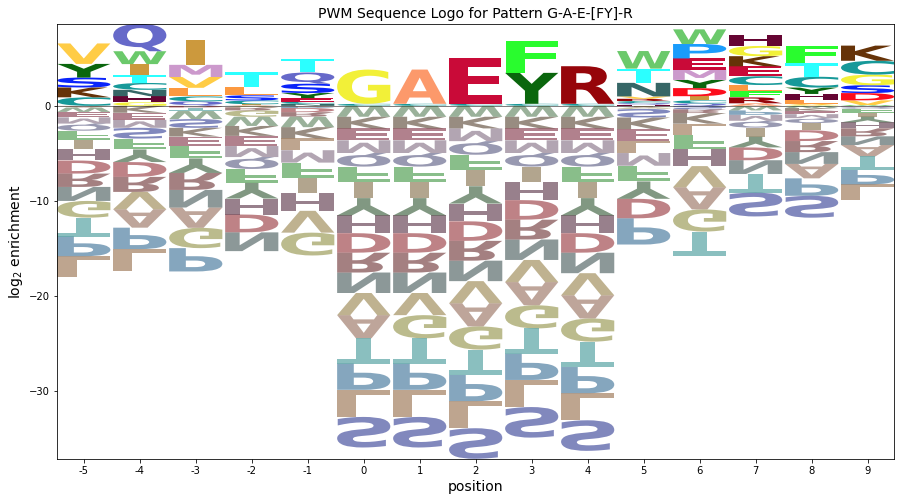

Information Content Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.118560,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.118560,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.652082,0.000000,0.770642,0.000000,0.296401
1,0.000000,0.0,0.000000,0.000000,0.000000,0.172281,0.129210,0.172281,0.000000,0.000000,0.000000,0.172281,0.000000,0.559912,0.000000,0.086140,0.301491,0.000000,0.129210,0.000000
2,0.000000,0.0,0.060208,0.000000,0.000000,0.000000,0.060208,0.451563,0.000000,0.301042,0.120417,0.000000,0.000000,0.060208,0.000000,0.090313,0.090313,0.240834,0.000000,0.000000
3,0.065831,0.0,0.000000,0.000000,0.000000,0.032915,0.000000,0.032915,0.000000,0.181035,0.000000,0.000000,0.082289,0.000000,0.032915,0.181035,0.246866,0.049373,0.000000,0.000000
4,0.055707,0.0,0.027854,0.027854,0.000000,0.000000,0.000000,0.000000,0.000000,0.027854,0.000000,0.055707,0.069634,0.069634,0.027854,0.236756,0.222829,0.000000,0.000000,0.055707
5,0.000000,0.0,0.000000,0.000000,0.000000,3.968209,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
6,3.969354,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
7,0.000000,0.0,0.000000,5.159470,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,0.000000,0.0,0.000000,0.000000,1.805713,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.862142


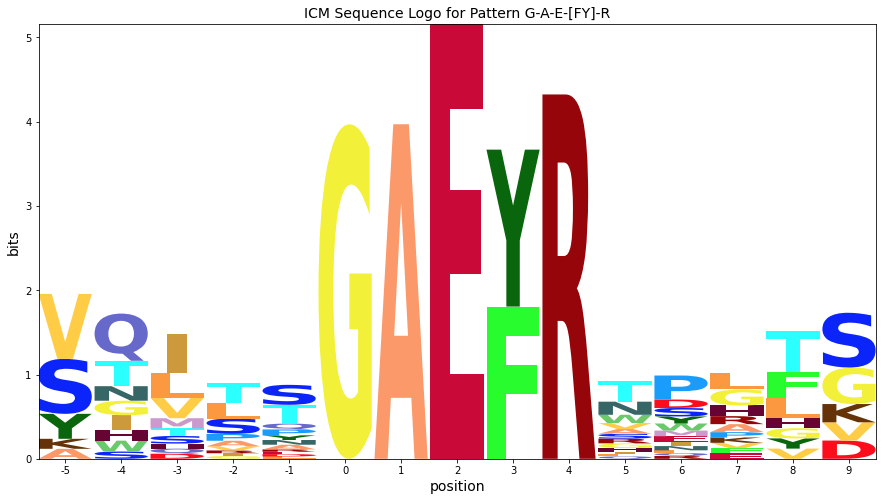

X^2 Critical Value = 39.938849338465694
Chi Square Tests


,index,Position,X^2,p-value,Critical pBH,Critical pBY,AAmax,PWMSmax,AAmin,PWMSmin
0,7,2,2258.103693181817,0.000000e+00,0.003333,0.001005,E,4.7944732060309985,S,-3.22172570676122
1,9,4,1235.5427327488521,2.273708e-250,0.006667,0.002009,R,3.9575334584505515,S,-3.221725706761221
2,6,1,953.1407872005975,5.289004e-190,0.010000,0.003014,A,3.6043567240797554,S,-3.22172570676122
3,5,0,952.3332918636478,7.863162e-190,0.013333,0.004018,G,3.603212057496913,S,-3.22172570676122
4,8,3,762.0281034341713,2.505285e-149,0.016667,0.005023,F,3.393554967284055,S,-3.221725706761221
5,1,-4,148.80639774308875,3.722893e-22,0.020000,0.006027,Q,2.8774948488522205,L,-2.3520243420689697
6,2,-3,141.01560746906978,1.167127e-20,0.023333,0.007032,I,2.6322496164300264,P,-2.455659549536177
7,0,-5,111.19501348438229,4.798882e-15,0.026667,0.008036,V,2.1555218696938674,L,-2.1730542010236507
8,10,5,87.69182562004076,8.483530e-11,0.030000,0.009041,W,1.8534439453696354,P,-2.7565260288957103
9,11,6,77.07189299826285,5.912284e-09,0.033333,0.010046,W,1.5440166340513906,T,-2.564902602140793


----------------------------------------------------------------------
k Pattern: S-G-E-[FY]-R
Position Probability Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.000000,0.0,0.000000,0.000000,0.000000,0.320000,0.000000,0.000000,0.120000,0.080000,0.000000,0.080000,0.400000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,0.057143,0.0,0.057143,0.000000,0.057143,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.171429,0.000000,0.000000,0.228571,0.142857,0.057143,0.228571,0.000000
2,0.000000,0.0,0.086957,0.130435,0.000000,0.000000,0.000000,0.043478,0.000000,0.043478,0.086957,0.000000,0.000000,0.043478,0.000000,0.000000,0.326087,0.195652,0.043478,0.000000
3,0.038462,0.0,0.000000,0.192308,0.038462,0.000000,0.000000,0.115385,0.000000,0.057692,0.038462,0.115385,0.038462,0.000000,0.000000,0.076923,0.173077,0.000000,0.000000,0.115385
4,0.074074,0.0,0.074074,0.277778,0.055556,0.000000,0.000000,0.000000,0.000000,0.185185,0.037037,0.037037,0.111111,0.000000,0.111111,0.000000,0.000000,0.000000,0.037037,0.000000
5,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000
6,0.000000,0.0,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
7,0.000000,0.0,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,0.000000,0.0,0.000000,0.000000,0.611111,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.388889


Position Weight Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,-1.522500,1.137654,-1.143539,-0.332383,-0.733301,1.646281,-0.945520,-0.751079,1.689140,-0.352024,-0.422688,0.345634,1.620443,-0.514823,-1.169323,-2.304188,-1.752975,-1.415766,-0.229018,-0.912282
1,-0.227044,0.848147,0.151917,-0.621890,0.562155,-1.813151,-1.235026,-1.040586,-0.600366,-2.226493,-0.712195,-1.528835,0.678860,-0.804329,-1.458829,0.576231,0.542481,-0.120310,2.651400,-1.201788
2,-2.075041,0.585113,0.625848,1.922431,-1.285842,-2.076185,-1.498061,0.281342,-0.863401,-0.904565,1.346699,-1.791869,-2.391529,0.517599,-1.721864,-2.856729,1.694484,1.353621,0.803403,-1.464823
3,-0.615609,0.459582,-1.821611,2.448977,0.173589,-2.201716,-1.623591,1.378204,-0.988931,-0.615059,0.484203,0.889955,-0.932098,-1.192894,-1.847395,-0.660332,0.890881,-2.093838,-0.907090,1.217001
4,0.081828,0.420054,0.460789,2.950017,0.549098,-2.241244,-1.663120,-1.468679,-1.028460,0.804845,0.444674,-0.371966,0.250766,-1.232423,0.920432,-3.021788,-2.470575,-2.133366,0.638344,-1.629882
5,-2.240100,0.420054,-1.861139,-1.049983,-1.450902,-2.241244,-1.663120,-1.468679,-1.028460,-2.654587,-1.140288,-1.956929,-2.556588,-1.232423,-1.886923,2.759572,-2.470575,-2.133366,-0.946618,-1.629882
6,-2.240100,0.420054,-1.861139,-1.049983,-1.450902,3.540115,-1.663120,-1.468679,-1.028460,-2.654587,-1.140288,-1.956929,-2.556588,-1.232423,-1.886923,-3.021788,-2.470575,-2.133366,-0.946618,-1.629882
7,-2.240100,0.420054,-1.861139,4.731376,-1.450902,-2.241244,-1.663120,-1.468679,-1.028460,-2.654587,-1.140288,-1.956929,-2.556588,-1.232423,-1.886923,-3.021788,-2.470575,-2.133366,-0.946618,-1.629882
8,-2.240100,0.420054,-1.861139,-1.049983,3.636561,-2.241244,-1.663120,-1.468679,-1.028460,-2.654587,-1.140288,-1.956929,-2.556588,-1.232423,-1.886923,-3.021788,-2.470575,-2.133366,-0.946618,2.829550


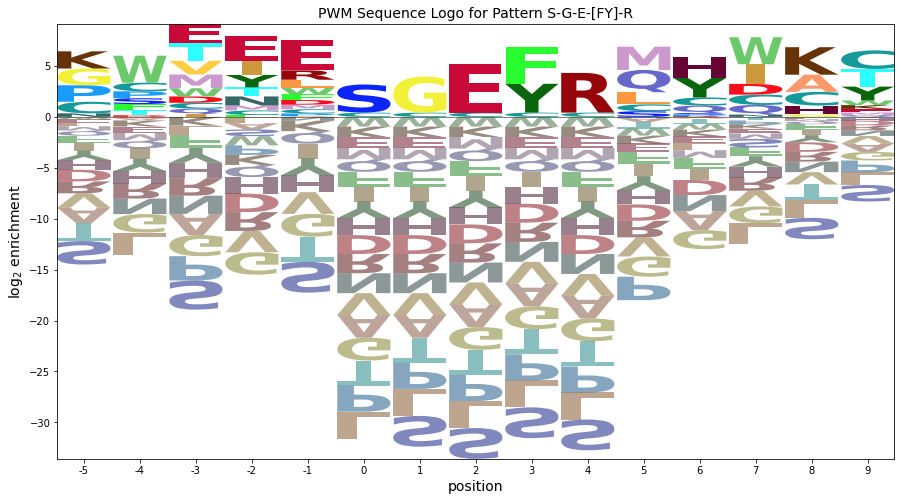

Information Content Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.000000,0.0,0.000000,0.000000,0.000000,0.631166,0.000000,0.000000,0.236687,0.157792,0.000000,0.157792,0.788958,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,0.075289,0.0,0.075289,0.000000,0.075289,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.225868,0.000000,0.000000,0.301157,0.188223,0.075289,0.301157,0.000000
2,0.000000,0.0,0.134261,0.201392,0.000000,0.000000,0.000000,0.067131,0.000000,0.067131,0.134261,0.000000,0.000000,0.067131,0.000000,0.000000,0.503481,0.302088,0.067131,0.000000
3,0.042609,0.0,0.000000,0.213043,0.042609,0.000000,0.000000,0.127826,0.000000,0.063913,0.042609,0.127826,0.042609,0.000000,0.000000,0.085217,0.191739,0.000000,0.000000,0.127826
4,0.104721,0.0,0.104721,0.392704,0.078541,0.000000,0.000000,0.000000,0.000000,0.261803,0.052361,0.052361,0.157082,0.000000,0.157082,0.000000,0.000000,0.000000,0.052361,0.000000
5,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.187665,0.000000,0.000000,0.000000,0.000000
6,0.000000,0.0,0.000000,0.000000,0.000000,3.968209,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
7,0.000000,0.0,0.000000,5.159470,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,0.000000,0.0,0.000000,0.000000,2.276309,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.448560


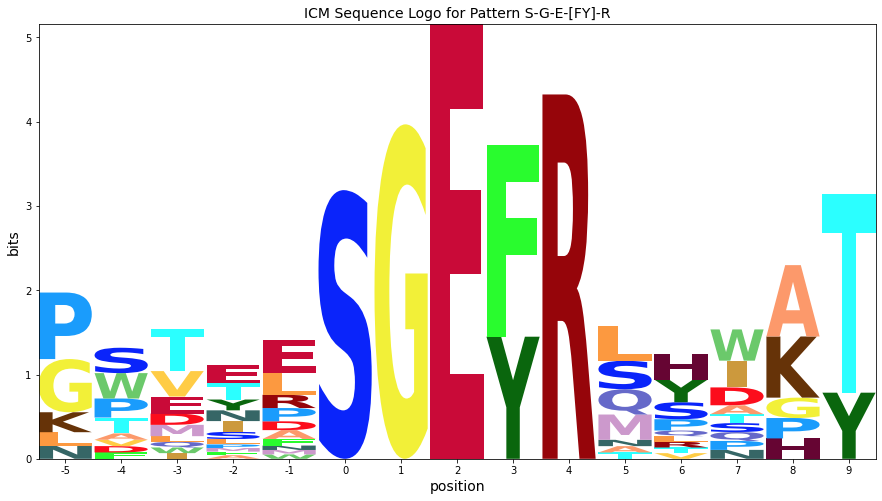

X^2 Critical Value = 39.938849338465694
Chi Square Tests


,index,Position,X^2,p-value,Critical pBH,Critical pBY,AAmax,PWMSmax,AAmin,PWMSmin
0,7,2,1875.9630681818178,0.000000e+00,0.003333,0.001005,E,4.731376370705957,S,-3.0217881362524683
1,9,4,1026.450885668277,1.194723e-205,0.006667,0.002009,R,3.894436623125509,S,-3.0217881362524683
2,6,1,791.169196317492,1.618537e-155,0.010000,0.003014,G,3.540115222171871,S,-3.0217881362524683
3,8,3,687.1536607842019,1.891974e-133,0.013333,0.004018,F,3.636561259684693,S,-3.0217881362524683
4,5,0,438.0130363932645,5.260881e-81,0.016667,0.005023,S,2.7595715772721907,L,-2.6545871120894002
5,4,-1,160.3353546672426,2.182631e-24,0.020000,0.006027,E,2.9500166571812962,S,-3.0217881362524692
6,10,5,113.15647492504958,2.081947e-15,0.023333,0.007032,M,2.28489378727368,P,-2.3013314031448835
7,2,-3,105.1602631977356,6.164352e-14,0.026667,0.008036,E,1.9224308255093967,S,-2.8567288899819725
8,13,8,100.99393793148366,3.537169e-13,0.030000,0.009041,K,2.7029462574993732,S,-2.097736989485768
9,3,-2,97.46186627007935,1.539027e-12,0.033333,0.010046,E,2.4489766400052315,G,-2.2017161271661516


----------------------------------------------------------------------
l Pattern: P-x-A-E-[FY]-R
Position Probability Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.000000,0.0,0.000000,0.000000,0.095238,0.095238,0.000000,0.000000,0.000000,0.000000,0.000000,0.095238,0.000000,0.0,0.000000,0.333333,0.380952,0.000000,0.000000,0.000000
1,0.000000,0.0,0.000000,0.000000,0.142857,0.095238,0.190476,0.000000,0.000000,0.000000,0.000000,0.000000,0.238095,0.0,0.095238,0.238095,0.000000,0.000000,0.000000,0.000000
2,0.000000,0.0,0.000000,0.037037,0.074074,0.000000,0.222222,0.333333,0.037037,0.055556,0.000000,0.092593,0.000000,0.0,0.000000,0.000000,0.092593,0.055556,0.000000,0.000000
3,0.000000,0.0,0.000000,0.000000,0.000000,0.040541,0.027027,0.000000,0.000000,0.067568,0.067568,0.148649,0.000000,0.0,0.000000,0.189189,0.337838,0.081081,0.000000,0.040541
4,0.197674,0.0,0.000000,0.000000,0.000000,0.116279,0.034884,0.046512,0.000000,0.081395,0.000000,0.058140,0.081395,0.0,0.209302,0.000000,0.000000,0.034884,0.000000,0.139535
5,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
6,0.000000,0.0,0.209302,0.000000,0.000000,0.058140,0.000000,0.000000,0.000000,0.034884,0.000000,0.093023,0.000000,0.0,0.000000,0.360465,0.220930,0.000000,0.000000,0.023256
7,1.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,0.000000,0.0,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


Position Weight Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,-1.388198,1.271955,-1.009238,-0.198082,0.985962,0.195619,-0.811218,-0.616778,-0.176558,-1.802686,-0.288387,0.479935,-1.704687,-0.380521,-1.035022,0.830113,1.551251,-1.281465,-0.094717,-0.777981
1,-1.388198,1.271955,-1.009238,-0.198082,1.401000,0.195619,1.510710,-0.616778,-0.176558,-1.802686,-0.288387,-1.105027,0.880275,-0.380521,0.549941,0.415076,-1.618674,-1.281465,-0.094717,-0.777981
2,-2.240100,0.420054,-1.861139,0.534979,0.871027,-2.241244,2.037320,2.779248,0.556503,-0.654587,-1.140288,0.628034,-2.556588,-1.232423,-1.886923,-3.021788,0.114387,-0.133366,-0.946618,-1.629882
3,-2.585235,0.074918,-2.206275,-1.395119,-1.796037,-0.586380,-0.423293,-1.813815,-1.373595,-0.414760,1.099539,1.282898,-2.901724,-1.577558,-2.232059,0.539967,1.884729,0.328853,-1.291754,0.024982
4,1.411358,-0.098413,-2.379606,-1.568450,-1.969369,0.699720,-0.181587,0.334782,-1.546927,-0.173054,-1.658755,0.109567,-0.075056,-1.750890,1.842537,-3.540255,-2.989042,-0.651833,-1.465086,1.552091
5,-2.758567,-0.098413,-2.379606,-1.568450,-1.969369,-2.759712,-2.181587,-1.987146,-1.546927,-3.173054,-1.658755,-2.475396,3.367888,-1.750890,-2.405390,-3.540255,-2.989042,-2.651833,-1.465086,-2.148349
6,-2.758567,-0.098413,1.868321,-1.568450,-1.969369,-0.174749,-2.181587,-1.987146,-1.546927,-1.173054,-1.658755,0.694529,-3.075056,-1.750890,-2.405390,1.459745,1.332886,-2.651833,-1.465086,-0.563387
7,3.684377,-0.098413,-2.379606,-1.568450,-1.969369,-2.759712,-2.181587,-1.987146,-1.546927,-3.173054,-1.658755,-2.475396,-3.075056,-1.750890,-2.405390,-3.540255,-2.989042,-2.651833,-1.465086,-2.148349
8,-2.758567,-0.098413,-2.379606,4.874493,-1.969369,-2.759712,-2.181587,-1.987146,-1.546927,-3.173054,-1.658755,-2.475396,-3.075056,-1.750890,-2.405390,-3.540255,-2.989042,-2.651833,-1.465086,-2.148349


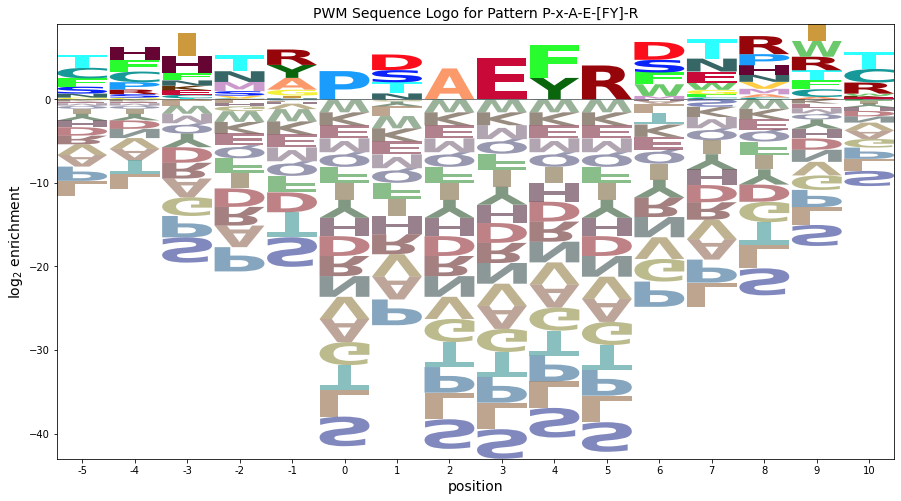

Information Content Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.000000,0.0,0.000000,0.000000,0.161433,0.161433,0.000000,0.000000,0.000000,0.000000,0.000000,0.161433,0.000000,0.0,0.000000,0.565017,0.645734,0.000000,0.000000,0.000000
1,0.000000,0.0,0.000000,0.000000,0.210753,0.140502,0.281003,0.000000,0.000000,0.000000,0.000000,0.000000,0.351254,0.0,0.140502,0.351254,0.000000,0.000000,0.000000,0.000000
2,0.000000,0.0,0.000000,0.064814,0.129627,0.000000,0.388882,0.583323,0.064814,0.097220,0.000000,0.162034,0.000000,0.0,0.000000,0.000000,0.162034,0.097220,0.000000,0.000000
3,0.000000,0.0,0.000000,0.000000,0.000000,0.046776,0.031184,0.000000,0.000000,0.077960,0.077960,0.171513,0.000000,0.0,0.000000,0.218289,0.389802,0.093552,0.000000,0.046776
4,0.213802,0.0,0.000000,0.000000,0.000000,0.125766,0.037730,0.050306,0.000000,0.088036,0.000000,0.062883,0.088036,0.0,0.226379,0.000000,0.000000,0.037730,0.000000,0.150919
5,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.652865,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
6,0.000000,0.0,0.294158,0.000000,0.000000,0.081710,0.000000,0.000000,0.000000,0.049026,0.000000,0.130737,0.000000,0.0,0.000000,0.506605,0.310500,0.000000,0.000000,0.032684
7,3.969354,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,0.000000,0.0,0.000000,5.159470,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


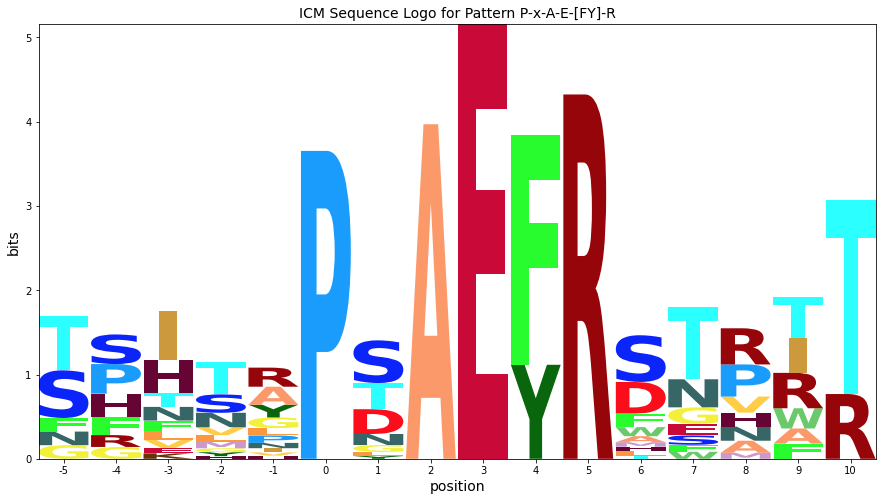

X^2 Critical Value = 40.15223303520055
Chi Square Tests


,index,Position,X^2,p-value,Critical pBH,Critical pBY,AAmax,PWMSmax,AAmin,PWMSmin
0,8,3,2987.6448863636356,0.000000e+00,0.003125,0.000924,E,4.874493064095775,S,-3.5402552251867188
1,10,5,1634.7180771754045,0.000000e+00,0.006250,0.001849,R,4.037553316515329,S,-3.5402552251867188
2,7,2,1261.078579988483,7.710648e-256,0.009375,0.002773,A,3.6843765821445316,S,-3.5402552251867188
3,9,4,1258.9598866511901,2.192613e-255,0.012500,0.003697,F,3.984827639886979,S,-3.5402552251867188
4,5,0,995.7336966030945,4.320039e-199,0.015625,0.004622,P,3.3678879485275206,S,-3.5402552251867188
5,12,7,211.46814472219367,1.759967e-34,0.018750,0.005546,T,2.3294872098986077,L,-2.8545246825981527
6,2,-3,201.86218584820244,1.450666e-32,0.021875,0.006470,I,2.779248221022831,S,-3.0217881362524683
7,11,6,189.16839786003496,4.795775e-30,0.025000,0.007395,D,2.1353205776658344,P,-3.0195604347295038
8,6,1,169.6733744429433,3.292140e-26,0.028125,0.008319,D,1.8683213598804187,P,-3.0750555473212073
9,13,8,146.18681366540815,1.188841e-21,0.031250,0.009244,R,2.1610668525356838,S,-3.221725706761221


----------------------------------------------------------------------
m Pattern: N-x-A-E-[FY]-R
Position Probability Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.222222,0.0,0.000000,0.000000,0.444444,0.222222,0.00,0.111111,0.000000,0.000000,0.000000,0.000000,0.000000
1,0.080000,0.0,0.000000,0.000000,0.240000,0.320000,0.000000,0.000000,0.2,0.000000,0.080000,0.000000,0.000000,0.00,0.000000,0.000000,0.000000,0.000000,0.000000,0.080000
2,0.000000,0.0,0.000000,0.000000,0.000000,0.114286,0.057143,0.000000,0.0,0.142857,0.057143,0.057143,0.000000,0.00,0.000000,0.314286,0.000000,0.000000,0.257143,0.000000
3,0.000000,0.0,0.136364,0.000000,0.000000,0.159091,0.000000,0.000000,0.0,0.000000,0.045455,0.272727,0.090909,0.00,0.000000,0.295455,0.000000,0.000000,0.000000,0.000000
4,0.000000,0.0,0.000000,0.000000,0.065574,0.081967,0.000000,0.114754,0.0,0.000000,0.344262,0.032787,0.000000,0.00,0.114754,0.147541,0.032787,0.065574,0.000000,0.000000
5,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,1.000000,0.000000,0.00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
6,0.000000,0.0,0.062500,0.031250,0.000000,0.062500,0.000000,0.000000,0.0,0.000000,0.000000,0.234375,0.078125,0.00,0.000000,0.421875,0.109375,0.000000,0.000000,0.000000
7,1.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,0.000000,0.0,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


Position Weight Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,-1.278574,1.381580,-0.899613,-0.088457,-0.489376,-1.279719,-0.701594,1.814775,-0.066934,-1.693061,-0.178762,2.174522,0.726865,-0.270897,0.659565,-2.060262,-1.509049,-1.171840,0.014907,-0.668356
1,0.062463,1.137654,-1.143539,-0.332383,2.074054,1.646281,-0.945520,-0.751079,2.274103,-1.936987,1.162275,-1.239328,-1.838988,-0.514823,-1.169323,-2.304188,-1.752975,-1.415766,-0.229018,0.672681
2,-1.812006,0.848147,-1.433045,-0.621890,-1.022808,0.508777,0.349936,-1.040586,-0.600366,0.358469,0.872768,0.056128,-2.128495,-0.804329,-1.458829,0.991268,-2.042482,-1.705272,2.803403,-1.201788
3,-2.030646,0.629507,1.155669,-0.840530,-1.241448,0.968209,-1.453666,-1.259226,-0.819006,-2.445134,0.654128,1.952964,-0.025207,-1.022969,-1.677470,0.995020,-2.261122,-1.923913,-0.737165,-1.420429
4,-2.370496,0.289657,-1.991536,-1.180380,0.740630,0.213321,-1.793516,1.400924,-1.158856,-2.784984,3.188747,-0.502363,-2.686985,-1.362819,0.982680,0.169743,-1.016009,0.058165,-1.077015,-1.760279
5,-2.422964,0.237190,-2.044003,-1.232847,-1.633766,-2.424109,-1.845984,-1.651543,-1.211324,-2.837451,-1.323152,3.882575,-2.739453,-1.415287,-2.069787,-3.204652,-2.653439,-2.316230,-1.129483,-1.812746
6,-2.422964,0.237190,0.277925,0.352115,-1.633766,-0.102180,-1.845984,-1.651543,-1.211324,-2.837451,-1.323152,1.860207,-0.154490,-1.415287,-2.069787,1.602703,0.346561,-2.316230,-1.129483,-1.812746
7,3.599404,0.237190,-2.044003,-1.232847,-1.633766,-2.424109,-1.845984,-1.651543,-1.211324,-2.837451,-1.323152,-2.139793,-2.739453,-1.415287,-2.069787,-3.204652,-2.653439,-2.316230,-1.129483,-1.812746
8,-2.422964,0.237190,-2.044003,4.789520,-1.633766,-2.424109,-1.845984,-1.651543,-1.211324,-2.837451,-1.323152,-2.139793,-2.739453,-1.415287,-2.069787,-3.204652,-2.653439,-2.316230,-1.129483,-1.812746


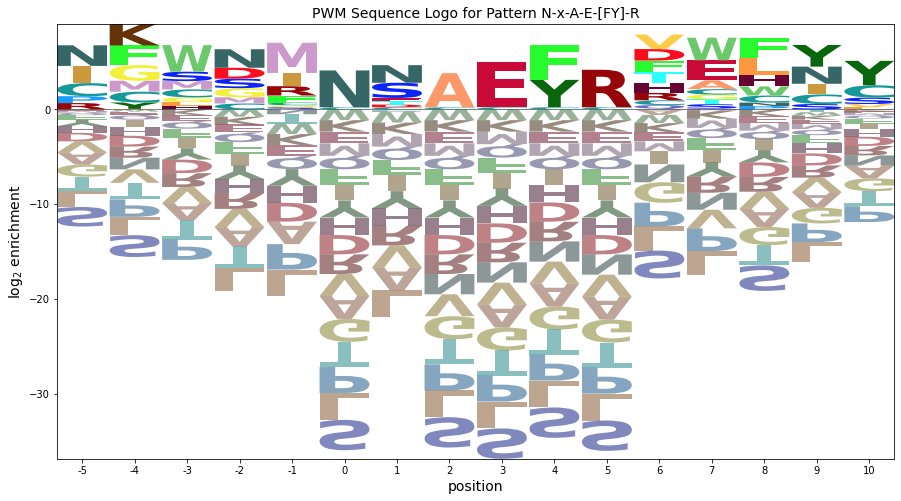

Information Content Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.533101,0.000000,0.000000,0.000000,1.066202,0.533101,0.00000,0.266550,0.000000,0.000000,0.000000,0.000000,0.000000
1,0.174276,0.0,0.000000,0.000000,0.522827,0.697103,0.000000,0.000000,0.435689,0.000000,0.174276,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.174276
2,0.000000,0.0,0.000000,0.000000,0.000000,0.184427,0.092214,0.000000,0.000000,0.230534,0.092214,0.092214,0.000000,0.00000,0.000000,0.507175,0.000000,0.000000,0.414961,0.000000
3,0.000000,0.0,0.208136,0.000000,0.000000,0.242826,0.000000,0.000000,0.000000,0.000000,0.069379,0.416272,0.138757,0.00000,0.000000,0.450962,0.000000,0.000000,0.000000,0.000000
4,0.000000,0.0,0.000000,0.000000,0.107125,0.133906,0.000000,0.187468,0.000000,0.000000,0.562404,0.053562,0.000000,0.00000,0.187468,0.241030,0.053562,0.107125,0.000000,0.000000
5,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,4.252525,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
6,0.000000,0.0,0.088011,0.044005,0.000000,0.088011,0.000000,0.000000,0.000000,0.000000,0.000000,0.330039,0.110013,0.00000,0.000000,0.594071,0.154018,0.000000,0.000000,0.000000
7,3.969354,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,0.000000,0.0,0.000000,5.159470,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


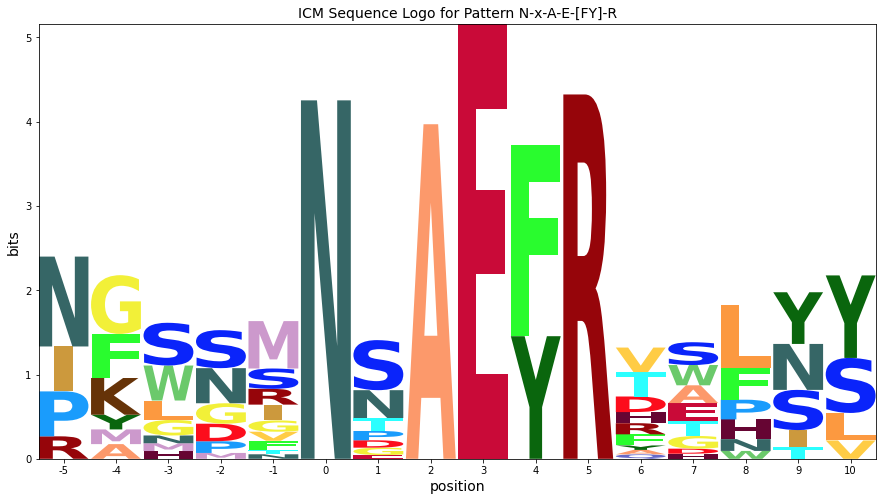

X^2 Critical Value = 40.15223303520055
Chi Square Tests


,index,Position,X^2,p-value,Critical pBH,Critical pBY,AAmax,PWMSmax,AAmin,PWMSmin
0,8,3,2223.363636363636,0.000000e+00,0.003125,0.000924,E,4.789520413059941,S,-3.204652193402279
1,10,5,1216.534383014254,2.674275e-246,0.006250,0.001849,R,3.952580665479494,S,-3.204652193402279
2,5,0,1155.8810651111703,2.567043e-233,0.009375,0.002773,N,3.88257517094696,S,-3.204652193402279
3,7,2,938.4770827821268,7.086729e-187,0.012500,0.003697,A,3.599403931108698,S,-3.204652193402279
4,9,4,812.8045191595253,4.077667e-160,0.015625,0.004622,F,3.6881624561719057,S,-3.204652193402279
5,4,-1,251.41757192150595,1.597734e-42,0.018750,0.005546,M,3.1887467119709143,L,-2.784983749345076
6,6,1,133.16820431095354,3.657544e-19,0.021875,0.006470,N,1.860207357918505,L,-2.837451169239211
7,13,8,113.94109699400873,1.489687e-15,0.025000,0.007395,F,2.0458337361437744,S,-2.69497781998536
8,2,-3,109.59036370817182,9.484637e-15,0.028125,0.008319,W,2.8034032628700403,P,-2.1284948062826676
9,14,9,105.38361536946616,5.611134e-14,0.031250,0.009244,Y,2.2867895466424564,L,-2.0598435905756594


----------------------------------------------------------------------
n Pattern: L-D-A-E-[FY]
Position Probability Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.133333,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.0000,0.000000,0.000000,0.000000,0.000000,0.066667,0.166667,0.000000,0.233333,0.400000,0.000000,0.000000,0.000000
1,0.071429,0.0,0.047619,0.000000,0.000000,0.119048,0.000000,0.0000,0.000000,0.071429,0.000000,0.380952,0.119048,0.095238,0.095238,0.000000,0.000000,0.000000,0.000000,0.000000
2,0.000000,0.0,0.000000,0.000000,0.000000,0.094340,0.056604,0.0000,0.000000,0.075472,0.000000,0.000000,0.075472,0.264151,0.000000,0.301887,0.132075,0.000000,0.000000,0.000000
3,0.067797,0.0,0.067797,0.000000,0.000000,0.000000,0.084746,0.0000,0.000000,0.000000,0.067797,0.152542,0.000000,0.033898,0.000000,0.203390,0.000000,0.237288,0.084746,0.000000
4,0.000000,0.0,0.140625,0.031250,0.031250,0.000000,0.000000,0.0625,0.000000,0.000000,0.000000,0.078125,0.062500,0.000000,0.000000,0.140625,0.046875,0.000000,0.000000,0.406250
5,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.0000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
6,0.000000,0.0,1.000000,0.000000,0.000000,0.000000,0.000000,0.0000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
7,1.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.0000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,0.000000,0.0,0.000000,1.000000,0.000000,0.000000,0.000000,0.0000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


Position Weight Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.647425,0.985651,-1.295542,-0.484386,-0.885304,-1.675647,-1.097523,-0.903082,-0.462863,-2.088990,-0.574691,-1.391331,-0.406029,1.918137,-1.321326,0.543809,1.795462,-1.567769,-0.381021,-1.064285
1,0.015157,0.675311,-0.020920,-0.794726,-1.195645,0.598975,-1.407863,-1.213422,-0.773203,-0.399330,-0.885031,2.385791,0.283631,1.344762,0.690262,-2.766531,-2.215318,-1.878109,-0.691361,-1.374625
2,-2.220471,0.439683,-1.841510,-1.030355,-1.431273,0.363347,0.356509,-1.449050,-1.008831,-0.313030,-1.120659,-1.937300,-0.215032,2.694097,-1.867294,1.085304,0.549054,-2.113737,-0.926990,-1.610253
3,-0.012499,0.325726,0.366462,-1.144311,-1.545229,-2.335572,0.827515,-1.563007,-1.122787,-2.748914,1.087312,1.270672,-2.650916,0.258212,-1.981250,0.584324,-2.564903,1.679197,1.544017,-1.724209
4,-2.422964,0.237190,1.277925,0.352115,-0.048803,-2.424109,-1.845984,0.670385,-1.211324,-2.837451,-1.323152,0.445170,-0.417524,-1.415287,-2.069787,0.117276,-0.653439,-2.316230,-1.129483,2.942141
5,-2.422964,0.237190,-2.044003,-1.232847,-1.633766,-2.424109,-1.845984,-1.651543,-1.211324,3.184917,-1.323152,-2.139793,-2.739453,-1.415287,-2.069787,-3.204652,-2.653439,-2.316230,-1.129483,-1.812746
6,-2.422964,0.237190,3.978365,-1.232847,-1.633766,-2.424109,-1.845984,-1.651543,-1.211324,-2.837451,-1.323152,-2.139793,-2.739453,-1.415287,-2.069787,-3.204652,-2.653439,-2.316230,-1.129483,-1.812746
7,3.599404,0.237190,-2.044003,-1.232847,-1.633766,-2.424109,-1.845984,-1.651543,-1.211324,-2.837451,-1.323152,-2.139793,-2.739453,-1.415287,-2.069787,-3.204652,-2.653439,-2.316230,-1.129483,-1.812746
8,-2.422964,0.237190,-2.044003,4.789520,-1.633766,-2.424109,-1.845984,-1.651543,-1.211324,-2.837451,-1.323152,-2.139793,-2.739453,-1.415287,-2.069787,-3.204652,-2.653439,-2.316230,-1.129483,-1.812746


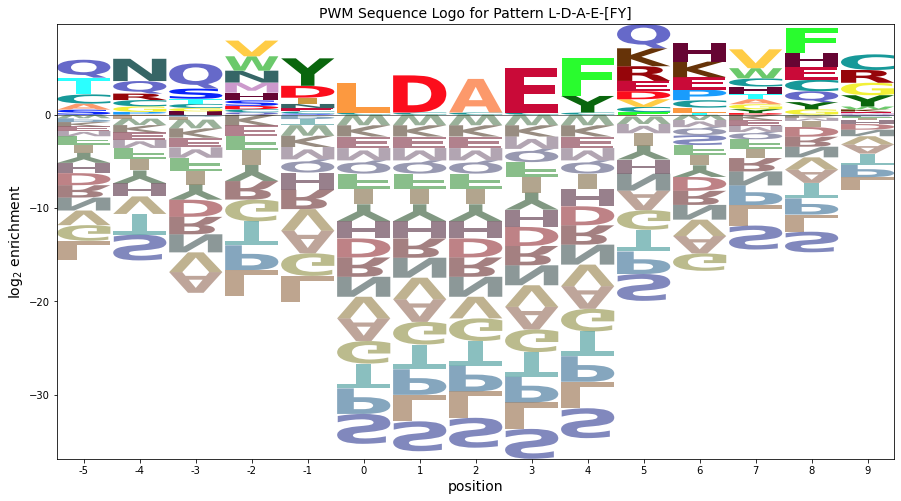

Information Content Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.232544,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.116272,0.290680,0.000000,0.406952,0.697633,0.000000,0.000000,0.000000
1,0.106913,0.0,0.071276,0.000000,0.000000,0.178189,0.000000,0.00000,0.000000,0.106913,0.000000,0.570204,0.178189,0.142551,0.142551,0.000000,0.000000,0.000000,0.000000,0.000000
2,0.000000,0.0,0.000000,0.000000,0.000000,0.133327,0.079996,0.00000,0.000000,0.106662,0.000000,0.000000,0.106662,0.373317,0.000000,0.426648,0.186658,0.000000,0.000000,0.000000
3,0.084036,0.0,0.084036,0.000000,0.000000,0.000000,0.105045,0.00000,0.000000,0.000000,0.084036,0.189081,0.000000,0.042018,0.000000,0.252108,0.000000,0.294126,0.105045,0.000000
4,0.000000,0.0,0.229432,0.050985,0.050985,0.000000,0.000000,0.10197,0.000000,0.000000,0.000000,0.127462,0.101970,0.000000,0.000000,0.229432,0.076477,0.000000,0.000000,0.662804
5,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,3.554866,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
6,0.000000,0.0,4.348314,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
7,3.969354,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,0.000000,0.0,0.000000,5.159470,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


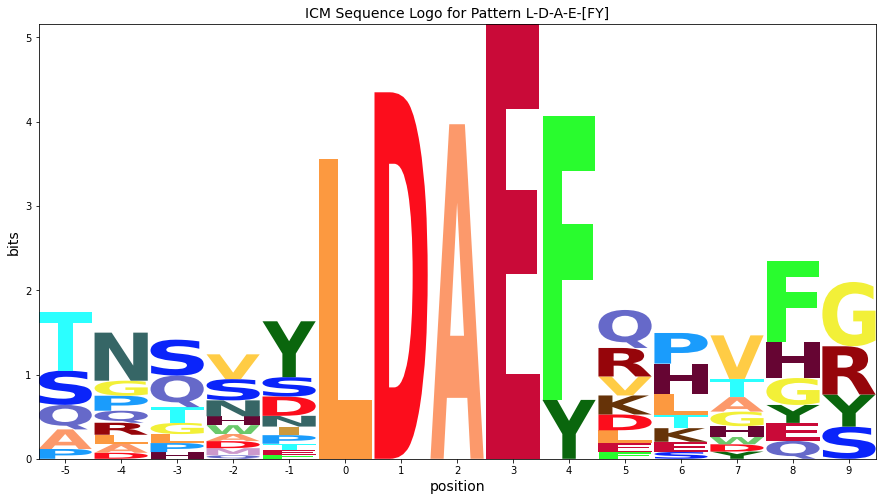

X^2 Critical Value = 39.938849338465694
Chi Square Tests


,index,Position,X^2,p-value,Critical pBH,Critical pBY,AAmax,PWMSmax,AAmin,PWMSmin
0,8,3,2223.363636363636,0.000000e+00,0.003333,0.001005,E,4.789520413059941,S,-3.204652193402279
1,6,1,1239.6259866423802,3.035478e-251,0.006667,0.002009,D,3.9783646912497277,S,-3.204652193402279
2,9,4,1169.2663400360964,3.509831e-236,0.010000,0.003014,F,4.121121863448012,S,-3.204652193402279
3,7,2,938.4770827821268,7.086729e-187,0.013333,0.004018,A,3.599403931108698,S,-3.204652193402279
4,5,0,688.1446087017445,1.166910e-133,0.016667,0.005023,L,3.184916643789244,S,-3.204652193402279
5,4,-1,248.94319170942555,5.065311e-42,0.020000,0.006027,Y,2.9421413752550105,L,-2.8374511692392117
6,10,5,148.66526051174017,3.963480e-22,0.023333,0.007032,Q,2.6113810500864547,S,-2.878423961081291
7,2,-3,138.5189290406938,3.502338e-20,0.026667,0.008036,Q,2.6940965591316357,A,-2.220471018021015
8,1,-4,118.41739383841745,2.190709e-16,0.030000,0.009041,N,2.3857913115607294,S,-2.766531081010394
9,13,8,117.62992356672831,3.071977e-16,0.033333,0.010046,F,2.6881624561719044,S,-2.20465219340228


----------------------------------------------------------------------
o Pattern: S-E-F-R-[LV]
Position Probability Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.000000,0.0,0.117647,0.000000,0.058824,0.000000,0.088235,0.000000,0.000000,0.000000,0.294118,0.000000,0.088235,0.058824,0.000000,0.205882,0.088235,0.000000,0.000000,0.000000
1,0.040541,0.0,0.027027,0.040541,0.027027,0.378378,0.000000,0.094595,0.000000,0.000000,0.094595,0.000000,0.135135,0.000000,0.000000,0.135135,0.000000,0.027027,0.000000,0.000000
2,0.283784,0.0,0.040541,0.000000,0.000000,0.000000,0.094595,0.040541,0.000000,0.202703,0.000000,0.000000,0.202703,0.000000,0.081081,0.000000,0.027027,0.027027,0.000000,0.000000
3,0.000000,0.0,0.135135,0.000000,0.067568,0.067568,0.000000,0.000000,0.000000,0.135135,0.027027,0.000000,0.000000,0.000000,0.000000,0.378378,0.067568,0.000000,0.094595,0.027027
4,0.000000,0.0,0.109756,0.000000,0.000000,0.048780,0.000000,0.000000,0.000000,0.000000,0.000000,0.170732,0.000000,0.000000,0.000000,0.548780,0.121951,0.000000,0.000000,0.000000
5,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000
6,0.000000,0.0,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
7,0.000000,0.0,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000


Position Weight Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,-1.785534,0.874620,0.915355,-0.595417,0.588627,-1.786679,0.791446,-1.014113,-0.573894,-2.200021,2.773709,-1.502363,-0.102023,0.807106,-1.432357,0.432778,-0.016009,-1.678800,-0.492053,-1.175316
1,-0.585235,0.074918,-0.621312,0.604881,-0.211075,2.271601,-2.008255,1.186185,-1.373595,-2.999723,1.514576,-2.302064,0.557708,-1.577558,-2.232059,0.092508,-2.815711,-0.893539,-1.291754,-1.975018
2,1.874196,0.074918,-0.206275,-1.395119,-1.796037,-2.586380,0.991745,0.186185,-1.373595,1.000277,-1.485424,-2.302064,1.098276,-1.577558,0.575296,-3.366924,-1.230748,-0.893539,-1.291754,-1.975018
3,-2.585235,0.074918,1.253157,-1.395119,0.788925,-0.001417,-2.008255,-1.813815,-1.373595,0.459709,0.099539,-2.302064,-2.901724,-1.577558,-2.232059,1.491057,-0.230748,-2.478501,1.708246,-0.390055
4,-2.703072,-0.042918,0.997817,-1.512955,-1.913874,-0.382288,-2.126092,-1.931651,-1.491432,-3.117559,-1.603260,1.486990,-3.019560,-1.695395,-2.349895,2.038802,0.525884,-2.596338,-1.409590,-2.092854
5,-2.731086,-0.070933,-2.352125,-1.540970,-1.941888,-2.732231,-2.154106,-1.959666,-1.519446,-3.145573,-1.631275,-2.447915,-3.047575,-1.723409,-2.377909,2.896616,-2.961562,-2.624352,-1.437605,-2.120868
6,-2.731086,-0.070933,-2.352125,4.868421,-1.941888,-2.732231,-2.154106,-1.959666,-1.519446,-3.145573,-1.631275,-2.447915,-3.047575,-1.723409,-2.377909,-3.512774,-2.961562,-2.624352,-1.437605,-2.120868
7,-2.731086,-0.070933,-2.352125,-1.540970,4.467503,-2.732231,-2.154106,-1.959666,-1.519446,-3.145573,-1.631275,-2.447915,-3.047575,-1.723409,-2.377909,-3.512774,-2.961562,-2.624352,-1.437605,-2.120868
8,-2.731086,-0.070933,-2.352125,-1.540970,-1.941888,-2.732231,-2.154106,-1.959666,-1.519446,-3.145573,-1.631275,-2.447915,-3.047575,-1.723409,4.031481,-3.512774,-2.961562,-2.624352,-1.437605,-2.120868


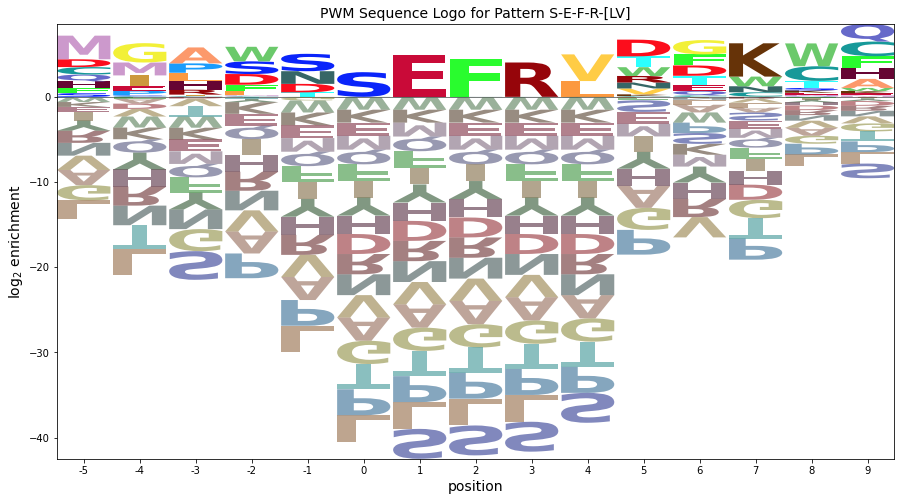

Information Content Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.000000,0.0,0.179397,0.000000,0.089698,0.000000,0.134548,0.000000,0.000000,0.000000,0.448492,0.000000,0.134548,0.089698,0.000000,0.313944,0.134548,0.000000,0.000000,0.000000
1,0.053850,0.0,0.035900,0.053850,0.035900,0.502603,0.000000,0.125651,0.000000,0.000000,0.125651,0.000000,0.179501,0.000000,0.000000,0.179501,0.000000,0.035900,0.000000,0.000000
2,0.348003,0.0,0.049715,0.000000,0.000000,0.000000,0.116001,0.049715,0.000000,0.248574,0.000000,0.000000,0.248574,0.000000,0.099429,0.000000,0.033143,0.033143,0.000000,0.000000
3,0.000000,0.0,0.158468,0.000000,0.079234,0.079234,0.000000,0.000000,0.000000,0.158468,0.031694,0.000000,0.000000,0.000000,0.000000,0.443712,0.079234,0.000000,0.110928,0.031694
4,0.000000,0.0,0.193067,0.000000,0.000000,0.085808,0.000000,0.000000,0.000000,0.000000,0.000000,0.300326,0.000000,0.000000,0.000000,0.965335,0.214519,0.000000,0.000000,0.000000
5,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.187665,0.000000,0.000000,0.000000,0.000000
6,0.000000,0.0,0.000000,5.159470,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
7,0.000000,0.0,0.000000,0.000000,4.758552,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,4.322530,0.000000,0.000000,0.000000,0.000000,0.000000


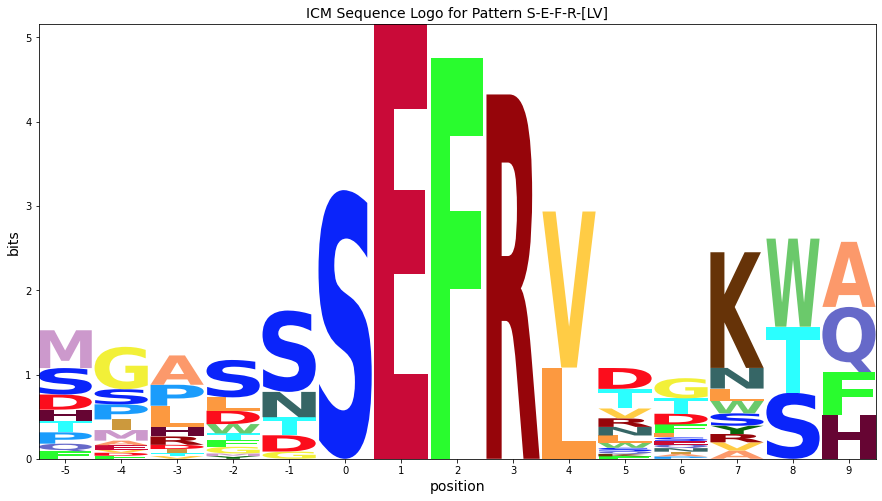

X^2 Critical Value = 39.938849338465694
Chi Square Tests


,index,Position,X^2,p-value,Critical pBH,Critical pBY,AAmax,PWMSmax,AAmin,PWMSmin
0,6,1,2918.1647727272716,0.000000e+00,0.003333,0.001005,E,4.868421240806856,S,-3.51277448876461
1,7,2,2189.7677846211777,0.000000e+00,0.006667,0.002009,F,4.467503002059913,S,-3.51277448876461
2,8,3,1596.7013777062084,0.000000e+00,0.010000,0.003014,R,4.031481493226409,S,-3.512774488764611
3,5,0,681.3536121673004,3.200235e-132,0.013333,0.004018,S,2.896616447373091,L,-3.1455734646015427
4,9,4,614.4747203644638,4.441907e-118,0.016667,0.005023,V,3.1305351862218385,S,-3.5127744887646117
5,12,7,545.1401599009127,1.832215e-103,0.020000,0.006027,K,3.909691532486624,P,-2.476418109702975
6,4,-1,228.02193716250298,8.441566e-38,0.023333,0.007032,S,2.0388018434619983,L,-3.117559088431946
7,1,-4,170.79114787446298,1.989246e-26,0.026667,0.008036,G,2.2716010177260957,L,-2.9997225981380877
8,2,-3,125.89360070713887,8.690050e-18,0.030000,0.009041,A,1.8741963078186625,S,-3.3669236223011567
9,3,-2,113.41194342797851,1.867046e-15,0.033333,0.010046,W,1.7082460298296995,P,-2.901723944435646


----------------------------------------------------------------------
p Pattern: D-A-E-x-R-[LV]
Position Probability Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.044776,0.000000,0.089552,0.000000,0.000000,0.029851,0.000000,0.000000,0.0,0.223881,0.044776,0.149254,0.253731,0.044776,0.074627,0.044776,0.000000,0.000000,0.000000,0.000000
1,0.170455,0.000000,0.000000,0.079545,0.000000,0.125000,0.238636,0.000000,0.0,0.022727,0.022727,0.147727,0.090909,0.056818,0.022727,0.000000,0.000000,0.000000,0.022727,0.000000
2,0.000000,0.000000,0.041667,0.000000,0.000000,0.156250,0.031250,0.156250,0.0,0.020833,0.000000,0.135417,0.187500,0.000000,0.031250,0.083333,0.072917,0.062500,0.000000,0.020833
3,0.101010,0.000000,0.080808,0.080808,0.030303,0.000000,0.222222,0.030303,0.0,0.020202,0.000000,0.030303,0.030303,0.000000,0.070707,0.050505,0.050505,0.020202,0.000000,0.181818
4,0.155963,0.027523,0.000000,0.027523,0.119266,0.018349,0.055046,0.000000,0.0,0.082569,0.045872,0.064220,0.027523,0.000000,0.000000,0.165138,0.110092,0.082569,0.000000,0.018349
5,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
6,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
7,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,0.000000,0.025424,0.000000,0.000000,0.000000,0.016949,0.169492,0.042373,0.0,0.203390,0.025424,0.016949,0.000000,0.000000,0.144068,0.000000,0.016949,0.042373,0.016949,0.279661


Position Weight Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,-0.473590,0.186564,0.712726,-1.283473,-1.684392,-0.889772,-1.896610,-1.702169,-1.261950,1.111923,0.626222,1.269013,1.379846,0.534087,0.464549,-1.255278,-2.704065,-2.366856,-1.180109,-1.863372
1,1.214466,-0.125380,-2.406573,1.404583,-1.996336,0.798284,2.250878,-2.014113,-1.573894,-1.615059,-0.100760,1.304992,0.067902,0.807106,-0.847395,-3.567222,-3.016009,-2.678800,0.092910,-2.175316
2,-2.888627,-0.228474,-0.187739,-1.698511,-2.099429,1.110228,-0.311647,1.882793,-1.676987,-1.718152,-1.788816,1.201899,1.042811,-1.880950,-0.535451,-0.500391,-0.119103,0.025461,-1.595146,-0.693447
3,0.533967,-0.265311,0.623422,1.434577,-0.136266,-2.926609,2.175078,-0.154044,-1.713824,-1.754989,-1.825653,-0.642293,-1.241953,-1.917787,0.427713,-1.122190,-0.570977,-1.233768,-1.631983,1.932681
4,1.128051,1.618280,-2.662913,0.148243,1.554679,-1.458056,0.342461,-2.270453,-1.830234,-0.134433,0.642900,0.241298,-1.358362,-2.034197,-2.688697,0.424365,0.428091,0.386788,-1.748392,-0.846693
5,-3.139171,-0.479017,4.134608,-1.949054,-2.349973,-3.140316,-2.562191,-2.367750,-1.927531,-3.553658,-2.039359,-2.856000,-3.455660,-2.131494,-2.785994,-3.920859,-3.369646,-3.032437,-1.845690,-2.528953
6,3.755647,-0.479017,-2.760210,-1.949054,-2.349973,-3.140316,-2.562191,-2.367750,-1.927531,-3.553658,-2.039359,-2.856000,-3.455660,-2.131494,-2.785994,-3.920859,-3.369646,-3.032437,-1.845690,-2.528953
7,-3.139171,-0.479017,-2.760210,4.945763,-2.349973,-3.140316,-2.562191,-2.367750,-1.927531,-3.553658,-2.039359,-2.856000,-3.455660,-2.131494,-2.785994,-3.920859,-3.369646,-3.032437,-1.845690,-2.528953
8,-3.139171,1.520983,-2.760210,-1.949054,-2.349973,-1.555353,1.830127,0.217212,-1.927531,1.090198,-0.039359,-1.271037,-3.455660,-2.131494,1.383931,-3.920859,-1.784684,-0.447475,-0.260727,2.558510


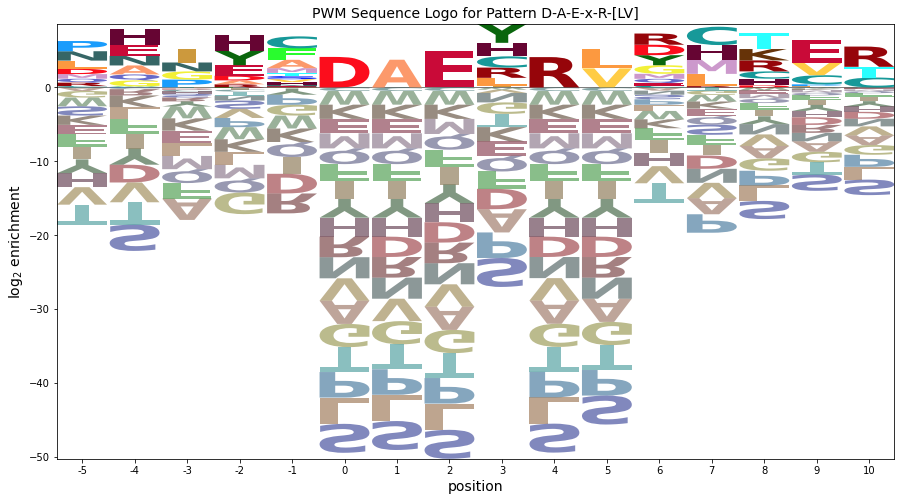

Information Content Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.045589,0.000000,0.091178,0.000000,0.000000,0.030393,0.000000,0.000000,0.000000,0.227944,0.045589,0.151963,0.258337,0.045589,0.075981,0.045589,0.000000,0.000000,0.000000,0.000000
1,0.217760,0.000000,0.000000,0.101621,0.000000,0.159691,0.304864,0.000000,0.000000,0.029035,0.029035,0.188725,0.116139,0.072587,0.029035,0.000000,0.000000,0.000000,0.029035,0.000000
2,0.000000,0.000000,0.033400,0.000000,0.000000,0.125250,0.025050,0.125250,0.000000,0.016700,0.000000,0.108550,0.150300,0.000000,0.025050,0.066800,0.058450,0.050100,0.000000,0.016700
3,0.096463,0.000000,0.077170,0.077170,0.028939,0.000000,0.212219,0.028939,0.000000,0.019293,0.000000,0.028939,0.028939,0.000000,0.067524,0.048231,0.048231,0.019293,0.000000,0.173633
4,0.094592,0.016693,0.000000,0.016693,0.072335,0.011128,0.033385,0.000000,0.000000,0.050078,0.027821,0.038950,0.016693,0.000000,0.000000,0.100156,0.066771,0.050078,0.000000,0.011128
5,0.000000,0.000000,4.348314,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
6,3.969354,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
7,0.000000,0.000000,0.000000,5.159470,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,0.000000,0.037809,0.000000,0.000000,0.000000,0.025206,0.252060,0.063015,0.000000,0.302472,0.037809,0.025206,0.000000,0.000000,0.214251,0.000000,0.025206,0.063015,0.025206,0.415899


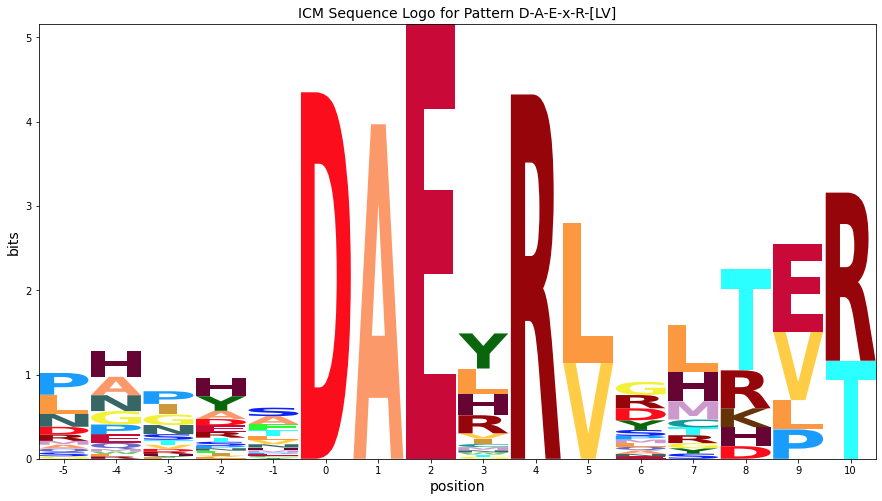

X^2 Critical Value = 40.15223303520055
Chi Square Tests


,index,Position,X^2,p-value,Critical pBH,Critical pBY,AAmax,PWMSmax,AAmin,PWMSmin
0,5,0,2285.5604128718887,0.000000e+00,0.003125,0.000924,D,4.134607607529806,S,-3.920859227401689
1,6,1,1730.3171213795463,0.000000e+00,0.006250,0.001849,A,3.755646847388776,S,-3.920859227401689
2,7,2,4099.326704545455,0.000000e+00,0.009375,0.002773,E,4.94576332934002,S,-3.920859227401689
3,9,4,2242.985268682532,0.000000e+00,0.012500,0.003697,R,4.108823581759574,S,-3.9208592274016882
4,10,5,699.3428137544616,4.952124e-136,0.015625,0.004622,L,2.5960889162660616,S,-3.9208592274016882
5,8,3,310.52332799472697,1.388135e-54,0.018750,0.005546,Y,2.5585096803424725,S,-3.9208592274016882
6,3,-2,170.07984520362064,2.741163e-26,0.021875,0.006470,H,2.1750777398996037,G,-2.926608889031783
7,1,-4,169.98068061951813,2.866438e-26,0.025000,0.007395,H,2.2508776636243626,S,-3.5672222727869882
8,15,10,167.07380949231046,1.060971e-25,0.028125,0.008319,R,2.7375677745086433,S,-2.097736989485768
9,14,9,157.10806228832683,9.241521e-24,0.031250,0.009244,E,3.0890806949188474,S,-2.20465219340228


----------------------------------------------------------------------
q Pattern: D-[AS]-E-H-R
Position Probability Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.000000,0.0,0.000000,0.1250,0.000000,0.000000,0.000000,0.187500,0.000000,0.187500,0.187500,0.000000,0.125000,0.000000,0.000000,0.187500,0.000000,0.000000,0.000000,0.000000
1,0.000000,0.0,0.000000,0.0000,0.000000,0.093750,0.000000,0.000000,0.000000,0.187500,0.000000,0.250000,0.062500,0.000000,0.000000,0.093750,0.156250,0.062500,0.000000,0.093750
2,0.000000,0.0,0.083333,0.0000,0.000000,0.055556,0.000000,0.000000,0.000000,0.000000,0.055556,0.222222,0.083333,0.000000,0.000000,0.055556,0.000000,0.166667,0.055556,0.222222
3,0.050000,0.0,0.000000,0.2000,0.000000,0.000000,0.125000,0.000000,0.000000,0.075000,0.000000,0.000000,0.050000,0.000000,0.000000,0.275000,0.000000,0.225000,0.000000,0.000000
4,0.000000,0.0,0.046512,0.0000,0.232558,0.046512,0.046512,0.046512,0.000000,0.046512,0.000000,0.000000,0.139535,0.046512,0.000000,0.209302,0.069767,0.069767,0.000000,0.000000
5,0.000000,0.0,1.000000,0.0000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
6,0.884615,0.0,0.000000,0.0000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.115385,0.000000,0.000000,0.000000,0.000000
7,0.000000,0.0,0.000000,1.0000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,0.000000,0.0,0.000000,0.0000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


Position Weight Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,-1.200571,1.459582,-0.821611,1.574508,-0.411373,-1.201716,-0.623591,1.570849,0.011069,0.384941,1.899240,-0.917400,0.067902,-0.192894,-0.847395,0.017740,-1.431047,-1.093838,0.092910,-0.590354
1,-1.731086,0.929067,-1.352125,-0.540970,-0.941888,0.267769,-1.154106,-0.959666,-0.519446,0.661781,-0.631275,1.722010,-0.462612,-0.723409,-1.377909,-0.512774,0.623401,-0.039390,-0.437605,0.879132
2,-1.838001,0.822152,0.540959,-0.647885,-1.048803,-0.254184,-1.261021,-1.066581,-0.626361,-2.252489,0.846773,1.615095,-0.154490,-0.830324,-1.484825,-1.034727,-2.068477,1.076087,1.040442,1.942141
3,-0.352575,0.722617,-1.558576,2.422504,-1.148339,-1.938682,1.224405,-1.166117,-0.725897,-0.352024,-0.837725,-1.654366,-0.669063,-0.929860,-1.584360,0.865737,-2.168012,1.491125,-0.644056,-1.327319
4,-2.007926,0.652227,-0.044003,-0.817810,2.240703,-0.424109,0.154016,0.348457,-0.796286,-0.837451,-0.908115,-1.724755,0.482940,0.584713,-1.654750,0.532313,-0.238402,0.098807,-0.714445,-1.397709
5,-2.200571,0.459582,3.906310,-1.010455,-1.411373,-2.201716,-1.623591,-1.429151,-0.988931,-2.615059,-1.100760,-1.917400,-2.517060,-1.192894,-1.847395,-2.982260,-2.431047,-2.093838,-0.907090,-1.590354
6,3.354017,0.459582,-1.821611,-1.010455,-1.411373,-2.201716,-1.623591,-1.429151,-0.988931,-2.615059,-1.100760,-1.917400,-2.517060,-1.192894,-1.847395,-0.174905,-2.431047,-2.093838,-0.907090,-1.590354
7,-2.200571,0.459582,-1.821611,4.717465,-1.411373,-2.201716,-1.623591,-1.429151,-0.988931,-2.615059,-1.100760,-1.917400,-2.517060,-1.192894,-1.847395,-2.982260,-2.431047,-2.093838,-0.907090,-1.590354
8,-2.200571,0.459582,-1.821611,-1.010455,-1.411373,-2.201716,4.104329,-1.429151,-0.988931,-2.615059,-1.100760,-1.917400,-2.517060,-1.192894,-1.847395,-2.982260,-2.431047,-2.093838,-0.907090,-1.590354


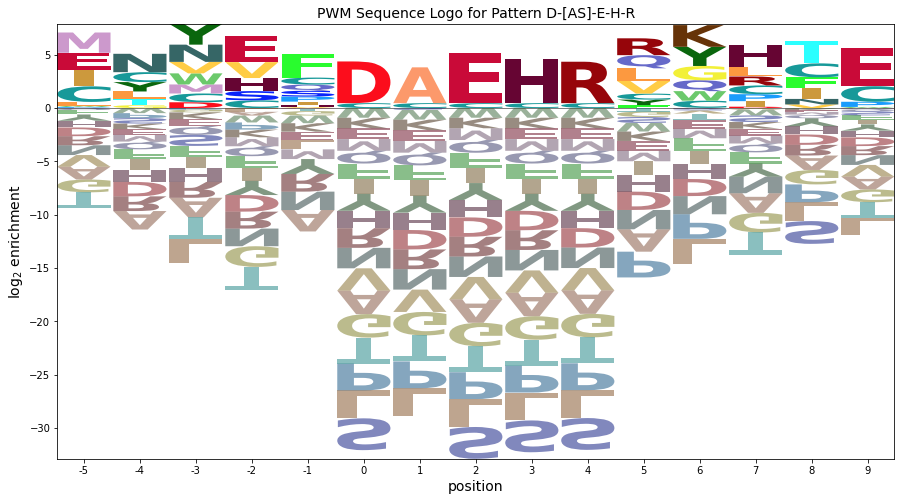

Information Content Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.000000,0.0,0.000000,0.205481,0.000000,0.000000,0.000000,0.308222,0.000000,0.308222,0.308222,0.000000,0.205481,0.000000,0.000000,0.308222,0.000000,0.000000,0.000000,0.000000
1,0.000000,0.0,0.000000,0.000000,0.000000,0.099879,0.000000,0.000000,0.000000,0.199758,0.000000,0.266345,0.066586,0.000000,0.000000,0.099879,0.166465,0.066586,0.000000,0.099879
2,0.000000,0.0,0.113414,0.000000,0.000000,0.075609,0.000000,0.000000,0.000000,0.000000,0.075609,0.302437,0.113414,0.000000,0.000000,0.075609,0.000000,0.226828,0.075609,0.302437
3,0.074670,0.0,0.000000,0.298680,0.000000,0.000000,0.186675,0.000000,0.000000,0.112005,0.000000,0.000000,0.074670,0.000000,0.000000,0.410685,0.000000,0.336015,0.000000,0.000000
4,0.000000,0.0,0.042560,0.000000,0.212798,0.042560,0.042560,0.042560,0.000000,0.042560,0.000000,0.000000,0.127679,0.042560,0.000000,0.191519,0.063840,0.063840,0.000000,0.000000
5,0.000000,0.0,4.348314,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
6,2.975149,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.388063,0.000000,0.000000,0.000000,0.000000
7,0.000000,0.0,0.000000,5.159470,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,4.546334,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


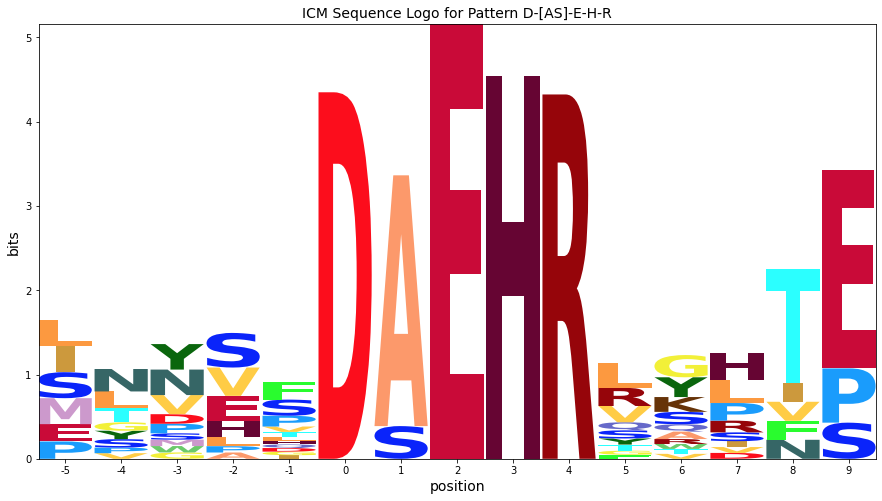

X^2 Critical Value = 39.938849338465694
Chi Square Tests


,index,Position,X^2,p-value,Critical pBH,Critical pBY,AAmax,PWMSmax,AAmin,PWMSmin
0,7,2,1806.4829545454545,0.000000e+00,0.003333,0.001005,E,4.717465475931133,S,-2.9822597720658304
1,8,3,1163.0275114340768,7.591287e-235,0.006667,0.002009,H,4.104329000271422,S,-2.9822597720658313
2,5,0,1007.1961141469338,1.543910e-201,0.010000,0.003014,D,3.90630975412092,S,-2.9822597720658304
3,9,4,988.4341861990814,1.561171e-197,0.013333,0.004018,R,3.8805257283506864,S,-2.9822597720658313
4,6,1,591.7001392387098,2.844851e-113,0.016667,0.005023,A,3.3540173910943287,L,-2.6150587479027623
5,14,9,263.6373108926624,5.294017e-45,0.020000,0.006027,E,3.57450752208909,L,-1.6150587479027632
6,3,-2,98.9727182900147,8.215480e-13,0.023333,0.007032,E,2.4225044286440394,T,-2.1680124495722093
7,13,8,94.0739387891423,6.243818e-12,0.026667,0.008036,T,2.117389769290039,S,-2.1342628655108817
8,11,6,79.68324489020542,2.108606e-09,0.030000,0.009041,K,2.034152165974747,L,-2.399330056847326
9,2,-3,76.24410368373688,8.182387e-09,0.033333,0.010046,Y,1.94214137525501,L,-2.2524886685180556


----------------------------------------------------------------------
r Pattern: D-[AS]-E-x-R-S
Position Probability Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.000000,0.0,0.0,0.000000,0.080000,0.240000,0.000000,0.000000,0.000000,0.080000,0.000000,0.000000,0.000000,0.160000,0.000000,0.000000,0.000000,0.120000,0.320000,0.000000
1,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.296296,0.000000,0.000000,0.074074,0.111111,0.000000,0.296296,0.074074,0.148148,0.000000,0.000000
2,0.187500,0.0,0.0,0.000000,0.125000,0.062500,0.000000,0.062500,0.000000,0.250000,0.062500,0.000000,0.093750,0.000000,0.000000,0.093750,0.000000,0.000000,0.000000,0.062500
3,0.043478,0.0,0.0,0.000000,0.000000,0.434783,0.000000,0.000000,0.000000,0.000000,0.000000,0.239130,0.000000,0.000000,0.000000,0.108696,0.086957,0.086957,0.000000,0.000000
4,0.072727,0.0,0.0,0.036364,0.036364,0.109091,0.036364,0.000000,0.054545,0.036364,0.000000,0.127273,0.200000,0.000000,0.109091,0.000000,0.000000,0.000000,0.000000,0.181818
5,0.000000,0.0,1.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
6,0.581818,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.418182,0.000000,0.000000,0.000000,0.000000
7,0.000000,0.0,0.0,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,0.000000,0.0,0.0,0.000000,0.436364,0.000000,0.072727,0.054545,0.054545,0.000000,0.036364,0.036364,0.000000,0.000000,0.000000,0.072727,0.000000,0.000000,0.036364,0.200000


Position Weight Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,-1.522500,1.137654,-1.143539,-0.332383,0.851661,1.283711,-0.945520,-0.751079,-0.310860,-0.352024,-0.422688,-1.239328,-1.838988,1.807106,-1.169323,-2.304188,-1.752975,0.584234,2.940907,-0.912282
1,-1.585235,1.074918,-1.206275,-0.395119,-0.796037,-1.586380,-1.008255,-0.813815,-0.373595,1.170202,-0.485424,-1.302064,-0.316761,1.422442,-1.232059,0.803001,-0.230748,0.843427,-0.291754,-0.975018
2,1.076269,0.929067,-1.352125,-0.540970,1.380040,-0.147268,-1.154106,0.625297,-0.519446,1.024352,0.953688,-1.447915,-0.047575,-0.723409,-1.377909,-0.512774,-1.961562,-1.624352,-0.437605,0.464094
3,-0.490078,0.585113,-1.696080,-0.884924,-1.285842,2.316132,-1.498061,-1.303620,-0.863401,-2.489528,-0.975229,1.793093,-2.391529,-1.067364,-1.721864,-0.271766,0.016412,0.353621,-0.781559,-1.464823
4,0.062463,0.400688,-1.880504,0.515614,0.114696,0.546745,-0.097523,-1.488045,0.952175,-1.088990,-1.159654,1.023706,1.009009,-1.251788,0.901067,-3.041153,-2.489941,-2.152731,-0.965984,1.810184
5,-2.259465,0.400688,3.926851,-1.069349,-1.470267,-2.260610,-1.682485,-1.488045,-1.047825,-2.673952,-1.159654,-1.976294,-2.575954,-1.251788,-1.906288,-3.041153,-2.489941,-2.152731,-0.965984,-1.649247
6,2.784929,0.400688,-1.880504,-1.069349,-1.470267,-2.260610,-1.682485,-1.488045,-1.047825,-2.673952,-1.159654,-1.976294,-2.575954,-1.251788,-1.906288,1.543809,-2.489941,-2.152731,-0.965984,-1.649247
7,-2.259465,0.400688,-1.880504,4.738006,-1.470267,-2.260610,-1.682485,-1.488045,-1.047825,-2.673952,-1.159654,-1.976294,-2.575954,-1.251788,-1.906288,-3.041153,-2.489941,-2.152731,-0.965984,-1.649247
8,-2.259465,0.400688,-1.880504,-1.069349,3.173589,-2.260610,0.639443,0.511955,0.952175,-2.673952,0.425309,-0.391331,-2.575954,-1.251788,-1.906288,-0.719225,-2.489941,-2.152731,0.618979,1.935715


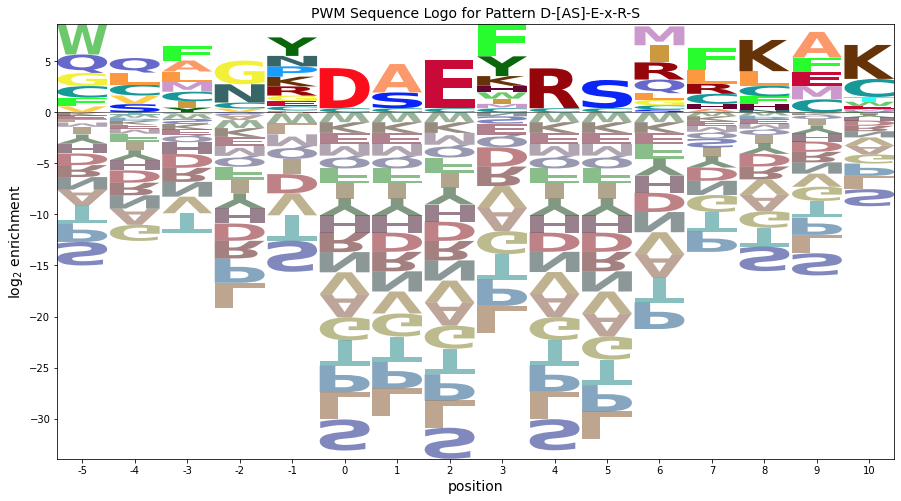

Information Content Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.000000,0.0,0.000000,0.000000,0.175499,0.526497,0.000000,0.000000,0.000000,0.175499,0.000000,0.000000,0.000000,0.350998,0.000000,0.000000,0.000000,0.263248,0.701996,0.000000
1,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.398706,0.000000,0.000000,0.099677,0.149515,0.000000,0.398706,0.099677,0.199353,0.000000,0.000000
2,0.196558,0.0,0.000000,0.000000,0.131038,0.065519,0.000000,0.065519,0.000000,0.262077,0.065519,0.000000,0.098279,0.000000,0.000000,0.098279,0.000000,0.000000,0.000000,0.065519
3,0.076840,0.0,0.000000,0.000000,0.000000,0.768402,0.000000,0.000000,0.000000,0.000000,0.000000,0.422621,0.000000,0.000000,0.000000,0.192101,0.153680,0.153680,0.000000,0.000000
4,0.076261,0.0,0.000000,0.038130,0.038130,0.114391,0.038130,0.000000,0.057196,0.038130,0.000000,0.133457,0.209718,0.000000,0.114391,0.000000,0.000000,0.000000,0.000000,0.190652
5,0.000000,0.0,4.348314,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
6,1.548723,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.113145,0.000000,0.000000,0.000000,0.000000
7,0.000000,0.0,0.000000,5.159470,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,0.000000,0.0,0.000000,0.000000,0.920955,0.000000,0.153493,0.115119,0.115119,0.000000,0.076746,0.076746,0.000000,0.000000,0.000000,0.153493,0.000000,0.000000,0.076746,0.422104


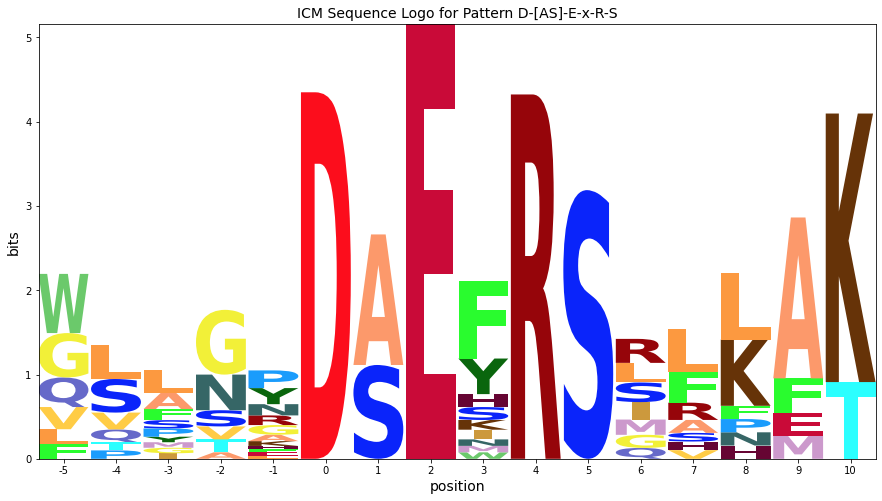

X^2 Critical Value = 40.15223303520055
Chi Square Tests


,index,Position,X^2,p-value,Critical pBH,Critical pBY,AAmax,PWMSmax,AAmin,PWMSmin
0,7,2,1910.7031249999998,0.000000e+00,0.003125,0.000924,E,4.738006254371969,S,-3.0411534611193995
1,5,0,1065.3035822707952,5.989562e-214,0.006250,0.001849,D,3.9268505325617564,S,-3.0411534611193995
2,9,4,1045.4592354028748,1.040543e-209,0.009375,0.002773,R,3.9010665067915227,S,-3.0411534611193995
3,10,5,446.1243889190657,1.064439e-82,0.012500,0.003697,S,2.766201460938204,L,-2.6739524369563314
4,6,1,324.26434201205205,2.076829e-57,0.015625,0.004622,A,2.7849289697215758,L,-2.6739524369563314
5,8,3,307.4653115590908,5.890937e-54,0.018750,0.005546,F,3.173589283342147,L,-2.6739524369563314
6,15,10,194.4433089379702,4.323349e-31,0.021875,0.006470,K,3.323012559176446,S,-1.670315765751091
7,3,-2,157.0601939210034,9.441231e-24,0.025000,0.007395,G,2.3161321776964674,L,-2.4895278658189044
8,13,8,155.25878345842415,2.109641e-23,0.028125,0.008319,K,3.0554626722201585,S,-2.397297271344675
9,14,9,149.9976319246109,2.193870e-22,0.031250,0.009244,A,2.518692131849437,S,-2.169886775241603


----------------------------------------------------------------------
s Pattern: L-D-[AS]-E-x-R
Position Probability Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.081081,0.108108,0.081081,0.000000,0.000000,0.0,0.000000,0.594595,0.000000,0.135135,0.000000,0.000000
1,0.075000,0.0,0.000000,0.075000,0.000000,0.000000,0.000000,0.000000,0.000000,0.175000,0.000000,0.175000,0.300000,0.0,0.100000,0.000000,0.100000,0.000000,0.000000,0.000000
2,0.086957,0.0,0.086957,0.000000,0.000000,0.000000,0.065217,0.000000,0.000000,0.000000,0.152174,0.195652,0.260870,0.0,0.000000,0.086957,0.000000,0.000000,0.000000,0.065217
3,0.078431,0.0,0.000000,0.000000,0.000000,0.196078,0.058824,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.156863,0.333333,0.000000,0.098039,0.000000,0.078431
4,0.120690,0.0,0.000000,0.000000,0.103448,0.000000,0.000000,0.051724,0.000000,0.189655,0.068966,0.000000,0.155172,0.0,0.051724,0.155172,0.051724,0.000000,0.000000,0.051724
5,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
6,0.000000,0.0,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
7,0.775862,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.224138,0.000000,0.000000,0.000000,0.000000
8,0.000000,0.0,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


Position Weight Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,-1.863536,0.796617,-1.484576,-0.673420,-1.074338,-1.864681,-1.286556,-1.092116,1.348104,0.043904,1.236275,-1.580365,-2.180025,-0.855859,-1.510360,1.878337,-2.094012,0.828160,-0.570055,-1.253319
1,0.062463,0.722617,-1.558576,1.252579,-1.148339,-1.938682,-1.360557,-1.166117,-0.725897,0.647976,-0.837725,1.345634,1.446414,-0.929860,0.737568,-2.719225,0.153916,-1.830803,-0.644056,-1.327319
2,0.246888,0.585113,0.625848,-0.884924,-1.285842,-2.076185,0.501939,-1.303620,-0.863401,-2.489528,2.024771,1.530059,1.308911,-1.067364,-1.721864,-0.534801,-2.305516,-1.968307,-0.781559,0.535177
3,0.141535,0.479760,-1.801433,-0.990277,-1.391195,1.277893,0.396586,-1.408973,-0.968754,-2.594881,-1.080582,-1.897222,-2.496882,-1.172717,1.342708,1.207843,-2.410869,0.511303,-0.886912,0.751752
4,0.683951,0.344105,-1.937088,-1.125932,1.280504,-2.317193,-1.739069,0.455372,-1.104409,0.854427,1.105691,-2.032877,0.689391,-1.308372,0.037128,0.224191,-0.546524,-2.209315,-1.022567,0.294169
5,-2.316049,0.344105,-1.937088,-1.125932,-1.526850,-2.317193,-1.739069,-1.544628,-1.104409,3.152107,-1.216237,-2.032877,-2.632537,-1.308372,-1.962872,-3.097737,-2.546524,-2.209315,-1.022567,-1.705831
6,-2.316049,0.344105,3.945555,-1.125932,-1.526850,-2.317193,-1.739069,-1.544628,-1.104409,-2.730536,-1.216237,-2.032877,-2.632537,-1.308372,-1.962872,-3.097737,-2.546524,-2.209315,-1.022567,-1.705831
7,3.207513,0.344105,-1.937088,-1.125932,-1.526850,-2.317193,-1.739069,-1.544628,-1.104409,-2.730536,-1.216237,-2.032877,-2.632537,-1.308372,-1.962872,0.709618,-2.546524,-2.209315,-1.022567,-1.705831
8,-2.316049,0.344105,-1.937088,4.756711,-1.526850,-2.317193,-1.739069,-1.544628,-1.104409,-2.730536,-1.216237,-2.032877,-2.632537,-1.308372,-1.962872,-3.097737,-2.546524,-2.209315,-1.022567,-1.705831


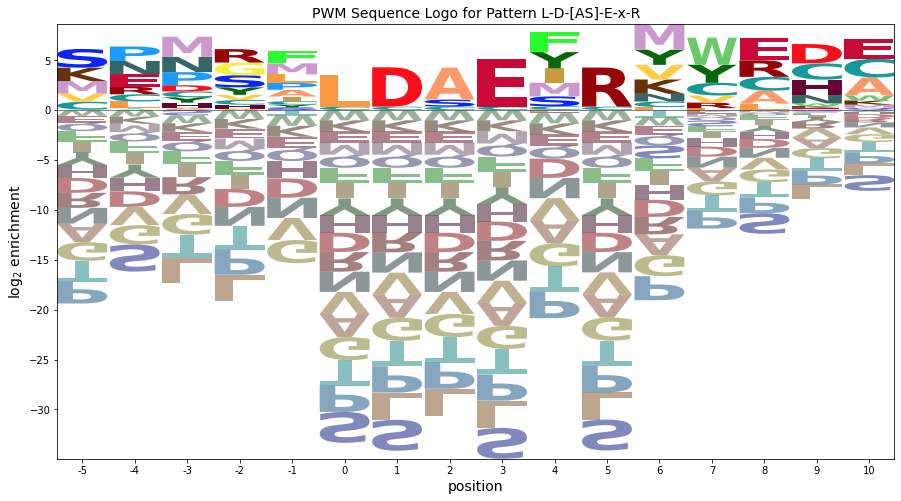

Information Content Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.153301,0.204401,0.153301,0.000000,0.000000,0.0,0.000000,1.124204,0.000000,0.255501,0.000000,0.000000
1,0.099513,0.0,0.000000,0.099513,0.000000,0.000000,0.000000,0.000000,0.000000,0.232196,0.000000,0.232196,0.398050,0.0,0.132683,0.000000,0.132683,0.000000,0.000000,0.000000
2,0.116477,0.0,0.116477,0.000000,0.000000,0.000000,0.087358,0.000000,0.000000,0.000000,0.203836,0.262074,0.349432,0.0,0.000000,0.116477,0.000000,0.000000,0.000000,0.087358
3,0.102183,0.0,0.000000,0.000000,0.000000,0.255459,0.076638,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.204367,0.434279,0.000000,0.127729,0.000000,0.102183
4,0.097711,0.0,0.000000,0.000000,0.083753,0.000000,0.000000,0.041876,0.000000,0.153547,0.055835,0.000000,0.125629,0.0,0.041876,0.125629,0.041876,0.000000,0.000000,0.041876
5,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.554866,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
6,0.000000,0.0,4.348314,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
7,2.348143,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.678353,0.000000,0.000000,0.000000,0.000000
8,0.000000,0.0,0.000000,5.159470,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


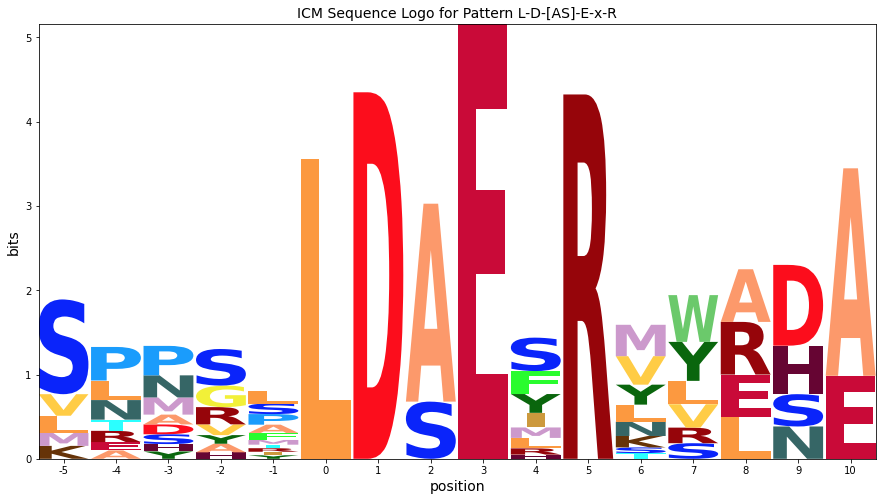

X^2 Critical Value = 40.15223303520055
Chi Square Tests


,index,Position,X^2,p-value,Critical pBH,Critical pBY,AAmax,PWMSmax,AAmin,PWMSmin
0,8,3,2014.9232954545448,0.000000e+00,0.003125,0.000924,E,4.75671085330984,S,-3.097736989485766
1,6,1,1123.4110503946563,2.265745e-226,0.006250,0.001849,D,3.945555131499626,S,-3.097736989485766
2,10,5,1102.4842846066676,6.762594e-222,0.009375,0.002773,R,3.9197711057293927,S,-3.097736989485767
3,5,0,623.6310516359559,5.172717e-120,0.012500,0.003697,L,3.1521070840391423,S,-3.097736989485767
4,7,2,515.4279314528212,3.227104e-97,0.015625,0.004622,A,3.207513278053768,L,-2.730535965322698
5,11,6,133.6446083574503,2.969643e-19,0.018750,0.005546,M,2.5880384064816258,P,-2.4132242832157815
6,9,4,118.9192591428606,1.765728e-16,0.021875,0.006470,F,2.058112065922211,P,-2.6325373116202564
7,0,-5,115.65491138362364,7.161095e-16,0.025000,0.007395,S,1.878337171268752,P,-2.1800251069227508
8,12,7,91.09611325610841,2.119798e-11,0.028125,0.008319,W,2.7126377989468575,P,-1.7046870973760924
9,2,-3,87.65185803197856,8.622182e-11,0.031250,0.009244,M,2.024770976859789,L,-2.4895278658189044


----------------------------------------------------------------------
t Pattern: P-x-D-[AS]-E-x-R
Position Probability Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000
1,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.173913,0.173913,0.000000,0.130435,0.000000,0.000000,0.000000,0.000000,0.000000,0.304348,0.000000,0.217391,0.000000,0.000000
2,0.068966,0.000000,0.000000,0.068966,0.000000,0.000000,0.000000,0.000000,0.000000,0.137931,0.000000,0.000000,0.241379,0.103448,0.068966,0.137931,0.068966,0.103448,0.000000,0.000000
3,0.088889,0.000000,0.000000,0.000000,0.000000,0.044444,0.066667,0.044444,0.000000,0.133333,0.066667,0.000000,0.111111,0.000000,0.044444,0.088889,0.088889,0.044444,0.000000,0.177778
4,0.125000,0.000000,0.000000,0.000000,0.142857,0.035714,0.000000,0.000000,0.000000,0.107143,0.035714,0.000000,0.000000,0.000000,0.160714,0.196429,0.035714,0.000000,0.000000,0.160714
5,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
6,0.000000,0.000000,0.035714,0.285714,0.000000,0.000000,0.000000,0.035714,0.000000,0.160714,0.035714,0.035714,0.107143,0.035714,0.000000,0.035714,0.035714,0.000000,0.196429,0.000000
7,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,0.714286,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.285714,0.000000,0.000000,0.000000,0.000000


Position Weight Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,-0.490078,2.170076,-0.111117,0.700038,0.299120,-0.491223,0.086902,0.281342,0.721562,-0.904565,0.609733,-0.206907,-0.806567,0.517599,-0.136901,0.313196,-0.720553,-0.383344,0.803403,0.120140
1,-1.456911,1.203242,-1.077950,-0.266795,-0.667713,-1.458056,1.441997,1.636437,-0.245271,0.128601,-0.357100,-1.173740,-1.773400,-0.449234,-1.103734,0.761400,-1.687387,1.234785,-0.163430,-0.846693
2,-0.060394,1.014797,-1.266396,1.129723,-0.856158,-1.646501,-1.068376,-0.873936,-0.433716,0.262085,-0.545545,-1.362185,1.038155,1.362321,0.292783,-0.105117,-0.290869,0.461378,-0.351875,-1.035139
3,0.268914,0.607139,-1.674054,-0.862898,-1.263816,-0.469196,0.523966,0.303369,-0.841374,0.339853,1.046797,-1.769843,0.215460,-1.045337,-0.114875,-0.512774,0.038438,-0.361318,-0.759533,1.727128
4,0.721426,0.381580,-1.899613,-1.088457,1.680549,-0.694756,-1.701594,-1.507153,-1.066934,0.114294,0.406200,-1.995403,-2.595063,-1.270897,1.396531,0.524700,-0.924087,-2.171840,-0.985093,1.653572
5,-2.278574,0.381580,-1.899613,-1.088457,-1.489376,-2.279719,-1.701594,-1.507153,-1.066934,-2.693061,-1.178762,-1.995403,3.237827,-1.270897,-1.925397,-3.060262,-2.509049,-2.171840,-0.985093,-1.668356
6,-2.278574,0.381580,-0.314651,2.999005,-1.489376,-2.279719,-1.701594,0.077809,-1.066934,0.628867,0.406200,-0.410440,0.212292,0.314066,-1.925397,-1.475300,-0.924087,-2.171840,2.599870,-1.668356
7,-2.278574,0.381580,3.933277,-1.088457,-1.489376,-2.279719,-1.701594,-1.507153,-1.066934,-2.693061,-1.178762,-1.995403,-2.595063,-1.270897,-1.925397,-3.060262,-2.509049,-2.171840,-0.985093,-1.668356
8,3.078978,0.381580,-1.899613,-1.088457,-1.489376,-2.279719,-1.701594,-1.507153,-1.066934,-2.693061,-1.178762,-1.995403,-2.595063,-1.270897,-1.925397,1.027201,-2.509049,-2.171840,-0.985093,-1.668356


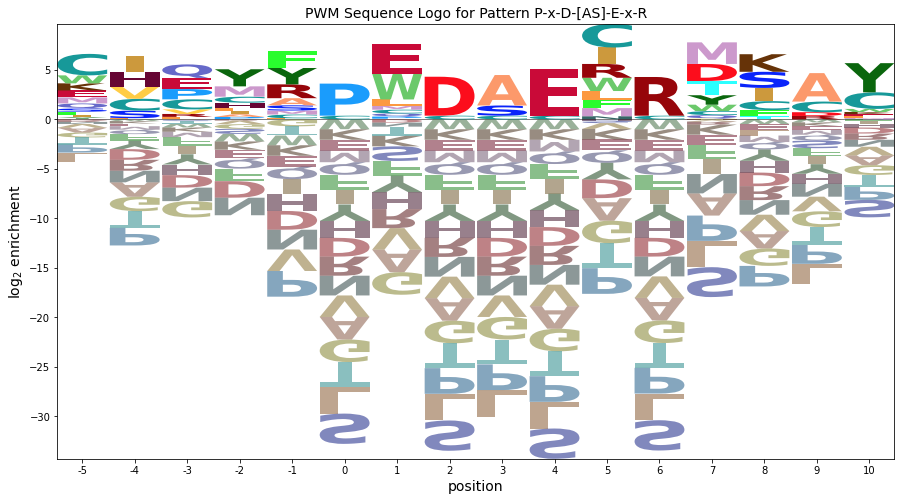

Information Content Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.187665,0.000000,0.000000,0.000000,0.000000
1,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.290973,0.290973,0.000000,0.218230,0.000000,0.000000,0.000000,0.000000,0.000000,0.509203,0.000000,0.363717,0.000000,0.000000
2,0.062687,0.000000,0.000000,0.062687,0.000000,0.000000,0.000000,0.000000,0.000000,0.125374,0.000000,0.000000,0.219404,0.094030,0.062687,0.125374,0.062687,0.094030,0.000000,0.000000
3,0.056042,0.000000,0.000000,0.000000,0.000000,0.028021,0.042031,0.028021,0.000000,0.084063,0.042031,0.000000,0.070052,0.000000,0.028021,0.056042,0.056042,0.028021,0.000000,0.112084
4,0.140582,0.000000,0.000000,0.000000,0.160665,0.040166,0.000000,0.000000,0.000000,0.120499,0.040166,0.000000,0.000000,0.000000,0.180748,0.220914,0.040166,0.000000,0.000000,0.180748
5,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.652865,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
6,0.000000,0.000000,0.057311,0.458487,0.000000,0.000000,0.000000,0.057311,0.000000,0.257899,0.057311,0.057311,0.171932,0.057311,0.000000,0.057311,0.057311,0.000000,0.315210,0.000000
7,0.000000,0.000000,4.348314,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,2.059210,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.823684,0.000000,0.000000,0.000000,0.000000


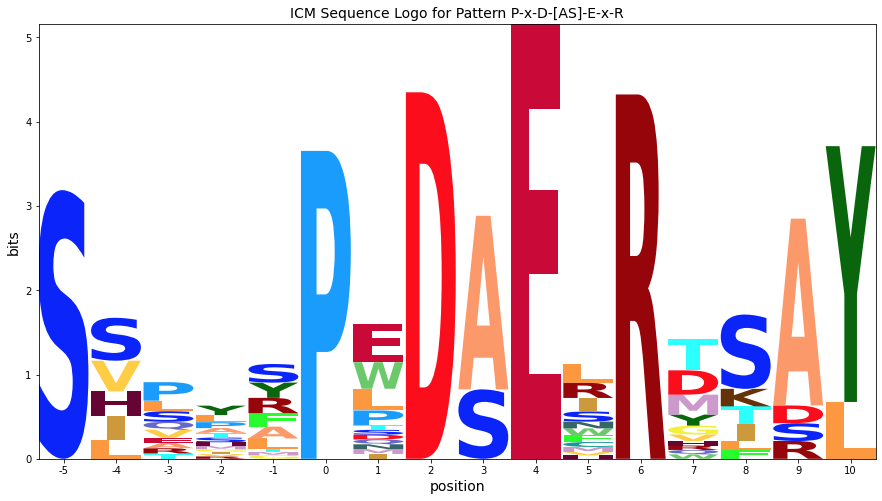

X^2 Critical Value = 40.15223303520055
Chi Square Tests


,index,Position,X^2,p-value,Critical pBH,Critical pBY,AAmax,PWMSmax,AAmin,PWMSmin
0,9,4,1945.4431818181815,0.000000e+00,0.003125,0.000924,E,4.744432523531401,S,-3.060262284067105
1,7,2,1084.6727383120829,4.343366e-218,0.006250,0.001849,D,3.9332768017211874,S,-3.060262284067105
2,11,6,1064.4675851374725,9.037265e-214,0.009375,0.002773,R,3.9074927759509555,S,-3.0602622840671043
3,5,0,648.3847326717824,3.032193e-125,0.012500,0.003697,P,3.2378274079631475,S,-3.060262284067105
4,8,3,433.18630921711207,5.351282e-80,0.015625,0.004622,A,3.0789780320334996,L,-2.693061259904037
5,14,9,236.17218821304957,1.927877e-39,0.018750,0.005546,A,2.8741963078186616,L,-1.9997225981380895
6,6,1,226.4061660109765,1.783515e-37,0.021875,0.006470,E,2.999005350617,G,-2.2797186391674247
7,15,10,169.3416421806392,3.822793e-26,0.025000,0.007395,Y,2.9473030803707894,S,-1.766531081010394
8,12,7,117.36656296950802,3.439453e-16,0.028125,0.008319,M,2.1816398254766547,S,-3.0217881362524692
9,13,8,88.52459205892683,6.049434e-11,0.031250,0.009244,K,1.7750011946281812,P,-2.0750555473212082


----------------------------------------------------------------------
u Pattern: D-[AS]-E-W-R
Position Probability Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.222222,0.000000,0.000000,0.000000,0.222222,0.000000,0.000000,0.000000,0.222222,0.000000,0.333333,0.000000,0.000000,0.000000
1,0.062500,0.0,0.000000,0.187500,0.000000,0.000000,0.062500,0.062500,0.000000,0.062500,0.000000,0.250000,0.000000,0.000000,0.062500,0.000000,0.062500,0.000000,0.000000,0.187500
2,0.111111,0.0,0.000000,0.000000,0.111111,0.000000,0.288889,0.000000,0.000000,0.000000,0.000000,0.044444,0.133333,0.000000,0.155556,0.000000,0.044444,0.111111,0.000000,0.000000
3,0.000000,0.0,0.000000,0.000000,0.163265,0.102041,0.040816,0.000000,0.000000,0.244898,0.000000,0.000000,0.081633,0.000000,0.122449,0.204082,0.040816,0.000000,0.000000,0.000000
4,0.092593,0.0,0.000000,0.000000,0.000000,0.259259,0.000000,0.000000,0.000000,0.000000,0.129630,0.129630,0.000000,0.000000,0.000000,0.074074,0.148148,0.000000,0.092593,0.074074
5,0.000000,0.0,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
6,0.700000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.300000,0.000000,0.000000,0.000000,0.000000
7,0.000000,0.0,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000


Position Weight Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,-0.888627,1.771526,-0.509667,0.301489,-0.099429,-0.889772,1.273315,-0.117207,0.323013,-1.303115,1.796147,-0.605456,-1.205116,0.119050,1.049512,-1.670316,0.880897,-0.781894,0.404854,-0.278410
1,-0.146124,0.929067,-1.352125,2.266385,-0.941888,-1.732231,0.430856,0.625297,-0.519446,-0.560611,-0.631275,1.722010,-2.047575,-0.723409,0.207053,-2.512774,-0.376599,-1.624352,-0.437605,1.686486
2,0.531948,0.607139,-1.674054,-0.862898,1.321146,-2.054159,2.331321,-1.281594,-0.841374,-2.467502,-0.953203,-0.184881,0.437852,-1.045337,1.300162,-2.834703,-0.698527,0.638682,-0.759533,-1.442797
3,-2.139171,0.520983,-1.760210,-0.949054,1.819952,0.444647,0.022772,-1.367750,-0.927531,1.146782,-1.039359,-1.856000,-0.133731,-1.131494,1.021361,0.538572,-0.784684,-2.032437,-0.845690,-1.528953
4,0.344863,0.420054,-1.861139,-1.049983,-1.450902,1.665646,-1.663120,-1.468679,-1.028460,-2.654587,1.859712,1.043071,-2.556588,-1.232423,-1.886923,-0.699860,0.699350,-2.133366,1.638344,0.692046
5,-2.352575,0.307579,3.957124,-1.162458,-1.563376,-2.353719,-1.775595,-1.581154,-1.140935,-2.767062,-1.252763,-2.069403,-2.669063,-1.344898,-1.999398,-3.134263,-2.583050,-2.245841,-1.059093,-1.742357
6,3.073690,0.307579,-1.973614,-1.162458,-1.563376,-2.353719,-1.775595,-1.581154,-1.140935,-2.767062,-1.252763,-2.069403,-2.669063,-1.344898,-1.999398,1.113665,-2.583050,-2.245841,-1.059093,-1.742357
7,-2.352575,0.307579,-1.973614,4.768279,-1.563376,-2.353719,-1.775595,-1.581154,-1.140935,-2.767062,-1.252763,-2.069403,-2.669063,-1.344898,-1.999398,-3.134263,-2.583050,-2.245841,-1.059093,-1.742357
8,-2.352575,0.307579,-1.973614,-1.162458,-1.563376,-2.353719,-1.775595,-1.581154,-1.140935,-2.767062,-1.252763,-2.069403,-2.669063,-1.344898,-1.999398,-3.134263,-2.583050,-2.245841,4.871644,-1.742357


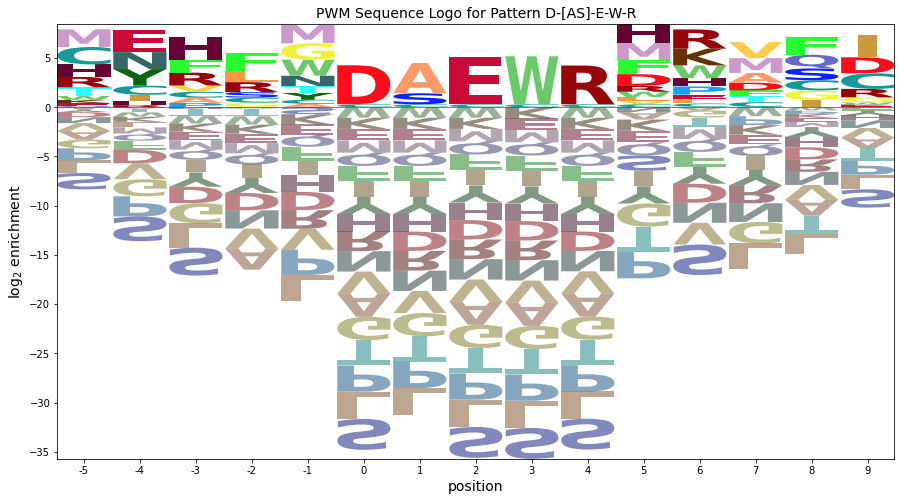

Information Content Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.526377,0.000000,0.00000,0.000000,0.526377,0.000000,0.000000,0.000000,0.526377,0.000000,0.789565,0.000000,0.000000,0.000000
1,0.096132,0.0,0.000000,0.288395,0.000000,0.000000,0.096132,0.096132,0.00000,0.096132,0.000000,0.384527,0.000000,0.000000,0.096132,0.000000,0.096132,0.000000,0.000000,0.288395
2,0.163562,0.0,0.000000,0.000000,0.163562,0.000000,0.425261,0.000000,0.00000,0.000000,0.000000,0.065425,0.196274,0.000000,0.228986,0.000000,0.065425,0.163562,0.000000,0.000000
3,0.000000,0.0,0.000000,0.000000,0.179255,0.112035,0.044814,0.000000,0.00000,0.268883,0.000000,0.000000,0.089628,0.000000,0.134442,0.224069,0.044814,0.000000,0.000000,0.000000
4,0.125187,0.0,0.000000,0.000000,0.000000,0.350523,0.000000,0.000000,0.00000,0.000000,0.175262,0.175262,0.000000,0.000000,0.000000,0.100149,0.200299,0.000000,0.125187,0.100149
5,0.000000,0.0,4.348314,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
6,1.997489,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.856067,0.000000,0.000000,0.000000,0.000000
7,0.000000,0.0,0.000000,5.159470,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.262835,0.000000


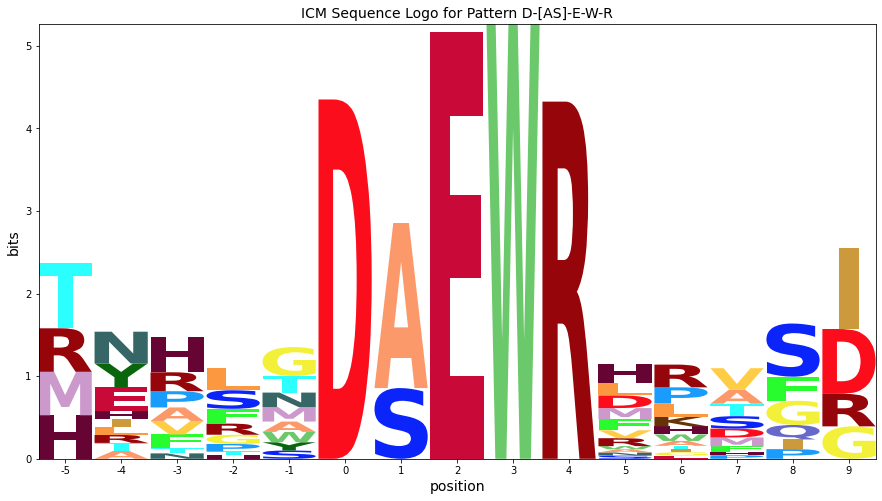

X^2 Critical Value = 39.938849338465694
Chi Square Tests


,index,Position,X^2,p-value,Critical pBH,Critical pBY,AAmax,PWMSmax,AAmin,PWMSmin
0,7,2,2084.403409090909,0.000000e+00,0.003333,0.001005,E,4.768279265485771,S,-3.13426286551088
1,8,3,2243.6813794682025,0.000000e+00,0.006667,0.002009,W,4.871644124182861,S,-3.1342628655108817
2,5,0,1162.1493624772313,1.170091e-234,0.010000,0.003014,D,3.957123543675557,S,-3.13426286551088
3,9,4,1140.5009840758635,5.009723e-230,0.013333,0.004018,R,3.9313395179053234,S,-3.134262865510881
4,6,1,449.71421354236594,1.892561e-83,0.016667,0.005023,A,3.073690200673739,L,-2.767061841347812
5,2,-3,110.59300627875696,6.197711e-15,0.020000,0.006027,H,2.331320656179684,S,-2.8347025836519735
6,4,-1,101.20186354554012,3.242847e-13,0.023333,0.007032,M,1.859711730589293,L,-2.6545871120894002
7,10,5,100.71037698695629,3.981856e-13,0.026667,0.008036,H,1.9248451704042644,P,-2.6690631876453703
8,11,6,96.18873514999397,2.608030e-12,0.030000,0.009041,R,1.9440186519760703,S,-3.097736989485767
9,1,-4,87.08793966190237,1.083623e-10,0.033333,0.010046,E,2.2663852267267575,S,-2.5127744887646117


----------------------------------------------------------------------
v Pattern: D-[AS]-E-x-R-L
Position Probability Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.058824,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.352941,0.058824,0.137255,0.333333,0.000000,0.058824,0.000000,0.000000,0.000000,0.000000,0.000000
1,0.263158,0.0,0.000000,0.105263,0.000000,0.052632,0.315789,0.000000,0.000000,0.000000,0.035088,0.000000,0.140351,0.087719,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2,0.000000,0.0,0.000000,0.000000,0.000000,0.035088,0.105263,0.263158,0.000000,0.000000,0.000000,0.087719,0.315789,0.000000,0.000000,0.140351,0.000000,0.052632,0.000000,0.000000
3,0.112903,0.0,0.000000,0.000000,0.048387,0.000000,0.290323,0.000000,0.000000,0.032258,0.000000,0.000000,0.000000,0.000000,0.048387,0.177419,0.000000,0.000000,0.000000,0.290323
4,0.194805,0.0,0.000000,0.038961,0.025974,0.000000,0.025974,0.000000,0.000000,0.077922,0.038961,0.090909,0.000000,0.000000,0.000000,0.259740,0.142857,0.103896,0.000000,0.000000
5,0.000000,0.0,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
6,0.813953,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.186047,0.000000,0.000000,0.000000,0.000000
7,0.000000,0.0,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,0.000000,0.0,0.000000,0.000000,0.034884,0.000000,0.139535,0.000000,0.000000,0.174419,0.000000,0.000000,0.000000,0.000000,0.174419,0.000000,0.023256,0.000000,0.093023,0.360465


Position Weight Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,-0.180394,0.479760,-1.801433,-0.990277,-1.391195,-2.181538,-1.603414,-1.408973,-0.968754,1.653047,0.919418,1.102778,1.673043,-1.172717,0.172783,-2.962082,-2.410869,-2.073660,-0.886912,-1.570176
1,1.702567,0.362721,-1.918472,1.700038,-1.508235,-0.298578,2.527475,-1.526012,-1.085793,-2.711920,0.387341,-2.014262,0.556003,1.295206,-1.944256,-3.079121,-2.527908,-2.190699,-1.003952,-1.687215
2,-2.297433,0.362721,-1.918472,-1.107317,-1.508235,-0.713615,1.086902,2.473988,-1.085793,-2.711920,-1.197621,0.570701,1.634006,-1.289756,-1.944256,0.090804,-2.527908,-0.190699,-1.003952,-1.687215
3,0.611802,0.271955,-2.009238,-1.198082,0.401000,-2.389343,2.436709,-1.616778,-1.176558,-1.217723,-1.288387,-2.105027,-2.704687,-1.380521,-0.035022,0.415076,-2.618674,-2.281465,-1.094717,2.469947
4,1.369441,0.029594,-2.251599,0.559557,-0.256399,-2.631704,-0.468617,-1.859139,-1.418919,-0.237692,0.469252,0.652612,-2.947048,-1.622882,-2.277383,0.980070,0.723928,0.646100,-1.337078,-2.020342
5,-2.758567,-0.098413,4.063337,-1.568450,-1.969369,-2.759712,-2.181587,-1.987146,-1.546927,-3.173054,-1.658755,-2.475396,-3.075056,-1.750890,-2.405390,-3.540255,-2.989042,-2.651833,-1.465086,-2.148349
6,3.391180,-0.098413,-2.379606,-1.568450,-1.969369,-2.759712,-2.181587,-1.987146,-1.546927,-3.173054,-1.658755,-2.475396,-3.075056,-1.750890,-2.405390,0.547208,-2.989042,-2.651833,-1.465086,-2.148349
7,-2.758567,-0.098413,-2.379606,4.874493,-1.969369,-2.759712,-2.181587,-1.987146,-1.546927,-3.173054,-1.658755,-2.475396,-3.075056,-1.750890,-2.405390,-3.540255,-2.989042,-2.651833,-1.465086,-2.148349
8,-2.758567,-0.098413,-2.379606,-1.568450,0.030631,-2.759712,1.518853,-1.987146,-1.546927,0.826946,-1.658755,-2.475396,-3.075056,-1.750890,1.594610,-3.540255,-1.404080,-2.651833,1.704839,2.851651


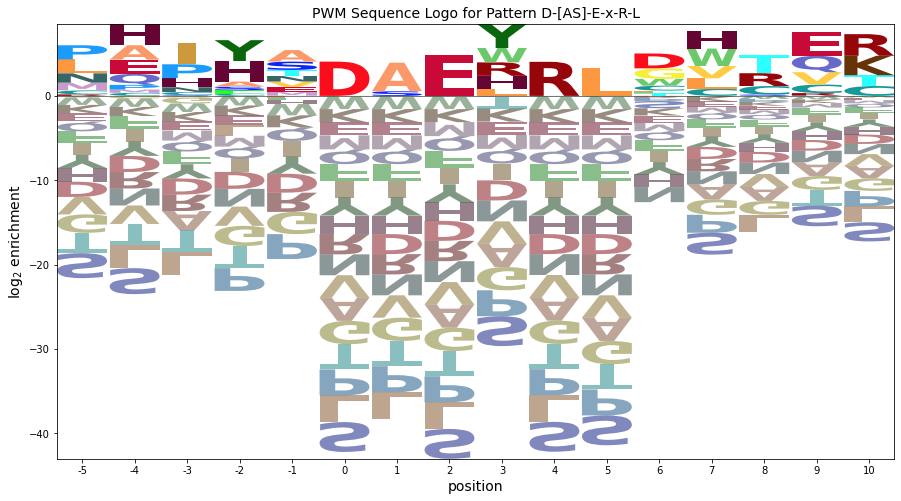

Information Content Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.098160,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.588963,0.098160,0.229041,0.556242,0.000000,0.098160,0.000000,0.000000,0.000000,0.000000,0.000000
1,0.496508,0.0,0.000000,0.198603,0.000000,0.099302,0.595810,0.000000,0.000000,0.000000,0.066201,0.000000,0.264805,0.165503,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2,0.000000,0.0,0.000000,0.000000,0.000000,0.055483,0.166448,0.416119,0.000000,0.000000,0.000000,0.138706,0.499343,0.000000,0.000000,0.221930,0.000000,0.083224,0.000000,0.000000
3,0.203301,0.0,0.000000,0.000000,0.087129,0.000000,0.522774,0.000000,0.000000,0.058086,0.000000,0.000000,0.000000,0.000000,0.087129,0.319473,0.000000,0.000000,0.000000,0.522774
4,0.178732,0.0,0.000000,0.035746,0.023831,0.000000,0.023831,0.000000,0.000000,0.071493,0.035746,0.083408,0.000000,0.000000,0.000000,0.238309,0.131070,0.095324,0.000000,0.000000
5,0.000000,0.0,4.348314,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
6,2.548322,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.582474,0.000000,0.000000,0.000000,0.000000
7,0.000000,0.0,0.000000,5.159470,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,0.000000,0.0,0.000000,0.000000,0.069136,0.000000,0.276542,0.000000,0.000000,0.345678,0.000000,0.000000,0.000000,0.000000,0.345678,0.000000,0.046090,0.000000,0.184362,0.714401


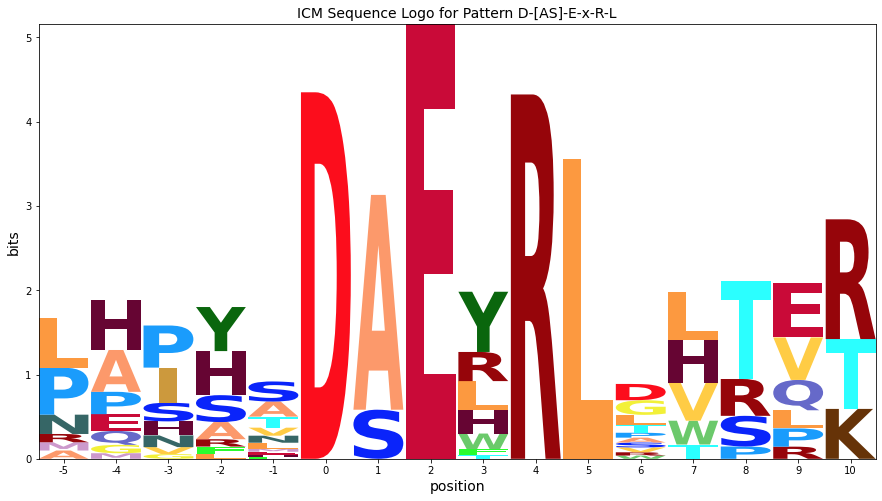

X^2 Critical Value = 40.15223303520055
Chi Square Tests


,index,Position,X^2,p-value,Critical pBH,Critical pBY,AAmax,PWMSmax,AAmin,PWMSmin
0,5,0,1665.7474195506984,0.000000e+00,0.003125,0.000924,D,4.063337342285561,S,-3.5402552251867188
1,7,2,2987.6448863636356,0.000000e+00,0.006250,0.001849,E,4.874493064095775,S,-3.5402552251867188
2,9,4,1634.7180771754045,0.000000e+00,0.009375,0.002773,R,4.037553316515329,S,-3.5402552251867188
3,10,5,924.6943179429694,6.149467e-184,0.012500,0.003697,L,3.269889294825078,S,-3.5402552251867188
4,6,1,833.5890453152522,1.549135e-164,0.015625,0.004622,A,3.3911802058004854,L,-3.1730542010236498
5,8,3,335.43120767496686,1.039308e-59,0.018750,0.005546,Y,2.851650841307103,S,-3.5402552251867188
6,3,-2,222.8104753429063,9.408740e-37,0.021875,0.006470,Y,2.4699468046958035,P,-2.7046870973760924
7,1,-4,192.9834053279611,8.420170e-31,0.025000,0.007395,H,2.5274745198992186,S,-3.07912131131842
8,15,10,161.09724410685908,1.551679e-24,0.028125,0.008319,R,2.5635383747335942,S,-2.2717663892608164
9,2,-3,157.14820589553946,9.077295e-24,0.031250,0.009244,I,2.473987532513294,L,-2.711920287155352


----------------------------------------------------------------------
w Pattern: S-D-[AS]-E-x-R
Position Probability Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.057143,0.428571,0.00000,0.000000,0.200000,0.000000,0.085714,0.057143,0.000000,0.085714,0.000000,0.000000,0.085714,0.000000
1,0.000000,0.0,0.000000,0.000000,0.000000,0.159091,0.000000,0.000000,0.00000,0.136364,0.113636,0.000000,0.340909,0.000000,0.000000,0.204545,0.045455,0.000000,0.000000,0.000000
2,0.369565,0.0,0.000000,0.000000,0.043478,0.065217,0.000000,0.043478,0.00000,0.000000,0.152174,0.000000,0.000000,0.000000,0.043478,0.065217,0.086957,0.000000,0.000000,0.130435
3,0.000000,0.0,0.065217,0.000000,0.000000,0.000000,0.043478,0.326087,0.00000,0.000000,0.000000,0.043478,0.152174,0.000000,0.152174,0.000000,0.108696,0.043478,0.000000,0.065217
4,0.000000,0.0,0.098039,0.000000,0.000000,0.000000,0.058824,0.000000,0.00000,0.098039,0.000000,0.000000,0.039216,0.000000,0.000000,0.156863,0.039216,0.000000,0.000000,0.509804
5,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000
6,0.000000,0.0,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
7,0.784615,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.215385,0.000000,0.000000,0.000000,0.000000
8,0.000000,0.0,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


Position Weight Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,-1.812006,0.848147,-1.433045,-0.621890,-1.022808,-1.813151,0.349936,2.959414,-0.600366,-2.226493,2.287805,-1.528835,-0.128495,0.780633,-1.458829,-0.593694,-2.042482,-1.705272,1.481475,-1.201788
1,-2.030646,0.629507,-1.651686,-0.840530,-1.241448,0.968209,-1.453666,-1.259226,-0.819006,0.362221,1.654128,-1.747475,1.652865,-1.022969,-1.677470,0.509593,-0.676159,-1.923913,-0.737165,-1.420429
2,2.094884,0.585113,-1.696080,-0.884924,0.299120,-0.076185,-1.498061,0.281342,-0.863401,-2.489528,2.024771,-1.791869,-2.391529,-1.067364,-0.136901,-0.856729,0.016412,-1.968307,-0.781559,1.342532
3,-2.075041,0.585113,0.303920,-0.884924,-1.285842,-2.076185,0.086902,2.696380,-0.863401,-2.489528,-0.975229,-0.206907,0.608471,-1.067364,1.278136,-2.856729,0.279447,-0.383344,-0.781559,0.535177
4,-2.180394,0.479760,0.783530,-0.990277,-1.391195,-2.181538,0.396586,-1.408973,-0.968754,-0.009918,-1.080582,-1.897222,-0.911920,-1.172717,-1.827217,0.207843,-0.825906,-2.073660,-0.886912,3.184712
5,-2.440037,0.220116,-2.061077,-1.249921,-1.650839,-2.441182,-1.863057,-1.668617,-1.228397,-2.854525,-1.340226,-2.156866,-2.756526,-1.432360,-2.086861,2.822668,-2.670513,-2.333304,-1.146556,-1.829820
6,-2.440037,0.220116,3.983317,-1.249921,-1.650839,-2.441182,-1.863057,-1.668617,-1.228397,-2.854525,-1.340226,-2.156866,-2.756526,-1.432360,-2.086861,-3.221726,-2.670513,-2.333304,-1.146556,-1.829820
7,3.260402,0.220116,-2.061077,-1.249921,-1.650839,-2.441182,-1.863057,-1.668617,-1.228397,-2.854525,-1.340226,-2.156866,-2.756526,-1.432360,-2.086861,0.685165,-2.670513,-2.333304,-1.146556,-1.829820
8,-2.440037,0.220116,-2.061077,4.794473,-1.650839,-2.441182,-1.863057,-1.668617,-1.228397,-2.854525,-1.340226,-2.156866,-2.756526,-1.432360,-2.086861,-3.221726,-2.670513,-2.333304,-1.146556,-1.829820


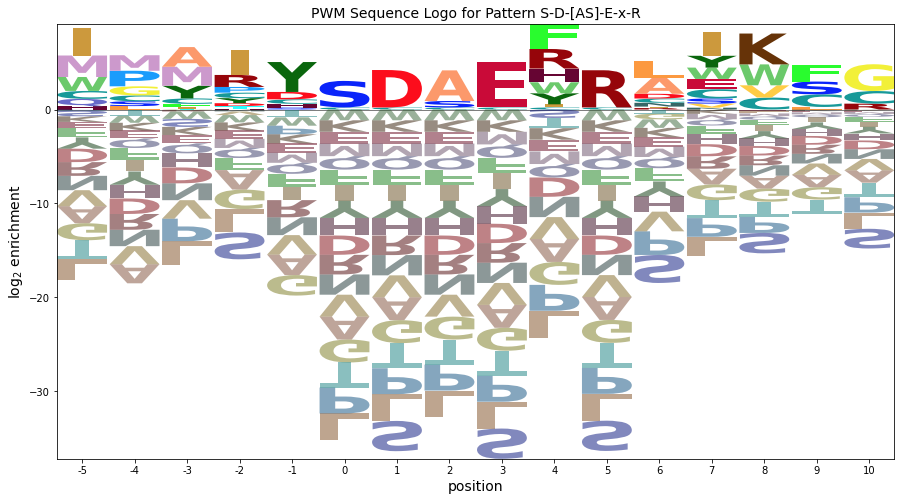

Information Content Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.128893,0.966700,0.000000,0.000000,0.451127,0.000000,0.193340,0.128893,0.000000,0.193340,0.000000,0.000000,0.193340,0.000000
1,0.000000,0.0,0.000000,0.000000,0.000000,0.220922,0.000000,0.000000,0.000000,0.189362,0.157802,0.000000,0.473405,0.000000,0.000000,0.284043,0.063121,0.000000,0.000000,0.000000
2,0.550986,0.0,0.000000,0.000000,0.064822,0.097233,0.000000,0.064822,0.000000,0.000000,0.226876,0.000000,0.000000,0.000000,0.064822,0.097233,0.129644,0.000000,0.000000,0.194465
3,0.000000,0.0,0.097981,0.000000,0.000000,0.000000,0.065321,0.489905,0.000000,0.000000,0.000000,0.065321,0.228622,0.000000,0.228622,0.000000,0.163302,0.065321,0.000000,0.097981
4,0.000000,0.0,0.194926,0.000000,0.000000,0.000000,0.116956,0.000000,0.000000,0.194926,0.000000,0.000000,0.077970,0.000000,0.000000,0.311882,0.077970,0.000000,0.000000,1.013615
5,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.187665,0.000000,0.000000,0.000000,0.000000
6,0.000000,0.0,4.348314,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
7,2.392559,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.656781,0.000000,0.000000,0.000000,0.000000
8,0.000000,0.0,0.000000,5.159470,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


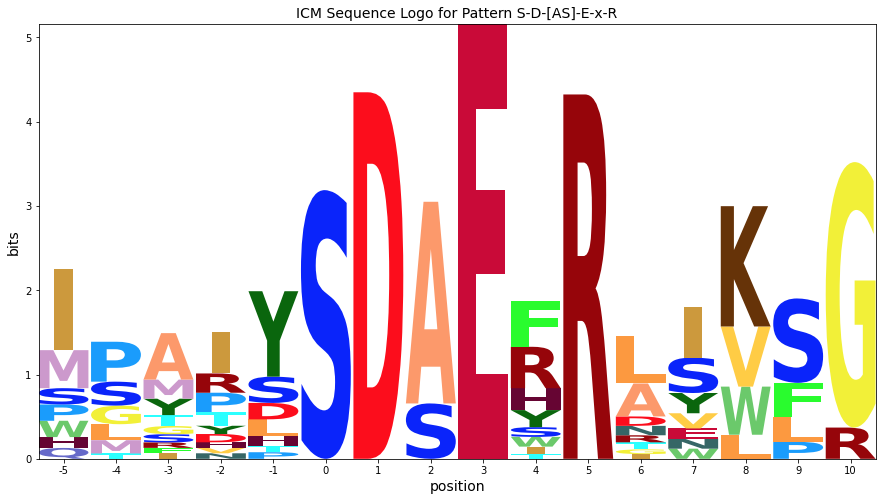

X^2 Critical Value = 40.15223303520055
Chi Square Tests


,index,Position,X^2,p-value,Critical pBH,Critical pBY,AAmax,PWMSmax,AAmin,PWMSmin
0,8,3,2258.103693181817,0.000000e+00,0.003125,0.000924,E,4.7944732060309985,S,-3.22172570676122
1,6,1,1258.9951426836676,2.154813e-255,0.006250,0.001849,D,3.983317484220785,S,-3.22172570676122
2,10,5,1235.5427327488521,2.273708e-250,0.009375,0.002773,R,3.9575334584505515,S,-3.221725706761221
3,7,2,589.2633890384525,9.289922e-113,0.012500,0.003697,A,3.2604023228623937,L,-2.854524682598152
4,5,0,527.2379141770778,1.065633e-99,0.015625,0.004622,S,2.822668412597233,L,-2.8545246825981527
5,4,-1,299.26780686127114,2.826048e-52,0.018750,0.005546,Y,3.184711678529089,G,-2.181538245228521
6,9,4,237.65520902561337,9.681601e-40,0.021875,0.006470,F,2.671088942812964,L,-2.8545246825981527
7,15,10,223.27651196727905,7.585300e-37,0.025000,0.007395,G,2.852731656856224,S,-2.097736989485768
8,0,-5,205.60183970690724,2.609544e-33,0.028125,0.008319,I,2.959414359683535,L,-2.226493459985111
9,13,8,203.31962377791808,7.436454e-33,0.031250,0.009244,K,3.2828731683232313,S,-2.169886775241603


----------------------------------------------------------------------
x Pattern: L-x-D-[AS]-E-x-R
Position Probability Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.000000,0.0,0.000000,0.666667,0.333333,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,0.148148,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.370370,0.370370,0.000000,0.111111,0.000000,0.000000
2,0.000000,0.0,0.000000,0.000000,0.275862,0.000000,0.000000,0.000000,0.0,0.206897,0.000000,0.000000,0.310345,0.000000,0.000000,0.206897,0.000000,0.000000,0.000000,0.000000
3,0.000000,0.0,0.115385,0.000000,0.038462,0.000000,0.000000,0.153846,0.0,0.192308,0.173077,0.096154,0.000000,0.000000,0.000000,0.096154,0.000000,0.057692,0.000000,0.076923
4,0.000000,0.0,0.045455,0.000000,0.075758,0.257576,0.136364,0.000000,0.0,0.000000,0.000000,0.045455,0.181818,0.030303,0.030303,0.136364,0.000000,0.000000,0.000000,0.060606
5,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
6,0.045455,0.0,0.000000,0.000000,0.121212,0.060606,0.030303,0.000000,0.0,0.166667,0.075758,0.363636,0.000000,0.000000,0.000000,0.075758,0.030303,0.000000,0.030303,0.000000
7,0.000000,0.0,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,0.712121,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.287879,0.000000,0.000000,0.000000,0.000000


Position Weight Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,-1.030646,1.629507,-0.651686,3.329395,2.080480,-1.031791,-0.453666,-0.259226,0.180994,-1.445134,0.069165,-0.747475,-1.347135,-0.022969,-0.677470,-1.812335,-1.261122,-0.923913,0.262835,-0.420429
1,0.736693,1.074918,-1.206275,-0.395119,-0.796037,-1.586380,-1.008255,-0.813815,-0.373595,-1.999723,-0.485424,-1.302064,-1.901724,-0.577558,2.227373,1.092508,-1.815711,0.521499,-0.291754,-0.975018
2,-1.645356,1.014797,-1.266396,-0.455240,2.313767,-1.646501,-1.068376,-0.873936,-0.433716,0.747511,-0.545545,-1.362185,1.360083,-0.637679,-1.292180,0.380310,-1.875832,-1.538622,-0.351875,-1.035139
3,-2.200571,0.459582,0.985744,-1.010455,0.173589,-2.201716,-1.623591,1.740774,-0.988931,0.844373,2.221168,0.667562,-2.517060,-1.192894,-1.847395,-0.397297,-2.431047,-0.093838,-0.907090,0.731574
4,-2.456911,0.203242,-0.077950,-1.266795,0.917250,1.711869,1.441997,-1.685491,-1.245271,-2.871399,-1.357100,-0.173740,0.927040,0.135728,-0.518772,0.083329,-2.687387,-2.350177,-1.163430,0.475235
5,-2.456911,0.203242,-2.077950,-1.266795,-1.667713,-2.458056,-1.879931,-1.685491,-1.245271,3.194691,-1.357100,-2.173740,-2.773400,-1.449234,-2.103734,-3.238600,-2.687387,-2.350177,-1.163430,-1.846693
6,-0.456911,0.203242,-2.077950,-1.266795,1.502212,-0.136128,-0.294969,-1.685491,-1.245271,0.713564,1.227863,2.470116,-2.773400,-1.449234,-2.103734,-0.653637,-1.102424,-2.350177,0.421533,-1.846693
7,-2.456911,0.203242,3.988139,-1.266795,-1.667713,-2.458056,-1.879931,-1.685491,-1.245271,-2.871399,-1.357100,-2.173740,-2.773400,-1.449234,-2.103734,-3.238600,-2.687387,-2.350177,-1.163430,-1.846693
8,3.128051,0.203242,-2.077950,-1.266795,-1.667713,-2.458056,-1.879931,-1.685491,-1.245271,-2.871399,-1.357100,-2.173740,-2.773400,-1.449234,-2.103734,1.083329,-2.687387,-2.350177,-1.163430,-1.846693


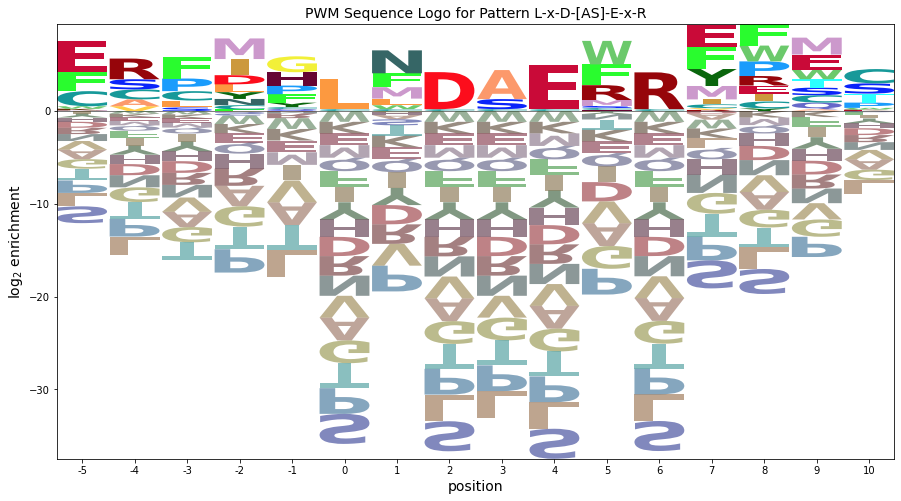

Information Content Matrix


Amino Acid,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
Position,,,,,,,,,,,,,,,,,,,,
0,0.000000,0.0,0.000000,2.738357,1.369178,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,0.296401,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.741003,0.741003,0.000000,0.222301,0.000000,0.000000
2,0.000000,0.0,0.000000,0.000000,0.514310,0.000000,0.000000,0.000000,0.0,0.385732,0.000000,0.000000,0.578598,0.000000,0.000000,0.385732,0.000000,0.000000,0.000000,0.000000
3,0.000000,0.0,0.144811,0.000000,0.048270,0.000000,0.000000,0.193081,0.0,0.241352,0.217217,0.120676,0.000000,0.000000,0.000000,0.120676,0.000000,0.072406,0.000000,0.096541
4,0.000000,0.0,0.049013,0.000000,0.081689,0.277741,0.147039,0.000000,0.0,0.000000,0.000000,0.049013,0.196053,0.032675,0.032675,0.147039,0.000000,0.000000,0.000000,0.065351
5,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,3.554866,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
6,0.062349,0.0,0.000000,0.000000,0.166264,0.083132,0.041566,0.000000,0.0,0.228613,0.103915,0.498792,0.000000,0.000000,0.000000,0.103915,0.041566,0.000000,0.041566,0.000000
7,0.000000,0.0,4.348314,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,2.049739,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.828618,0.000000,0.000000,0.000000,0.000000


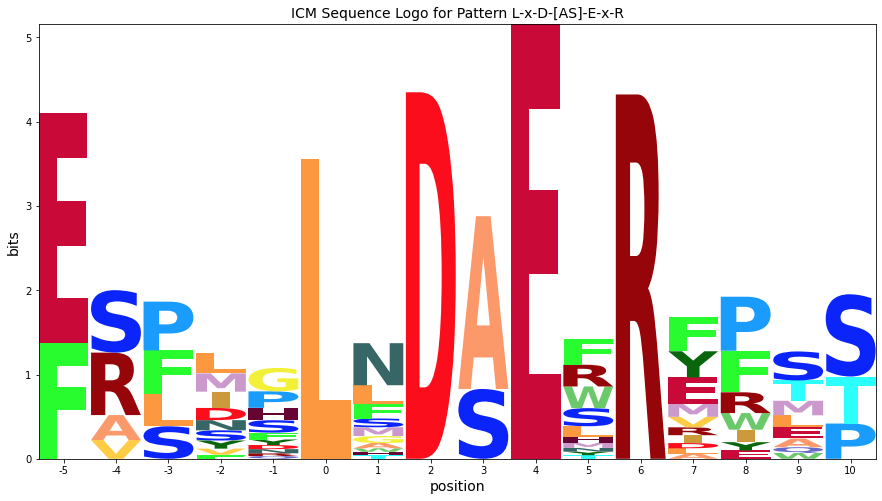

X^2 Critical Value = 40.15223303520055
Chi Square Tests


,index,Position,X^2,p-value,Critical pBH,Critical pBY,AAmax,PWMSmax,AAmin,PWMSmin
0,9,4,2292.8437499999995,0.000000e+00,0.003125,0.000924,E,4.79929445856592,S,-3.238599525325617
1,7,2,1278.3642987249546,1.526585e-259,0.006250,0.001849,D,3.9881387367557064,S,-3.238599525325618
2,11,6,1254.5510824834496,1.929267e-254,0.009375,0.002773,R,3.962354710985474,S,-3.238599525325617
3,5,0,709.6491277236742,3.240805e-138,0.012500,0.003697,L,3.194690689295223,S,-3.238599525325617
4,8,3,508.0957776093344,1.117614e-95,0.015625,0.004622,A,3.12805128687806,L,-2.871398501162549
5,0,-5,214.70518850048046,3.963777e-35,0.018750,0.005546,E,3.329395024252558,S,-1.812334770623519
6,6,1,174.7918051920628,3.268608e-27,0.021875,0.006470,N,2.470116215769892,P,-2.7733998474601065
7,10,5,173.2036020015919,6.698215e-27,0.025000,0.007395,W,2.5370098449463314,P,-2.7733998474601065
8,12,7,173.0492476804457,7.181687e-27,0.028125,0.008319,E,2.4094482758185936,S,-3.0217881362524683
9,13,8,125.77844197931172,9.135031e-18,0.031250,0.009244,F,2.335340353338759,S,-2.69497781998536


In [14]:
begin_parse = False
pattern = ''

with open('SOL1A.txt.15.pat', 'r') as f:
  while True:
    line = f.readline().strip()

    # Stop reading the file
    if line == 'PATTERN MATCHES:':
      break

    if begin_parse:
      tokens = line.split() # Split line into array of tokens
      if len(tokens) >= 5:
        # Process each array (line of file)
        if len(tokens[0]) == 1:
          pattern = tokens[5]
          print('-' * 70)
          print('{} Pattern: {}'.format(tokens[0], pattern))
        elif len(tokens) >= 6:
          if tokens[0].startswith('Abeta'):
            continue
          else:
            label = tokens[0].split('_')
            last_num = label[len(label) - 1]
            obs_freq.append(int(last_num))
          if len(tokens) == 6:
            if tokens[4][:1].isupper():
              pattern_seq = tokens[4]
              flank2 = tokens[5]
              flank1_seq_list.append('')
              pf2_seq_list.append(pattern_seq + flank2)
            else:
              flank1 = tokens[4]
              pattern_seq = tokens[5]
              flank1_seq_list.append(flank1)
              pf2_seq_list.append(pattern_seq + '')
          elif len(tokens) == 7:
            flank1 = tokens[4]
            pattern_seq = tokens[5]
            flank2 = tokens[6]
            flank1_seq_list.append(flank1)
            pf2_seq_list.append(pattern_seq + flank2)
      # Reached end of a pattern block
      elif len(tokens) == 0 and len(flank1_seq_list) != 0:
        # Begin frequency analysis for pattern block
        padded1 = pad_sequence(flank1_seq_list, 'left')
        padded2 = pad_sequence(pf2_seq_list, 'right')
        combined_sequences = [x + padded2[i] for (i, x) in enumerate(padded1)]
        freq = frequency_matrix(combined_sequences)
        prob = probability_matrix(freq, 0)
        display_matrix(prob, 'Position Probability Matrix')
        prob_pseudo = probability_matrix(freq)
        weight = weight_matrix(prob_pseudo)
        display_matrix(weight, 'Position Weight Matrix')
        display_sequence_logo(weight, 'PWM', pattern)
        info = info_content_matrix(prob)
        display_matrix(info, 'Information Content Matrix')
        display_sequence_logo(info, 'ICM', pattern)
        chi_square_test(freq)
        # Clear data structures for next pattern block
        x_axis.clear()
        obs_freq.clear()
        flank1_seq_list.clear()
        pf2_seq_list.clear()
        
    # Start processing lines after this line is reached
    if line == 'Best patterns with alignments:':
      f.readline()
      begin_parse = True